# Visão Computacional e Deep Learning para Sensoriamento Remoto com Python


#Capítulo 21 - Detecção de Palmeiras em Imagens de Satélites de Alta Resolução com a YOLOv7

## YOLOv6

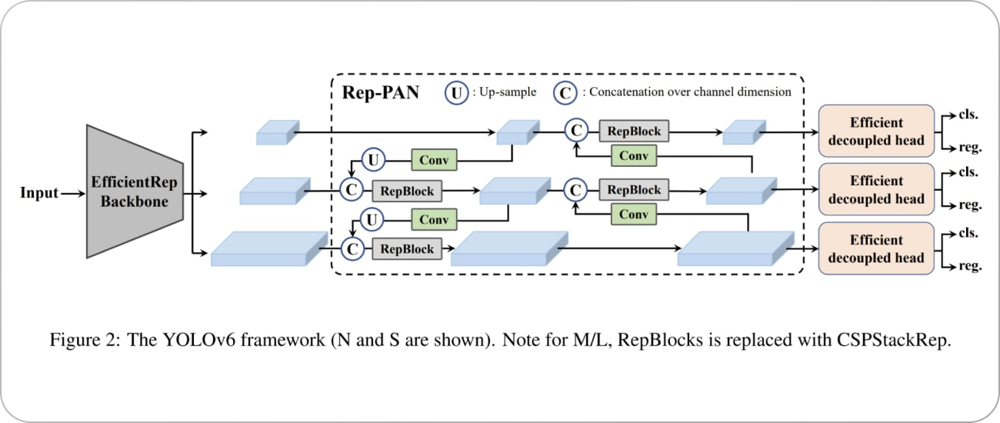

### O que há de novo no YOLOv6?

A intenção original desta nova versão vem de resolver os problemas práticos encontrados ao lidar com aplicações industriais. MT-YOLOv6 é uma estrutura de detecção de alvo desenvolvida pelo Departamento de Inteligência Visual da Meituan (plataforma de compras chinesa).

Observe que MT-YOLOv6 não faz parte da série oficial YOLO e foi chamado de YOLOv6 porque foi inspirado em algoritmos YOLO de um estágio e, portanto, está sendo promovido como a próxima versão dos modelos YOLO pelos autores.

É uma estrutura de detecção de objetos de estágio único focada principalmente em aplicações industriais, com design eficiente de hardware e melhor desempenho do que YOLOv5 em precisão de detecção e velocidade de inferência. Isso o torna a melhor versão de sistema operacional dos algoritmos YOLO para produção.

### Novas melhorias

Fora isso, o YOLOv6 foi aprimorado adicionando melhorias de versões anteriores do YOLO, mais especificamente incluindo -

- Paradigma sem âncora: apresenta uma melhoria de 51% na velocidade em comparação com detectores baseados em âncora.
- Estratégia de atribuição de rótulos SimOTA: alocar dinamicamente amostras positivas para melhorar ainda mais a precisão da detecção.
- Perda de regressão da caixa delimitadora SIoU: para supervisionar o aprendizado da rede.

### Melhorias na arquitetura da YOLOv6

Com cada iteração do modelo YOLO, o objetivo tem sido o mesmo: aprender como prever caixas delimitadoras em torno de objetos selecionados com precisão, mantendo o tempo de inferência em velocidades em tempo real. Quanto melhor o modelo, menos hardware será necessário para treiná-lo e implantá-lo.

Os modelos YOLO pegam uma imagem de entrada e a passam por uma série de camadas convolucionais no backbone. Os modelos YOLO então alimentam esses recursos de espinha dorsal através do pescoço. Os modelos YOLO então passam os recursos do pescoço para três cabeças, onde prevêem objetividade, classe e regressão de caixa.

O YOLOv6 itera no backbone e no Neck do YOLO, redesenhando-os com o hardware em mente. O modelo apresenta o que os autores chamam de EfficientRep Backbone e Rep-PAN Neck.

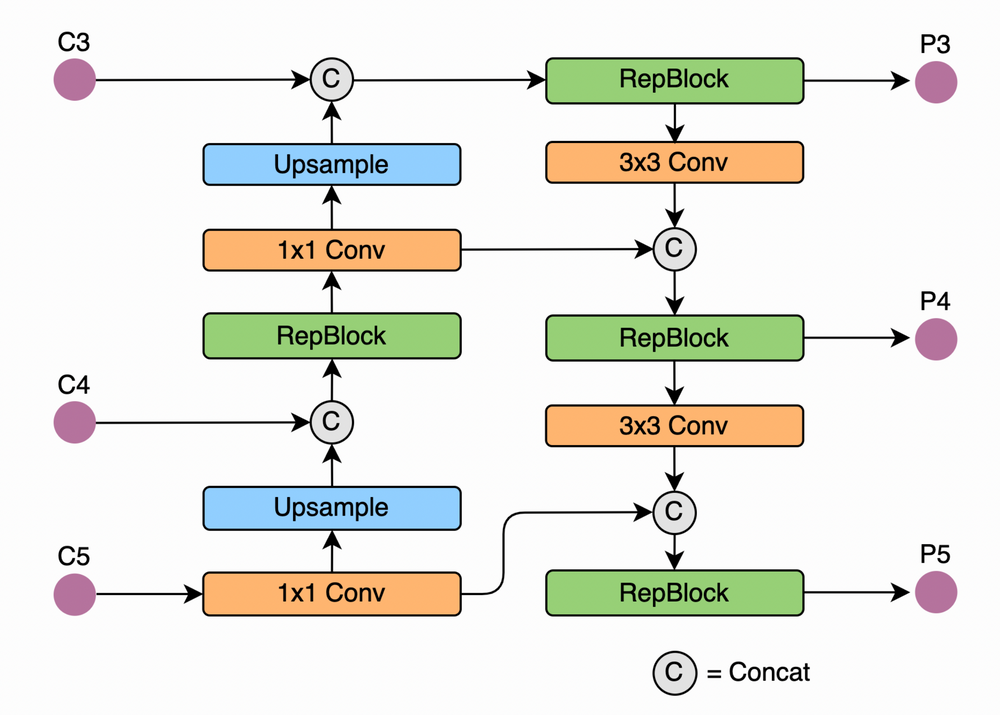

Nos modelos YOLO até YOLOv5 inclusive, os cabeçotes de classificação e regressão de caixa compartilham os mesmos recursos. No YOLOx e no YOLOv6, a cabeça é desacoplada. Isso significa que a rede possui camadas adicionais que separam esses recursos do cabeçote final. Foi demonstrado empiricamente que essa mudança aumenta o desempenho do modelo.

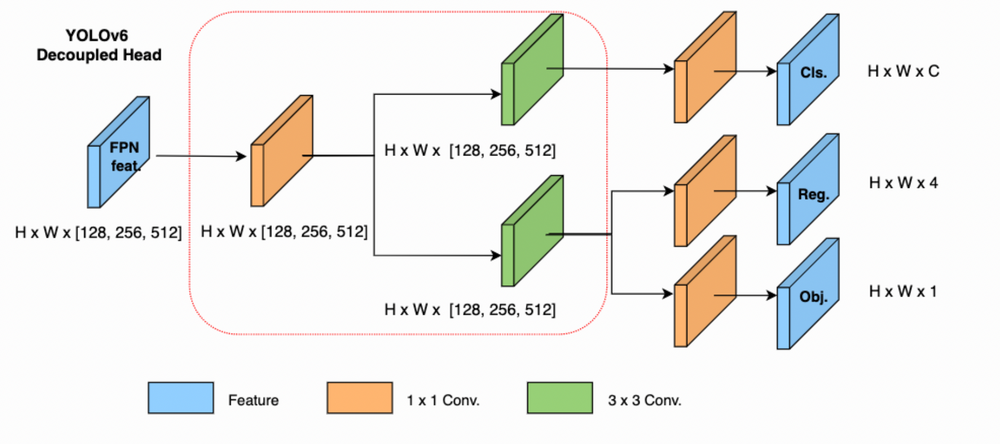

## YOLOv7

O modelo YOLO (You Only Look Once) v7 é um dos mais recentes da família de modelos YOLO. Os modelos YOLO são detectores de objetos de estágio único. Em um modelo YOLO, os quadros de imagem são caracterizados por meio de um backbone. Esses recursos são combinados e misturados no pescoço e, em seguida, são passados para o chefe da rede. YOLO prevê os locais e as classes de objetos em torno dos quais as caixas delimitadoras devem ser desenhadas.

O YOLO realiza um pós-processamento via supressão não máxima (NMS) para chegar à sua previsão final.

Os autores do YOLOv7 buscaram definir o estado da arte na detecção de objetos, criando uma arquitetura de rede que preveria caixas delimitadoras com mais precisão do que seus pares em velocidades de inferência semelhantes. Para alcançar esses resultados, os autores do YOLOv7 fizeram várias alterações na rede YOLO e nas rotinas de treinamento.

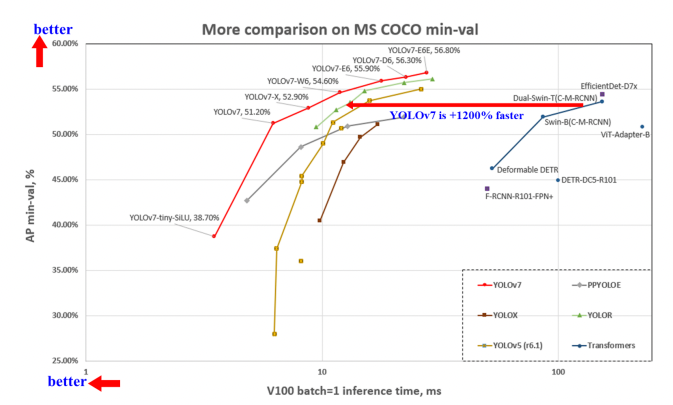

### Arquitetura YOLOv7

A arquitetura YOLOv7 é baseada em arquiteturas de modelo YOLO anteriores, nomeadamente YOLOv4, Scaled YOLOv4 e YOLO-R. A seguir, forneceremos uma visão geral de alto nível dos aspectos mais importantes detalhados no artigo YOLOv7.

### Extended Efficient Layer Aggregation Network (E-ELAN)

O bloco computacional no backbone YOLOv7 é denominado E-ELAN, que significa Extended Efficient Layer Aggregation Network. A arquitetura E-ELAN do YOLOv7 permite que o modelo aprenda melhor usando “expandir, embaralhar, mesclar cardinalidade” para alcançar a capacidade de melhorar continuamente a capacidade de aprendizagem da rede sem destruir o caminho do gradiente original

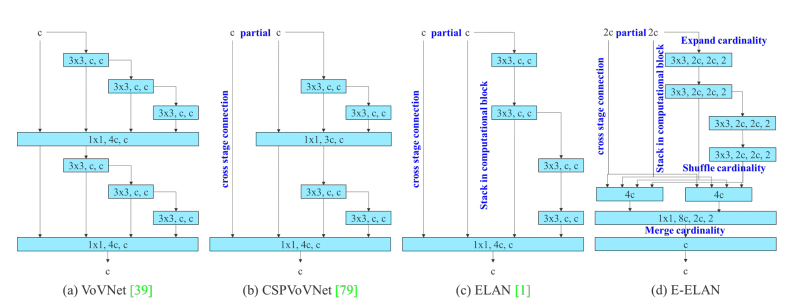

### Dimensionamento do modelo composto YOLOv7

O principal objetivo do escalonamento do modelo é ajustar os principais atributos do modelo para gerar modelos que atendam às necessidades de diferentes requisitos de aplicação. Por exemplo, o dimensionamento do modelo pode otimizar a largura do modelo (número de canais), a profundidade (número de estágios) e a resolução (tamanho da imagem de entrada). Nas abordagens tradicionais com arquiteturas baseadas em concatenação (por exemplo, ResNet ou PlainNet), diferentes fatores de escala não podem ser analisados de forma independente e devem ser considerados em conjunto. Por exemplo, aumentar a profundidade do modelo causará uma mudança na proporção entre o canal de entrada e o canal de saída de uma camada de transição, o que por sua vez pode levar a uma diminuição no uso de hardware do modelo. É por isso que YOLOv7 introduz escalonamento de modelo composto para um modelo baseado em concatenação. O método de escala composta permite manter as propriedades que o modelo tinha no projeto inicial e assim manter a estrutura ideal. E é assim que funciona o dimensionamento de modelo composto: por exemplo, dimensionar o fator de profundidade de um bloco computacional também requer uma mudança no canal de saída desse bloco. Em seguida, o escalonamento do fator de largura é realizado com o mesmo nível de alteração nas camadas de transição.

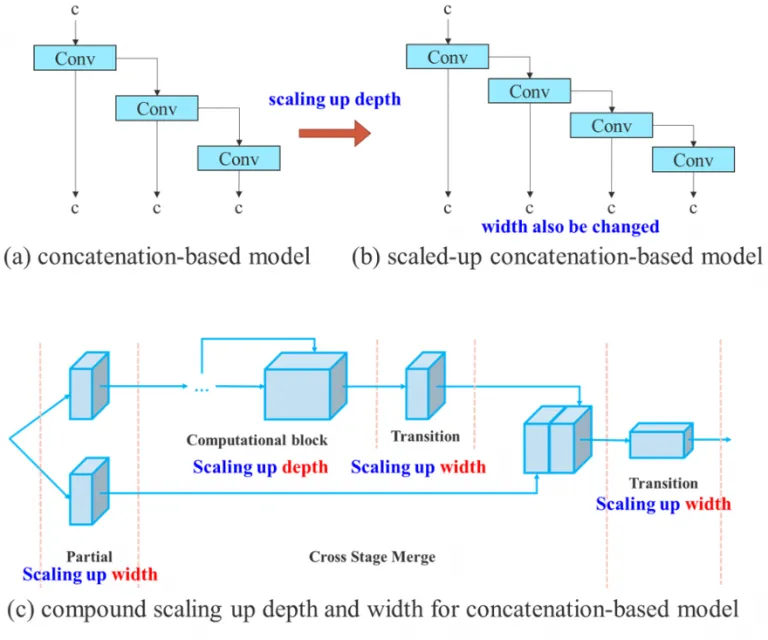

### Convolução re-parametrizada planejada

Embora RepConv tenha alcançado ótimo desempenho em arquiteturas VGG, a aplicação direta em ResNet ou DenseNet leva a uma perda significativa de precisão. No YOLOv7, a arquitetura de convolução re-parametrizada planejada usa RepConv sem conexão de identidade (RepConvN). A ideia é evitar que haja uma conexão de identidade quando uma camada convolucional com resíduo ou concatenação é substituída por convolução parametrizada novamente.

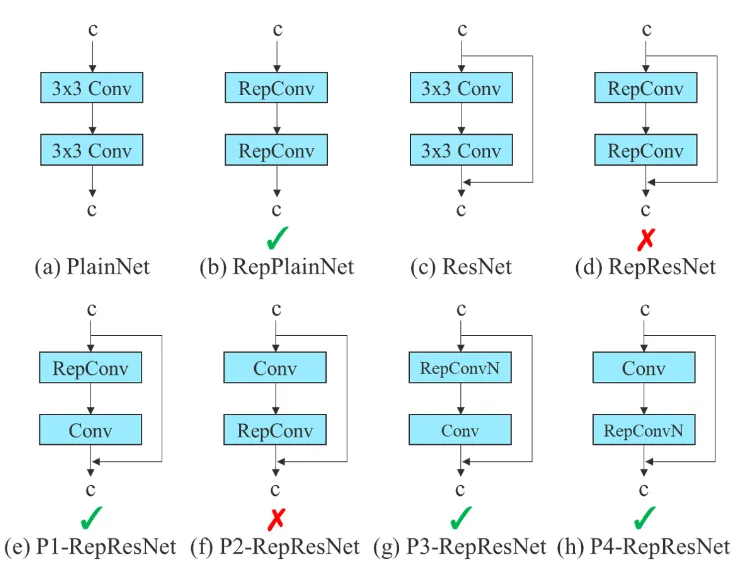

### Auxiliary Head Coarse-to-Fine

Uma arquitetura YOLO contém uma espinha dorsal, um pescoço e uma cabeça. O cabeçalho contém as saídas previstas do modelo. Inspirado na Deep Supervision, uma técnica frequentemente usada no treinamento de redes neurais profundas, o YOLOv7 não se limita a uma única cabeça. A cabeça responsável pelo resultado final é chamado de cabeça líder, e a cabeça usada para auxiliar o treinamento nas camadas intermediárias é chamado de cabeça auxiliar. Além disso, e para aprimorar o treinamento profundo da rede, foi introduzido um mecanismo Label Assigner que considera os resultados da previsão da rede juntamente com a verdade básica e, em seguida, atribui rótulos flexíveis. Em comparação com a atribuição de rótulo tradicional que se refere diretamente à verdade básica para gerar rótulos rígidos com base em determinadas regras, os rótulos flexíveis confiáveis usam métodos de cálculo e otimização que também consideram a qualidade e a distribuição da saída da previsão junto com a verdade básica.

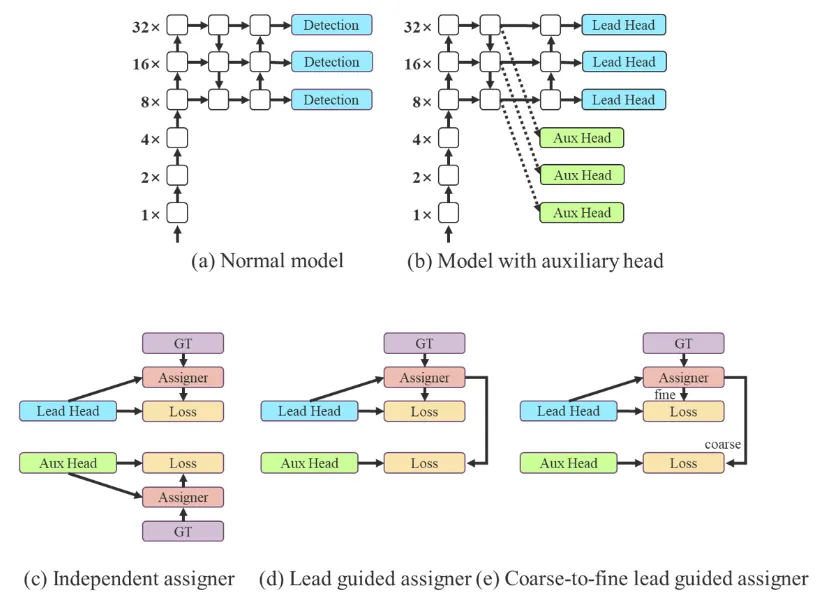

## Implementação da YOLOv7

Aqui o dataset já está preparado, com as imagens e suas respectivas anotações em formato .xml em uma unica pasta:

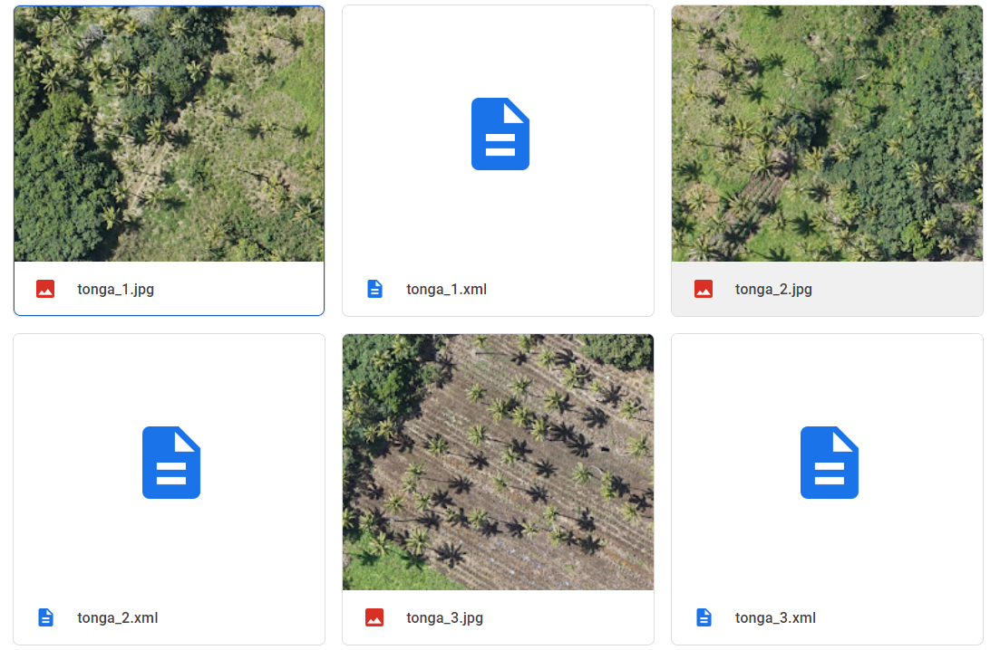

## Implementando

Primeiro vamos instalar algumas bilbiotecas, importá-las e conectar com o Google Drive:

In [ ]:
!pip install rasterio
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 20.9 MB 15.2 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 14.2 MB/s 
     |████████████████████████████████| 16.6 MB 18.8 MB/s 
     |████████████████████████████████| 7.8 MB 36.2 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rasterio
import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt
import cv2
from rasterio.features import rasterize
from rasterio.windows import Window
from rasterio.plot import show
import os
from shapely.geometry import box
from shapely.ops import unary_union
import json
from shapely.geometry import shape
from shapely.geometry import Polygon
from shapely.geometry import MultiPolygon
from shapely.ops import unary_union
import shapely
import math
import pandas as pd
from skimage import io
from skimage.io import imsave
from sklearn import model_selection
import os
import shutil
import json
import ast
import numpy as np
from tqdm import tqdm
import pandas as  pd
import seaborn as sns
import fastai.vision as vision
import xml.etree.ElementTree as ET
import glob

Temos três bases de dados. Vamos importar separamente e depois concatenamos:

In [ ]:
path_tonga = '/content/drive/MyDrive/Datasets/Mastertheis/MasterThesis-master/Tonga/images/train'
path_nicaragua = '/content/drive/MyDrive/Datasets/Mastertheis/MasterThesis-master/Nicaragua/images/train'
path_zanzibar = '/content/drive/MyDrive/Datasets/Mastertheis/MasterThesis-master/Zanzibar/images/train'

Iniciamos importando os dados de Tonga:

In [ ]:
xml_files_tonga = [f for f in os.listdir(path_tonga) if f.endswith('xml')]

In [ ]:
xml_list_tonga = []
for xml_file in xml_files_tonga:
  tree = ET.parse(os.path.join(path_tonga,xml_file))
  root = tree.getroot()
  for member in root.findall('object'):
    value = (root.find('filename').text,
              int(root.find('size')[0].text),
              int(root.find('size')[1].text),
              member[0].text,
              int(member[4][0].text),
              int(member[4][1].text),
              int(member[4][2].text),
              int(member[4][3].text)
              )
    xml_list_tonga.append(value)
column_name = ['filename', 'width', 'height', 'classname', 'xmin', 'ymin', 'xmax', 'ymax']
xml_df_tonga = pd.DataFrame(xml_list_tonga, columns=column_name)

In [ ]:
xml_df_tonga

,filename,width,height,classname,xmin,ymin,xmax,ymax
0,tonga_368.jpg,1000,1000,Palm,19,51,100,135
1,tonga_368.jpg,1000,1000,Palm,236,46,315,122
2,tonga_368.jpg,1000,1000,Palm,739,11,814,89
3,tonga_368.jpg,1000,1000,Palm,568,514,618,573
4,tonga_368.jpg,1000,1000,Palm,198,879,255,941
...,...,...,...,...,...,...,...,...
6280,tonga_23.jpg,1000,1000,Palm,540,719,626,797
6281,tonga_23.jpg,1000,1000,Palm,572,894,642,971
6282,tonga_23.jpg,1000,1000,Palm,786,856,852,931
6283,tonga_23.jpg,1000,1000,Palm,693,757,770,833


In [ ]:
list_of_image_tonga = [f for f in os.listdir(path_tonga) if f.endswith('jpg')]

Vamos plotar um exemplo:

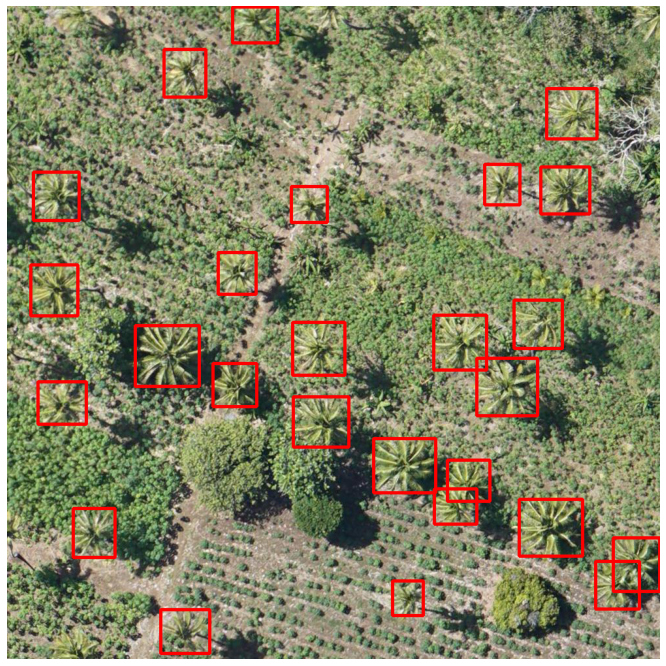

In [ ]:
i = 3
img = io.imread(os.path.join(path_tonga,list_of_image_tonga[i]))
detec = xml_df_tonga[xml_df_tonga['filename'] == list_of_image_tonga[i]]
for i, row in detec.iterrows():
  color = (255,0,0)
  cv2.rectangle(img, (max(0, row['xmin']), max(0, row['ymin']) , max(0, row['xmax'] - row['xmin']), max(0, row['ymax'] - row['ymin'])), color, 3)
plt.figure(figsize=(12,12))
plt.imshow(img)
plt.axis('off')
plt.show()

Agora importamos a base de dados da Nicarágua:

In [ ]:
xml_files_nicaragua = [f for f in os.listdir(path_nicaragua) if f.endswith('xml')]

In [ ]:
xml_list_nicaragua = []
for xml_file in xml_files_nicaragua:
  tree = ET.parse(os.path.join(path_nicaragua,xml_file))
  root = tree.getroot()
  for member in root.findall('object'):
    value = (root.find('filename').text,
              int(root.find('size')[0].text),
              int(root.find('size')[1].text),
              member[0].text,
              int(member[4][0].text),
              int(member[4][1].text),
              int(member[4][2].text),
              int(member[4][3].text)
              )
    xml_list_nicaragua.append(value)
column_name = ['filename', 'width', 'height', 'classname', 'xmin', 'ymin', 'xmax', 'ymax']
xml_df_nicaragua = pd.DataFrame(xml_list_nicaragua, columns=column_name)

In [ ]:
xml_df_nicaragua

,filename,width,height,classname,xmin,ymin,xmax,ymax
0,IMG_2371_1.jpg,1000,1000,Palm,794,884,880,961
1,IMG_2371_1.jpg,1000,1000,Palm,684,874,779,964
2,IMG_2371_1.jpg,1000,1000,Palm,580,872,679,963
3,IMG_2371_1.jpg,1000,1000,Palm,492,867,585,958
4,IMG_2371_1.jpg,1000,1000,Palm,400,866,498,958
...,...,...,...,...,...,...,...,...
1991,IMG_2378_8.jpg,1000,1000,Palm,856,390,933,464
1992,IMG_2378_8.jpg,1000,1000,Palm,752,363,837,430
1993,IMG_2378_8.jpg,1000,1000,Palm,777,419,857,493
1994,IMG_2378_8.jpg,1000,1000,Palm,594,476,669,547


In [ ]:
list_of_image_nicaragua = [f for f in os.listdir(path_nicaragua) if f.endswith('jpg')]

Também plotamos um exemplo para ver as variações que existem entre os locais:

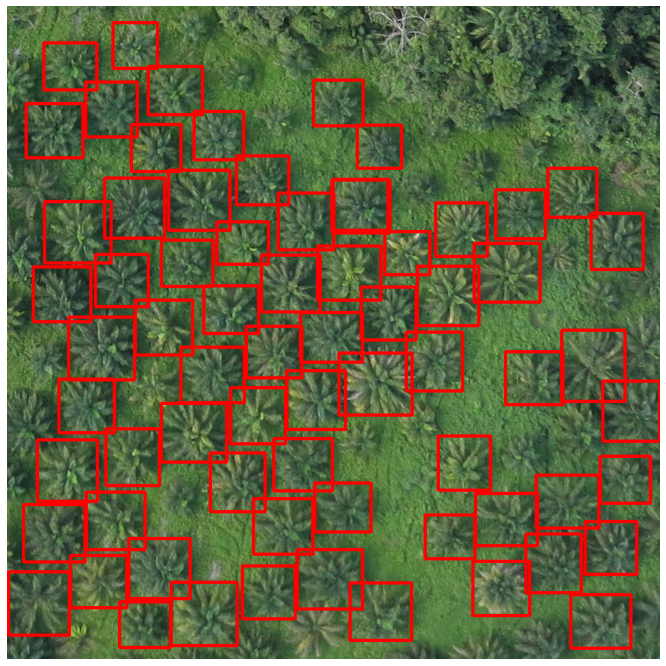

In [ ]:
i = 3
img = io.imread(os.path.join(path_nicaragua,list_of_image_nicaragua[i]))
detec = xml_df_nicaragua[xml_df_nicaragua['filename'] == list_of_image_nicaragua[i]]
for i, row in detec.iterrows():
  color = (255,0,0)
  cv2.rectangle(img, (max(0, row['xmin']), max(0, row['ymin']) , max(0, row['xmax'] - row['xmin']), max(0, row['ymax'] - row['ymin'])), color, 3)
plt.figure(figsize=(12,12))
plt.imshow(img)
plt.axis('off')
plt.show()

Por fim, importamos a base de Zanzibar:

In [ ]:
xml_files_zanzibar = [f for f in os.listdir(path_zanzibar) if f.endswith('xml')]

In [ ]:
xml_list_zanzibar = []
for xml_file in xml_files_zanzibar:
  tree = ET.parse(os.path.join(path_zanzibar,xml_file))
  root = tree.getroot()
  for member in root.findall('object'):
    value = (root.find('filename').text,
              int(root.find('size')[0].text),
              int(root.find('size')[1].text),
              member[0].text,
              int(member[4][0].text),
              int(member[4][1].text),
              int(member[4][2].text),
              int(member[4][3].text)
              )
    xml_list_zanzibar.append(value)
column_name = ['filename', 'width', 'height', 'classname', 'xmin', 'ymin', 'xmax', 'ymax']
xml_df_zanzibar = pd.DataFrame(xml_list_zanzibar, columns=column_name)

In [ ]:
xml_df_zanzibar

,filename,width,height,classname,xmin,ymin,xmax,ymax
0,zanzibar2_830.jpg,1000,1000,Palm,83,9,161,106
1,zanzibar2_830.jpg,1000,1000,Palm,217,38,314,139
2,zanzibar2_830.jpg,1000,1000,Palm,129,151,221,248
3,zanzibar2_830.jpg,1000,1000,Palm,65,238,162,332
4,zanzibar2_830.jpg,1000,1000,Palm,27,327,114,414
...,...,...,...,...,...,...,...,...
7153,zanzibar2_108.jpg,1000,1000,Palm,874,636,924,692
7154,zanzibar2_108.jpg,1000,1000,Palm,648,199,757,298
7155,zanzibar2_108.jpg,1000,1000,Palm,769,345,841,416
7156,zanzibar2_108.jpg,1000,1000,Palm,460,457,541,539


In [ ]:
list_of_image_zanzibar = [f for f in os.listdir(path_zanzibar) if f.endswith('jpg')]

Plotamos um exemplo:

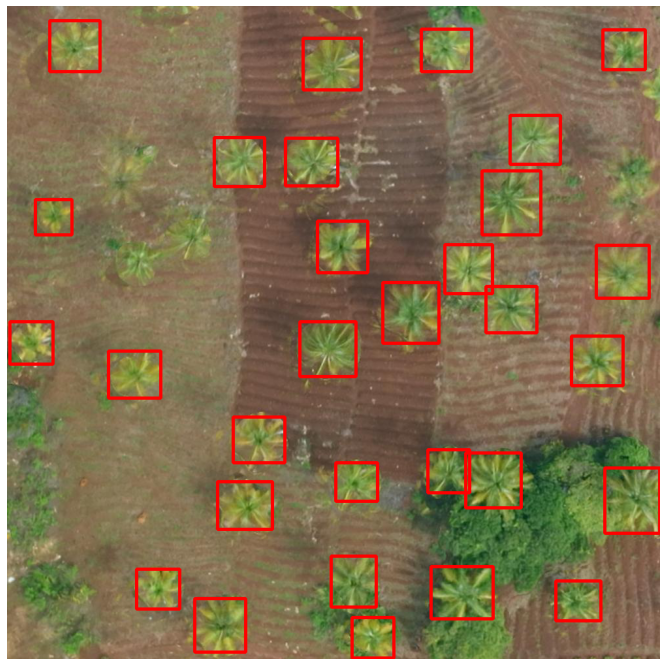

In [ ]:
i = 3
img = io.imread(os.path.join(path_zanzibar,list_of_image_zanzibar[i]))
detec = xml_df_zanzibar[xml_df_zanzibar['filename'] == list_of_image_zanzibar[i]]
for i, row in detec.iterrows():
  color = (255,0,0)
  cv2.rectangle(img, (max(0, row['xmin']), max(0, row['ymin']) , max(0, row['xmax'] - row['xmin']), max(0, row['ymax'] - row['ymin'])), color, 3)
plt.figure(figsize=(12,12))
plt.imshow(img)
plt.axis('off')
plt.show()

Agora importamos as bases de validação para estas três localidades:

In [ ]:
path_tonga_val = '/content/drive/MyDrive/Datasets/Mastertheis/MasterThesis-master/Tonga/images/validation'
path_nicaragua_val = '/content/drive/MyDrive/Datasets/Mastertheis/MasterThesis-master/Nicaragua/images/validation'
path_zanzibar_val = '/content/drive/MyDrive/Datasets/Mastertheis/MasterThesis-master/Zanzibar/images/validation'

In [ ]:
xml_files_tonga_val = [f for f in os.listdir(path_tonga_val) if f.endswith('xml')]
list_of_image_tonga_val = [f for f in os.listdir(path_tonga_val) if f.endswith('jpg')]
xml_list_tonga_val = []
for xml_file in xml_files_tonga_val:
  tree = ET.parse(os.path.join(path_tonga_val,xml_file))
  root = tree.getroot()
  for member in root.findall('object'):
    value = (root.find('filename').text,
              int(root.find('size')[0].text),
              int(root.find('size')[1].text),
              member[0].text,
              int(member[4][0].text),
              int(member[4][1].text),
              int(member[4][2].text),
              int(member[4][3].text)
              )
    xml_list_tonga_val.append(value)
column_name = ['filename', 'width', 'height', 'classname', 'xmin', 'ymin', 'xmax', 'ymax']
xml_df_tonga_val = pd.DataFrame(xml_list_tonga_val, columns=column_name)
xml_df_tonga_val

,filename,width,height,classname,xmin,ymin,xmax,ymax
0,tonga_170.jpg,1000,1000,Palm,4,224,79,309
1,tonga_170.jpg,1000,1000,Palm,63,298,122,371
2,tonga_170.jpg,1000,1000,Palm,141,272,213,350
3,tonga_170.jpg,1000,1000,Palm,58,452,118,517
4,tonga_170.jpg,1000,1000,Palm,178,430,243,505
...,...,...,...,...,...,...,...,...
2738,tonga_115.jpg,1000,1000,Palm,313,751,390,828
2739,tonga_115.jpg,1000,1000,Palm,503,719,570,789
2740,tonga_115.jpg,1000,1000,Palm,302,855,370,927
2741,tonga_115.jpg,1000,1000,Palm,267,921,352,995


In [ ]:
xml_files_nicaragua_val = [f for f in os.listdir(path_nicaragua_val) if f.endswith('xml')]
list_of_image_nicaragua_val = [f for f in os.listdir(path_nicaragua_val) if f.endswith('jpg')]
xml_list_nicaragua_val = []
for xml_file in xml_files_nicaragua_val:
  tree = ET.parse(os.path.join(path_nicaragua_val,xml_file))
  root = tree.getroot()
  for member in root.findall('object'):
    value = (root.find('filename').text,
              int(root.find('size')[0].text),
              int(root.find('size')[1].text),
              member[0].text,
              int(member[4][0].text),
              int(member[4][1].text),
              int(member[4][2].text),
              int(member[4][3].text)
              )
    xml_list_nicaragua_val.append(value)
column_name = ['filename', 'width', 'height', 'classname', 'xmin', 'ymin', 'xmax', 'ymax']
xml_df_nicaragua_val = pd.DataFrame(xml_list_nicaragua_val, columns=column_name)
xml_df_nicaragua_val

,filename,width,height,classname,xmin,ymin,xmax,ymax
0,IMG_2361_9.jpg,1000,1000,Palm,733,10,815,94
1,IMG_2361_9.jpg,1000,1000,Palm,803,89,895,178
2,IMG_2361_9.jpg,1000,1000,Palm,889,79,985,167
3,IMG_2361_9.jpg,1000,1000,Palm,866,178,946,249
4,IMG_2361_9.jpg,1000,1000,Palm,757,169,846,260
...,...,...,...,...,...,...,...,...
760,IMG_2395_10.jpg,1000,1000,Palm,817,561,903,644
761,IMG_2395_10.jpg,1000,1000,Palm,747,483,844,580
762,IMG_2395_10.jpg,1000,1000,Palm,840,454,937,547
763,IMG_2395_10.jpg,1000,1000,Palm,780,406,857,471


In [ ]:
xml_files_zanzibar_val = [f for f in os.listdir(path_zanzibar_val) if f.endswith('xml')]
list_of_image_zanzibar_val = [f for f in os.listdir(path_zanzibar_val) if f.endswith('jpg')]
xml_list_zanzibar_val = []
for xml_file in xml_files_zanzibar_val:
  tree = ET.parse(os.path.join(path_zanzibar_val,xml_file))
  root = tree.getroot()
  for member in root.findall('object'):
    value = (root.find('filename').text,
              int(root.find('size')[0].text),
              int(root.find('size')[1].text),
              member[0].text,
              int(member[4][0].text),
              int(member[4][1].text),
              int(member[4][2].text),
              int(member[4][3].text)
              )
    xml_list_zanzibar_val.append(value)
column_name = ['filename', 'width', 'height', 'classname', 'xmin', 'ymin', 'xmax', 'ymax']
xml_df_zanzibar_val = pd.DataFrame(xml_list_zanzibar_val, columns=column_name)
xml_df_zanzibar_val

,filename,width,height,classname,xmin,ymin,xmax,ymax
0,zanzibar1_6.jpg,1000,1000,Palm,391,22,494,114
1,zanzibar1_6.jpg,1000,1000,Palm,613,1,702,71
2,zanzibar1_6.jpg,1000,1000,Palm,891,8,992,109
3,zanzibar1_6.jpg,1000,1000,Palm,904,97,998,205
4,zanzibar1_6.jpg,1000,1000,Palm,829,97,917,193
...,...,...,...,...,...,...,...,...
3051,zanzibar2_996.jpg,1000,1000,Palm,921,499,1000,582
3052,zanzibar2_996.jpg,1000,1000,Palm,794,623,899,724
3053,zanzibar2_996.jpg,1000,1000,Palm,654,640,767,749
3054,zanzibar2_996.jpg,1000,1000,Palm,7,834,107,929


Após a importação, concatenamos os dados de treinamento e os dados de validação das três localidades:

In [ ]:
train_df = pd.concat([xml_df_tonga, xml_df_nicaragua,xml_df_zanzibar], axis=0)
valid_df = pd.concat([xml_df_tonga_val, xml_df_nicaragua_val,xml_df_zanzibar_val], axis=0)

Adicionamos o id da classe que temos em nosso dataset:

In [ ]:
train_df['class'] = 0
valid_df['class'] = 0

Agora vamos copiar as imagens que estão no Drive para pastas no Content do Colab:

In [ ]:
path_data_train = 'train'
path_data_valid = 'validation'

if not os.path.isdir(path_data_train):
    os.mkdir(path_data_train)
if not os.path.isdir(path_data_valid):
    os.mkdir(path_data_valid)

In [ ]:
for images in list_of_image_tonga:
  img = io.imread(os.path.join(path_tonga,images))
  imsave(os.path.join(path_data_train,images.split('.')[0] + '.jpg'), img)

In [ ]:
for images in list_of_image_nicaragua:
  img = io.imread(os.path.join(path_nicaragua,images))
  imsave(os.path.join(path_data_train,images.split('.')[0] + '.jpg'), img)

In [ ]:
for images in list_of_image_zanzibar:
  img = io.imread(os.path.join(path_zanzibar,images))
  imsave(os.path.join(path_data_train,images.split('.')[0] + '.jpg'), img)

In [ ]:
for images in list_of_image_tonga_val:
  img = io.imread(os.path.join(path_tonga_val,images))
  imsave(os.path.join(path_data_valid,images.split('.')[0] + '.jpg'), img)

In [ ]:
for images in list_of_image_nicaragua_val:
  img = io.imread(os.path.join(path_nicaragua_val,images))
  imsave(os.path.join(path_data_valid,images.split('.')[0] + '.jpg'), img)

In [ ]:
for images in list_of_image_zanzibar_val:
  img = io.imread(os.path.join(path_zanzibar_val,images))
  imsave(os.path.join(path_data_valid,images.split('.')[0] + '.jpg'), img)

A partir das colunas de xmin, ymin, xmax e ymax, vamos obter os bounds:

In [ ]:
def getBounds(df):
    try:
        xmin = df['xmin']
        ymin = df['ymin']
        xmax = df['xmax']
        ymax = df['ymax']
        return (xmin, ymin, xmax, ymax)
    except:
        return np.nan

def getWidth(bounds):
    try:
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(xmax - xmin)
    except:
        return np.nan

def getHeight(bounds):
    try:
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(ymax - ymin)
    except:
        return np.nan

In [ ]:
train_df['bounds'] = train_df.apply(getBounds, axis=1)
train_df.loc[:,'width'] = train_df.loc[:,'bounds'].apply(getWidth)
train_df.loc[:,'height'] = train_df.loc[:,'bounds'].apply(getHeight)
train_df.head(10)

,filename,width,height,classname,xmin,ymin,xmax,ymax,class,bounds
0,tonga_368.jpg,81,84,Palm,19,51,100,135,0,"(19, 51, 100, 135)"
1,tonga_368.jpg,79,76,Palm,236,46,315,122,0,"(236, 46, 315, 122)"
2,tonga_368.jpg,75,78,Palm,739,11,814,89,0,"(739, 11, 814, 89)"
3,tonga_368.jpg,50,59,Palm,568,514,618,573,0,"(568, 514, 618, 573)"
4,tonga_368.jpg,57,62,Palm,198,879,255,941,0,"(198, 879, 255, 941)"
5,tonga_368.jpg,80,79,Palm,590,597,670,676,0,"(590, 597, 670, 676)"
6,tonga_368.jpg,57,55,Palm,639,658,696,713,0,"(639, 658, 696, 713)"
7,tonga_368.jpg,66,56,Palm,767,685,833,741,0,"(767, 685, 833, 741)"
8,tonga_368.jpg,77,82,Palm,798,584,875,666,0,"(798, 584, 875, 666)"
9,tonga_368.jpg,75,78,Palm,925,585,1000,663,0,"(925, 585, 1000, 663)"


In [ ]:
valid_df['bounds'] = valid_df.apply(getBounds, axis=1)
valid_df.loc[:,'width'] = valid_df.loc[:,'bounds'].apply(getWidth)
valid_df.loc[:,'height'] = valid_df.loc[:,'bounds'].apply(getHeight)
valid_df.head(10)

,filename,width,height,classname,xmin,ymin,xmax,ymax,class,bounds
0,tonga_170.jpg,75,85,Palm,4,224,79,309,0,"(4, 224, 79, 309)"
1,tonga_170.jpg,59,73,Palm,63,298,122,371,0,"(63, 298, 122, 371)"
2,tonga_170.jpg,72,78,Palm,141,272,213,350,0,"(141, 272, 213, 350)"
3,tonga_170.jpg,60,65,Palm,58,452,118,517,0,"(58, 452, 118, 517)"
4,tonga_170.jpg,65,75,Palm,178,430,243,505,0,"(178, 430, 243, 505)"
5,tonga_170.jpg,90,102,Palm,99,536,189,638,0,"(99, 536, 189, 638)"
6,tonga_170.jpg,82,90,Palm,8,676,90,766,0,"(8, 676, 90, 766)"
7,tonga_170.jpg,80,83,Palm,300,452,380,535,0,"(300, 452, 380, 535)"
8,tonga_170.jpg,59,69,Palm,213,736,272,805,0,"(213, 736, 272, 805)"
9,tonga_170.jpg,75,80,Palm,93,830,168,910,0,"(93, 830, 168, 910)"


Vamos salvar os dataframes de treinamento e validação em arquivos .csv:

In [ ]:
def convert(data, data_type):
    df = data.groupby('filename')['bounds'].apply(list).reset_index(name='bboxes')
    df['classes'] = data.groupby('filename')['class'].apply(list).reset_index(drop=True)
    df.to_csv(data_type + '.csv', index=False)
    print(data_type)
    print(df.shape)
    print(df.head())

df_train = convert(train_df, '/content/train')
df_valid = convert(valid_df, '/content/validation')

/content/train
(486, 3)
          filename                                             bboxes  \
0   IMG_2361_1.jpg  [(887, 1, 986, 84), (839, 84, 936, 177), (892,...   
1  IMG_2361_10.jpg  [(30, 2, 127, 93), (5, 91, 91, 177), (40, 168,...   
2  IMG_2361_11.jpg  [(907, 29, 983, 105), (804, 28, 894, 116), (84...   
3   IMG_2361_3.jpg  [(46, 67, 150, 165), (115, 163, 208, 248), (17...   
4   IMG_2361_4.jpg  [(48, 4, 144, 82), (7, 77, 100, 167), (153, 7,...   

                                             classes  
0  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
1  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
2  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
3  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
4  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
/content/validation
(206, 3)
          filename                                             bboxes  \
0  IMG_2361_12.jpg  [(18, 914, 99, 989), (66, 842, 149, 917), (15,...   
1   IMG_2361_2.jpg  [(37, 917, 1

Para treinar a YOLOv7 baixamos sua implementação do github e instalamos seus requerimentos:

In [ ]:
!git clone https://github.com/WongKinYiu/yolov7
%cd yolov7
!pip install -r requirements.txt

Cloning into 'yolov7'...
remote: Enumerating objects: 1094, done.
remote: Total 1094 (delta 0), reused 0 (delta 0), pack-reused 1094
Receiving objects: 100% (1094/1094), 69.89 MiB | 16.15 MiB/s, done.
Resolving deltas: 100% (516/516), done.
/content/yolov7
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 15.1 MB/s 


In [ ]:
!ls

cfg	detect.py  hubconf.py  models	  requirements.txt  tools	  utils
data	export.py  inference   paper	  scripts	    train_aux.py
deploy	figure	   LICENSE.md  README.md  test.py	    train.py


Dentro da pasta principal da yolov7 criamos uma pasta para receber as nossas imagens e anotações:

In [ ]:
!mkdir plant_data
%cd plant_data

/content/yolov7/plant_data


E dentro desta pasta criamos diretórios para imagens e para os labels:

In [ ]:
!mkdir images
!mkdir labels
%cd images
!mkdir train
!mkdir validation
%cd ..
%cd labels
!mkdir train
!mkdir validation
%cd ..
%cd ..
%cd ..

/content/yolov7/plant_data/images
/content/yolov7/plant_data
/content/yolov7/plant_data/labels
/content/yolov7/plant_data
/content/yolov7
/content


In [ ]:
for root,dir,_ in os.walk('yolov7/plant_data'):
    print(root)
    print(dir)

yolov7/plant_data
['images', 'labels']
yolov7/plant_data/images
['train', 'validation']
yolov7/plant_data/images/train
[]
yolov7/plant_data/images/validation
[]
yolov7/plant_data/labels
['train', 'validation']
yolov7/plant_data/labels/train
[]
yolov7/plant_data/labels/validation
[]


O proximo passo é copiar as imagens de treinamento e validação para seus respectivos diretórios na pasta que criamos. Também vamos abrir os arquivos .csv de treinamento e validação e para cada imagem criaremos um .txt com as anotações pertencentes à imagem. Os valores de bounds serão normalizados, e alimentaremos o modelo com os valores de x e y centrais, altura e largura.

In [ ]:
INPUT_PATH = '/content/'
OUTPUT_PATH = '/content/yolov7/plant_data'
def process_data(data, data_type='train'):
    for _, row in tqdm(data.iterrows(), total = len(data)):
        image_name = row['filename'].split('.')[0]
        bounding_boxes = row['bboxes']
        classes = row['classes']
        yolo_data = []
        for bbox, Class in zip(bounding_boxes, classes):

            x_min = bbox[0]
            y_min = bbox[1]
            x_max = bbox[2]
            y_max = bbox[3]

            '''x = x_min / 1000
            y = y_min / 1000
            width = (x_max - x_min) / 1000
            height = (y_max - y_min) / 1000
            print(Class, x, y, width, height)
            yolo_data.append([Class, x, y, width, height])'''

            x_center = (x_min + x_max) / 2.0 / 1000
            y_center = (y_min + y_max) / 2.0 / 1000
            x_extend = (x_max - x_min) / 1000
            y_extend = (y_max - y_min) / 1000
            print(Class, x_center, y_center, x_extend, y_extend)
            yolo_data.append([Class, x_center, y_center, x_extend, y_extend])

            ''''x = bbox[0]
            y = bbox[1]
            w = bbox[2]
            h = bbox[3]
            x_center = x + w / 2
            y_center = y + h / 2

            x_center /= 1024
            y_center /= 1024
            w /= 1024
            h /= 1024
            yolo_data.append([Class, x_center, y_center, w, h])'''
        yoy_data = np.array(yolo_data)
        np.savetxt(
            os.path.join(OUTPUT_PATH, f"labels/{data_type}/{image_name}.txt"),
            yolo_data,
            fmt = ["%d", "%f", "%f", "%f", "%f"]
        )
        shutil.copyfile(
            os.path.join(INPUT_PATH, f"{data_type}/{image_name}.jpg"),
            os.path.join(OUTPUT_PATH, f"images/{data_type}/{image_name}.jpg")
        )

df_train = pd.read_csv('/content/train.csv')
df_train.bboxes = df_train.bboxes.apply(ast.literal_eval)
df_train.classes = df_train.classes.apply(ast.literal_eval)

df_valid = pd.read_csv('/content/validation.csv')
df_valid.bboxes = df_valid.bboxes.apply(ast.literal_eval)
df_valid.classes = df_valid.classes.apply(ast.literal_eval)

process_data(df_train, data_type='train')
process_data(df_valid, data_type='validation')

  0%|          | 2/486 [00:00<00:28, 16.94it/s]

0 0.9365 0.0425 0.099 0.083
0 0.8875 0.1305 0.097 0.093
0 0.9425 0.209 0.101 0.092
0 0.837 0.218 0.086 0.084
0 0.8375 0.061 0.089 0.082
0 0.6855 0.152 0.103 0.092
0 0.5665 0.3245 0.109 0.101
0 0.4645 0.336 0.103 0.104
0 0.416 0.425 0.106 0.102
0 0.567 0.5115 0.1 0.105
0 0.6705 0.4965 0.099 0.093
0 0.1445 0.535 0.103 0.096
0 0.1505 0.713 0.099 0.09
0 0.092 0.44 0.094 0.096
0 0.8905 0.4725 0.109 0.099
0 0.729 0.399 0.084 0.088
0 0.3025 0.249 0.093 0.092
0 0.474 0.8955 0.09 0.091
0 0.2105 0.8115 0.097 0.093
0 0.1025 0.8165 0.099 0.099
0 0.0875 0.272 0.089 0.088
0 0.1935 0.2535 0.091 0.087
0 0.213 0.622 0.092 0.09
0 0.091 0.6215 0.104 0.097
0 0.1505 0.354 0.073 0.072
0 0.1995 0.4395 0.091 0.091
0 0.311 0.4355 0.098 0.095
0 0.1375 0.1795 0.087 0.085
0 0.2915 0.075 0.091 0.082
0 0.355 0.1615 0.09 0.085
0 0.5745 0.153 0.091 0.086
0 0.3645 0.3385 0.091 0.087
0 0.626 0.411 0.092 0.086
0 0.677 0.3155 0.096 0.081
0 0.786 0.3125 0.082 0.077
0 0.265 0.904 0.092 0.088
0 0.156 0.911 0.108 0.088
0 0.0

  1%|          | 4/486 [00:00<00:35, 13.68it/s]

0.095 0.098
0 0.2155 0.299 0.093 0.094
0 0.0665 0.403 0.097 0.094
0 0.169 0.398 0.096 0.096
0 0.277 0.4015 0.11 0.109
0 0.227 0.4895 0.076 0.077
0 0.271 0.2135 0.086 0.093
0 0.318 0.1205 0.096 0.097
0 0.374 0.2065 0.094 0.097
0 0.4185 0.129 0.095 0.094
0 0.4715 0.0425 0.089 0.083
0 0.5765 0.0415 0.089 0.081
0 0.527 0.127 0.1 0.104
0 0.582 0.218 0.08 0.078
0 0.7415 0.13 0.093 0.096
0 0.791 0.046 0.094 0.088
0 0.325 0.307 0.106 0.098
0 0.4255 0.3025 0.093 0.093
0 0.533 0.3085 0.1 0.097
0 0.389 0.405 0.098 0.106
0 0.489 0.402 0.09 0.094
0 0.6 0.4015 0.098 0.091
0 0.544 0.491 0.108 0.102
0 0.6945 0.401 0.087 0.088
0 0.8 0.3985 0.112 0.103
0 0.798 0.2115 0.1 0.079
0 0.8925 0.2085 0.087 0.087
0 0.956 0.306 0.086 0.09
0 0.9075 0.4015 0.075 0.077
0 0.8625 0.4875 0.085 0.089
0 0.956 0.4845 0.086 0.087
0 0.7555 0.491 0.101 0.104
0 0.647 0.499 0.078 0.082
0 0.707 0.576 0.108 0.1
0 0.9145 0.584 0.113 0.112
0 0.3325 0.4885 0.103 0.095
0 0.1735 0.5895 0.089 0.083
0 0.2795 0.575 0.111 0.106
0 0.388 0

  1%|          | 6/486 [00:00<00:46, 10.22it/s]

 0.09 0.082
0 0.0765 0.853 0.093 0.086
0 0.173 0.8575 0.066 0.069
0 0.2645 0.863 0.109 0.106
0 0.3145 0.9445 0.101 0.099
0 0.4165 0.944 0.111 0.102
0 0.512 0.9395 0.096 0.107
0 0.5525 0.857 0.093 0.07
0 0.6415 0.8615 0.075 0.067
0 0.6005 0.942 0.089 0.088
0 0.686 0.9475 0.088 0.081
0 0.765 0.9485 0.092 0.087
0 0.804 0.8625 0.096 0.097
0 0.942 0.9485 0.108 0.097
0 0.0485 0.1115 0.091 0.085
0 0.162 0.1045 0.09 0.073
0 0.3725 0.093 0.085 0.076
0 0.479 0.084 0.088 0.08
0 0.592 0.083 0.108 0.088
0 0.695 0.0815 0.08 0.083
0 0.802 0.07 0.112 0.098
0 0.9235 0.069 0.109 0.106
0 0.216 0.1965 0.096 0.079
0 0.32 0.1925 0.106 0.093
0 0.435 0.19 0.112 0.096
0 0.764 0.1765 0.088 0.085
0 0.8695 0.1655 0.085 0.077
0 0.0725 0.3045 0.079 0.079
0 0.1785 0.298 0.087 0.076
0 0.2835 0.295 0.109 0.088
0 0.394 0.2845 0.08 0.079
0 0.4945 0.287 0.099 0.088
0 0.6115 0.2705 0.101 0.097
0 0.715 0.2755 0.096 0.085
0 0.8355 0.263 0.093 0.088
0 0.94 0.257 0.098 0.094
0 0.043 0.396 0.084 0.088
0 0.1355 0.3965 0.101 0.0

  2%|▏         | 8/486 [00:00<00:51,  9.21it/s]

 0.2125 0.097 0.091
0 0.8205 0.3045 0.083 0.085
0 0.9285 0.3065 0.097 0.099
0 0.768 0.2175 0.076 0.073
0 0.7655 0.3935 0.089 0.097
0 0.72 0.4865 0.1 0.097
0 0.9155 0.469 0.117 0.11
0 0.608 0.489 0.088 0.08
0 0.667 0.5815 0.106 0.103
0 0.7765 0.5725 0.107 0.107
0 0.564 0.927 0.1 0.098
0 0.6575 0.913 0.091 0.088
0 0.7525 0.9165 0.091 0.101
0 0.853 0.9145 0.108 0.087
0 0.9195 0.8265 0.095 0.097
0 0.8055 0.832 0.105 0.092
0 0.7085 0.833 0.093 0.082
0 0.508 0.834 0.086 0.082
0 0.5625 0.745 0.105 0.092
0 0.6695 0.749 0.097 0.084
0 0.7675 0.7485 0.093 0.081
0 0.866 0.7495 0.09 0.087
0 0.62 0.6625 0.094 0.087
0 0.782 0.573 0.09 0.1
0 0.912 0.041 0.084 0.078
0 0.816 0.042 0.084 0.08
0 0.863 0.1235 0.084 0.085
0 0.955 0.122 0.082 0.084
0 0.8955 0.2065 0.069 0.069
0 0.9465 0.287 0.089 0.092
0 0.8595 0.2925 0.061 0.063
0 0.945 0.456 0.09 0.1
0 0.645 0.042 0.092 0.08
0 0.7325 0.199 0.097 0.104
0 0.777 0.295 0.086 0.086
0 0.8205 0.3735 0.087 0.087
0 0.86 0.4515 0.086 0.085
0 0.902 0.5375 0.084 0.089

  2%|▏         | 10/486 [00:00<00:46, 10.13it/s]

 0.118 0.546 0.064 0.062
0 0.1765 0.623 0.059 0.054
0 0.176 0.4725 0.07 0.063
0 0.244 0.4725 0.068 0.065
0 0.3035 0.5425 0.093 0.091
0 0.517 0.557 0.07 0.062
0 0.592 0.5545 0.08 0.071
0 0.662 0.561 0.068 0.072
0 0.7255 0.561 0.071 0.076
0 0.696 0.4865 0.076 0.077
0 0.4925 0.4855 0.073 0.073
0 0.223 0.399 0.068 0.064
0 0.2875 0.401 0.055 0.05
0 0.365 0.4085 0.066 0.061
0 0.588 0.4095 0.072 0.059
0 0.664 0.412 0.066 0.062
0 0.255 0.3215 0.066 0.059
0 0.1645 0.187 0.063 0.072
0 0.232 0.1765 0.066 0.067
0 0.3985 0.1945 0.075 0.065
0 0.837 0.9225 0.086 0.077
0 0.7315 0.919 0.095 0.09
0 0.6295 0.9175 0.099 0.091
0 0.5385 0.9125 0.093 0.091
0 0.449 0.912 0.098 0.092
0 0.361 0.911 0.088 0.086
0 0.2675 0.904 0.095 0.086
0 0.0985 0.901 0.097 0.078
0 0.0455 0.815 0.085 0.078
0 0.2235 0.8125 0.103 0.087
0 0.321 0.821 0.098 0.09
0 0.405 0.816 0.094 0.082
0 0.497 0.826 0.102 0.082
0 0.584 0.8175 0.1 0.089
0 0.688 0.826 0.094 0.084
0 0.785 0.8245 0.096 0.085
0 0.886 0.819 0.094 0.088
0 0.853 0.7405 0

  2%|▏         | 12/486 [00:01<00:50,  9.37it/s]

 0.8635 0.217 0.077 0.084
0 0.5225 0.284 0.075 0.07
0 0.6165 0.301 0.057 0.066
0 0.706 0.2945 0.098 0.093
0 0.813 0.301 0.082 0.082
0 0.904 0.305 0.082 0.082
0 0.467 0.3735 0.086 0.085
0 0.5645 0.3775 0.079 0.075
0 0.6655 0.3815 0.083 0.079
0 0.7605 0.383 0.085 0.08
0 0.855 0.388 0.084 0.086
0 0.9475 0.3955 0.073 0.077
0 0.431 0.453 0.082 0.076
0 0.522 0.454 0.088 0.078
0 0.616 0.4565 0.082 0.081
0 0.717 0.4665 0.08 0.075
0 0.897 0.471 0.072 0.066
0 0.373 0.524 0.088 0.088
0 0.47 0.5315 0.084 0.081
0 0.425 0.613 0.078 0.082
0 0.521 0.618 0.084 0.084
0 0.61 0.622 0.07 0.068
0 0.795 0.633 0.064 0.062
0 0.383 0.6955 0.076 0.087
0 0.4595 0.6955 0.079 0.075
0 0.56 0.702 0.078 0.072
0 0.6605 0.703 0.101 0.088
0 0.761 0.707 0.088 0.084
0 0.8545 0.7135 0.079 0.081
0 0.94 0.7145 0.078 0.073
0 0.559 0.535 0.082 0.074
0 0.6605 0.535 0.101 0.082
0 0.762 0.546 0.084 0.078
0 0.8505 0.548 0.089 0.086
0 0.9405 0.5535 0.093 0.083
0 0.337 0.78 0.086 0.084
0 0.5155 0.7785 0.075 0.071
0 0.6085 0.787 0.075

  3%|▎         | 13/486 [00:01<00:50,  9.32it/s]

 0.0835 0.08 0.079
0 0.054 0.139 0.07 0.076
0 0.1255 0.1415 0.073 0.075
0 0.2165 0.144 0.073 0.07
0 0.3955 0.143 0.065 0.068
0 0.485 0.1595 0.078 0.069
0 0.566 0.1605 0.068 0.065
0 0.6385 0.159 0.067 0.072
0 0.725 0.164 0.074 0.072
0 0.799 0.1685 0.072 0.071
0 0.882 0.165 0.084 0.08
0 0.094 0.2185 0.076 0.079
0 0.1815 0.224 0.081 0.08
0 0.264 0.225 0.066 0.07
0 0.3435 0.228 0.079 0.078
0 0.045 0.3005 0.082 0.077
0 0.283 0.312 0.074 0.07
0 0.389 0.3025 0.078 0.073
0 0.461 0.312 0.072 0.078
0 0.621 0.316 0.082 0.08
0 0.6925 0.237 0.065 0.06
0 0.826 0.2425 0.078 0.067
0 0.913 0.2435 0.076 0.073
0 0.712 0.326 0.074 0.072
0 0.7825 0.316 0.077 0.084
0 0.8565 0.3195 0.065 0.069
0 0.943 0.3195 0.082 0.085
0 0.259 0.387 0.076 0.078
0 0.3335 0.3865 0.069 0.073
0 0.4205 0.3935 0.091 0.085
0 0.501 0.394 0.076 0.076
0 0.581 0.3965 0.078 0.073
0 0.6515 0.3945 0.069 0.077
0 0.728 0.3905 0.084 0.077
0 0.814 0.399 0.086 0.084
0 0.897 0.3975 0.082 0.085
0 0.0405 0.463 0.073 0.078
0 0.114 0.4625 0.078 0.

  3%|▎         | 15/486 [00:01<00:43, 10.81it/s]

 0.1205 0.085 0.081
0 0.716 0.129 0.102 0.086
0 0.91 0.137 0.082 0.08
0 0.9395 0.0365 0.087 0.069
0 0.66 0.043 0.112 0.084
0 0.053 0.037 0.094 0.072
0 0.1225 0.1065 0.085 0.087
0 0.1135 0.191 0.087 0.096
0 0.209 0.09 0.094 0.098
0 0.306 0.0915 0.088 0.095
0 0.395 0.078 0.09 0.09
0 0.277 0.179 0.094 0.096
0 0.368 0.1715 0.09 0.099
0 0.446 0.1515 0.078 0.087
0 0.5615 0.053 0.079 0.084
0 0.537 0.143 0.084 0.086
0 0.7345 0.0985 0.089 0.085
0 0.832 0.0735 0.09 0.085
0 0.8095 0.17 0.087 0.08
0 0.7045 0.1775 0.089 0.083
0 0.609 0.209 0.086 0.076
0 0.878 0.244 0.094 0.102
0 0.783 0.266 0.094 0.098
0 0.6785 0.2815 0.085 0.081
0 0.5815 0.302 0.103 0.096
0 0.3275 0.2775 0.077 0.075
0 0.7435 0.368 0.095 0.088
0 0.9285 0.336 0.093 0.096
0 0.3015 0.363 0.075 0.064
0 0.457 0.4175 0.08 0.079
0 0.2905 0.436 0.075 0.074
0 0.3575 0.5115 0.085 0.089
0 0.432 0.5125 0.072 0.071
0 0.5285 0.486 0.101 0.1
0 0.418 0.593 0.096 0.084
0 0.592 0.5695 0.092 0.089
0 0.6875 0.5425 0.081 0.073
0 0.7735 0.522 0.089 0.08

  4%|▍         | 19/486 [00:01<00:41, 11.18it/s]

0.079
0 0.1705 0.273 0.091 0.09
0 0.115 0.206 0.084 0.086
0 0.905 0.051 0.086 0.084
0 0.8255 0.0615 0.081 0.077
0 0.743 0.0725 0.08 0.079
0 0.661 0.092 0.092 0.082
0 0.5595 0.1115 0.093 0.077
0 0.474 0.128 0.09 0.086
0 0.384 0.1495 0.092 0.083
0 0.2325 0.099 0.091 0.084
0 0.327 0.0745 0.082 0.081
0 0.413 0.0505 0.072 0.069
0 0.504 0.04 0.086 0.078
0 0.061 0.135 0.078 0.078
0 0.0935 0.0385 0.081 0.075
0 0.472 0.046 0.082 0.084
0 0.524 0.1035 0.076 0.075
0 0.6 0.0835 0.07 0.063
0 0.683 0.059 0.076 0.07
0 0.752 0.0445 0.078 0.069
0 0.8195 0.0345 0.069 0.067
0 0.936 0.0785 0.094 0.077
0 0.839 0.096 0.072 0.062
0 0.782 0.118 0.066 0.06
0 0.7235 0.13 0.069 0.07
0 0.6615 0.1485 0.073 0.071
0 0.884 0.1485 0.074 0.067
0 0.867 0.2305 0.074 0.069
0 0.787 0.2505 0.094 0.075
0 0.709 0.2735 0.088 0.075
0 0.5365 0.268 0.087 0.074
0 0.587 0.31 0.086 0.078
0 0.612 0.377 0.086 0.074
0 0.756 0.338 0.08 0.072
0 0.838 0.314 0.096 0.076
0 0.968 0.4055 0.064 0.083
0 0.8945 0.427 0.077 0.074
0 0.7945 0.3965 0

  4%|▍         | 21/486 [00:02<00:44, 10.40it/s]

0 0.0545 0.0535 0.079 0.081
0 0.0465 0.1505 0.085 0.075
0 0.144 0.0315 0.08 0.059
0 0.1175 0.117 0.065 0.064
0 0.2005 0.087 0.089 0.082
0 0.283 0.051 0.082 0.082
0 0.3605 0.0345 0.071 0.059
0 0.1015 0.215 0.087 0.084
0 0.187 0.1805 0.086 0.083
0 0.2585 0.1435 0.075 0.085
0 0.3355 0.1155 0.079 0.077
0 0.424 0.084 0.088 0.09
0 0.0795 0.303 0.087 0.088
0 0.161 0.274 0.084 0.08
0 0.2425 0.248 0.077 0.084
0 0.3205 0.204 0.063 0.07
0 0.391 0.177 0.088 0.082
0 0.474 0.1455 0.074 0.073
0 0.5415 0.1115 0.077 0.079
0 0.6185 0.0865 0.067 0.069
0 0.687 0.0505 0.086 0.081
0 0.6695 0.1395 0.067 0.063
0 0.7345 0.1175 0.073 0.067
0 0.806 0.0835 0.076 0.075
0 0.8775 0.0505 0.085 0.077
0 0.8485 0.1435 0.069 0.067
0 0.7725 0.168 0.067 0.06
0 0.6525 0.2305 0.073 0.071
0 0.0685 0.3985 0.095 0.083
0 0.151 0.367 0.076 0.08
0 0.301 0.307 0.078 0.07
0 0.3745 0.2715 0.079 0.075
0 0.457 0.245 0.084 0.08
0 0.13 0.4605 0.088 0.083
0 0.2035 0.421 0.067 0.082
0 0.2845 0.3915 0.093 0.095
0 0.361 0.3585 0.074 0.083
0 

  5%|▍         | 23/486 [00:02<00:45, 10.14it/s]

0 0.097 0.0925 0.082 0.073
0 0.1965 0.0605 0.069 0.071
0 0.073 0.191 0.088 0.084
0 0.16 0.1585 0.08 0.085
0 0.258 0.1295 0.084 0.075
0 0.1085 0.3465 0.103 0.095
0 0.1955 0.3095 0.093 0.093
0 0.2285 0.2175 0.077 0.073
0 0.3245 0.1985 0.077 0.075
0 0.0845 0.4415 0.089 0.085
0 0.176 0.4205 0.082 0.081
0 0.145 0.5245 0.102 0.097
0 0.122 0.6125 0.086 0.083
0 0.0925 0.7115 0.093 0.095
0 0.0725 0.8075 0.095 0.089
0 0.049 0.915 0.094 0.098
0 0.1405 0.8815 0.087 0.081
0 0.2115 0.9475 0.079 0.071
0 0.302 0.931 0.102 0.098
0 0.2335 0.8615 0.095 0.093
0 0.1665 0.7885 0.091 0.089
0 0.1925 0.691 0.083 0.088
0 0.2945 0.2975 0.095 0.093
0 0.3915 0.267 0.081 0.076
0 0.5075 0.1485 0.077 0.071
0 0.5705 0.2155 0.069 0.067
0 0.542 0.307 0.09 0.082
0 0.458 0.33 0.086 0.088
0 0.361 0.363 0.08 0.066
0 0.276 0.394 0.08 0.072
0 0.2405 0.4925 0.089 0.085
0 0.315 0.565 0.098 0.086
0 0.2865 0.6535 0.101 0.091
0 0.3435 0.465 0.085 0.074
0 0.4345 0.425 0.091 0.088
0 0.409 0.53 0.086 0.08
0 0.3845 0.6275 0.085 0.087


  5%|▌         | 26/486 [00:02<00:49,  9.29it/s]

0.093 0.094
0 0.9345 0.5675 0.101 0.101
0 0.5165 0.569 0.091 0.09
0 0.4265 0.6005 0.097 0.083
0 0.382 0.5105 0.106 0.109
0 0.299 0.4315 0.098 0.091
0 0.2375 0.348 0.103 0.094
0 0.339 0.3285 0.1 0.109
0 0.165 0.2695 0.106 0.107
0 0.267 0.252 0.096 0.096
0 0.367 0.219 0.108 0.094
0 0.4485 0.3015 0.109 0.119
0 0.566 0.473 0.104 0.102
0 0.8785 0.492 0.099 0.1
0 0.824 0.421 0.092 0.094
0 0.774 0.3335 0.092 0.099
0 0.953 0.3025 0.086 0.093
0 0.0475 0.109 0.085 0.104
0 0.135 0.087 0.102 0.104
0 0.2345 0.0715 0.103 0.107
0 0.326 0.058 0.11 0.104
0 0.676 0.0835 0.094 0.095
0 0.0675 0.0505 0.093 0.087
0 0.0495 0.1565 0.095 0.105
0 0.151 0.1305 0.078 0.073
0 0.1175 0.2355 0.093 0.089
0 0.092 0.335 0.09 0.08
0 0.0685 0.4425 0.101 0.099
0 0.042 0.5475 0.08 0.093
0 0.26 0.096 0.1 0.088
0 0.219 0.214 0.108 0.108
0 0.192 0.3095 0.106 0.095
0 0.1695 0.418 0.095 0.094
0 0.144 0.513 0.08 0.076
0 0.118 0.619 0.09 0.09
0 0.085 0.7245 0.09 0.081
0 0.0685 0.821 0.077 0.072
0 0.3585 0.077 0.079 0.076
0 0.325 

  6%|▌         | 28/486 [00:02<00:44, 10.20it/s]

 0.3195 0.085 0.081
0 0.67 0.2455 0.08 0.079
0 0.7495 0.22 0.083 0.088
0 0.7985 0.292 0.075 0.082
0 0.87 0.271 0.076 0.084
0 0.141 0.0395 0.088 0.075
0 0.1205 0.131 0.087 0.094
0 0.2245 0.1075 0.087 0.089
0 0.1925 0.2105 0.073 0.075
0 0.3235 0.089 0.089 0.08
0 0.3 0.184 0.1 0.086
0 0.432 0.0605 0.094 0.079
0 0.527 0.0395 0.092 0.077
0 0.508 0.131 0.11 0.09
0 0.401 0.156 0.096 0.088
0 0.609 0.11 0.092 0.078
0 0.7015 0.089 0.105 0.102
0 0.8035 0.0625 0.105 0.095
0 0.911 0.0445 0.1 0.087
0 0.359 0.2515 0.102 0.099
0 0.4785 0.2295 0.107 0.091
0 0.675 0.1805 0.096 0.089
0 0.783 0.164 0.078 0.07
0 0.88 0.145 0.088 0.08
0 0.1495 0.3955 0.103 0.091
0 0.246 0.3745 0.098 0.087
0 0.3505 0.355 0.113 0.086
0 0.5555 0.307 0.101 0.09
0 0.652 0.276 0.096 0.074
0 0.7595 0.248 0.089 0.08
0 0.859 0.233 0.102 0.09
0 0.929 0.304 0.1 0.096
0 0.8225 0.3355 0.099 0.091
0 0.9135 0.405 0.103 0.09
0 0.7925 0.4255 0.111 0.095
0 0.63 0.382 0.084 0.078
0 0.5285 0.3995 0.083 0.077
0 0.4245 0.423 0.089 0.098
0 0.1185

  6%|▌         | 30/486 [00:02<00:47,  9.67it/s]

0 0.07 0.0805 0.084 0.097
0 0.162 0.0515 0.096 0.093
0 0.1585 0.147 0.097 0.1
0 0.241 0.1105 0.088 0.095
0 0.326 0.0675 0.124 0.107
0 0.1425 0.245 0.111 0.104
0 0.0515 0.3885 0.101 0.111
0 0.1475 0.3485 0.111 0.105
0 0.2295 0.304 0.087 0.086
0 0.127 0.4455 0.086 0.079
0 0.042 0.491 0.082 0.106
0 0.1135 0.5315 0.097 0.101
0 0.1015 0.623 0.107 0.1
0 0.198 0.5955 0.098 0.105
0 0.206 0.4955 0.098 0.097
0 0.215 0.4015 0.096 0.093
0 0.3145 0.171 0.099 0.094
0 0.3085 0.264 0.095 0.096
0 0.301 0.3575 0.092 0.087
0 0.3015 0.4585 0.093 0.097
0 0.397 0.1395 0.082 0.093
0 0.392 0.227 0.086 0.092
0 0.3895 0.329 0.097 0.096
0 0.384 0.417 0.088 0.08
0 0.378 0.506 0.076 0.08
0 0.277 0.641 0.092 0.094
0 0.254 0.7415 0.104 0.097
0 0.083 0.8295 0.102 0.101
0 0.0715 0.933 0.097 0.094
0 0.163 0.887 0.094 0.088
0 0.241 0.9405 0.078 0.071
0 0.2565 0.8405 0.101 0.101
0 0.3355 0.889 0.099 0.094
0 0.349 0.793 0.11 0.102
0 0.3595 0.7015 0.095 0.091
0 0.422 0.9415 0.072 0.069
0 0.4425 0.7535 0.091 0.109
0 0.456 0

  7%|▋         | 33/486 [00:03<00:38, 11.65it/s]

0.095 0.074 0.07
0 0.1665 0.054 0.071 0.076
0 0.232 0.027 0.05 0.046
0 0.3185 0.059 0.057 0.062
0 0.381 0.073 0.052 0.056
0 0.537 0.0785 0.068 0.071
0 0.131 0.073 0.084 0.086
0 0.1855 0.1295 0.075 0.089
0 0.257 0.033 0.08 0.064
0 0.331 0.0505 0.066 0.069
0 0.392 0.076 0.088 0.09
0 0.4675 0.102 0.077 0.084
0 0.6425 0.0665 0.083 0.081
0 0.773 0.0375 0.094 0.073
0 0.889 0.0295 0.086 0.057
0 0.966 0.115 0.068 0.082
0 0.8775 0.105 0.095 0.094
0 0.796 0.09 0.078 0.076
0 0.766 0.1345 0.074 0.073
0 0.708 0.1515 0.07 0.075
0 0.691 0.214 0.078 0.072
0 0.8545 0.26 0.073 0.078
0 0.9355 0.317 0.089 0.074
0 0.8245 0.2115 0.087 0.101
0 0.884 0.184 0.072 0.076
0 0.9445 0.267 0.075 0.068
0 0.535 0.1465 0.076 0.083
0 0.5765 0.2345 0.081 0.089
0 0.486 0.2045 0.08 0.095
0 0.421 0.221 0.082 0.084
0 0.3065 0.1715 0.083 0.079
0 0.0485 0.2165 0.051 0.061
0 0.097 0.248 0.086 0.084
0 0.0515 0.3255 0.047 0.051
0 0.107 0.3765 0.082 0.077
0 0.1565 0.334 0.057 0.058
0 0.193 0.2885 0.088 0.095
0 0.2555 0.303 0.083 0

  8%|▊         | 38/486 [00:03<00:30, 14.83it/s]

 0.065 0.07
0 0.855 0.682 0.064 0.074
0 0.7505 0.6905 0.079 0.073
0 0.707 0.6355 0.08 0.079
0 0.753 0.576 0.066 0.068
0 0.8055 0.4955 0.045 0.047
0 0.871 0.58 0.058 0.052
0 0.892 0.2555 0.074 0.077
0 0.9195 0.057 0.063 0.066
0 0.83 0.03 0.052 0.056
0 0.708 0.041 0.078 0.072
0 0.6475 0.0785 0.065 0.057
0 0.5825 0.031 0.063 0.06
0 0.4485 0.0435 0.069 0.059
0 0.53 0.1105 0.062 0.067
0 0.183 0.038 0.064 0.068
0 0.2225 0.098 0.079 0.074
0 0.3375 0.167 0.089 0.082
0 0.1945 0.202 0.073 0.082
0 0.029 0.246 0.054 0.072
0 0.0325 0.3125 0.059 0.065
0 0.0395 0.386 0.077 0.078
0 0.262 0.4285 0.074 0.071
0 0.3325 0.336 0.075 0.082
0 0.345 0.4555 0.076 0.079
0 0.398 0.384 0.07 0.066
0 0.4455 0.291 0.061 0.07
0 0.4715 0.2325 0.063 0.061
0 0.8645 0.8205 0.083 0.077
0 0.8985 0.745 0.067 0.062
0 0.8535 0.5795 0.069 0.075
0 0.889 0.491 0.074 0.066
0 0.7605 0.4965 0.079 0.073
0 0.7255 0.5715 0.067 0.071
0 0.6295 0.809 0.077 0.08
0 0.5325 0.822 0.065 0.05
0 0.64 0.447 0.078 0.078
0 0.971 0.1805 0.058 0.073


  9%|▉         | 44/486 [00:03<00:22, 19.32it/s]

0 0.866 0.123 0.064 0.066
0 0.937 0.3935 0.066 0.067
0 0.8385 0.346 0.055 0.05
0 0.789 0.293 0.068 0.068
0 0.8845 0.506 0.077 0.078
0 0.819 0.659 0.062 0.062
0 0.8885 0.8435 0.053 0.051
0 0.7645 0.9335 0.067 0.059
0 0.564 0.7815 0.068 0.065
0 0.681 0.573 0.066 0.064
0 0.413 0.849 0.058 0.064
0 0.497 0.675 0.068 0.066
0 0.5385 0.53 0.071 0.07
0 0.604 0.3725 0.066 0.067
0 0.2005 0.9335 0.073 0.063
0 0.2515 0.7795 0.071 0.073
0 0.384 0.702 0.072 0.078
0 0.2305 0.662 0.067 0.072
0 0.263 0.6045 0.058 0.061
0 0.296 0.5335 0.07 0.071
0 0.311 0.482 0.058 0.052
0 0.0735 0.4095 0.083 0.075
0 0.2355 0.321 0.077 0.082
0 0.262 0.181 0.068 0.068
0 0.325 0.0695 0.064 0.061
0 0.117 0.0905 0.068 0.083
0 0.028 0.057 0.054 0.07
0 0.903 0.1285 0.088 0.085
0 0.7955 0.0915 0.079 0.079
0 0.7015 0.0405 0.089 0.079
0 0.625 0.109 0.08 0.086
0 0.6905 0.168 0.075 0.08
0 0.8035 0.1985 0.083 0.081
0 0.9355 0.279 0.087 0.09
0 0.944 0.4375 0.084 0.091
0 0.965 0.551 0.07 0.08
0 0.8605 0.3695 0.073 0.079
0 0.843 0.48 0

 10%|▉         | 47/486 [00:03<00:22, 19.59it/s]

0.058 0.054
0 0.096 0.6515 0.048 0.055
0 0.1955 0.7085 0.053 0.051
0 0.2435 0.711 0.055 0.05
0 0.3175 0.8055 0.055 0.049
0 0.7415 0.641 0.065 0.062
0 0.749 0.8 0.066 0.062
0 0.1245 0.9325 0.069 0.067
0 0.515 0.9265 0.094 0.081
0 0.4775 0.8055 0.091 0.087
0 0.5745 0.8455 0.079 0.079
0 0.6765 0.8805 0.083 0.091
0 0.785 0.8675 0.064 0.067
0 0.8 0.805 0.082 0.082
0 0.7095 0.77 0.077 0.076
0 0.4975 0.674 0.097 0.084
0 0.0705 0.658 0.073 0.074
0 0.043 0.404 0.072 0.08
0 0.1705 0.4935 0.081 0.073
0 0.371 0.527 0.08 0.072
0 0.3775 0.463 0.085 0.076
0 0.578 0.4925 0.074 0.079
0 0.753 0.5205 0.06 0.057
0 0.9145 0.557 0.069 0.076
0 0.8015 0.464 0.077 0.086
0 0.894 0.4845 0.058 0.061
0 0.9155 0.425 0.075 0.08
0 0.8265 0.389 0.077 0.072
0 0.9245 0.3315 0.081 0.091
0 0.815 0.3105 0.068 0.065
0 0.8895 0.2565 0.081 0.079
0 0.7255 0.258 0.079 0.084
0 0.6445 0.246 0.053 0.05
0 0.388 0.2255 0.068 0.069
0 0.465 0.1835 0.072 0.069
0 0.412 0.139 0.068 0.068
0 0.167 0.273 0.06 0.062
0 0.032 0.1855 0.058 0.06

 10%|█         | 50/486 [00:03<00:20, 20.97it/s]

 0.917 0.062 0.066
0 0.6705 0.77 0.059 0.06
0 0.85 0.9725 0.068 0.055
0 0.747 0.1545 0.068 0.071
0 0.8625 0.054 0.067 0.072
0 0.7965 0.0285 0.063 0.055
0 0.933 0.0415 0.068 0.071
0 0.9165 0.78 0.071 0.07
0 0.928 0.9175 0.062 0.073
0 0.8525 0.92 0.057 0.062
0 0.8045 0.82 0.063 0.072
0 0.7625 0.9055 0.059 0.057
0 0.7075 0.903 0.053 0.058
0 0.6435 0.8025 0.061 0.063
0 0.524 0.873 0.066 0.068
0 0.6305 0.6605 0.053 0.073
0 0.6345 0.389 0.061 0.056
0 0.316 0.9615 0.066 0.063
0 0.3295 0.8255 0.049 0.065
0 0.3575 0.729 0.047 0.046
0 0.394 0.67 0.07 0.074
0 0.3575 0.593 0.057 0.064
0 0.364 0.454 0.072 0.064
0 0.2685 0.661 0.065 0.068
0 0.2005 0.7625 0.055 0.071
0 0.044 0.7765 0.076 0.077
0 0.1155 0.792 0.053 0.048
0 0.174 0.866 0.074 0.07
0 0.152 0.9465 0.062 0.061
0 0.2285 0.9305 0.055 0.065
0 0.471 0.2605 0.064 0.061
0 0.485 0.034 0.062 0.066
0 0.4405 0.8155 0.059 0.059
0 0.891 0.0785 0.058 0.059
0 0.847 0.171 0.068 0.072
0 0.717 0.1635 0.058 0.061
0 0.5405 0.046 0.065 0.066
0 0.057 0.089 0.0

 12%|█▏        | 56/486 [00:04<00:21, 19.74it/s]

0.438 0.084 0.088
0 0.1265 0.366 0.083 0.086
0 0.0465 0.3165 0.075 0.075
0 0.033 0.197 0.064 0.076
0 0.8265 0.16 0.095 0.096
0 0.7345 0.3095 0.087 0.097
0 0.6595 0.4455 0.085 0.089
0 0.9395 0.4455 0.093 0.089
0 0.8835 0.5675 0.097 0.087
0 0.9555 0.783 0.079 0.084
0 0.854 0.824 0.086 0.106
0 0.736 0.834 0.09 0.096
0 0.7255 0.758 0.087 0.08
0 0.477 0.9085 0.084 0.079
0 0.481 0.8205 0.078 0.079
0 0.6855 0.899 0.077 0.072
0 0.56 0.787 0.052 0.05
0 0.601 0.708 0.08 0.08
0 0.527 0.722 0.074 0.072
0 0.3385 0.8955 0.083 0.071
0 0.3245 0.826 0.077 0.076
0 0.409 0.8045 0.078 0.071
0 0.3385 0.748 0.069 0.066
0 0.433 0.7305 0.074 0.063
0 0.373 0.668 0.082 0.076
0 0.44 0.6655 0.082 0.081
0 0.301 0.625 0.066 0.07
0 0.1605 0.97 0.071 0.052
0 0.1305 0.6535 0.057 0.057
0 0.394 0.587 0.082 0.08
0 0.4735 0.5415 0.075 0.073
0 0.414 0.5035 0.076 0.063
0 0.366 0.424 0.074 0.072
0 0.4655 0.4255 0.079 0.079
0 0.5965 0.582 0.077 0.082
0 0.3635 0.3405 0.077 0.071
0 0.4345 0.3045 0.073 0.077
0 0.6745 0.0395 0.08

 12%|█▏        | 59/486 [00:04<00:22, 19.37it/s]

0 0.9275 0.798 0.063 0.064
0 0.9195 0.886 0.063 0.062
0 0.7895 0.8705 0.061 0.059
0 0.588 0.8445 0.068 0.061
0 0.74 0.8 0.058 0.062
0 0.805 0.7265 0.06 0.069
0 0.844 0.6625 0.062 0.063
0 0.8215 0.598 0.057 0.068
0 0.6375 0.7265 0.061 0.065
0 0.6255 0.63 0.061 0.06
0 0.531 0.675 0.064 0.06
0 0.326 0.931 0.06 0.062
0 0.215 0.9125 0.068 0.057
0 0.052 0.958 0.062 0.06
0 0.075 0.8965 0.056 0.055
0 0.2045 0.842 0.053 0.066
0 0.2225 0.7365 0.051 0.077
0 0.046 0.6365 0.064 0.065
0 0.1315 0.604 0.079 0.078
0 0.208 0.556 0.068 0.068
0 0.2875 0.573 0.073 0.08
0 0.369 0.615 0.08 0.082
0 0.457 0.5055 0.058 0.059
0 0.3425 0.4325 0.061 0.061
0 0.228 0.375 0.072 0.062
0 0.1465 0.343 0.071 0.074
0 0.0655 0.426 0.063 0.062
0 0.0825 0.2915 0.073 0.073
0 0.5025 0.3735 0.057 0.055
0 0.3085 0.1935 0.065 0.069
0 0.1395 0.032 0.069 0.06
0 0.2245 0.0325 0.065 0.061
0 0.349 0.045 0.058 0.054
0 0.4385 0.116 0.063 0.064
0 0.504 0.079 0.066 0.062
0 0.567 0.0485 0.062 0.061
0 0.634 0.026 0.066 0.05
0 0.824 0.0365 0

 13%|█▎        | 64/486 [00:04<00:20, 20.60it/s]

0 0.942 0.589 0.112 0.114
0 0.882 0.71 0.096 0.088
0 0.839 0.818 0.088 0.09
0 0.7795 0.925 0.099 0.102
0 0.563 0.967 0.068 0.066
0 0.418 0.962 0.084 0.076
0 0.582 0.8675 0.098 0.097
0 0.6765 0.701 0.093 0.086
0 0.7585 0.5545 0.101 0.093
0 0.929 0.2255 0.076 0.073
0 0.968 0.1245 0.064 0.067
0 0.664 0.0555 0.106 0.097
0 0.6085 0.1265 0.099 0.097
0 0.676 0.2725 0.08 0.081
0 0.59 0.418 0.078 0.082
0 0.5235 0.5595 0.091 0.083
0 0.48 0.3975 0.09 0.083
0 0.4425 0.497 0.077 0.084
0 0.3645 0.6245 0.095 0.093
0 0.335 0.723 0.092 0.096
0 0.2475 0.8425 0.069 0.069
0 0.1785 0.8375 0.075 0.077
0 0.12 0.937 0.076 0.078
0 0.2565 0.969 0.083 0.062
0 0.0595 0.766 0.079 0.084
0 0.2365 0.4175 0.089 0.091
0 0.311 0.4205 0.08 0.079
0 0.3615 0.397 0.089 0.09
0 0.039 0.1155 0.066 0.063
0 0.2315 0.054 0.083 0.076
0 0.1935 0.1365 0.083 0.081
0 0.1355 0.2305 0.103 0.095
0 0.0775 0.3395 0.091 0.091
0 0.0385 0.454 0.075 0.106
0 0.1895 0.495 0.069 0.074
0 0.362 0.399 0.074 0.07
0 0.6775 0.311 0.081 0.074
0 0.6905 0

 14%|█▍        | 67/486 [00:04<00:21, 19.49it/s]

 0.8195 0.071 0.071
0 0.7905 0.8435 0.069 0.065
0 0.91 0.8265 0.072 0.073
0 0.0275 0.282 0.053 0.072
0 0.195 0.3225 0.074 0.079
0 0.155 0.458 0.068 0.078
0 0.2675 0.4385 0.075 0.087
0 0.3195 0.418 0.059 0.06
0 0.606 0.0805 0.068 0.073
0 0.585 0.346 0.088 0.09
0 0.7105 0.356 0.083 0.082
0 0.8915 0.5255 0.079 0.075
0 0.713 0.4955 0.084 0.089
0 0.575 0.4765 0.084 0.083
0 0.4245 0.4865 0.079 0.083
0 0.0435 0.5925 0.073 0.081
0 0.113 0.5735 0.058 0.061
0 0.0825 0.69 0.075 0.076
0 0.239 0.574 0.082 0.08
0 0.2065 0.689 0.057 0.068
0 0.586 0.615 0.076 0.08
0 0.1765 0.806 0.071 0.074
0 0.0615 0.8285 0.081 0.089
0 0.0945 0.8995 0.057 0.061
0 0.058 0.9655 0.086 0.069
0 0.185 0.963 0.068 0.064
0 0.0275 0.282 0.053 0.072
0 0.195 0.3225 0.074 0.079
0 0.155 0.458 0.068 0.078
0 0.2675 0.4385 0.075 0.087
0 0.3195 0.418 0.059 0.06
0 0.606 0.0805 0.068 0.073
0 0.585 0.346 0.088 0.09
0 0.7105 0.356 0.083 0.082
0 0.8915 0.5255 0.079 0.075
0 0.713 0.4955 0.084 0.089
0 0.575 0.4765 0.084 0.083
0 0.4245 0.486

 14%|█▍        | 69/486 [00:05<00:28, 14.61it/s]

0.1345 0.079 0.079
0 0.8125 0.1455 0.055 0.063
0 0.8545 0.1985 0.073 0.069
0 0.953 0.292 0.078 0.082
0 0.802 0.3195 0.09 0.079
0 0.6965 0.246 0.079 0.068
0 0.557 0.238 0.086 0.088
0 0.5325 0.3095 0.081 0.069
0 0.638 0.3705 0.094 0.087
0 0.2355 0.425 0.071 0.072
0 0.4575 0.424 0.071 0.07
0 0.5235 0.514 0.079 0.07
0 0.8955 0.415 0.075 0.068
0 0.856 0.489 0.072 0.07
0 0.7305 0.4515 0.079 0.065
0 0.627 0.534 0.086 0.084
0 0.398 0.5775 0.084 0.075
0 0.5115 0.5975 0.079 0.075
0 0.1225 0.6935 0.095 0.091
0 0.3755 0.6635 0.081 0.067
0 0.3265 0.728 0.075 0.076
0 0.489 0.6915 0.082 0.081
0 0.605 0.7385 0.102 0.099
0 0.285 0.825 0.096 0.084
0 0.18 0.8675 0.09 0.085
0 0.1155 0.9275 0.067 0.065
0 0.2105 0.9135 0.071 0.059
0 0.3885 0.895 0.081 0.08
0 0.4215 0.8125 0.069 0.067
0 0.514 0.904 0.062 0.062
0 0.47 0.969 0.072 0.062
0 0.701 0.831 0.068 0.068
0 0.6845 0.9205 0.075 0.075
0 0.7485 0.75 0.071 0.07
0 0.78 0.6705 0.07 0.071
0 0.8085 0.5725 0.083 0.083
0 0.968 0.5575 0.064 0.077
0 0.929 0.6335 0.

 15%|█▍        | 71/486 [00:05<00:33, 12.56it/s]

0 0.0715 0.3235 0.091 0.097
0 0.3215 0.2275 0.067 0.073
0 0.2145 0.2865 0.071 0.065
0 0.296 0.335 0.068 0.066
0 0.251 0.41 0.088 0.092
0 0.4035 0.357 0.075 0.072
0 0.3615 0.463 0.061 0.062
0 0.1545 0.579 0.085 0.076
0 0.3425 0.5395 0.093 0.079
0 0.3085 0.6085 0.081 0.083
0 0.2195 0.7015 0.069 0.061
0 0.092 0.736 0.082 0.094
0 0.0435 0.8 0.055 0.062
0 0.1995 0.869 0.081 0.08
0 0.271 0.9605 0.084 0.075
0 0.37 0.7445 0.074 0.071
0 0.4605 0.8215 0.061 0.065
0 0.55 0.907 0.072 0.076
0 0.6205 0.91 0.069 0.076
0 0.4885 0.7585 0.073 0.071
0 0.7495 0.9485 0.071 0.073
0 0.7075 0.789 0.083 0.086
0 0.787 0.7035 0.064 0.075
0 0.907 0.655 0.066 0.074
0 0.85 0.6035 0.076 0.073
0 0.866 0.5355 0.072 0.071
0 0.91 0.4505 0.078 0.081
0 0.9645 0.33 0.071 0.074
0 0.695 0.634 0.072 0.07
0 0.717 0.5665 0.072 0.075
0 0.767 0.505 0.076 0.082
0 0.7945 0.4045 0.081 0.081
0 0.8485 0.299 0.069 0.07
0 0.5305 0.6545 0.077 0.071
0 0.5795 0.587 0.073 0.08
0 0.657 0.4705 0.05 0.051
0 0.6605 0.4235 0.077 0.071
0 0.696 0.

 15%|█▌        | 73/486 [00:05<00:32, 12.87it/s]

0.088
0 0.431 0.9405 0.076 0.081
0 0.073 0.9555 0.076 0.073
0 0.4205 0.038 0.075 0.074
0 0.369 0.103 0.078 0.078
0 0.5085 0.1535 0.055 0.059
0 0.196 0.211 0.068 0.072
0 0.258 0.2295 0.044 0.051
0 0.3725 0.2615 0.067 0.073
0 0.4555 0.26 0.055 0.05
0 0.531 0.234 0.062 0.058
0 0.755 0.1445 0.08 0.077
0 0.7955 0.216 0.069 0.07
0 0.6915 0.243 0.073 0.074
0 0.8855 0.287 0.071 0.08
0 0.879 0.3505 0.076 0.063
0 0.0835 0.447 0.063 0.056
0 0.1835 0.393 0.069 0.064
0 0.248 0.4115 0.064 0.055
0 0.405 0.387 0.064 0.074
0 0.4795 0.4575 0.059 0.063
0 0.5495 0.352 0.091 0.094
0 0.7355 0.3985 0.055 0.059
0 0.8425 0.425 0.075 0.074
0 0.927 0.4715 0.064 0.061
0 0.8435 0.523 0.059 0.062
0 0.3405 0.485 0.063 0.062
0 0.3885 0.554 0.067 0.076
0 0.462 0.528 0.062 0.066
0 0.5025 0.58 0.069 0.072
0 0.624 0.4635 0.07 0.073
0 0.573 0.508 0.066 0.074
0 0.5685 0.5855 0.059 0.059
0 0.61 0.566 0.076 0.096
0 0.6695 0.568 0.065 0.06
0 0.7345 0.555 0.069 0.066
0 0.804 0.6145 0.066 0.069
0 0.8785 0.6535 0.077 0.095
0 0.8

 16%|█▌        | 77/486 [00:05<00:29, 14.00it/s]

 0.06
0 0.254 0.8775 0.072 0.065
0 0.1665 0.888 0.049 0.046
0 0.251 0.0335 0.084 0.065
0 0.325 0.0465 0.082 0.075
0 0.381 0.065 0.054 0.054
0 0.4305 0.0845 0.069 0.077
0 0.4945 0.108 0.061 0.068
0 0.709 0.114 0.062 0.048
0 0.83 0.1365 0.056 0.059
0 0.919 0.1715 0.066 0.071
0 0.957 0.261 0.058 0.062
0 0.9315 0.3755 0.051 0.051
0 0.632 0.3365 0.072 0.073
0 0.4165 0.2995 0.083 0.067
0 0.363 0.2255 0.068 0.063
0 0.34 0.308 0.062 0.06
0 0.249 0.2665 0.1 0.095
0 0.181 0.226 0.07 0.08
0 0.1115 0.219 0.091 0.086
0 0.059 0.4435 0.078 0.083
0 0.159 0.4685 0.088 0.083
0 0.2305 0.4925 0.071 0.073
0 0.289 0.4565 0.06 0.067
0 0.2775 0.524 0.063 0.07
0 0.528 0.686 0.062 0.06
0 0.8675 0.6605 0.059 0.059
0 0.7025 0.747 0.065 0.07
0 0.674 0.8605 0.058 0.073
0 0.5805 0.809 0.069 0.066
0 0.497 0.7915 0.058 0.055
0 0.6685 0.973 0.065 0.054
0 0.463 0.8755 0.052 0.063
0 0.3725 0.794 0.067 0.062
0 0.2525 0.7515 0.063 0.061
0 0.153 0.71 0.08 0.088
0 0.048 0.6675 0.078 0.087
0 0.0825 0.784 0.057 0.068
0 0.158 0

 16%|█▋        | 79/486 [00:05<00:29, 13.80it/s]

 0.085 0.087
0 0.6195 0.7985 0.085 0.081
0 0.554 0.753 0.072 0.078
0 0.6465 0.6675 0.065 0.067
0 0.7715 0.9455 0.079 0.093
0 0.943 0.942 0.084 0.086
0 0.8815 0.7705 0.057 0.063
0 0.833 0.7105 0.058 0.067
0 0.9625 0.681 0.055 0.066
0 0.868 0.5675 0.066 0.073
0 0.794 0.538 0.066 0.078
0 0.717 0.4615 0.068 0.069
0 0.769 0.37 0.062 0.068
0 0.9525 0.539 0.063 0.068
0 0.8555 0.086 0.065 0.064
0 0.056 0.083 0.1 0.104
0 0.2935 0.0685 0.059 0.055
0 0.4145 0.105 0.053 0.062
0 0.2785 0.182 0.067 0.068
0 0.194 0.286 0.056 0.052
0 0.146 0.351 0.062 0.064
0 0.3265 0.32 0.063 0.062
0 0.3835 0.338 0.057 0.066
0 0.4795 0.447 0.065 0.07
0 0.143 0.6585 0.08 0.075
0 0.0355 0.9055 0.069 0.069
0 0.0275 0.9695 0.053 0.059
0 0.442 0.8755 0.09 0.085
0 0.632 0.869 0.07 0.062
0 0.703 0.973 0.07 0.052
0 0.7885 0.972 0.071 0.054
0 0.844 0.831 0.048 0.054
0 0.8675 0.7635 0.083 0.081
0 0.7525 0.704 0.087 0.092
0 0.9675 0.541 0.065 0.072
0 0.8655 0.522 0.091 0.078
0 0.7525 0.475 0.073 0.074
0 0.917 0.4445 0.062 0.059

 17%|█▋        | 84/486 [00:06<00:26, 15.09it/s]

0 0.1625 0.945 0.073 0.08
0 0.07 0.9095 0.06 0.059
0 0.19 0.8535 0.062 0.071
0 0.3445 0.8395 0.091 0.075
0 0.19 0.584 0.098 0.086
0 0.3975 0.6775 0.089 0.071
0 0.9525 0.962 0.089 0.074
0 0.884 0.895 0.082 0.074
0 0.8925 0.7135 0.073 0.071
0 0.8315 0.6835 0.071 0.085
0 0.7725 0.671 0.065 0.076
0 0.721 0.654 0.07 0.084
0 0.4275 0.5905 0.079 0.073
0 0.3435 0.533 0.071 0.07
0 0.2315 0.4435 0.085 0.075
0 0.124 0.39 0.052 0.05
0 0.184 0.2775 0.068 0.073
0 0.2825 0.315 0.065 0.064
0 0.3065 0.3755 0.071 0.063
0 0.396 0.378 0.066 0.066
0 0.482 0.4605 0.072 0.071
0 0.7255 0.411 0.081 0.092
0 0.805 0.444 0.07 0.078
0 0.8595 0.4505 0.061 0.057
0 0.943 0.48 0.072 0.084
0 0.9785 0.5045 0.043 0.051
0 0.101 0.109 0.064 0.058
0 0.2625 0.0595 0.091 0.089
0 0.384 0.1375 0.076 0.077
0 0.438 0.3105 0.076 0.067
0 0.605 0.237 0.084 0.076
0 0.8815 0.2195 0.079 0.075
0 0.962 0.266 0.076 0.102
0 0.924 0.8795 0.09 0.079
0 0.828 0.885 0.078 0.058
0 0.296 0.839 0.086 0.084
0 0.492 0.752 0.086 0.084
0 0.744 0.725 0

 18%|█▊        | 88/486 [00:06<00:28, 14.02it/s]

0 0.8365 0.6625 0.055 0.071
0 0.882 0.6465 0.048 0.065
0 0.896 0.458 0.074 0.074
0 0.9455 0.4025 0.065 0.061
0 0.906 0.287 0.08 0.08
0 0.82 0.0775 0.056 0.063
0 0.8515 0.177 0.063 0.07
0 0.958 0.229 0.082 0.088
0 0.8235 0.27 0.071 0.064
0 0.706 0.1125 0.056 0.063
0 0.754 0.106 0.056 0.066
0 0.2405 0.0345 0.083 0.067
0 0.376 0.062 0.076 0.078
0 0.4955 0.146 0.085 0.08
0 0.2065 0.1765 0.085 0.077
0 0.338 0.2005 0.08 0.071
0 0.167 0.2775 0.096 0.089
0 0.2925 0.3045 0.083 0.071
0 0.5655 0.2815 0.073 0.071
0 0.685 0.3295 0.058 0.059
0 0.9095 0.452 0.077 0.078
0 0.9585 0.587 0.079 0.076
0 0.5745 0.4795 0.073 0.073
0 0.257 0.423 0.072 0.078
0 0.39 0.4575 0.08 0.077
0 0.4865 0.514 0.071 0.08
0 0.2185 0.5385 0.079 0.075
0 0.1095 0.626 0.061 0.058
0 0.1645 0.6705 0.057 0.051
0 0.12 0.6905 0.064 0.065
0 0.275 0.8145 0.078 0.081
0 0.2515 0.9125 0.075 0.083
0 0.5155 0.797 0.081 0.078
0 0.6205 0.823 0.085 0.09
0 0.878 0.7995 0.09 0.079
0 0.5815 0.9525 0.097 0.081
0 0.587 0.0335 0.084 0.063
0 0.53 0.

 19%|█▊        | 91/486 [00:06<00:23, 16.95it/s]

0 0.219 0.0745 0.052 0.055
0 0.366 0.1015 0.072 0.065
0 0.414 0.082 0.062 0.052
0 0.156 0.8455 0.08 0.081
0 0.249 0.895 0.074 0.086
0 0.314 0.9225 0.068 0.073
0 0.376 0.9385 0.072 0.087
0 0.424 0.9645 0.088 0.071
0 0.958 0.2365 0.056 0.055
0 0.891 0.923 0.06 0.054
0 0.166 0.25 0.058 0.064
0 0.326 0.2095 0.056 0.063
0 0.4805 0.174 0.075 0.076
0 0.865 0.1665 0.088 0.085
0 0.928 0.1935 0.072 0.067
0 0.9685 0.229 0.063 0.066
0 0.894 0.291 0.052 0.05
0 0.4585 0.277 0.057 0.058
0 0.123 0.4565 0.086 0.089
0 0.056 0.4835 0.064 0.063
0 0.068 0.588 0.096 0.09
0 0.2355 0.527 0.077 0.084
0 0.2615 0.441 0.063 0.066
0 0.4145 0.408 0.067 0.062
0 0.536 0.4875 0.054 0.051
0 0.5805 0.7525 0.069 0.067
0 0.4735 0.839 0.099 0.086
0 0.566 0.899 0.09 0.084
0 0.515 0.9455 0.096 0.087
0 0.3905 0.878 0.081 0.078
0 0.297 0.829 0.1 0.1
0 0.271 0.9395 0.092 0.089
0 0.1555 0.881 0.087 0.09
0 0.042 0.824 0.082 0.102
0 0.04 0.0375 0.078 0.073
0 0.1145 0.037 0.085 0.072
0 0.2195 0.0445 0.093 0.087
0 0.797 0.0485 0.084

 20%|█▉        | 97/486 [00:06<00:19, 19.74it/s]

0 0.6475 0.0595 0.079 0.085
0 0.7685 0.0695 0.065 0.071
0 0.6055 0.323 0.069 0.07
0 0.751 0.349 0.08 0.078
0 0.8685 0.348 0.079 0.08
0 0.921 0.236 0.074 0.074
0 0.6875 0.751 0.081 0.08
0 0.576 0.736 0.084 0.086
0 0.474 0.7355 0.092 0.087
0 0.3465 0.7285 0.091 0.079
0 0.154 0.4815 0.074 0.075
0 0.2115 0.851 0.079 0.08
0 0.208 0.913 0.058 0.06
0 0.281 0.8845 0.064 0.069
0 0.3085 0.942 0.055 0.05
0 0.3785 0.9205 0.055 0.055
0 0.325 0.828 0.076 0.076
0 0.38 0.8085 0.088 0.075
0 0.4625 0.8515 0.089 0.083
0 0.4495 0.9665 0.089 0.067
0 0.5845 0.9665 0.085 0.067
0 0.571 0.8545 0.09 0.085
0 0.679 0.8515 0.082 0.087
0 0.6985 0.9595 0.087 0.077
0 0.8095 0.858 0.085 0.082
0 0.0365 0.106 0.069 0.076
0 0.137 0.125 0.078 0.078
0 0.076 0.4025 0.084 0.087
0 0.2235 0.398 0.085 0.086
0 0.067 0.54 0.07 0.072
0 0.2025 0.558 0.087 0.078
0 0.0395 0.1975 0.051 0.059
0 0.1605 0.2075 0.065 0.065
0 0.216 0.1075 0.07 0.069
0 0.3075 0.0715 0.065 0.059
0 0.492 0.0365 0.056 0.059
0 0.531 0.11 0.056 0.066
0 0.8165 0.

 21%|██        | 100/486 [00:07<00:26, 14.49it/s]

0 0.3215 0.215 0.081 0.082
0 0.251 0.1775 0.08 0.093
0 0.155 0.193 0.072 0.07
0 0.2005 0.1275 0.071 0.075
0 0.1095 0.125 0.077 0.078
0 0.9695 0.257 0.059 0.086
0 0.907 0.2405 0.07 0.083
0 0.8515 0.212 0.071 0.086
0 0.742 0.144 0.086 0.096
0 0.669 0.2065 0.048 0.049
0 0.656 0.137 0.096 0.08
0 0.618 0.0945 0.076 0.077
0 0.567 0.0665 0.076 0.083
0 0.507 0.0465 0.076 0.091
0 0.4285 0.0405 0.081 0.079
0 0.9455 0.885 0.077 0.078
0 0.806 0.925 0.084 0.1
0 0.697 0.886 0.07 0.076
0 0.641 0.97 0.078 0.06
0 0.8475 0.7965 0.085 0.091
0 0.8615 0.692 0.079 0.084
0 0.762 0.637 0.068 0.074
0 0.278 0.854 0.078 0.084
0 0.11 0.873 0.08 0.086
0 0.0475 0.842 0.079 0.096
0 0.407 0.7635 0.082 0.085
0 0.2985 0.726 0.079 0.08
0 0.199 0.6385 0.082 0.091
0 0.14 0.614 0.068 0.092
0 0.087 0.5965 0.072 0.091
0 0.05 0.5635 0.07 0.081
0 0.34 0.5945 0.076 0.073
0 0.434 0.641 0.07 0.068
0 0.1715 0.4435 0.061 0.065
0 0.294 0.4255 0.088 0.093
0 0.2195 0.3895 0.079 0.075
0 0.155 0.3505 0.082 0.085
0 0.079 0.323 0.078 0.09

 22%|██▏       | 107/486 [00:07<00:19, 19.73it/s]

0.086
0 0.3415 0.9465 0.083 0.071
0 0.5495 0.971 0.073 0.058
0 0.5925 0.7555 0.057 0.069
0 0.515 0.1025 0.054 0.057
0 0.633 0.1335 0.076 0.075
0 0.778 0.043 0.082 0.076
0 0.891 0.094 0.076 0.076
0 0.96 0.8355 0.08 0.083
0 0.0305 0.3725 0.057 0.077
0 0.915 0.0475 0.078 0.073
0 0.885 0.1465 0.068 0.069
0 0.9175 0.913 0.087 0.084
0 0.706 0.9295 0.084 0.077
0 0.443 0.774 0.088 0.07
0 0.2915 0.7495 0.065 0.071
0 0.1695 0.758 0.077 0.07
0 0.0325 0.626 0.063 0.098
0 0.077 0.6505 0.058 0.053
0 0.1705 0.6655 0.085 0.073
0 0.2865 0.674 0.087 0.09
0 0.3965 0.688 0.077 0.078
0 0.0585 0.547 0.061 0.06
0 0.1855 0.5605 0.067 0.073
0 0.2475 0.5655 0.063 0.059
0 0.43 0.572 0.08 0.074
0 0.564 0.5635 0.066 0.071
0 0.598 0.5775 0.052 0.055
0 0.679 0.5775 0.072 0.077
0 0.7205 0.4445 0.065 0.069
0 0.3955 0.415 0.061 0.068
0 0.292 0.4535 0.08 0.081
0 0.1465 0.44 0.075 0.078
0 0.1225 0.334 0.083 0.086
0 0.2855 0.334 0.085 0.092
0 0.4165 0.3325 0.083 0.081
0 0.539 0.342 0.08 0.088
0 0.6125 0.3465 0.069 0.083
0

 23%|██▎       | 110/486 [00:07<00:19, 19.44it/s]

0.092 0.087
0 0.102 0.332 0.07 0.07
0 0.0625 0.3785 0.065 0.063
0 0.3785 0.269 0.067 0.056
0 0.5865 0.1645 0.073 0.073
0 0.5455 0.2595 0.067 0.063
0 0.6485 0.337 0.049 0.052
0 0.95 0.028 0.042 0.048
0 0.9385 0.3665 0.053 0.055
0 0.933 0.632 0.082 0.094
0 0.608 0.4525 0.06 0.063
0 0.393 0.4405 0.056 0.057
0 0.2475 0.5115 0.065 0.063
0 0.085 0.568 0.07 0.066
0 0.1825 0.615 0.063 0.066
0 0.036 0.754 0.07 0.076
0 0.135 0.79 0.058 0.062
0 0.239 0.7495 0.066 0.065
0 0.2885 0.81 0.067 0.066
0 0.2195 0.8205 0.057 0.059
0 0.417 0.8755 0.07 0.073
0 0.489 0.957 0.068 0.066
0 0.231 0.086 0.07 0.062
0 0.3005 0.147 0.063 0.06
0 0.473 0.0415 0.082 0.069
0 0.5735 0.036 0.099 0.07
0 0.7645 0.0965 0.069 0.071
0 0.851 0.0385 0.09 0.075
0 0.929 0.055 0.078 0.072
0 0.88 0.1275 0.074 0.073
0 0.853 0.178 0.064 0.06
0 0.655 0.262 0.068 0.07
0 0.845 0.301 0.06 0.064
0 0.905 0.372 0.07 0.068
0 0.969 0.4 0.062 0.072
0 0.853 0.447 0.072 0.072
0 0.771 0.4825 0.074 0.073
0 0.795 0.58 0.084 0.082
0 0.969 0.688 0.062

 23%|██▎       | 113/486 [00:07<00:23, 15.69it/s]

0 0.283 0.0365 0.07 0.069
0 0.217 0.085 0.066 0.072
0 0.1405 0.1485 0.087 0.087
0 0.071 0.242 0.082 0.094
0 0.2455 0.1495 0.069 0.083
0 0.4 0.0765 0.08 0.073
0 0.3525 0.199 0.073 0.07
0 0.0665 0.3555 0.077 0.081
0 0.042 0.426 0.082 0.086
0 0.1645 0.3885 0.079 0.081
0 0.3195 0.3225 0.077 0.079
0 0.4615 0.2775 0.061 0.059
0 0.551 0.031 0.07 0.06
0 0.651 0.083 0.068 0.07
0 0.7205 0.1015 0.073 0.079
0 0.806 0.032 0.068 0.06
0 0.905 0.084 0.08 0.076
0 0.6215 0.1835 0.073 0.069
0 0.7365 0.259 0.063 0.062
0 0.844 0.2815 0.078 0.079
0 0.943 0.3545 0.096 0.089
0 0.9085 0.4695 0.077 0.081
0 0.693 0.359 0.084 0.082
0 0.5785 0.3105 0.059 0.055
0 0.435 0.374 0.074 0.07
0 0.6495 0.472 0.069 0.064
0 0.7615 0.5265 0.073 0.071
0 0.859 0.591 0.068 0.072
0 0.934 0.739 0.058 0.056
0 0.804 0.7995 0.082 0.077
0 0.7255 0.6585 0.081 0.071
0 0.616 0.5935 0.07 0.071
0 0.514 0.545 0.086 0.08
0 0.403 0.495 0.088 0.08
0 0.2865 0.4205 0.065 0.071
0 0.1535 0.4915 0.077 0.075
0 0.253 0.58 0.076 0.072
0 0.255 0.5135 0

 24%|██▍       | 116/486 [00:08<00:24, 15.20it/s]

 0.077
0 0.0685 0.031 0.085 0.06
0 0.1405 0.04 0.071 0.072
0 0.215 0.038 0.088 0.074
0 0.075 0.1315 0.086 0.085
0 0.175 0.2005 0.088 0.091
0 0.2875 0.2255 0.089 0.093
0 0.3575 0.0895 0.071 0.071
0 0.4535 0.128 0.073 0.07
0 0.5695 0.142 0.079 0.08
0 0.4185 0.2355 0.079 0.077
0 0.69 0.195 0.082 0.074
0 0.748 0.2455 0.076 0.063
0 0.691 0.303 0.07 0.074
0 0.7185 0.4245 0.073 0.073
0 0.046 0.276 0.088 0.086
0 0.1465 0.3045 0.067 0.071
0 0.2535 0.3365 0.071 0.075
0 0.367 0.368 0.088 0.09
0 0.1095 0.4195 0.081 0.083
0 0.208 0.4485 0.084 0.087
0 0.3125 0.4965 0.079 0.075
0 0.3355 0.554 0.079 0.074
0 0.3925 0.586 0.053 0.06
0 0.512 0.412 0.084 0.086
0 0.578 0.443 0.074 0.078
0 0.6805 0.488 0.083 0.082
0 0.617 0.542 0.05 0.058
0 0.6235 0.6135 0.061 0.077
0 0.963 0.3095 0.06 0.063
0 0.884 0.3835 0.066 0.069
0 0.8555 0.6285 0.081 0.085
0 0.06 0.561 0.074 0.06
0 0.156 0.5935 0.078 0.079
0 0.032 0.6945 0.062 0.077
0 0.051 0.7315 0.054 0.061
0 0.123 0.735 0.066 0.08
0 0.1065 0.837 0.069 0.06
0 0.2525

 24%|██▍       | 119/486 [00:08<00:20, 17.59it/s]

0 0.0455 0.1085 0.077 0.085
0 0.132 0.1355 0.07 0.077
0 0.149 0.208 0.054 0.06
0 0.3625 0.1615 0.077 0.073
0 0.465 0.058 0.086 0.08
0 0.4965 0.248 0.075 0.072
0 0.932 0.2435 0.066 0.067
0 0.913 0.331 0.048 0.058
0 0.5835 0.4855 0.069 0.059
0 0.1525 0.345 0.073 0.078
0 0.0395 0.434 0.077 0.092
0 0.044 0.513 0.07 0.06
0 0.197 0.47 0.078 0.076
0 0.226 0.627 0.062 0.062
0 0.3205 0.743 0.067 0.068
0 0.27 0.9005 0.076 0.071
0 0.4915 0.8795 0.057 0.057
0 0.7785 0.642 0.061 0.066
0 0.9025 0.735 0.073 0.074
0 0.9575 0.7535 0.057 0.073
0 0.88 0.969 0.07 0.054
0 0.102 0.0285 0.048 0.045
0 0.117 0.2695 0.09 0.095
0 0.5075 0.063 0.075 0.064
0 0.592 0.146 0.066 0.064
0 0.7125 0.149 0.075 0.08
0 0.2975 0.3495 0.067 0.063
0 0.4935 0.3845 0.069 0.065
0 0.4605 0.4635 0.063 0.061
0 0.11 0.4555 0.064 0.061
0 0.39 0.517 0.102 0.096
0 0.4745 0.5655 0.079 0.089
0 0.5235 0.553 0.055 0.054
0 0.6205 0.494 0.093 0.078
0 0.968 0.1495 0.064 0.071
0 0.907 0.24 0.078 0.078
0 0.752 0.385 0.052 0.048
0 0.7325 0.5385 0

 25%|██▌       | 122/486 [00:08<00:26, 13.65it/s]

0.1875 0.846 0.075 0.074
0 0.175 0.745 0.072 0.068
0 0.0785 0.7025 0.073 0.081
0 0.06 0.7895 0.07 0.069
0 0.0645 0.2715 0.083 0.085
0 0.5775 0.0405 0.079 0.073
0 0.4965 0.074 0.077 0.084
0 0.514 0.171 0.082 0.07
0 0.446 0.2285 0.07 0.079
0 0.359 0.299 0.08 0.068
0 0.4005 0.363 0.077 0.074
0 0.074 0.692 0.084 0.098
0 0.1005 0.9425 0.077 0.075
0 0.1415 0.8765 0.089 0.081
0 0.295 0.909 0.072 0.064
0 0.2265 0.868 0.069 0.074
0 0.1675 0.7865 0.079 0.083
0 0.2115 0.6715 0.077 0.073
0 0.303 0.7125 0.084 0.075
0 0.3495 0.779 0.077 0.072
0 0.3305 0.635 0.081 0.08
0 0.439 0.692 0.094 0.094
0 0.5095 0.736 0.081 0.082
0 0.5815 0.795 0.069 0.074
0 0.6805 0.926 0.081 0.074
0 0.7 0.833 0.072 0.07
0 0.851 0.834 0.066 0.07
0 0.9535 0.891 0.075 0.074
0 0.896 0.728 0.078 0.07
0 0.7605 0.733 0.095 0.082
0 0.622 0.705 0.094 0.084
0 0.931 0.6485 0.088 0.097
0 0.7915 0.6295 0.081 0.079
0 0.487 0.581 0.084 0.076
0 0.342 0.5495 0.088 0.085
0 0.4025 0.478 0.073 0.074
0 0.5425 0.451 0.077 0.082
0 0.701 0.538 0.0

 26%|██▌       | 124/486 [00:08<00:27, 13.19it/s]


0 0.923 0.5915 0.066 0.067
0 0.847 0.5725 0.062 0.069
0 0.737 0.5245 0.07 0.069
0 0.5935 0.5015 0.063 0.067
0 0.6945 0.2685 0.073 0.075
0 0.652 0.324 0.072 0.07
0 0.608 0.384 0.074 0.078
0 0.687 0.1685 0.068 0.065
0 0.6135 0.2075 0.075 0.071
0 0.5785 0.281 0.101 0.086
0 0.635 0.097 0.066 0.07
0 0.512 0.371 0.056 0.074
0 0.4475 0.526 0.065 0.062
0 0.4885 0.5825 0.061 0.063
0 0.669 0.662 0.058 0.056
0 0.7725 0.657 0.065 0.052
0 0.7925 0.7215 0.077 0.071
0 0.896 0.774 0.078 0.076
0 0.7875 0.915 0.077 0.074
0 0.8835 0.954 0.081 0.076
0 0.9545 0.966 0.075 0.064
0 0.376 0.0725 0.08 0.069
0 0.3675 0.154 0.061 0.058
0 0.365 0.22 0.074 0.072
0 0.2245 0.1325 0.077 0.069
0 0.1305 0.217 0.065 0.066
0 0.191 0.278 0.08 0.074
0 0.2735 0.3115 0.075 0.079
0 0.1615 0.3565 0.073 0.065
0 0.1675 0.425 0.083 0.082
0 0.253 0.455 0.078 0.08
0 0.117 0.5395 0.064 0.063
0 0.241 0.5505 0.074 0.075
0 0.1815 0.583 0.059 0.068
0 0.044 0.654 0.064 0.078
0 0.102 0.648 0.066 0.062
0 0.182 0.6675 0.072 0.091
0 0.2265 0

 27%|██▋       | 130/486 [00:09<00:31, 11.37it/s]

0 0.7095 0.956 0.085 0.08
0 0.7485 0.8505 0.063 0.063
0 0.6485 0.829 0.073 0.08
0 0.3515 0.92 0.079 0.076
0 0.2445 0.9325 0.075 0.073
0 0.409 0.82 0.084 0.092
0 0.197 0.8285 0.078 0.087
0 0.237 0.749 0.072 0.08
0 0.1535 0.732 0.063 0.07
0 0.0925 0.6695 0.087 0.087
0 0.168 0.6365 0.072 0.073
0 0.1255 0.549 0.077 0.084
0 0.2505 0.49 0.071 0.064
0 0.8105 0.6705 0.087 0.085
0 0.718 0.666 0.07 0.08
0 0.6185 0.6035 0.071 0.083
0 0.453 0.5285 0.076 0.077
0 0.3935 0.555 0.073 0.074
0 0.889 0.577 0.066 0.064
0 0.7585 0.5455 0.075 0.075
0 0.645 0.4975 0.08 0.077
0 0.498 0.43 0.068 0.072
0 0.418 0.424 0.072 0.07
0 0.921 0.4735 0.056 0.055
0 0.798 0.432 0.072 0.064
0 0.6955 0.39 0.081 0.082
0 0.5155 0.3325 0.073 0.079
0 0.3035 0.299 0.083 0.082
0 0.2545 0.2315 0.065 0.067
0 0.0655 0.282 0.055 0.056
0 0.179 0.0985 0.084 0.075
0 0.3115 0.042 0.085 0.08
0 0.385 0.09 0.072 0.072
0 0.4905 0.1025 0.085 0.079
0 0.6175 0.061 0.071 0.064
0 0.599 0.1355 0.07 0.063
0 0.569 0.2315 0.07 0.067
0 0.845 0.333 0.0

 27%|██▋       | 132/486 [00:09<00:31, 11.29it/s]

0.075 0.09
0 0.602 0.434 0.08 0.068
0 0.786 0.554 0.076 0.082
0 0.8305 0.426 0.099 0.094
0 0.9575 0.462 0.085 0.088
0 0.6715 0.2275 0.099 0.083
0 0.8155 0.207 0.083 0.084
0 0.91 0.199 0.07 0.068
0 0.717 0.1215 0.082 0.083
0 0.8375 0.1345 0.057 0.051
0 0.124 0.9045 0.08 0.077
0 0.03 0.7685 0.058 0.079
0 0.066 0.6035 0.074 0.085
0 0.136 0.684 0.086 0.086
0 0.2145 0.667 0.085 0.08
0 0.3225 0.9655 0.073 0.067
0 0.359 0.846 0.08 0.08
0 0.4445 0.8785 0.083 0.095
0 0.3445 0.7215 0.079 0.091
0 0.487 0.7705 0.084 0.087
0 0.7255 0.952 0.077 0.076
0 0.937 0.8585 0.068 0.069
0 0.8485 0.826 0.065 0.07
0 0.752 0.8005 0.064 0.067
0 0.1525 0.5875 0.075 0.079
0 0.1035 0.5015 0.085 0.087
0 0.231 0.528 0.072 0.076
0 0.3045 0.608 0.087 0.086
0 0.391 0.587 0.078 0.088
0 0.528 0.6275 0.082 0.079
0 0.654 0.6595 0.084 0.077
0 0.704 0.7 0.066 0.066
0 0.7795 0.718 0.069 0.076
0 0.846 0.7195 0.064 0.071
0 0.9535 0.7565 0.063 0.059
0 0.918 0.6315 0.094 0.093
0 0.866 0.662 0.064 0.078
0 0.7975 0.6335 0.063 0.063
0

 28%|██▊       | 134/486 [00:09<00:30, 11.71it/s]

0.071 0.061
0 0.4955 0.209 0.079 0.074
0 0.3855 0.184 0.103 0.098
0 0.2705 0.1585 0.099 0.095
0 0.16 0.139 0.094 0.1
0 0.178 0.0565 0.074 0.075
0 0.2575 0.0685 0.083 0.087
0 0.3035 0.033 0.073 0.062
0 0.401 0.074 0.08 0.076
0 0.476 0.0805 0.078 0.073
0 0.5225 0.1195 0.063 0.071
0 0.582 0.114 0.078 0.082
0 0.897 0.0865 0.08 0.077
0 0.8285 0.0315 0.085 0.061
0 0.101 0.129 0.064 0.064
0 0.032 0.4865 0.062 0.079
0 0.142 0.5205 0.078 0.085
0 0.2985 0.4885 0.087 0.081
0 0.274 0.614 0.07 0.072
0 0.042 0.6945 0.068 0.073
0 0.4005 0.561 0.089 0.092
0 0.501 0.637 0.088 0.092
0 0.4655 0.731 0.085 0.086
0 0.1435 0.7945 0.089 0.099
0 0.24 0.81 0.09 0.092
0 0.1245 0.89 0.089 0.092
0 0.1975 0.956 0.091 0.08
0 0.2035 0.899 0.075 0.062
0 0.327 0.901 0.096 0.088
0 0.4705 0.961 0.081 0.07
0 0.4355 0.849 0.057 0.072
0 0.495 0.888 0.076 0.092
0 0.6415 0.8795 0.103 0.093
0 0.602 0.936 0.058 0.056
0 0.679 0.71 0.09 0.092
0 0.799 0.82 0.076 0.096
0 0.749 0.9005 0.084 0.085
0 0.1175 0.683 0.079 0.078
0 0.246 0

 28%|██▊       | 138/486 [00:09<00:27, 12.82it/s]

0.643 0.073 0.074
0 0.5035 0.5625 0.085 0.083
0 0.6945 0.943 0.063 0.066
0 0.6155 0.8725 0.069 0.075
0 0.6215 0.7825 0.079 0.073
0 0.703 0.797 0.08 0.082
0 0.805 0.967 0.078 0.066
0 0.7935 0.87 0.065 0.07
0 0.806 0.7885 0.086 0.081
0 0.6105 0.5875 0.091 0.087
0 0.6475 0.509 0.085 0.07
0 0.704 0.6445 0.09 0.069
0 0.973 0.9055 0.054 0.065
0 0.9015 0.8105 0.077 0.075
0 0.912 0.724 0.098 0.088
0 0.8165 0.7215 0.083 0.073
0 0.806 0.6495 0.088 0.077
0 0.812 0.576 0.072 0.066
0 0.92 0.6435 0.092 0.079
0 0.927 0.585 0.062 0.068
0 0.918 0.5145 0.086 0.075
0 0.947 0.4555 0.066 0.065
0 0.82 0.503 0.088 0.084
0 0.747 0.436 0.082 0.082
0 0.333 0.049 0.084 0.072
0 0.6755 0.0425 0.081 0.077
0 0.7285 0.2135 0.093 0.091
0 0.6465 0.276 0.075 0.08
0 0.7085 0.299 0.069 0.068
0 0.7005 0.354 0.089 0.08
0 0.579 0.354 0.086 0.082
0 0.688 0.4295 0.084 0.069
0 0.693 0.4805 0.074 0.059
0 0.807 0.4645 0.078 0.081
0 0.8705 0.55 0.067 0.058
0 0.594 0.5575 0.074 0.069
0 0.605 0.612 0.074 0.074
0 0.697 0.654 0.07 0.0

 29%|██▉       | 142/486 [00:10<00:27, 12.64it/s]

 0.1085 0.095 0.093
0 0.05 0.158 0.09 0.094
0 0.0405 0.2955 0.057 0.065
0 0.0515 0.0735 0.079 0.081
0 0.0995 0.0315 0.079 0.061
0 0.2565 0.0335 0.093 0.065
0 0.034 0.0585 0.064 0.081
0 0.114 0.0565 0.066 0.067
0 0.033 0.221 0.064 0.092
0 0.205 0.026 0.066 0.05
0 0.1535 0.175 0.083 0.07
0 0.3655 0.0555 0.073 0.077
0 0.4445 0.045 0.093 0.086
0 0.435 0.1085 0.086 0.071
0 0.4125 0.18 0.083 0.084
0 0.398 0.2895 0.082 0.081
0 0.3135 0.3795 0.057 0.065
0 0.4065 0.3875 0.091 0.091
0 0.3785 0.4875 0.087 0.085
0 0.3405 0.554 0.079 0.078
0 0.3825 0.599 0.081 0.078
0 0.112 0.58 0.066 0.064
0 0.0335 0.6585 0.065 0.059
0 0.106 0.794 0.088 0.088
0 0.349 0.8665 0.084 0.089
0 0.3255 0.9675 0.085 0.063
0 0.457 0.8115 0.092 0.097
0 0.4855 0.7035 0.075 0.073
0 0.3635 0.68 0.075 0.07
0 0.4935 0.6115 0.075 0.069
0 0.617 0.8205 0.082 0.081
0 0.6055 0.721 0.065 0.072
0 0.6385 0.6495 0.091 0.087
0 0.6485 0.557 0.093 0.096
0 0.516 0.393 0.084 0.076
0 0.6135 0.4465 0.089 0.093
0 0.7655 0.969 0.081 0.062
0 0.6055

 30%|██▉       | 144/486 [00:10<00:28, 11.89it/s]

0 0.0765 0.1145 0.103 0.085
0 0.0655 0.168 0.067 0.068
0 0.1845 0.22 0.073 0.072
0 0.272 0.2525 0.094 0.079
0 0.4545 0.361 0.073 0.062
0 0.547 0.375 0.064 0.064
0 0.627 0.386 0.084 0.086
0 0.693 0.376 0.064 0.058
0 0.6205 0.4675 0.069 0.075
0 0.686 0.4575 0.06 0.077
0 0.76 0.47 0.072 0.078
0 0.896 0.452 0.084 0.084
0 0.858 0.5285 0.07 0.071
0 0.7505 0.5495 0.079 0.077
0 0.843 0.5825 0.078 0.081
0 0.8655 0.6935 0.061 0.057
0 0.8055 0.6725 0.067 0.083
0 0.6505 0.66 0.079 0.076
0 0.5745 0.674 0.089 0.084
0 0.565 0.546 0.074 0.07
0 0.485 0.5065 0.068 0.063
0 0.348 0.4445 0.07 0.073
0 0.2445 0.4305 0.081 0.075
0 0.219 0.515 0.062 0.064
0 0.335 0.5455 0.072 0.063
0 0.216 0.59 0.06 0.064
0 0.32 0.6875 0.07 0.067
0 0.492 0.714 0.084 0.08
0 0.1955 0.7815 0.059 0.063
0 0.2925 0.7895 0.077 0.079
0 0.1705 0.86 0.099 0.09
0 0.0745 0.9315 0.077 0.079
0 0.171 0.907 0.072 0.066
0 0.3005 0.9525 0.071 0.081
0 0.372 0.93 0.074 0.078
0 0.46 0.9655 0.076 0.065
0 0.4765 0.819 0.075 0.082
0 0.5645 0.7915 0.0

 31%|███       | 150/486 [00:10<00:21, 15.50it/s]

 0.064 0.071
0 0.7075 0.904 0.087 0.086
0 0.698 0.952 0.082 0.078
0 0.805 0.9695 0.066 0.055
0 0.173 0.066 0.084 0.08
0 0.875 0.0405 0.08 0.071
0 0.806 0.0255 0.068 0.049
0 0.666 0.2225 0.084 0.083
0 0.8545 0.2525 0.067 0.077
0 0.092 0.3185 0.06 0.065
0 0.133 0.274 0.07 0.066
0 0.183 0.321 0.096 0.086
0 0.0675 0.39 0.073 0.068
0 0.062 0.482 0.078 0.086
0 0.1565 0.4285 0.073 0.085
0 0.3335 0.2395 0.051 0.045
0 0.275 0.269 0.072 0.074
0 0.265 0.337 0.064 0.058
0 0.2705 0.4335 0.075 0.079
0 0.378 0.4735 0.084 0.091
0 0.441 0.4575 0.07 0.077
0 0.456 0.5755 0.068 0.061
0 0.535 0.4515 0.07 0.069
0 0.5655 0.543 0.073 0.064
0 0.635 0.3505 0.092 0.093
0 0.624 0.431 0.076 0.072
0 0.796 0.328 0.068 0.064
0 0.7935 0.4005 0.081 0.079
0 0.7675 0.516 0.089 0.082
0 0.7435 0.626 0.065 0.072
0 0.961 0.532 0.078 0.082
0 0.9655 0.6105 0.069 0.077
0 0.9555 0.7295 0.083 0.087
0 0.8345 0.7395 0.083 0.077
0 0.7445 0.7895 0.051 0.063
0 0.309 0.826 0.076 0.09
0 0.1735 0.8175 0.071 0.069
0 0.1785 0.9035 0.087 0.

 31%|███▏      | 153/486 [00:10<00:21, 15.44it/s]

 0.064 0.314 0.078 0.076
0 0.1345 0.267 0.063 0.064
0 0.135 0.3355 0.076 0.077
0 0.3995 0.3615 0.075 0.069
0 0.3865 0.43 0.077 0.068
0 0.4635 0.365 0.079 0.07
0 0.5495 0.7835 0.057 0.071
0 0.842 0.8075 0.066 0.063
0 0.0945 0.932 0.079 0.068
0 0.189 0.94 0.078 0.086
0 0.3075 0.9615 0.071 0.063
0 0.119 0.034 0.072 0.064
0 0.1085 0.0935 0.079 0.077
0 0.1845 0.134 0.071 0.076
0 0.427 0.1475 0.062 0.071
0 0.5305 0.213 0.089 0.09
0 0.652 0.0785 0.074 0.063
0 0.886 0.102 0.102 0.104
0 0.2485 0.3665 0.085 0.079
0 0.252 0.4375 0.094 0.079
0 0.2465 0.489 0.089 0.08
0 0.23 0.536 0.086 0.076
0 0.15 0.59 0.07 0.072
0 0.049 0.662 0.082 0.086
0 0.2245 0.6035 0.077 0.087
0 0.2565 0.584 0.049 0.05
0 0.1965 0.6615 0.079 0.071
0 0.1715 0.703 0.091 0.074
0 0.1605 0.771 0.081 0.08
0 0.1795 0.8555 0.085 0.081
0 0.0755 0.873 0.083 0.07
0 0.047 0.934 0.078 0.082
0 0.114 0.933 0.068 0.072
0 0.2115 0.9195 0.099 0.087
0 0.256 0.948 0.06 0.052
0 0.3315 0.9305 0.079 0.075
0 0.36 0.88 0.09 0.09
0 0.3925 0.821 0.091

 32%|███▏      | 157/486 [00:11<00:20, 15.94it/s]

0.058
0 0.492 0.239 0.056 0.06
0 0.766 0.056 0.096 0.082
0 0.6945 0.1585 0.081 0.067
0 0.932 0.237 0.082 0.072
0 0.878 0.358 0.082 0.074
0 0.69 0.3595 0.07 0.065
0 0.62 0.3935 0.062 0.059
0 0.8255 0.474 0.073 0.072
0 0.4055 0.546 0.067 0.072
0 0.2805 0.5485 0.065 0.063
0 0.3945 0.644 0.073 0.068
0 0.506 0.719 0.084 0.09
0 0.6885 0.5375 0.073 0.073
0 0.7905 0.569 0.083 0.084
0 0.8885 0.609 0.085 0.066
0 0.644 0.64 0.082 0.084
0 0.7415 0.68 0.089 0.09
0 0.856 0.719 0.09 0.088
0 0.963 0.7545 0.074 0.083
0 0.9255 0.849 0.093 0.088
0 0.72 0.791 0.09 0.086
0 0.249 0.8665 0.076 0.075
0 0.346 0.908 0.088 0.084
0 0.113 0.936 0.086 0.074
0 0.4775 0.923 0.079 0.08
0 0.5605 0.927 0.081 0.074
0 0.2285 0.074 0.057 0.056
0 0.2105 0.1535 0.075 0.079
0 0.179 0.249 0.072 0.068
0 0.039 0.288 0.072 0.082
0 0.106 0.3325 0.078 0.087
0 0.1095 0.4305 0.081 0.083
0 0.248 0.477 0.086 0.082
0 0.461 0.415 0.072 0.07
0 0.452 0.5365 0.064 0.075
0 0.6675 0.344 0.063 0.058
0 0.744 0.162 0.074 0.068
0 0.758 0.0705 0.0

 33%|███▎      | 161/486 [00:11<00:16, 19.69it/s]

0 0.4455 0.292 0.069 0.076
0 0.822 0.2245 0.07 0.083
0 0.8855 0.2405 0.075 0.081
0 0.9355 0.133 0.069 0.062
0 0.8005 0.4705 0.093 0.089
0 0.941 0.5395 0.052 0.053
0 0.085 0.539 0.088 0.092
0 0.092 0.63 0.102 0.092
0 0.2125 0.57 0.083 0.08
0 0.205 0.647 0.094 0.084
0 0.12 0.728 0.076 0.074
0 0.1915 0.717 0.079 0.088
0 0.1715 0.8155 0.085 0.083
0 0.066 0.8385 0.08 0.083
0 0.0435 0.925 0.085 0.088
0 0.15 0.941 0.076 0.078
0 0.296 0.795 0.086 0.08
0 0.327 0.669 0.086 0.104
0 0.346 0.574 0.082 0.08
0 0.4465 0.708 0.081 0.086
0 0.517 0.6795 0.072 0.071
0 0.603 0.6695 0.092 0.079
0 0.6435 0.724 0.077 0.076
0 0.605 0.797 0.084 0.082
0 0.7275 0.6985 0.093 0.093
0 0.696 0.791 0.09 0.088
0 0.9705 0.632 0.059 0.064
0 0.864 0.801 0.088 0.094
0 0.696 0.8815 0.074 0.073
0 0.683 0.966 0.082 0.068
0 0.918 0.89 0.094 0.092
0 0.8245 0.8895 0.093 0.087
0 0.7935 0.9655 0.095 0.065
0 0.085 0.206 0.076 0.068
0 0.2525 0.2615 0.065 0.061
0 0.2035 0.311 0.059 0.064
0 0.127 0.3915 0.056 0.053
0 0.074 0.4875 0.08

 34%|███▎      | 164/486 [00:11<00:20, 15.78it/s]

 0.772 0.71 0.08 0.084
0 0.954 0.905 0.072 0.078
0 0.6525 0.516 0.077 0.068
0 0.664 0.4405 0.072 0.067
0 0.659 0.365 0.072 0.064
0 0.7935 0.4505 0.059 0.063
0 0.8305 0.336 0.057 0.054
0 0.11 0.154 0.09 0.09
0 0.083 0.2765 0.084 0.069
0 0.371 0.1145 0.084 0.083
0 0.326 0.2005 0.084 0.077
0 0.305 0.3015 0.096 0.085
0 0.2835 0.4115 0.081 0.079
0 0.033 0.502 0.056 0.062
0 0.114 0.558 0.086 0.082
0 0.2445 0.523 0.091 0.086
0 0.5985 0.046 0.087 0.078
0 0.561 0.1475 0.094 0.093
0 0.708 0.0685 0.078 0.075
0 0.7045 0.168 0.075 0.068
0 0.8355 0.0925 0.079 0.077
0 0.5395 0.352 0.087 0.086
0 0.507 0.467 0.09 0.086
0 0.629 0.5305 0.086 0.077
0 0.4755 0.578 0.083 0.088
0 0.436 0.7225 0.092 0.091
0 0.567 0.772 0.072 0.072
0 0.6605 0.806 0.089 0.082
0 0.763 0.8445 0.076 0.073
0 0.85 0.3225 0.076 0.069
0 0.892 0.826 0.098 0.086
0 0.189 0.816 0.078 0.086
0 0.1495 0.947 0.085 0.092
0 0.416 0.853 0.098 0.102
0 0.5385 0.907 0.075 0.076
0 0.656 0.919 0.068 0.066
0 0.751 0.9495 0.088 0.071
0 0.8695 0.9585 0.

 35%|███▌      | 171/486 [00:11<00:16, 19.55it/s]

0 0.053 0.217 0.064 0.068
0 0.2 0.132 0.078 0.082
0 0.2705 0.2075 0.063 0.067
0 0.3695 0.1405 0.075 0.067
0 0.345 0.2095 0.062 0.067
0 0.415 0.2055 0.07 0.067
0 0.469 0.2485 0.078 0.079
0 0.522 0.2085 0.068 0.071
0 0.515 0.0995 0.072 0.071
0 0.583 0.072 0.068 0.066
0 0.6665 0.0875 0.075 0.075
0 0.7625 0.0745 0.069 0.067
0 0.6945 0.1975 0.095 0.085
0 0.7975 0.2425 0.073 0.063
0 0.6775 0.3145 0.081 0.085
0 0.9555 0.2695 0.081 0.081
0 0.7945 0.388 0.061 0.06
0 0.7285 0.445 0.075 0.076
0 0.8325 0.439 0.081 0.07
0 0.93 0.4395 0.078 0.069
0 0.867 0.4935 0.072 0.067
0 0.7965 0.556 0.079 0.08
0 0.164 0.3655 0.07 0.067
0 0.0355 0.4335 0.069 0.083
0 0.1145 0.5445 0.087 0.073
0 0.2005 0.546 0.067 0.076
0 0.075 0.6375 0.088 0.083
0 0.1265 0.714 0.075 0.074
0 0.0845 0.7915 0.079 0.069
0 0.0835 0.8815 0.073 0.069
0 0.31 0.4825 0.078 0.073
0 0.3575 0.41 0.067 0.062
0 0.291 0.6135 0.066 0.067
0 0.3345 0.6805 0.075 0.073
0 0.446 0.612 0.08 0.068
0 0.492 0.5765 0.066 0.069
0 0.5865 0.5775 0.077 0.071
0 

 36%|███▌      | 174/486 [00:12<00:22, 14.12it/s]

0.683 0.08 0.078
0 0.202 0.7695 0.076 0.073
0 0.072 0.896 0.064 0.064
0 0.1485 0.9085 0.067 0.065
0 0.2295 0.892 0.075 0.074
0 0.242 0.9505 0.068 0.057
0 0.34 0.9075 0.068 0.069
0 0.417 0.95 0.068 0.064
0 0.4225 0.868 0.071 0.074
0 0.4355 0.789 0.067 0.068
0 0.5975 0.9685 0.065 0.059
0 0.5265 0.8225 0.079 0.077
0 0.6915 0.8605 0.077 0.073
0 0.6265 0.7915 0.081 0.085
0 0.6635 0.717 0.079 0.076
0 0.9505 0.7285 0.063 0.067
0 0.947 0.632 0.076 0.068
0 0.3755 0.6295 0.075 0.071
0 0.3435 0.5925 0.077 0.071
0 0.441 0.6205 0.076 0.085
0 0.441 0.542 0.064 0.062
0 0.434 0.4505 0.074 0.071
0 0.546 0.3345 0.078 0.075
0 0.532 0.4225 0.078 0.069
0 0.563 0.5 0.08 0.076
0 0.5285 0.5875 0.075 0.079
0 0.6065 0.569 0.067 0.072
0 0.6615 0.3225 0.071 0.067
0 0.762 0.355 0.076 0.072
0 0.752 0.4245 0.058 0.061
0 0.657 0.4695 0.07 0.083
0 0.704 0.4865 0.06 0.065
0 0.6845 0.554 0.069 0.078
0 0.8105 0.468 0.071 0.074
0 0.781 0.5455 0.086 0.087
0 0.721 0.614 0.076 0.082
0 0.7565 0.72 0.065 0.064
0 0.966 0.116 0.

 36%|███▋      | 177/486 [00:12<00:20, 15.03it/s]

0 0.185 0.097 0.076 0.07
0 0.08 0.1905 0.078 0.077
0 0.185 0.252 0.074 0.084
0 0.3035 0.331 0.075 0.082
0 0.329 0.26 0.046 0.044
0 0.337 0.216 0.068 0.044
0 0.361 0.046 0.096 0.078
0 0.7785 0.08 0.065 0.076
0 0.961 0.08 0.074 0.09
0 0.859 0.204 0.06 0.056
0 0.804 0.2715 0.066 0.071
0 0.7265 0.226 0.069 0.068
0 0.664 0.2635 0.064 0.065
0 0.5285 0.361 0.061 0.064
0 0.926 0.5375 0.066 0.079
0 0.93 0.678 0.084 0.07
0 0.931 0.7555 0.084 0.081
0 0.8555 0.9595 0.075 0.069
0 0.6395 0.8495 0.067 0.063
0 0.6855 0.7105 0.079 0.079
0 0.521 0.649 0.068 0.07
0 0.434 0.59 0.066 0.072
0 0.486 0.762 0.062 0.068
0 0.317 0.9465 0.056 0.055
0 0.234 0.962 0.064 0.066
0 0.2995 0.795 0.057 0.062
0 0.0755 0.652 0.061 0.056
0 0.038 0.7215 0.068 0.073
0 0.073 0.7835 0.072 0.059
0 0.063 0.1215 0.066 0.071
0 0.1325 0.1225 0.081 0.081
0 0.341 0.0385 0.08 0.075
0 0.0535 0.2375 0.079 0.071
0 0.0345 0.294 0.067 0.082
0 0.1615 0.312 0.085 0.072
0 0.1765 0.2445 0.079 0.075
0 0.2955 0.3125 0.069 0.071
0 0.385 0.3175 0.0

 38%|███▊      | 184/486 [00:12<00:16, 17.86it/s]

0 0.0835 0.0385 0.075 0.075
0 0.0685 0.1105 0.045 0.055
0 0.0475 0.2745 0.069 0.067
0 0.0315 0.3765 0.059 0.065
0 0.1745 0.368 0.075 0.076
0 0.359 0.0685 0.08 0.065
0 0.3205 0.2925 0.089 0.085
0 0.6395 0.15 0.067 0.064
0 0.925 0.043 0.1 0.084
0 0.9465 0.1685 0.081 0.087
0 0.8585 0.3415 0.091 0.093
0 0.7815 0.365 0.077 0.074
0 0.4975 0.3365 0.069 0.069
0 0.405 0.376 0.072 0.064
0 0.609 0.4685 0.076 0.075
0 0.7945 0.517 0.093 0.096
0 0.4855 0.527 0.073 0.078
0 0.4125 0.4745 0.083 0.083
0 0.3075 0.4845 0.063 0.067
0 0.375 0.553 0.088 0.078
0 0.282 0.575 0.072 0.072
0 0.192 0.6225 0.058 0.065
0 0.2005 0.5155 0.073 0.077
0 0.067 0.568 0.078 0.082
0 0.1225 0.835 0.069 0.066
0 0.1775 0.8325 0.069 0.073
0 0.158 0.9325 0.088 0.083
0 0.274 0.828 0.082 0.088
0 0.3975 0.88 0.079 0.074
0 0.5085 0.8335 0.065 0.063
0 0.436 0.67 0.09 0.09
0 0.6155 0.7535 0.059 0.061
0 0.037 0.2105 0.068 0.077
0 0.1985 0.1995 0.075 0.077
0 0.189 0.391 0.08 0.078
0 0.3055 0.377 0.095 0.092
0 0.492 0.188 0.06 0.066
0 0.5

 38%|███▊      | 187/486 [00:12<00:14, 19.95it/s]

0 0.841 0.8855 0.07 0.081
0 0.557 0.6755 0.078 0.081
0 0.31 0.6775 0.08 0.083
0 0.2305 0.6 0.085 0.068
0 0.0945 0.5225 0.083 0.069
0 0.0605 0.3645 0.057 0.065
0 0.173 0.4195 0.066 0.075
0 0.2945 0.4605 0.075 0.073
0 0.385 0.5565 0.088 0.087
0 0.7875 0.5335 0.081 0.077
0 0.6825 0.4585 0.071 0.071
0 0.5185 0.3545 0.085 0.081
0 0.224 0.334 0.09 0.078
0 0.0605 0.1325 0.069 0.065
0 0.1585 0.2125 0.083 0.083
0 0.291 0.221 0.088 0.086
0 0.4105 0.2775 0.069 0.081
0 0.928 0.5205 0.052 0.051
0 0.8495 0.4505 0.075 0.081
0 0.743 0.3795 0.072 0.079
0 0.655 0.3375 0.064 0.063
0 0.5715 0.266 0.083 0.082
0 0.4875 0.1685 0.101 0.083
0 0.168 0.1295 0.078 0.073
0 0.0995 0.036 0.087 0.07
0 0.4365 0.0275 0.075 0.053
0 0.553 0.055 0.076 0.082
0 0.6405 0.143 0.077 0.076
0 0.7395 0.229 0.079 0.062
0 0.966 0.223 0.068 0.08
0 0.8585 0.16 0.069 0.076
0 0.811 0.1235 0.086 0.075
0 0.9495 0.0815 0.083 0.075
0 0.8645 0.037 0.089 0.07
0 0.13 0.034 0.076 0.066
0 0.049 0.12 0.096 0.088
0 0.2005 0.0965 0.089 0.093
0 0.0

 39%|███▉      | 190/486 [00:13<00:18, 15.83it/s]

0 0.1765 0.239 0.063 0.076
0 0.158 0.292 0.07 0.064
0 0.039 0.414 0.064 0.072
0 0.119 0.416 0.056 0.056
0 0.1705 0.3595 0.069 0.067
0 0.2245 0.4045 0.055 0.051
0 0.233 0.4695 0.07 0.069
0 0.1045 0.5215 0.065 0.071
0 0.1915 0.543 0.079 0.076
0 0.1425 0.6145 0.059 0.053
0 0.411 0.1875 0.082 0.081
0 0.52 0.1875 0.076 0.079
0 0.6995 0.066 0.085 0.08
0 0.661 0.135 0.08 0.076
0 0.82 0.1465 0.074 0.077
0 0.888 0.1845 0.07 0.073
0 0.9575 0.296 0.079 0.076
0 0.8665 0.361 0.073 0.064
0 0.7605 0.212 0.071 0.068
0 0.7505 0.447 0.061 0.056
0 0.628 0.246 0.084 0.076
0 0.573 0.326 0.078 0.07
0 0.537 0.411 0.076 0.072
0 0.426 0.454 0.076 0.074
0 0.4655 0.28 0.071 0.066
0 0.3095 0.4885 0.077 0.065
0 0.48 0.5715 0.074 0.071
0 0.513 0.6295 0.056 0.057
0 0.5935 0.6525 0.061 0.061
0 0.4765 0.683 0.071 0.072
0 0.23 0.764 0.076 0.08
0 0.643 0.798 0.054 0.054
0 0.9095 0.756 0.047 0.054
0 0.85 0.8065 0.062 0.069
0 0.584 0.9715 0.076 0.053
0 0.5125 0.904 0.073 0.076
0 0.3865 0.8435 0.065 0.063
0 0.2975 0.8795 0

 41%|████      | 197/486 [00:13<00:16, 17.04it/s]

0 0.8665 0.8515 0.069 0.065
0 0.6735 0.841 0.069 0.07
0 0.531 0.794 0.084 0.078
0 0.4425 0.8945 0.079 0.073
0 0.3335 0.804 0.063 0.064
0 0.3835 0.717 0.055 0.05
0 0.254 0.7585 0.052 0.067
0 0.577 0.6865 0.066 0.067
0 0.81 0.804 0.052 0.052
0 0.7985 0.743 0.067 0.064
0 0.8725 0.724 0.075 0.08
0 0.965 0.7745 0.068 0.093
0 0.902 0.64 0.076 0.074
0 0.7615 0.6495 0.079 0.077
0 0.913 0.57 0.076 0.078
0 0.784 0.5695 0.072 0.079
0 0.968 0.404 0.062 0.074
0 0.8475 0.436 0.085 0.078
0 0.921 0.2825 0.072 0.069
0 0.478 0.5525 0.074 0.079
0 0.378 0.5725 0.068 0.071
0 0.2555 0.6095 0.075 0.075
0 0.1515 0.6485 0.079 0.079
0 0.0675 0.628 0.083 0.082
0 0.1765 0.5705 0.063 0.063
0 0.2845 0.534 0.079 0.078
0 0.1775 0.4875 0.059 0.057
0 0.0555 0.4695 0.087 0.089
0 0.2965 0.4555 0.053 0.053
0 0.5065 0.458 0.079 0.074
0 0.23 0.329 0.076 0.074
0 0.387 0.361 0.052 0.062
0 0.4465 0.349 0.075 0.07
0 0.23 0.232 0.072 0.08
0 0.3675 0.2495 0.059 0.061
0 0.3025 0.193 0.063 0.068
0 0.4535 0.212 0.069 0.076
0 0.0605 

 42%|████▏     | 202/486 [00:13<00:20, 14.11it/s]

0 0.0555 0.1035 0.065 0.067
0 0.0935 0.225 0.075 0.078
0 0.2805 0.1275 0.083 0.085
0 0.34 0.048 0.06 0.06
0 0.453 0.0885 0.07 0.075
0 0.615 0.0545 0.084 0.073
0 0.754 0.0385 0.08 0.069
0 0.835 0.0965 0.09 0.083
0 0.9535 0.1075 0.079 0.073
0 0.9175 0.187 0.065 0.068
0 0.8515 0.2065 0.079 0.075
0 0.767 0.2075 0.058 0.063
0 0.421 0.1665 0.082 0.073
0 0.2535 0.1965 0.057 0.061
0 0.385 0.2385 0.07 0.073
0 0.3545 0.2885 0.093 0.095
0 0.1615 0.4085 0.079 0.079
0 0.2615 0.436 0.069 0.074
0 0.3345 0.4045 0.081 0.079
0 0.483 0.3745 0.06 0.055
0 0.1415 0.481 0.063 0.066
0 0.097 0.537 0.074 0.082
0 0.059 0.6075 0.07 0.075
0 0.189 0.59 0.06 0.056
0 0.2015 0.6675 0.079 0.083
0 0.1805 0.737 0.051 0.056
0 0.954 0.279 0.066 0.07
0 0.799 0.3125 0.07 0.081
0 0.867 0.3295 0.07 0.069
0 0.9285 0.366 0.077 0.082
0 0.8205 0.397 0.085 0.084
0 0.744 0.401 0.058 0.078
0 0.7235 0.4795 0.071 0.079
0 0.784 0.4775 0.07 0.083
0 0.8605 0.5 0.073 0.068
0 0.96 0.6295 0.066 0.083
0 0.849 0.589 0.094 0.1
0 0.7055 0.5585 0

 42%|████▏     | 204/486 [00:14<00:25, 11.20it/s]

0 0.9665 0.124 0.067 0.072
0 0.8115 0.06 0.067 0.07
0 0.869 0.187 0.068 0.074
0 0.6865 0.0735 0.061 0.055
0 0.7795 0.1665 0.079 0.077
0 0.7355 0.223 0.067 0.068
0 0.8625 0.394 0.087 0.076
0 0.9705 0.39 0.059 0.058
0 0.5895 0.031 0.081 0.06
0 0.412 0.1295 0.06 0.067
0 0.5245 0.157 0.073 0.07
0 0.613 0.2325 0.07 0.069
0 0.535 0.2525 0.074 0.073
0 0.5285 0.3505 0.067 0.067
0 0.4515 0.4285 0.075 0.077
0 0.2185 0.1965 0.061 0.059
0 0.24 0.2875 0.078 0.089
0 0.3275 0.351 0.079 0.078
0 0.2295 0.4705 0.077 0.077
0 0.073 0.5035 0.07 0.081
0 0.1825 0.5585 0.085 0.081
0 0.0335 0.5905 0.065 0.069
0 0.1175 0.6515 0.071 0.061
0 0.065 0.753 0.074 0.08
0 0.1225 0.9325 0.081 0.083
0 0.2105 0.9695 0.089 0.061
0 0.2755 0.883 0.079 0.082
0 0.588 0.952 0.096 0.086
0 0.649 0.8665 0.07 0.071
0 0.707 0.767 0.082 0.078
0 0.8055 0.8335 0.073 0.059
0 0.893 0.9055 0.074 0.079
0 0.8205 0.507 0.067 0.066
0 0.9065 0.9645 0.065 0.071
0 0.729 0.9665 0.086 0.067
0 0.8055 0.864 0.083 0.092
0 0.6455 0.837 0.083 0.084
0 0

 42%|████▏     | 206/486 [00:14<00:29,  9.58it/s]

0 0.375 0.477 0.076 0.062
0 0.469 0.535 0.078 0.076
0 0.5675 0.581 0.091 0.082
0 0.6485 0.564 0.081 0.082
0 0.5655 0.6565 0.067 0.065
0 0.5875 0.779 0.059 0.068
0 0.5145 0.761 0.073 0.078
0 0.44 0.6435 0.08 0.085
0 0.4165 0.713 0.081 0.082
0 0.3965 0.806 0.069 0.066
0 0.358 0.9615 0.08 0.071
0 0.2535 0.876 0.079 0.074
0 0.275 0.7535 0.064 0.065
0 0.3015 0.657 0.067 0.068
0 0.341 0.5665 0.088 0.083
0 0.254 0.6 0.062 0.052
0 0.195 0.5575 0.086 0.071
0 0.159 0.5945 0.072 0.065
0 0.147 0.682 0.076 0.07
0 0.113 0.7815 0.068 0.069
0 0.773 0.9525 0.076 0.081
0 0.8665 0.9225 0.081 0.069
0 0.8325 0.831 0.073 0.076
0 0.815 0.746 0.08 0.076
0 0.8545 0.7 0.067 0.062
0 0.9745 0.544 0.051 0.058
0 0.573 0.958 0.08 0.078
0 0.4945 0.915 0.079 0.074
0 0.5175 0.837 0.073 0.07
0 0.691 0.784 0.068 0.064
0 0.5485 0.6895 0.069 0.063
0 0.435 0.708 0.088 0.084
0 0.6205 0.67 0.083 0.08
0 0.7515 0.68 0.077 0.078
0 0.828 0.6315 0.088 0.085
0 0.8075 0.5755 0.079 0.069
0 0.542 0.5635 0.08 0.085
0 0.6495 0.5515 0.06

 43%|████▎     | 210/486 [00:14<00:24, 11.44it/s]

 0.9435 0.172 0.091 0.078
0 0.8325 0.3665 0.075 0.077
0 0.627 0.3825 0.048 0.047
0 0.68 0.4475 0.074 0.067
0 0.7685 0.466 0.073 0.086
0 0.9605 0.5295 0.079 0.081
0 0.8635 0.651 0.091 0.088
0 0.892 0.7885 0.084 0.087
0 0.568 0.4725 0.086 0.087
0 0.6425 0.5255 0.081 0.073
0 0.4355 0.5825 0.095 0.089
0 0.5725 0.6975 0.069 0.075
0 0.709 0.7145 0.076 0.085
0 0.765 0.7525 0.078 0.085
0 0.5315 0.787 0.077 0.082
0 0.705 0.8685 0.076 0.081
0 0.4375 0.95 0.083 0.082
0 0.5505 0.9235 0.085 0.083
0 0.7345 0.9655 0.085 0.069
0 0.7835 0.8925 0.075 0.077
0 0.5345 0.889 0.091 0.082
0 0.4595 0.9415 0.075 0.079
0 0.2585 0.9445 0.059 0.061
0 0.175 0.939 0.06 0.074
0 0.0775 0.956 0.081 0.08
0 0.0435 0.873 0.075 0.078
0 0.2895 0.8665 0.071 0.077
0 0.176 0.8305 0.062 0.061
0 0.418 0.819 0.056 0.06
0 0.0665 0.5985 0.085 0.093
0 0.181 0.677 0.054 0.058
0 0.2755 0.7605 0.067 0.059
0 0.2815 0.688 0.077 0.076
0 0.5555 0.766 0.071 0.07
0 0.486 0.736 0.064 0.064
0 0.422 0.6605 0.092 0.079
0 0.533 0.6855 0.074 0.073

 44%|████▍     | 214/486 [00:14<00:17, 15.92it/s]

0.093
0 0.2835 0.963 0.087 0.062
0 0.4385 0.88 0.095 0.092
0 0.498 0.5925 0.09 0.087
0 0.7775 0.482 0.085 0.07
0 0.316 0.169 0.082 0.086
0 0.4305 0.0695 0.101 0.085
0 0.228 0.3425 0.108 0.109
0 0.138 0.5095 0.094 0.109
0 0.1895 0.625 0.105 0.104
0 0.302 0.471 0.098 0.096
0 0.147 0.8195 0.072 0.073
0 0.414 0.5665 0.086 0.083
0 0.5075 0.542 0.091 0.104
0 0.553 0.306 0.088 0.09
0 0.7525 0.178 0.089 0.104
0 0.87 0.2275 0.074 0.083
0 0.694 0.4405 0.102 0.099
0 0.6475 0.487 0.095 0.09
0 0.7395 0.5605 0.089 0.089
0 0.591 0.963 0.106 0.072
0 0.4345 0.856 0.093 0.086
0 0.0655 0.9305 0.099 0.097
0 0.1205 0.7385 0.085 0.087
0 0.212 0.839 0.072 0.078
0 0.419 0.8265 0.082 0.081
0 0.538 0.906 0.106 0.112
0 0.661 0.964 0.096 0.072
0 0.9565 0.918 0.087 0.1
0 0.8405 0.8595 0.089 0.081
0 0.7055 0.74 0.097 0.086
0 0.576 0.65 0.102 0.088
0 0.783 0.672 0.106 0.112
0 0.9055 0.7545 0.095 0.085
0 0.9275 0.6565 0.087 0.087
0 0.929 0.506 0.108 0.108
0 0.7775 0.46 0.099 0.106
0 0.6255 0.5165 0.091 0.081
0 0.2405

 44%|████▍     | 216/486 [00:15<00:18, 14.78it/s]

 0.3835 0.742 0.101 0.074
0 0.436 0.575 0.08 0.078
0 0.3575 0.5585 0.083 0.085
0 0.42 0.4495 0.092 0.085
0 0.3315 0.453 0.077 0.082
0 0.2485 0.5775 0.079 0.075
0 0.29 0.661 0.094 0.094
0 0.07 0.4835 0.09 0.081
0 0.1135 0.5375 0.107 0.087
0 0.0345 0.605 0.067 0.09
0 0.0945 0.607 0.083 0.07
0 0.1725 0.592 0.081 0.08
0 0.196 0.6845 0.098 0.099
0 0.204 0.7835 0.084 0.085
0 0.0325 0.8085 0.063 0.071
0 0.108 0.821 0.088 0.084
0 0.242 0.87 0.096 0.094
0 0.193 0.9335 0.082 0.071
0 0.348 0.9155 0.086 0.077
0 0.3885 0.089 0.093 0.092
0 0.519 0.046 0.114 0.09
0 0.59 0.104 0.094 0.092
0 0.7905 0.0985 0.095 0.099
0 0.8855 0.1525 0.101 0.105
0 0.049 0.2585 0.096 0.097
0 0.1045 0.3285 0.077 0.073
0 0.146 0.2615 0.104 0.097
0 0.2685 0.2385 0.093 0.095
0 0.355 0.203 0.094 0.096
0 0.4295 0.191 0.101 0.094
0 0.3625 0.305 0.095 0.094
0 0.446 0.282 0.1 0.096
0 0.4885 0.345 0.079 0.066
0 0.5385 0.288 0.089 0.088
0 0.596 0.2125 0.094 0.087
0 0.63 0.287 0.11 0.092
0 0.6425 0.3625 0.075 0.069
0 0.7725 0.1865 0

 45%|████▌     | 221/486 [00:15<00:17, 15.35it/s]

0.25 0.08 0.084
0 0.785 0.252 0.072 0.078
0 0.098 0.158 0.092 0.082
0 0.275 0.1645 0.082 0.083
0 0.953 0.1845 0.084 0.083
0 0.9575 0.272 0.075 0.064
0 0.8615 0.084 0.073 0.066
0 0.796 0.428 0.094 0.086
0 0.692 0.3325 0.096 0.093
0 0.9365 0.697 0.083 0.084
0 0.826 0.6265 0.084 0.085
0 0.6795 0.768 0.073 0.068
0 0.8205 0.8765 0.099 0.097
0 0.9575 0.9365 0.085 0.083
0 0.6855 0.9635 0.091 0.067
0 0.501 0.86 0.072 0.07
0 0.401 0.857 0.102 0.096
0 0.287 0.891 0.106 0.086
0 0.2185 0.815 0.093 0.092
0 0.049 0.8685 0.088 0.073
0 0.298 0.664 0.096 0.102
0 0.4035 0.729 0.089 0.088
0 0.399 0.6015 0.094 0.085
0 0.549 0.641 0.102 0.086
0 0.554 0.484 0.084 0.09
0 0.0815 0.0545 0.095 0.089
0 0.038 0.1365 0.074 0.115
0 0.129 0.2145 0.098 0.097
0 0.187 0.038 0.092 0.074
0 0.22 0.119 0.088 0.088
0 0.317 0.113 0.084 0.092
0 0.382 0.0445 0.102 0.075
0 0.4175 0.1185 0.107 0.087
0 0.331 0.2115 0.106 0.099
0 0.0435 0.311 0.077 0.09
0 0.0435 0.4 0.083 0.098
0 0.14 0.414 0.094 0.09
0 0.1615 0.3195 0.097 0.091
0

 47%|████▋     | 226/486 [00:15<00:14, 18.23it/s]

0 0.854 0.898 0.102 0.094
0 0.7585 0.88 0.087 0.092
0 0.693 0.758 0.09 0.082
0 0.2925 0.8885 0.133 0.119
0 0.0505 0.921 0.095 0.108
0 0.0445 0.7065 0.087 0.097
0 0.13 0.7035 0.096 0.085
0 0.1705 0.8025 0.145 0.131
0 0.3075 0.7745 0.129 0.117
0 0.393 0.7285 0.112 0.123
0 0.3145 0.652 0.119 0.112
0 0.173 0.6195 0.13 0.115
0 0.042 0.609 0.08 0.086
0 0.11 0.5715 0.1 0.107
0 0.049 0.049 0.096 0.094
0 0.0815 0.1625 0.103 0.097
0 0.117 0.225 0.11 0.106
0 0.0745 0.3415 0.119 0.111
0 0.2345 0.276 0.105 0.106
0 0.18 0.3595 0.104 0.111
0 0.1975 0.4535 0.109 0.107
0 0.2655 0.3905 0.113 0.115
0 0.435 0.273 0.114 0.104
0 0.3765 0.36 0.131 0.128
0 0.3435 0.4545 0.123 0.105
0 0.479 0.383 0.1 0.118
0 0.423 0.5325 0.106 0.107
0 0.29 0.5615 0.112 0.105
0 0.555 0.301 0.078 0.074
0 0.638 0.1545 0.1 0.091
0 0.7975 0.0525 0.099 0.095
0 0.658 0.3235 0.108 0.111
0 0.6455 0.548 0.123 0.112
0 0.7465 0.5325 0.107 0.105
0 0.6195 0.681 0.105 0.102
0 0.5705 0.755 0.077 0.072
0 0.104 0.042 0.102 0.076
0 0.1975 0.096 

 47%|████▋     | 228/486 [00:15<00:14, 18.01it/s]

0 0.893 0.9175 0.1 0.099
0 0.05 0.7405 0.098 0.111
0 0.047 0.935 0.086 0.078
0 0.338 0.8105 0.094 0.109
0 0.259 0.7835 0.09 0.133
0 0.267 0.9115 0.106 0.095
0 0.2725 0.972 0.121 0.056
0 0.3875 0.6185 0.093 0.091
0 0.343 0.658 0.084 0.094
0 0.285 0.652 0.086 0.11
0 0.6065 0.708 0.095 0.1
0 0.5665 0.617 0.109 0.098
0 0.555 0.513 0.108 0.104
0 0.714 0.715 0.108 0.104
0 0.7915 0.6885 0.097 0.105
0 0.933 0.676 0.098 0.092
0 0.704 0.598 0.106 0.106
0 0.831 0.5845 0.114 0.097
0 0.959 0.545 0.082 0.096
0 0.902 0.489 0.094 0.1
0 0.8015 0.481 0.127 0.13
0 0.6775 0.4795 0.115 0.111
0 0.6725 0.3725 0.115 0.107
0 0.7885 0.366 0.115 0.098
0 0.6905 0.266 0.099 0.094
0 0.2955 0.1005 0.119 0.115
0 0.347 0.239 0.1 0.11
0 0.4405 0.228 0.093 0.096
0 0.582 0.24 0.088 0.1
0 0.7675 0.1695 0.103 0.095
0 0.907 0.0475 0.11 0.087
0 0.8785 0.137 0.107 0.102
0 0.095 0.1115 0.084 0.079
0 0.2005 0.1195 0.063 0.047
0 0.1225 0.477 0.083 0.078
0 0.0895 0.5425 0.113 0.105
0 0.068 0.674 0.108 0.11
0 0.141 0.6855 0.08 0.0

 48%|████▊     | 232/486 [00:15<00:11, 22.80it/s]

 0.093 0.083
0 0.7605 0.1075 0.095 0.089
0 0.513 0.2375 0.09 0.075
0 0.438 0.3285 0.1 0.095
0 0.548 0.3035 0.088 0.087
0 0.68 0.2465 0.088 0.095
0 0.348 0.419 0.1 0.1
0 0.2975 0.5105 0.095 0.097
0 0.291 0.6035 0.088 0.085
0 0.3745 0.577 0.101 0.096
0 0.396 0.493 0.076 0.086
0 0.491 0.4105 0.088 0.091
0 0.484 0.498 0.092 0.094
0 0.458 0.579 0.082 0.096
0 0.5815 0.4025 0.099 0.097
0 0.746 0.3945 0.1 0.095
0 0.7125 0.4645 0.101 0.085
0 0.402 0.678 0.094 0.086
0 0.224 0.7645 0.106 0.095
0 0.449 0.7265 0.092 0.077
0 0.5725 0.807 0.093 0.086
0 0.5845 0.693 0.093 0.082
0 0.8945 0.887 0.069 0.072
0 0.5295 0.957 0.089 0.078
0 0.0655 0.106 0.083 0.086
0 0.1275 0.154 0.075 0.084
0 0.1195 0.2535 0.085 0.087
0 0.17 0.2075 0.078 0.101
0 0.235 0.1895 0.074 0.071
0 0.318 0.167 0.08 0.076
0 0.197 0.337 0.09 0.082
0 0.189 0.4155 0.09 0.067
0 0.291 0.38 0.082 0.07
0 0.3695 0.266 0.075 0.076
0 0.4745 0.1535 0.087 0.089
0 0.558 0.116 0.084 0.078
0 0.5625 0.041 0.101 0.074
0 0.538 0.232 0.088 0.084
0 0.4815

 48%|████▊     | 235/486 [00:16<00:15, 16.30it/s]

0.958 0.8105 0.084 0.083
0 0.9475 0.1265 0.077 0.085
0 0.8565 0.062 0.083 0.086
0 0.758 0.1375 0.094 0.093
0 0.633 0.08 0.082 0.076
0 0.4915 0.123 0.085 0.074
0 0.2395 0.1665 0.081 0.081
0 0.1695 0.041 0.103 0.08
0 0.074 0.0925 0.1 0.099
0 0.044 0.2175 0.086 0.117
0 0.1735 0.2985 0.093 0.093
0 0.125 0.4205 0.082 0.083
0 0.036 0.413 0.062 0.062
0 0.066 0.5195 0.09 0.089
0 0.358 0.2925 0.092 0.085
0 0.409 0.377 0.102 0.098
0 0.2465 0.435 0.107 0.098
0 0.355 0.4905 0.104 0.101
0 0.4515 0.499 0.087 0.084
0 0.568 0.3575 0.068 0.061
0 0.56 0.509 0.072 0.07
0 0.6865 0.4825 0.065 0.063
0 0.6705 0.191 0.077 0.066
0 0.7735 0.2355 0.087 0.079
0 0.8085 0.177 0.075 0.066
0 0.7365 0.307 0.099 0.1
0 0.871 0.2695 0.09 0.081
0 0.8405 0.3575 0.083 0.081
0 0.9575 0.4265 0.081 0.099
0 0.8105 0.5085 0.087 0.073
0 0.951 0.5445 0.086 0.069
0 0.848 0.5965 0.09 0.089
0 0.9545 0.6275 0.079 0.095
0 0.153 0.5945 0.098 0.095
0 0.2595 0.5985 0.095 0.095
0 0.3575 0.6035 0.083 0.079
0 0.1415 0.6775 0.075 0.065
0 0.06

 50%|████▉     | 241/486 [00:16<00:12, 19.91it/s]

0.522 0.104 0.1
0 0.139 0.6345 0.102 0.099
0 0.194 0.5775 0.092 0.091
0 0.2815 0.5355 0.097 0.085
0 0.341 0.6075 0.086 0.073
0 0.391 0.5425 0.082 0.073
0 0.4255 0.5955 0.093 0.095
0 0.4835 0.53 0.097 0.11
0 0.5605 0.529 0.079 0.08
0 0.8515 0.612 0.087 0.088
0 0.7835 0.523 0.083 0.08
0 0.7815 0.583 0.105 0.094
0 0.6545 0.9225 0.109 0.097
0 0.5525 0.9575 0.081 0.079
0 0.411 0.908 0.086 0.086
0 0.31 0.951 0.09 0.076
0 0.0425 0.2205 0.081 0.083
0 0.234 0.1565 0.096 0.087
0 0.491 0.2115 0.116 0.105
0 0.576 0.1855 0.068 0.073
0 0.8125 0.043 0.115 0.076
0 0.687 0.1475 0.1 0.091
0 0.663 0.2395 0.092 0.081
0 0.718 0.3215 0.06 0.073
0 0.323 0.5305 0.102 0.095
0 0.5045 0.5655 0.075 0.069
0 0.1845 0.7195 0.125 0.113
0 0.292 0.763 0.098 0.094
0 0.4085 0.724 0.103 0.096
0 0.309 0.857 0.098 0.09
0 0.324 0.9595 0.094 0.075
0 0.3765 0.9225 0.083 0.081
0 0.485 0.926 0.09 0.084
0 0.703 0.965 0.108 0.066
0 0.741 0.814 0.086 0.092
0 0.8625 0.626 0.123 0.118
0 0.1435 0.2575 0.129 0.135
0 0.0605 0.3455 0.113

 50%|█████     | 244/486 [00:16<00:12, 19.49it/s]

0 0.884 0.073 0.068 0.062
0 0.9245 0.169 0.077 0.074
0 0.886 0.3235 0.078 0.079
0 0.7575 0.138 0.109 0.104
0 0.5695 0.095 0.089 0.074
0 0.4685 0.1095 0.081 0.085
0 0.3505 0.1535 0.091 0.079
0 0.6755 0.1795 0.075 0.069
0 0.377 0.333 0.088 0.094
0 0.548 0.314 0.074 0.08
0 0.765 0.2755 0.068 0.065
0 0.2475 0.354 0.065 0.07
0 0.304 0.3005 0.058 0.063
0 0.2285 0.2545 0.081 0.077
0 0.4095 0.4305 0.077 0.067
0 0.2895 0.5225 0.075 0.065
0 0.439 0.4955 0.102 0.091
0 0.3695 0.567 0.087 0.09
0 0.523 0.5385 0.09 0.091
0 0.4555 0.6035 0.087 0.083
0 0.346 0.6875 0.072 0.073
0 0.438 0.683 0.088 0.086
0 0.5345 0.6425 0.081 0.085
0 0.597 0.608 0.09 0.104
0 0.644 0.3935 0.092 0.089
0 0.6195 0.496 0.097 0.096
0 0.7325 0.399 0.095 0.098
0 0.7105 0.56 0.093 0.104
0 0.7915 0.564 0.085 0.096
0 0.8575 0.6305 0.095 0.101
0 0.9095 0.4575 0.079 0.071
0 0.947 0.583 0.068 0.072
0 0.46 0.761 0.082 0.078
0 0.653 0.6595 0.084 0.081
0 0.638 0.738 0.068 0.072
0 0.858 0.7955 0.088 0.087
0 0.7735 0.8145 0.091 0.085
0 0.6

 52%|█████▏    | 251/486 [00:16<00:10, 21.71it/s]


0 0.6115 0.957 0.131 0.084
0 0.834 0.935 0.124 0.116
0 0.6695 0.809 0.125 0.12
0 0.1335 0.298 0.095 0.094
0 0.297 0.2625 0.07 0.061
0 0.8905 0.6135 0.107 0.109
0 0.894 0.0785 0.094 0.099
0 0.786 0.1515 0.084 0.083
0 0.8575 0.27 0.099 0.084
0 0.49 0.0775 0.114 0.103
0 0.3715 0.063 0.095 0.09
0 0.642 0.1965 0.058 0.059
0 0.324 0.269 0.118 0.118
0 0.4035 0.4175 0.083 0.083
0 0.0815 0.5515 0.065 0.079
0 0.5585 0.3055 0.087 0.079
0 0.542 0.419 0.056 0.058
0 0.632 0.4455 0.1 0.091
0 0.7185 0.3575 0.085 0.089
0 0.535 0.577 0.102 0.102
0 0.715 0.5815 0.092 0.085
0 0.8035 0.5695 0.081 0.083
0 0.637 0.702 0.1 0.09
0 0.956 0.1115 0.088 0.109
0 0.8825 0.082 0.077 0.086
0 0.804 0.0895 0.094 0.093
0 0.85 0.196 0.104 0.106
0 0.657 0.0855 0.082 0.093
0 0.7365 0.154 0.071 0.074
0 0.9635 0.2875 0.065 0.081
0 0.945 0.3885 0.068 0.075
0 0.355 0.0735 0.094 0.095
0 0.5595 0.2115 0.071 0.065
0 0.6415 0.248 0.079 0.074
0 0.75 0.244 0.072 0.084
0 0.8425 0.297 0.081 0.078
0 0.764 0.365 0.078 0.082
0 0.576 0.39

 52%|█████▏    | 254/486 [00:16<00:10, 22.77it/s]

0 0.159 0.1385 0.124 0.113
0 0.0385 0.175 0.075 0.086
0 0.2615 0.1945 0.105 0.105
0 0.0745 0.318 0.125 0.118
0 0.143 0.4045 0.116 0.113
0 0.2325 0.38 0.109 0.11
0 0.3905 0.346 0.125 0.128
0 0.493 0.32 0.106 0.114
0 0.5505 0.1635 0.127 0.127
0 0.648 0.19 0.088 0.086
0 0.1505 0.606 0.091 0.088
0 0.245 0.529 0.104 0.102
0 0.3375 0.4965 0.107 0.105
0 0.4225 0.4965 0.077 0.079
0 0.507 0.495 0.1 0.1
0 0.583 0.5615 0.118 0.109
0 0.5785 0.659 0.107 0.098
0 0.4905 0.691 0.105 0.102
0 0.4305 0.654 0.095 0.1
0 0.3505 0.6605 0.099 0.095
0 0.375 0.7785 0.134 0.119
0 0.1465 0.823 0.121 0.116
0 0.5095 0.8065 0.119 0.123
0 0.6125 0.807 0.107 0.11
0 0.871 0.9445 0.098 0.095
0 0.046 0.179 0.082 0.094
0 0.1505 0.189 0.073 0.076
0 0.1095 0.392 0.089 0.094
0 0.0545 0.5055 0.101 0.117
0 0.042 0.823 0.076 0.096
0 0.098 0.662 0.104 0.11
0 0.173 0.6055 0.086 0.087
0 0.19 0.4375 0.06 0.063
0 0.2645 0.532 0.089 0.092
0 0.3465 0.4385 0.089 0.077
0 0.3625 0.513 0.099 0.084
0 0.4505 0.4435 0.093 0.093
0 0.5415 0.45

 53%|█████▎    | 257/486 [00:17<00:09, 24.30it/s]

0.095 0.089
0 0.274 0.856 0.096 0.082
0 0.281 0.952 0.13 0.096
0 0.4165 0.97 0.097 0.06
0 0.4045 0.8685 0.105 0.095
0 0.382 0.7745 0.088 0.077
0 0.54 0.7255 0.124 0.129
0 0.577 0.8675 0.082 0.069
0 0.5425 0.9655 0.101 0.069
0 0.675 0.9245 0.1 0.101
0 0.6695 0.791 0.089 0.078
0 0.6815 0.688 0.079 0.084
0 0.7765 0.801 0.083 0.09
0 0.8045 0.9275 0.095 0.089
0 0.043 0.0345 0.084 0.067
0 0.045 0.283 0.076 0.082
0 0.129 0.335 0.092 0.088
0 0.171 0.2175 0.084 0.079
0 0.1555 0.4585 0.089 0.093
0 0.243 0.4365 0.088 0.077
0 0.3375 0.358 0.083 0.088
0 0.501 0.0705 0.084 0.083
0 0.5835 0.048 0.075 0.07
0 0.649 0.095 0.094 0.09
0 0.5595 0.173 0.087 0.086
0 0.679 0.1785 0.094 0.077
0 0.5095 0.2635 0.089 0.097
0 0.4585 0.3215 0.093 0.093
0 0.6155 0.273 0.091 0.09
0 0.5615 0.365 0.085 0.096
0 0.7855 0.19 0.095 0.09
0 0.6955 0.3595 0.093 0.095
0 0.791 0.312 0.092 0.1
0 0.895 0.239 0.064 0.074
0 0.9315 0.15 0.089 0.086
0 0.883 0.049 0.086 0.084
0 0.41 0.4285 0.094 0.095
0 0.5025 0.477 0.113 0.102
0 0.62

 54%|█████▍    | 263/486 [00:17<00:11, 20.13it/s]

 0.1
0 0.3565 0.566 0.079 0.076
0 0.1025 0.6135 0.081 0.081
0 0.0505 0.747 0.093 0.108
0 0.164 0.7245 0.09 0.081
0 0.234 0.86 0.102 0.094
0 0.369 0.837 0.098 0.092
0 0.465 0.849 0.102 0.096
0 0.541 0.781 0.106 0.092
0 0.1675 0.124 0.093 0.082
0 0.2675 0.1675 0.109 0.093
0 0.3965 0.2415 0.095 0.083
0 0.0535 0.303 0.101 0.096
0 0.18 0.3035 0.094 0.085
0 0.557 0.315 0.106 0.102
0 0.0735 0.614 0.097 0.09
0 0.081 0.704 0.1 0.092
0 0.264 0.6325 0.094 0.093
0 0.488 0.665 0.104 0.106
0 0.623 0.6605 0.102 0.097
0 0.7545 0.6285 0.119 0.109
0 0.9505 0.597 0.099 0.098
0 0.207 0.834 0.124 0.122
0 0.126 0.9525 0.08 0.067
0 0.2565 0.9295 0.125 0.111
0 0.5185 0.869 0.113 0.11
0 0.6765 0.949 0.123 0.098
0 0.187 0.056 0.108 0.096
0 0.294 0.07 0.104 0.096
0 0.4125 0.0585 0.101 0.099
0 0.5145 0.094 0.075 0.076
0 0.1315 0.1545 0.089 0.077
0 0.1755 0.2515 0.089 0.105
0 0.2595 0.2 0.075 0.08
0 0.429 0.1765 0.084 0.083
0 0.332 0.2215 0.084 0.081
0 0.7155 0.0405 0.073 0.065
0 0.546 0.2385 0.072 0.065
0 0.0615 

 55%|█████▍    | 266/486 [00:17<00:09, 22.01it/s]

0 0.715 0.0565 0.1 0.111
0 0.5935 0.048 0.111 0.094
0 0.647 0.1445 0.1 0.107
0 0.1205 0.087 0.117 0.108
0 0.042 0.0425 0.082 0.083
0 0.0975 0.2625 0.093 0.097
0 0.3545 0.2385 0.091 0.093
0 0.085 0.7075 0.118 0.117
0 0.621 0.8045 0.082 0.075
0 0.0905 0.0375 0.103 0.073
0 0.042 0.1065 0.08 0.081
0 0.1585 0.0895 0.113 0.115
0 0.2435 0.188 0.095 0.096
0 0.183 0.271 0.092 0.096
0 0.3565 0.212 0.097 0.096
0 0.3105 0.301 0.113 0.094
0 0.248 0.376 0.096 0.104
0 0.4105 0.3675 0.103 0.091
0 0.1685 0.5035 0.095 0.093
0 0.823 0.2655 0.074 0.085
0 0.9335 0.258 0.095 0.092
0 0.918 0.404 0.098 0.086
0 0.919 0.495 0.1 0.098
0 0.7265 0.119 0.065 0.062
0 0.6735 0.1885 0.071 0.067
0 0.6635 0.7065 0.073 0.065
0 0.893 0.611 0.078 0.076
0 0.8895 0.839 0.071 0.074
0 0.1615 0.063 0.083 0.082
0 0.143 0.16 0.076 0.078
0 0.256 0.091 0.082 0.084
0 0.3245 0.076 0.075 0.09
0 0.121 0.279 0.088 0.086
0 0.0415 0.3525 0.081 0.089
0 0.1965 0.305 0.075 0.08
0 0.16 0.3795 0.072 0.069
0 0.2425 0.2285 0.095 0.091
0 0.2795 0

 55%|█████▌    | 269/486 [00:17<00:11, 19.24it/s]

0 0.544 0.3225 0.084 0.079
0 0.4095 0.2585 0.087 0.087
0 0.4035 0.159 0.083 0.074
0 0.289 0.1835 0.088 0.089
0 0.177 0.07 0.074 0.07
0 0.1655 0.1645 0.073 0.069
0 0.1365 0.274 0.075 0.066
0 0.3505 0.363 0.057 0.062
0 0.189 0.367 0.058 0.07
0 0.411 0.409 0.096 0.094
0 0.5205 0.4405 0.097 0.097
0 0.3445 0.499 0.083 0.08
0 0.619 0.447 0.058 0.056
0 0.6685 0.5585 0.067 0.065
0 0.111 0.697 0.114 0.102
0 0.082 0.798 0.106 0.1
0 0.074 0.894 0.108 0.088
0 0.172 0.9265 0.104 0.107
0 0.317 0.9445 0.086 0.091
0 0.3215 0.8195 0.071 0.069
0 0.3735 0.702 0.089 0.086
0 0.267 0.6735 0.09 0.083
0 0.212 0.756 0.102 0.098
0 0.1565 0.4565 0.051 0.051
0 0.567 0.6615 0.072 0.071
0 0.6635 0.6965 0.067 0.063
0 0.959 0.721 0.082 0.08
0 0.973 0.8035 0.054 0.071
0 0.858 0.0535 0.074 0.069
0 0.943 0.1585 0.068 0.073
0 0.841 0.2315 0.1 0.091
0 0.701 0.3015 0.074 0.083
0 0.824 0.359 0.068 0.068
0 0.6055 0.057 0.057 0.062
0 0.3935 0.076 0.111 0.09
0 0.2925 0.1035 0.083 0.077
0 0.3715 0.1625 0.123 0.109
0 0.5185 0.16

 56%|█████▌    | 272/486 [00:18<00:12, 16.55it/s]

0 0.0475 0.0435 0.089 0.085
0 0.1505 0.121 0.085 0.09
0 0.0415 0.207 0.077 0.08
0 0.161 0.2125 0.084 0.077
0 0.2955 0.057 0.095 0.096
0 0.291 0.1945 0.088 0.081
0 0.265 0.1235 0.068 0.069
0 0.4555 0.078 0.107 0.086
0 0.4165 0.165 0.101 0.084
0 0.393 0.2765 0.104 0.095
0 0.492 0.2405 0.086 0.085
0 0.538 0.1545 0.094 0.093
0 0.692 0.1315 0.102 0.099
0 0.7785 0.0725 0.073 0.077
0 0.789 0.154 0.088 0.086
0 0.7835 0.2395 0.095 0.087
0 0.6925 0.253 0.079 0.086
0 0.6135 0.263 0.079 0.062
0 0.9115 0.1705 0.069 0.075
0 0.8735 0.355 0.091 0.084
0 0.7875 0.339 0.091 0.092
0 0.0915 0.4045 0.089 0.091
0 0.165 0.4765 0.094 0.095
0 0.6115 0.4355 0.095 0.087
0 0.796 0.481 0.096 0.1
0 0.5855 0.56 0.067 0.07
0 0.463 0.682 0.112 0.116
0 0.072 0.714 0.082 0.074
0 0.6655 0.652 0.117 0.14
0 0.795 0.591 0.11 0.098
0 0.8015 0.7175 0.113 0.117
0 0.8605 0.82 0.107 0.108
0 0.746 0.837 0.1 0.112
0 0.8025 0.8995 0.069 0.065
0 0.9675 0.7915 0.065 0.069
0 0.92 0.951 0.118 0.098
0 0.377 0.7565 0.096 0.099
0 0.327 0.9

 57%|█████▋    | 275/486 [00:18<00:11, 17.95it/s]

0 0.0875 0.0625 0.081 0.083
0 0.211 0.116 0.072 0.068
0 0.1205 0.226 0.115 0.114
0 0.2045 0.2735 0.075 0.081
0 0.2615 0.1755 0.085 0.093
0 0.3475 0.093 0.077 0.068
0 0.263 0.055 0.078 0.072
0 0.415 0.179 0.066 0.072
0 0.47 0.1525 0.074 0.077
0 0.493 0.07 0.096 0.082
0 0.524 0.1345 0.062 0.087
0 0.5745 0.098 0.067 0.066
0 0.5675 0.1845 0.087 0.079
0 0.7535 0.0865 0.083 0.097
0 0.7005 0.111 0.065 0.062
0 0.668 0.1755 0.086 0.087
0 0.707 0.228 0.088 0.08
0 0.801 0.2045 0.094 0.093
0 0.8845 0.141 0.099 0.088
0 0.9525 0.253 0.067 0.08
0 0.89 0.2705 0.082 0.083
0 0.9575 0.37 0.085 0.09
0 0.8445 0.454 0.091 0.086
0 0.9625 0.482 0.075 0.092
0 0.6985 0.3115 0.073 0.067
0 0.7475 0.3915 0.085 0.085
0 0.629 0.3515 0.09 0.089
0 0.591 0.2955 0.08 0.073
0 0.4635 0.2545 0.097 0.083
0 0.507 0.3585 0.094 0.093
0 0.557 0.427 0.074 0.066
0 0.273 0.37 0.102 0.096
0 0.3875 0.403 0.087 0.078
0 0.062 0.423 0.102 0.118
0 0.1715 0.5005 0.071 0.069
0 0.243 0.534 0.1 0.1
0 0.311 0.47 0.084 0.084
0 0.406 0.548 0.0

 58%|█████▊    | 280/486 [00:18<00:12, 16.79it/s]

 0.9655 0.768 0.069 0.09
0 0.923 0.8185 0.104 0.085
0 0.8885 0.869 0.091 0.086
0 0.535 0.9205 0.11 0.107
0 0.757 0.9695 0.074 0.061
0 0.442 0.9545 0.084 0.079
0 0.089 0.843 0.108 0.106
0 0.0765 0.9635 0.085 0.073
0 0.1565 0.9655 0.087 0.063
0 0.1185 0.0375 0.103 0.073
0 0.1165 0.121 0.105 0.092
0 0.052 0.171 0.098 0.104
0 0.046 0.263 0.088 0.098
0 0.257 0.1695 0.09 0.093
0 0.1845 0.249 0.087 0.082
0 0.1555 0.302 0.087 0.084
0 0.0495 0.4965 0.095 0.103
0 0.0915 0.5245 0.087 0.077
0 0.106 0.59 0.09 0.078
0 0.1755 0.454 0.103 0.09
0 0.0335 0.388 0.065 0.11
0 0.202 0.572 0.088 0.082
0 0.3085 0.4795 0.083 0.083
0 0.351 0.391 0.088 0.086
0 0.376 0.536 0.082 0.074
0 0.445 0.62 0.096 0.082
0 0.0925 0.776 0.101 0.118
0 0.0665 0.8855 0.107 0.109
0 0.1705 0.825 0.097 0.104
0 0.1815 0.953 0.093 0.09
0 0.262 0.9145 0.092 0.095
0 0.278 0.7755 0.1 0.093
0 0.535 0.9645 0.09 0.071
0 0.7055 0.9585 0.087 0.083
0 0.6675 0.8675 0.093 0.103
0 0.67 0.7935 0.078 0.063
0 0.681 0.5995 0.1 0.083
0 0.731 0.722 0.

 60%|█████▉    | 290/486 [00:18<00:06, 29.03it/s]

0 0.0405 0.5155 0.079 0.099
0 0.1525 0.513 0.087 0.088
0 0.2405 0.5185 0.091 0.105
0 0.3295 0.508 0.093 0.098
0 0.449 0.491 0.092 0.098
0 0.587 0.5035 0.11 0.103
0 0.7115 0.519 0.101 0.094
0 0.8975 0.503 0.091 0.09
0 0.3715 0.3815 0.087 0.087
0 0.5615 0.367 0.097 0.092
0 0.717 0.3855 0.098 0.109
0 0.592 0.2705 0.084 0.083
0 0.6905 0.255 0.093 0.094
0 0.8725 0.033 0.065 0.058
0 0.8715 0.225 0.093 0.088
0 0.886 0.3535 0.1 0.115
0 0.9245 0.511 0.113 0.122
0 0.9345 0.723 0.095 0.11
0 0.714 0.9585 0.108 0.079
0 0.5085 0.2935 0.075 0.069
0 0.337 0.365 0.116 0.122
0 0.17 0.428 0.064 0.062
0 0.6295 0.381 0.091 0.094
0 0.723 0.3725 0.096 0.099
0 0.546 0.583 0.092 0.094
0 0.5855 0.7005 0.105 0.097
0 0.3945 0.6375 0.117 0.111
0 0.203 0.6535 0.108 0.113
0 0.858 0.043 0.1 0.084
0 0.9045 0.1365 0.107 0.109
0 0.924 0.3745 0.106 0.123
0 0.762 0.275 0.104 0.1
0 0.556 0.199 0.116 0.114
0 0.444 0.0875 0.082 0.079
0 0.1635 0.0655 0.087 0.087
0 0.8915 0.8515 0.073 0.067
0 0.6805 0.7785 0.069 0.065
0 0.5495

 61%|██████▏   | 298/486 [00:18<00:05, 31.77it/s]

0.101 0.088
0 0.5135 0.125 0.089 0.072
0 0.5755 0.061 0.099 0.094
0 0.9095 0.1645 0.085 0.081
0 0.9035 0.25 0.085 0.084
0 0.248 0.045 0.102 0.086
0 0.349 0.138 0.084 0.088
0 0.4485 0.191 0.117 0.122
0 0.5495 0.224 0.115 0.122
0 0.702 0.1415 0.106 0.097
0 0.7295 0.226 0.095 0.084
0 0.681 0.2915 0.094 0.093
0 0.8325 0.1085 0.085 0.081
0 0.8845 0.196 0.083 0.078
0 0.965 0.156 0.064 0.088
0 0.112 0.3175 0.074 0.081
0 0.2945 0.3095 0.097 0.099
0 0.3645 0.349 0.081 0.078
0 0.4685 0.4135 0.087 0.083
0 0.5975 0.394 0.081 0.076
0 0.1485 0.593 0.083 0.084
0 0.0695 0.737 0.105 0.106
0 0.186 0.743 0.108 0.104
0 0.287 0.702 0.09 0.084
0 0.3775 0.6565 0.087 0.083
0 0.4455 0.6295 0.069 0.071
0 0.9585 0.6375 0.083 0.087
0 0.048 0.179 0.092 0.1
0 0.213 0.152 0.104 0.096
0 0.15 0.2435 0.084 0.079
0 0.887 0.421 0.082 0.076
0 0.809 0.4625 0.096 0.093
0 0.5885 0.452 0.091 0.088
0 0.4915 0.5225 0.091 0.089
0 0.4635 0.6295 0.089 0.083
0 0.577 0.624 0.09 0.088
0 0.699 0.5275 0.09 0.101
0 0.844 0.55 0.08 0.088

 62%|██████▏   | 302/486 [00:19<00:06, 30.58it/s]

0 0.938 0.0595 0.124 0.117
0 0.95 0.1895 0.098 0.137
0 0.8375 0.2255 0.113 0.093
0 0.8295 0.075 0.093 0.098
0 0.584 0.1725 0.116 0.113
0 0.6245 0.304 0.123 0.138
0 0.8265 0.419 0.085 0.08
0 0.966 0.4015 0.068 0.071
0 0.14 0.096 0.104 0.1
0 0.0785 0.1875 0.107 0.097
0 0.2175 0.7355 0.099 0.093
0 0.4155 0.81 0.105 0.116
0 0.5925 0.865 0.101 0.098
0 0.7275 0.901 0.105 0.088
0 0.6865 0.7895 0.093 0.101
0 0.688 0.693 0.076 0.084
0 0.77 0.706 0.082 0.066
0 0.9205 0.768 0.081 0.08
0 0.9385 0.579 0.119 0.114
0 0.0465 0.037 0.087 0.072
0 0.213 0.1005 0.1 0.093
0 0.4185 0.066 0.093 0.094
0 0.62 0.053 0.096 0.092
0 0.2545 0.2395 0.113 0.117
0 0.0595 0.47 0.113 0.124
0 0.083 0.591 0.108 0.104
0 0.128 0.7045 0.104 0.107
0 0.1265 0.8335 0.101 0.089
0 0.299 0.364 0.118 0.11
0 0.662 0.161 0.106 0.122
0 0.533 0.1025 0.068 0.053
0 0.893 0.2675 0.1 0.107
0 0.933 0.3895 0.1 0.109
0 0.7375 0.444 0.113 0.102
0 0.632 0.879 0.102 0.11
0 0.5785 0.625 0.105 0.104
0 0.498 0.7995 0.066 0.073
0 0.4805 0.3405 0.101

 63%|██████▎   | 306/486 [00:19<00:06, 29.91it/s]

 0.565 0.4915 0.12 0.105
0 0.9645 0.328 0.071 0.088
0 0.856 0.372 0.098 0.1
0 0.904 0.2555 0.068 0.057
0 0.607 0.3535 0.092 0.089
0 0.485 0.384 0.098 0.09
0 0.1625 0.3285 0.139 0.125
0 0.219 0.1995 0.138 0.119
0 0.282 0.283 0.11 0.104
0 0.2135 0.0685 0.089 0.079
0 0.299 0.0635 0.094 0.095
0 0.393 0.0995 0.08 0.073
0 0.4145 0.0525 0.097 0.079
0 0.381 0.1995 0.09 0.079
0 0.539 0.078 0.104 0.098
0 0.679 0.109 0.098 0.09
0 0.5035 0.269 0.103 0.1
0 0.5975 0.211 0.095 0.094
0 0.6735 0.1775 0.067 0.057
0 0.6655 0.25 0.089 0.092
0 0.744 0.2405 0.094 0.099
0 0.762 0.1545 0.08 0.079
0 0.836 0.1985 0.072 0.069
0 0.8115 0.256 0.075 0.078
0 0.331 0.947 0.11 0.096
0 0.3435 0.8255 0.103 0.099
0 0.1085 0.804 0.115 0.116
0 0.201 0.7495 0.116 0.119
0 0.109 0.91 0.12 0.096
0 0.551 0.857 0.108 0.1
0 0.568 0.9425 0.12 0.101
0 0.633 0.966 0.074 0.068
0 0.7045 0.895 0.087 0.094
0 0.5035 0.7505 0.113 0.117
0 0.387 0.6615 0.106 0.101
0 0.9135 0.7995 0.093 0.101
0 0.712 0.7225 0.092 0.089
0 0.8505 0.7135 0.103 

 64%|██████▍   | 313/486 [00:19<00:06, 27.61it/s]

0 0.776 0.0495 0.108 0.095
0 0.6335 0.107 0.095 0.1
0 0.5945 0.3055 0.095 0.093
0 0.799 0.316 0.066 0.064
0 0.916 0.4505 0.092 0.101
0 0.8305 0.5 0.089 0.09
0 0.7625 0.4225 0.095 0.101
0 0.512 0.415 0.094 0.092
0 0.635 0.5205 0.062 0.061
0 0.497 0.5395 0.06 0.063
0 0.433 0.5585 0.076 0.081
0 0.1 0.104 0.108 0.11
0 0.0665 0.278 0.097 0.098
0 0.141 0.2865 0.066 0.075
0 0.728 0.8385 0.08 0.079
0 0.917 0.876 0.1 0.098
0 0.4795 0.9625 0.089 0.071
0 0.908 0.577 0.072 0.068
0 0.8075 0.8185 0.109 0.105
0 0.6245 0.9685 0.085 0.059
0 0.652 0.805 0.104 0.102
0 0.6265 0.632 0.095 0.096
0 0.7525 0.5435 0.089 0.091
0 0.8735 0.4705 0.087 0.073
0 0.6505 0.5215 0.073 0.073
0 0.3475 0.559 0.087 0.086
0 0.577 0.336 0.078 0.082
0 0.711 0.359 0.078 0.082
0 0.104 0.0615 0.078 0.079
0 0.0715 0.3235 0.057 0.055
0 0.0375 0.516 0.067 0.066
0 0.1955 0.5645 0.081 0.073
0 0.498 0.089 0.09 0.08
0 0.673 0.068 0.078 0.066
0 0.945 0.067 0.066 0.062
0 0.809 0.205 0.078 0.076
0 0.7725 0.3015 0.091 0.099
0 0.4665 0.239 0

 66%|██████▋   | 322/486 [00:19<00:05, 32.30it/s]

 0.077 0.07
0 0.967 0.1975 0.066 0.071
0 0.9465 0.3085 0.077 0.073
0 0.847 0.34 0.08 0.08
0 0.765 0.3585 0.074 0.073
0 0.706 0.345 0.068 0.068
0 0.6955 0.451 0.075 0.078
0 0.7745 0.45 0.089 0.088
0 0.8645 0.4235 0.087 0.075
0 0.97 0.409 0.06 0.074
0 0.911 0.54 0.08 0.084
0 0.7515 0.5285 0.069 0.065
0 0.647 0.6035 0.074 0.075
0 0.7425 0.629 0.071 0.066
0 0.3865 0.799 0.075 0.07
0 0.5275 0.827 0.069 0.072
0 0.6235 0.8605 0.071 0.063
0 0.4685 0.0455 0.091 0.089
0 0.589 0.0475 0.106 0.093
0 0.6165 0.1595 0.107 0.097
0 0.67 0.21 0.074 0.064
0 0.772 0.1905 0.07 0.065
0 0.8165 0.4005 0.091 0.077
0 0.7225 0.456 0.083 0.076
0 0.788 0.5 0.084 0.08
0 0.859 0.531 0.09 0.086
0 0.922 0.3945 0.088 0.079
0 0.9665 0.2985 0.067 0.085
0 0.9645 0.509 0.063 0.086
0 0.8295 0.693 0.091 0.084
0 0.6785 0.7475 0.063 0.063
0 0.808 0.8295 0.094 0.091
0 0.9385 0.817 0.085 0.09
0 0.9065 0.8755 0.083 0.079
0 0.921 0.949 0.088 0.08
0 0.8065 0.9395 0.091 0.083
0 0.208 0.963 0.11 0.074
0 0.048 0.083 0.09 0.096
0 0.04 0

 67%|██████▋   | 326/486 [00:19<00:05, 30.29it/s]

0.409 0.098 0.086
0 0.3935 0.448 0.101 0.098
0 0.1985 0.551 0.105 0.114
0 0.16 0.6655 0.096 0.095
0 0.1375 0.7535 0.121 0.107
0 0.1135 0.847 0.111 0.094
0 0.5795 0.7185 0.079 0.073
0 0.728 0.7235 0.098 0.091
0 0.7455 0.9245 0.097 0.089
0 0.846 0.9605 0.09 0.077
0 0.889 0.693 0.076 0.074
0 0.0475 0.083 0.091 0.106
0 0.145 0.0745 0.104 0.099
0 0.297 0.0435 0.098 0.083
0 0.4045 0.036 0.083 0.07
0 0.1845 0.1735 0.095 0.095
0 0.0325 0.2175 0.061 0.091
0 0.047 0.312 0.09 0.098
0 0.0375 0.402 0.073 0.088
0 0.11 0.401 0.088 0.09
0 0.1775 0.321 0.097 0.104
0 0.2305 0.245 0.089 0.09
0 0.308 0.136 0.098 0.092
0 0.404 0.1595 0.1 0.099
0 0.332 0.2265 0.088 0.097
0 0.3485 0.318 0.105 0.1
0 0.097 0.5075 0.1 0.099
0 0.1675 0.447 0.079 0.084
0 0.3505 0.447 0.087 0.094
0 0.4205 0.8325 0.093 0.095
0 0.326 0.9665 0.084 0.061
0 0.35 0.5355 0.086 0.077
0 0.4765 0.531 0.089 0.086
0 0.4375 0.334 0.081 0.082
0 0.529 0.0655 0.066 0.073
0 0.564 0.1065 0.074 0.069
0 0.573 0.179 0.098 0.086
0 0.615 0.235 0.086 0.0

 69%|██████▊   | 333/486 [00:20<00:05, 27.78it/s]

0.081
0 0.8765 0.127 0.101 0.102
0 0.778 0.2315 0.118 0.103
0 0.7565 0.352 0.103 0.106
0 0.6365 0.416 0.097 0.07
0 0.3755 0.519 0.097 0.088
0 0.3675 0.4205 0.101 0.077
0 0.291 0.6585 0.118 0.105
0 0.172 0.749 0.1 0.08
0 0.1785 0.846 0.099 0.096
0 0.23 0.956 0.12 0.084
0 0.317 0.9445 0.076 0.073
0 0.3215 0.86 0.079 0.076
0 0.5405 0.8605 0.089 0.089
0 0.4705 0.687 0.077 0.07
0 0.73 0.935 0.096 0.086
0 0.693 0.811 0.082 0.074
0 0.608 0.806 0.086 0.088
0 0.141 0.072 0.094 0.084
0 0.041 0.1665 0.08 0.089
0 0.1465 0.299 0.089 0.086
0 0.1895 0.3925 0.087 0.083
0 0.254 0.2185 0.09 0.083
0 0.365 0.2025 0.108 0.089
0 0.4215 0.042 0.095 0.076
0 0.479 0.207 0.098 0.096
0 0.3085 0.4065 0.081 0.083
0 0.162 0.5255 0.086 0.083
0 0.32 0.5535 0.104 0.091
0 0.4795 0.551 0.089 0.076
0 0.6595 0.0295 0.097 0.057
0 0.694 0.1145 0.094 0.085
0 0.785 0.1765 0.086 0.083
0 0.694 0.2475 0.094 0.085
0 0.818 0.2625 0.096 0.091
0 0.879 0.402 0.1 0.1
0 0.7235 0.4725 0.097 0.097
0 0.92 0.185 0.096 0.106
0 0.89 0.344 0.

 69%|██████▉   | 336/486 [00:20<00:06, 24.77it/s]

 0.0715 0.257 0.095 0.104
0 0.2065 0.4775 0.089 0.089
0 0.091 0.6465 0.08 0.079
0 0.305 0.584 0.082 0.076
0 0.55 0.2585 0.072 0.073
0 0.694 0.402 0.104 0.096
0 0.608 0.5205 0.088 0.093
0 0.673 0.4865 0.086 0.089
0 0.7805 0.5285 0.081 0.093
0 0.71 0.8085 0.082 0.085
0 0.2795 0.0965 0.093 0.085
0 0.0385 0.149 0.067 0.066
0 0.122 0.295 0.076 0.068
0 0.269 0.268 0.084 0.076
0 0.1285 0.4375 0.093 0.089
0 0.1815 0.4255 0.077 0.081
0 0.5245 0.0385 0.075 0.075
0 0.535 0.119 0.068 0.066
0 0.539 0.1915 0.08 0.079
0 0.4335 0.1115 0.075 0.087
0 0.898 0.1055 0.094 0.089
0 0.7315 0.1645 0.073 0.081
0 0.4855 0.438 0.079 0.088
0 0.5555 0.3565 0.085 0.079
0 0.641 0.3935 0.074 0.073
0 0.9435 0.8155 0.083 0.085
0 0.878 0.7335 0.086 0.091
0 0.7365 0.784 0.067 0.084
0 0.497 0.8825 0.086 0.089
0 0.6135 0.812 0.089 0.088
0 0.6585 0.8885 0.081 0.073
0 0.6915 0.9695 0.085 0.061
0 0.9185 0.9025 0.077 0.073
0 0.9385 0.972 0.077 0.056
0 0.781 0.051 0.074 0.08
0 0.8865 0.066 0.089 0.082
0 0.9135 0.204 0.099 0.1
0 

 71%|███████   | 345/486 [00:20<00:04, 31.11it/s]

0.09 0.089
0 0.52 0.722 0.092 0.09
0 0.5635 0.9655 0.091 0.069
0 0.679 0.9585 0.102 0.073
0 0.7785 0.958 0.095 0.082
0 0.9305 0.0555 0.097 0.091
0 0.9375 0.171 0.085 0.08
0 0.331 0.1165 0.078 0.077
0 0.371 0.207 0.1 0.088
0 0.277 0.254 0.098 0.078
0 0.192 0.311 0.102 0.094
0 0.095 0.362 0.104 0.1
0 0.2115 0.6235 0.113 0.113
0 0.327 0.444 0.082 0.078
0 0.405 0.324 0.09 0.076
0 0.4945 0.3525 0.073 0.075
0 0.2685 0.738 0.083 0.08
0 0.7455 0.684 0.117 0.108
0 0.77 0.5885 0.088 0.073
0 0.9435 0.631 0.085 0.086
0 0.049 0.647 0.088 0.092
0 0.1115 0.783 0.091 0.076
0 0.1485 0.8605 0.107 0.095
0 0.2265 0.916 0.113 0.116
0 0.3535 0.9235 0.111 0.085
0 0.252 0.799 0.094 0.086
0 0.165 0.6925 0.094 0.085
0 0.3755 0.706 0.089 0.076
0 0.2775 0.7365 0.083 0.081
0 0.352 0.777 0.088 0.082
0 0.4175 0.8085 0.099 0.107
0 0.5895 0.9295 0.089 0.067
0 0.4005 0.3725 0.073 0.069
0 0.208 0.07 0.074 0.074
0 0.3075 0.1455 0.083 0.087
0 0.7835 0.0395 0.081 0.069
0 0.9195 0.2005 0.077 0.067
0 0.555 0.108 0.092 0.086


 72%|███████▏  | 349/486 [00:20<00:05, 25.49it/s]

0 0.702 0.0605 0.104 0.097
0 0.718 0.134 0.104 0.07
0 0.7345 0.2075 0.095 0.093
0 0.8595 0.2255 0.081 0.083
0 0.804 0.3105 0.094 0.093
0 0.8955 0.369 0.069 0.066
0 0.5265 0.0385 0.091 0.075
0 0.608 0.1415 0.092 0.093
0 0.627 0.256 0.094 0.092
0 0.688 0.34 0.084 0.076
0 0.679 0.442 0.086 0.092
0 0.6415 0.5055 0.075 0.075
0 0.757 0.588 0.084 0.074
0 0.8645 0.62 0.091 0.094
0 0.8665 0.8045 0.083 0.089
0 0.945 0.9135 0.086 0.081
0 0.789 0.8555 0.076 0.075
0 0.956 0.8125 0.078 0.077
0 0.45 0.0685 0.1 0.087
0 0.4735 0.153 0.097 0.088
0 0.5635 0.2895 0.075 0.071
0 0.5435 0.37 0.089 0.09
0 0.602 0.3755 0.078 0.107
0 0.338 0.0475 0.114 0.093
0 0.328 0.146 0.102 0.098
0 0.4105 0.2985 0.107 0.103
0 0.3955 0.4355 0.071 0.067
0 0.47 0.4875 0.08 0.071
0 0.505 0.601 0.078 0.086
0 0.5545 0.7045 0.085 0.093
0 0.2315 0.0995 0.091 0.095
0 0.242 0.172 0.086 0.074
0 0.126 0.109 0.096 0.08
0 0.138 0.198 0.1 0.102
0 0.224 0.248 0.118 0.1
0 0.2375 0.3515 0.101 0.101
0 0.2715 0.456 0.101 0.104
0 0.2975 0.5435 

 72%|███████▏  | 352/486 [00:20<00:05, 26.00it/s]

0 0.8565 0.1995 0.095 0.087
0 0.9575 0.4355 0.079 0.075
0 0.8085 0.4645 0.091 0.097
0 0.7295 0.5415 0.071 0.071
0 0.8025 0.622 0.079 0.076
0 0.7635 0.7435 0.105 0.097
0 0.661 0.8965 0.098 0.093
0 0.5605 0.721 0.089 0.084
0 0.5355 0.871 0.091 0.074
0 0.526 0.9295 0.096 0.071
0 0.421 0.6145 0.086 0.081
0 0.382 0.4365 0.088 0.079
0 0.314 0.4855 0.064 0.063
0 0.146 0.5145 0.084 0.083
0 0.143 0.724 0.086 0.08
0 0.136 0.3695 0.082 0.077
0 0.729 0.2695 0.096 0.095
0 0.6625 0.1655 0.099 0.097
0 0.895 0.077 0.102 0.096
0 0.855 0.161 0.074 0.064
0 0.844 0.283 0.084 0.08
0 0.7505 0.2525 0.085 0.081
0 0.7205 0.1015 0.083 0.081
0 0.379 0.0505 0.114 0.097
0 0.1995 0.0685 0.073 0.065
0 0.052 0.126 0.094 0.106
0 0.093 0.24 0.094 0.092
0 0.41 0.3025 0.094 0.085
0 0.2065 0.4325 0.087 0.083
0 0.1055 0.556 0.113 0.11
0 0.06 0.676 0.1 0.108
0 0.033 0.7755 0.064 0.077
0 0.0985 0.9155 0.099 0.101
0 0.147 0.7575 0.098 0.093
0 0.228 0.6025 0.098 0.095
0 0.2335 0.6995 0.093 0.087
0 0.228 0.8965 0.094 0.089
0 0.

 74%|███████▍  | 359/486 [00:21<00:05, 23.78it/s]

0 0.822 0.924 0.12 0.116
0 0.549 0.9375 0.11 0.095
0 0.6795 0.829 0.103 0.102
0 0.7625 0.6865 0.091 0.091
0 0.7595 0.561 0.087 0.09
0 0.825 0.48 0.066 0.07
0 0.4895 0.512 0.085 0.086
0 0.576 0.5295 0.09 0.087
0 0.4765 0.662 0.095 0.096
0 0.5205 0.7635 0.093 0.093
0 0.596 0.782 0.088 0.118
0 0.424 0.8185 0.092 0.093
0 0.266 0.784 0.078 0.086
0 0.0895 0.89 0.095 0.092
0 0.1795 0.731 0.077 0.07
0 0.251 0.525 0.074 0.072
0 0.197 0.5395 0.076 0.077
0 0.1945 0.6595 0.091 0.085
0 0.3525 0.3695 0.075 0.073
0 0.249 0.3975 0.076 0.073
0 0.1145 0.191 0.075 0.074
0 0.0335 0.209 0.065 0.08
0 0.255 0.5675 0.1 0.087
0 0.299 0.6575 0.11 0.107
0 0.4575 0.632 0.119 0.112
0 0.3685 0.821 0.097 0.086
0 0.3425 0.942 0.081 0.07
0 0.492 0.931 0.102 0.1
0 0.7645 0.9185 0.071 0.057
0 0.771 0.825 0.1 0.094
0 0.8765 0.9545 0.097 0.085
0 0.9215 0.811 0.099 0.098
0 0.812 0.7105 0.098 0.093
0 0.966 0.6775 0.068 0.065
0 0.6295 0.478 0.115 0.102
0 0.7415 0.367 0.111 0.096
0 0.815 0.457 0.106 0.1
0 0.0655 0.1425 0.089 

 74%|███████▍  | 362/486 [00:21<00:05, 23.19it/s]

0.082 0.078
0 0.7665 0.2695 0.095 0.103
0 0.6955 0.1445 0.091 0.089
0 0.5985 0.0865 0.065 0.055
0 0.557 0.1225 0.078 0.081
0 0.567 0.2045 0.074 0.075
0 0.6195 0.233 0.081 0.1
0 0.6775 0.214 0.067 0.074
0 0.6795 0.377 0.093 0.092
0 0.784 0.439 0.098 0.092
0 0.7725 0.5245 0.113 0.101
0 0.69 0.463 0.086 0.082
0 0.613 0.4685 0.09 0.099
0 0.567 0.5545 0.098 0.091
0 0.498 0.3625 0.096 0.097
0 0.4625 0.255 0.075 0.082
0 0.471 0.1405 0.102 0.105
0 0.4145 0.039 0.095 0.076
0 0.326 0.083 0.096 0.1
0 0.227 0.1625 0.074 0.071
0 0.215 0.2545 0.102 0.085
0 0.2 0.328 0.108 0.098
0 0.125 0.361 0.088 0.096
0 0.225 0.4165 0.088 0.097
0 0.1585 0.4785 0.099 0.099
0 0.255 0.517 0.084 0.084
0 0.24 0.6035 0.094 0.087
0 0.356 0.575 0.124 0.122
0 0.498 0.6935 0.124 0.115
0 0.5725 0.7755 0.107 0.103
0 0.4125 0.8265 0.103 0.097
0 0.2865 0.738 0.109 0.104
0 0.19 0.7315 0.094 0.107
0 0.1075 0.6905 0.089 0.097
0 0.067 0.75 0.084 0.098
0 0.0455 0.873 0.089 0.092
0 0.176 0.926 0.102 0.082
0 0.22 0.8675 0.1 0.107
0 0.

 76%|███████▌  | 368/486 [00:21<00:04, 25.05it/s]

0 0.1115 0.1265 0.083 0.081
0 0.1625 0.075 0.093 0.1
0 0.211 0.036 0.094 0.062
0 0.043 0.3755 0.082 0.083
0 0.065 0.5705 0.092 0.091
0 0.3915 0.0955 0.093 0.091
0 0.3295 0.2375 0.095 0.085
0 0.251 0.391 0.106 0.096
0 0.2015 0.556 0.099 0.088
0 0.5225 0.121 0.095 0.092
0 0.4665 0.265 0.111 0.108
0 0.3785 0.447 0.097 0.092
0 0.417 0.559 0.09 0.098
0 0.645 0.0405 0.092 0.079
0 0.5255 0.394 0.091 0.088
0 0.752 0.948 0.106 0.094
0 0.905 0.919 0.108 0.092
0 0.766 0.755 0.088 0.092
0 0.8545 0.733 0.079 0.068
0 0.8475 0.514 0.093 0.076
0 0.6915 0.516 0.079 0.076
0 0.7525 0.4245 0.085 0.089
0 0.8895 0.147 0.087 0.078
0 0.7705 0.946 0.085 0.074
0 0.7905 0.777 0.091 0.09
0 0.491 0.7665 0.092 0.079
0 0.371 0.7605 0.088 0.089
0 0.9475 0.7665 0.095 0.097
0 0.9545 0.642 0.087 0.098
0 0.6965 0.649 0.111 0.116
0 0.2465 0.668 0.097 0.086
0 0.226 0.5325 0.104 0.111
0 0.332 0.5955 0.098 0.093
0 0.335 0.497 0.096 0.092
0 0.427 0.56 0.098 0.1
0 0.5155 0.5685 0.107 0.101
0 0.6425 0.5035 0.115 0.121
0 0.9575 

 77%|███████▋  | 375/486 [00:21<00:04, 26.49it/s]

 0.641 0.9295 0.12 0.111
0 0.6135 0.799 0.135 0.128
0 0.5825 0.6975 0.095 0.085
0 0.539 0.6255 0.104 0.101
0 0.572 0.5295 0.122 0.095
0 0.561 0.444 0.086 0.084
0 0.52 0.4005 0.098 0.085
0 0.2425 0.351 0.105 0.086
0 0.302 0.2755 0.088 0.079
0 0.438 0.2915 0.088 0.089
0 0.3625 0.2475 0.081 0.073
0 0.338 0.1785 0.09 0.079
0 0.4995 0.1005 0.105 0.101
0 0.6645 0.083 0.077 0.084
0 0.769 0.069 0.07 0.07
0 0.807 0.2615 0.116 0.111
0 0.8885 0.317 0.089 0.098
0 0.7245 0.4 0.101 0.098
0 0.8195 0.377 0.097 0.09
0 0.962 0.303 0.072 0.084
0 0.942 0.421 0.1 0.09
0 0.892 0.4815 0.112 0.093
0 0.7665 0.5065 0.105 0.103
0 0.828 0.5505 0.084 0.103
0 0.912 0.576 0.1 0.094
0 0.9115 0.667 0.099 0.104
0 0.963 0.6915 0.074 0.103
0 0.757 0.7185 0.112 0.107
0 0.8935 0.781 0.113 0.096
0 0.8285 0.9035 0.083 0.083
0 0.9525 0.8545 0.095 0.101
0 0.143 0.314 0.088 0.08
0 0.182 0.9245 0.122 0.115
0 0.5615 0.7575 0.107 0.119
0 0.3475 0.496 0.107 0.108
0 0.183 0.4105 0.094 0.089
0 0.273 0.394 0.102 0.098
0 0.333 0.3305 0

 78%|███████▊  | 378/486 [00:21<00:04, 26.02it/s]

 0.07
0 0.5185 0.204 0.107 0.108
0 0.7365 0.286 0.101 0.112
0 0.7005 0.14 0.091 0.098
0 0.139 0.8425 0.09 0.083
0 0.808 0.4785 0.084 0.075
0 0.917 0.45 0.096 0.096
0 0.8235 0.3935 0.097 0.089
0 0.692 0.4065 0.08 0.089
0 0.6165 0.277 0.089 0.1
0 0.674 0.302 0.088 0.106
0 0.938 0.342 0.11 0.102
0 0.9555 0.241 0.089 0.084
0 0.871 0.239 0.084 0.098
0 0.7865 0.2265 0.087 0.095
0 0.495 0.0825 0.076 0.081
0 0.625 0.1455 0.074 0.081
0 0.733 0.1395 0.09 0.087
0 0.8055 0.1205 0.091 0.087
0 0.89 0.1405 0.08 0.089
0 0.9565 0.1615 0.087 0.093
0 0.954 0.0595 0.092 0.101
0 0.8225 0.037 0.121 0.07
0 0.6695 0.071 0.081 0.078
0 0.062 0.058 0.08 0.084
0 0.0455 0.1575 0.089 0.081
0 0.0565 0.241 0.107 0.102
0 0.1755 0.11 0.099 0.09
0 0.197 0.208 0.088 0.078
0 0.0465 0.4245 0.091 0.089
0 0.0655 0.361 0.083 0.09
0 0.13 0.3085 0.096 0.087
0 0.1345 0.379 0.071 0.072
0 0.2125 0.345 0.073 0.078
0 0.1755 0.4485 0.093 0.089
0 0.212 0.348 0.082 0.076
0 0.384 0.1525 0.076 0.077
0 0.334 0.2635 0.072 0.083
0 0.291 0.3

 79%|███████▉  | 386/486 [00:22<00:03, 29.81it/s]

0.075
0 0.6825 0.123 0.083 0.078
0 0.734 0.035 0.096 0.068
0 0.775 0.1215 0.074 0.087
0 0.86 0.167 0.086 0.086
0 0.905 0.253 0.1 0.096
0 0.965 0.3135 0.07 0.089
0 0.787 0.438 0.09 0.1
0 0.723 0.513 0.106 0.106
0 0.6205 0.6025 0.113 0.113
0 0.655 0.5475 0.084 0.085
0 0.767 0.6485 0.096 0.097
0 0.703 0.121 0.082 0.088
0 0.84 0.2265 0.092 0.089
0 0.4415 0.3075 0.111 0.113
0 0.5735 0.3765 0.089 0.093
0 0.6035 0.463 0.103 0.098
0 0.464 0.412 0.104 0.096
0 0.564 0.5595 0.088 0.075
0 0.3955 0.58 0.089 0.092
0 0.314 0.6375 0.096 0.095
0 0.137 0.6265 0.098 0.099
0 0.048 0.6195 0.094 0.095
0 0.0885 0.9435 0.093 0.089
0 0.338 0.925 0.084 0.084
0 0.307 0.8255 0.066 0.065
0 0.4685 0.796 0.089 0.068
0 0.483 0.88 0.096 0.092
0 0.5975 0.7835 0.087 0.079
0 0.651 0.846 0.088 0.088
0 0.047 0.474 0.092 0.1
0 0.325 0.909 0.114 0.106
0 0.19 0.4525 0.086 0.083
0 0.3465 0.4295 0.107 0.093
0 0.4735 0.442 0.097 0.096
0 0.4625 0.6305 0.095 0.081
0 0.612 0.638 0.098 0.084
0 0.3255 0.257 0.079 0.082
0 0.2125 0.141

 80%|████████  | 390/486 [00:22<00:03, 30.50it/s]

0 0.2255 0.0715 0.099 0.089
0 0.372 0.076 0.096 0.084
0 0.492 0.065 0.104 0.096
0 0.308 0.2435 0.09 0.089
0 0.382 0.1685 0.068 0.059
0 0.046 0.486 0.09 0.11
0 0.1275 0.5815 0.103 0.115
0 0.231 0.615 0.102 0.104
0 0.394 0.443 0.096 0.098
0 0.4825 0.5065 0.107 0.099
0 0.9475 0.106 0.081 0.088
0 0.9535 0.4645 0.079 0.085
0 0.8685 0.49 0.073 0.062
0 0.8215 0.562 0.079 0.072
0 0.7765 0.685 0.081 0.076
0 0.551 0.9245 0.074 0.077
0 0.6575 0.9615 0.091 0.077
0 0.193 0.774 0.096 0.1
0 0.0525 0.0695 0.087 0.085
0 0.039 0.1585 0.074 0.079
0 0.148 0.043 0.09 0.084
0 0.2915 0.0335 0.103 0.065
0 0.37 0.0735 0.07 0.069
0 0.576 0.194 0.072 0.066
0 0.809 0.156 0.1 0.098
0 0.071 0.8555 0.118 0.117
0 0.116 0.7375 0.082 0.075
0 0.2005 0.6715 0.073 0.067
0 0.101 0.4545 0.082 0.087
0 0.259 0.5585 0.062 0.063
0 0.2255 0.754 0.075 0.076
0 0.3705 0.8135 0.067 0.061
0 0.3855 0.926 0.081 0.08
0 0.4615 0.9315 0.059 0.071
0 0.54 0.9725 0.07 0.055
0 0.641 0.9735 0.078 0.053
0 0.8215 0.6175 0.091 0.083
0 0.845 0.752

 82%|████████▏ | 398/486 [00:22<00:03, 27.81it/s]

0.148 0.077 0.064
0 0.8795 0.211 0.079 0.074
0 0.9255 0.312 0.077 0.076
0 0.8395 0.4045 0.083 0.087
0 0.961 0.4385 0.078 0.097
0 0.8915 0.5085 0.107 0.107
0 0.8475 0.5635 0.093 0.097
0 0.946 0.824 0.062 0.064
0 0.934 0.9105 0.072 0.073
0 0.733 0.8655 0.074 0.073
0 0.614 0.851 0.06 0.058
0 0.8525 0.9385 0.075 0.075
0 0.934 0.0405 0.128 0.079
0 0.936 0.125 0.104 0.108
0 0.8955 0.34 0.105 0.104
0 0.8285 0.183 0.115 0.106
0 0.827 0.0795 0.106 0.097
0 0.7035 0.092 0.107 0.106
0 0.7355 0.2485 0.119 0.113
0 0.5745 0.3265 0.105 0.103
0 0.636 0.1745 0.118 0.121
0 0.608 0.052 0.112 0.092
0 0.5395 0.0775 0.103 0.099
0 0.522 0.1945 0.118 0.123
0 0.4085 0.16 0.087 0.082
0 0.419 0.0295 0.092 0.057
0 0.3365 0.056 0.085 0.082
0 0.1955 0.088 0.093 0.088
0 0.052 0.1485 0.102 0.103
0 0.4465 0.567 0.077 0.076
0 0.592 0.9165 0.102 0.091
0 0.863 0.8825 0.11 0.143
0 0.772 0.6305 0.094 0.093
0 0.2185 0.118 0.121 0.112
0 0.1625 0.038 0.083 0.066
0 0.2515 0.037 0.085 0.072
0 0.3615 0.0705 0.069 0.057
0 0.1165 0

 83%|████████▎ | 401/486 [00:22<00:03, 25.03it/s]

0 0.7965 0.5555 0.111 0.103
0 0.7375 0.62 0.113 0.108
0 0.806 0.6675 0.114 0.097
0 0.043 0.1415 0.084 0.087
0 0.0615 0.3235 0.107 0.103
0 0.1885 0.346 0.095 0.098
0 0.062 0.4865 0.094 0.097
0 0.125 0.477 0.078 0.072
0 0.1625 0.5445 0.095 0.091
0 0.2495 0.5755 0.089 0.085
0 0.341 0.6085 0.092 0.073
0 0.349 0.533 0.094 0.076
0 0.4135 0.563 0.079 0.078
0 0.347 0.469 0.072 0.066
0 0.299 0.3735 0.092 0.095
0 0.2365 0.259 0.099 0.09
0 0.1505 0.1635 0.097 0.091
0 0.244 0.1395 0.084 0.083
0 0.3115 0.1075 0.095 0.095
0 0.3775 0.1925 0.099 0.095
0 0.4565 0.2015 0.085 0.091
0 0.5275 0.202 0.093 0.104
0 0.5515 0.134 0.089 0.084
0 0.661 0.1065 0.104 0.109
0 0.621 0.2 0.1 0.104
0 0.761 0.0535 0.102 0.085
0 0.9125 0.079 0.103 0.104
0 0.8065 0.111 0.093 0.092
0 0.945 0.2025 0.104 0.105
0 0.877 0.285 0.098 0.086
0 0.7895 0.211 0.107 0.108
0 0.714 0.2145 0.096 0.107
0 0.9245 0.3485 0.101 0.103
0 0.905 0.4195 0.106 0.087
0 0.8925 0.4695 0.083 0.077
0 0.9245 0.5535 0.083 0.089
0 0.8465 0.5315 0.091 0.091


 84%|████████▎ | 407/486 [00:23<00:03, 24.93it/s]

0 0.043 0.837 0.08 0.086
0 0.108 0.9675 0.076 0.065
0 0.2115 0.9655 0.073 0.069
0 0.3505 0.9625 0.091 0.075
0 0.467 0.9105 0.092 0.095
0 0.299 0.8595 0.096 0.097
0 0.166 0.8395 0.094 0.083
0 0.375 0.803 0.094 0.092
0 0.6795 0.8885 0.085 0.089
0 0.4575 0.7205 0.083 0.079
0 0.3225 0.707 0.091 0.08
0 0.1765 0.736 0.087 0.08
0 0.0995 0.4095 0.095 0.105
0 0.134 0.2355 0.082 0.073
0 0.1525 0.142 0.081 0.076
0 0.2755 0.323 0.079 0.082
0 0.447 0.304 0.09 0.082
0 0.5655 0.3805 0.075 0.081
0 0.586 0.5225 0.078 0.083
0 0.674 0.3875 0.084 0.085
0 0.202 0.361 0.076 0.08
0 0.1105 0.4695 0.081 0.071
0 0.151 0.549 0.07 0.072
0 0.287 0.448 0.076 0.076
0 0.285 0.594 0.086 0.078
0 0.0715 0.7085 0.073 0.081
0 0.042 0.9555 0.08 0.081
0 0.3445 0.7515 0.091 0.083
0 0.336 0.8265 0.078 0.067
0 0.4535 0.5865 0.077 0.083
0 0.486 0.701 0.086 0.09
0 0.532 0.8765 0.09 0.089
0 0.586 0.961 0.082 0.076
0 0.6045 0.836 0.095 0.094
0 0.536 0.755 0.104 0.11
0 0.615 0.5845 0.074 0.077
0 0.6795 0.686 0.109 0.106
0 0.6885 0.

 85%|████████▍ | 411/486 [00:23<00:02, 28.03it/s]

0 0.048 0.066 0.094 0.114
0 0.1285 0.048 0.095 0.094
0 0.2255 0.042 0.099 0.082
0 0.4545 0.0435 0.101 0.085
0 0.039 0.346 0.076 0.106
0 0.221 0.254 0.118 0.112
0 0.358 0.246 0.12 0.122
0 0.2775 0.4895 0.075 0.077
0 0.3665 0.4275 0.069 0.075
0 0.4785 0.389 0.109 0.114
0 0.391 0.5375 0.116 0.111
0 0.4915 0.802 0.111 0.134
0 0.901 0.3815 0.098 0.103
0 0.9605 0.3435 0.079 0.099
0 0.132 0.065 0.11 0.108
0 0.5635 0.0825 0.081 0.077
0 0.6635 0.1265 0.103 0.085
0 0.7935 0.191 0.089 0.08
0 0.9465 0.2775 0.095 0.097
0 0.577 0.26 0.086 0.078
0 0.4435 0.2545 0.095 0.087
0 0.3675 0.6325 0.099 0.099
0 0.472 0.5655 0.094 0.083
0 0.5625 0.487 0.077 0.078
0 0.4725 0.653 0.089 0.08
0 0.65 0.584 0.078 0.08
0 0.8835 0.6205 0.089 0.093
0 0.919 0.8155 0.096 0.095
0 0.7395 0.8005 0.079 0.075
0 0.61 0.7805 0.112 0.109
0 0.524 0.9045 0.074 0.063
0 0.5985 0.9695 0.083 0.061
0 0.652 0.878 0.104 0.11
0 0.5455 0.852 0.101 0.104
0 0.9525 0.0315 0.063 0.061
0 0.959 0.107 0.074 0.086
0 0.9645 0.202 0.071 0.088
0 0.92

 86%|████████▌ | 417/486 [00:23<00:02, 24.81it/s]

0 0.9335 0.0415 0.081 0.075
0 0.8925 0.181 0.087 0.082
0 0.9665 0.231 0.067 0.094
0 0.8855 0.293 0.089 0.096
0 0.9675 0.4555 0.065 0.093
0 0.89 0.499 0.084 0.088
0 0.9605 0.586 0.071 0.08
0 0.8765 0.612 0.095 0.098
0 0.7775 0.572 0.099 0.102
0 0.695 0.5895 0.09 0.087
0 0.7115 0.6795 0.085 0.079
0 0.8335 0.6955 0.069 0.065
0 0.896 0.762 0.092 0.098
0 0.7935 0.797 0.103 0.108
0 0.8885 0.926 0.067 0.068
0 0.7995 0.9245 0.073 0.073
0 0.6685 0.789 0.085 0.084
0 0.6855 0.8835 0.081 0.079
0 0.561 0.9185 0.088 0.089
0 0.416 0.882 0.088 0.082
0 0.3085 0.9235 0.077 0.079
0 0.1885 0.846 0.075 0.066
0 0.507 0.8205 0.066 0.069
0 0.5185 0.7425 0.087 0.085
0 0.608 0.708 0.072 0.064
0 0.4245 0.662 0.077 0.072
0 0.3705 0.6 0.075 0.078
0 0.275 0.588 0.07 0.066
0 0.578 0.4675 0.088 0.087
0 0.6665 0.453 0.073 0.08
0 0.7495 0.2805 0.069 0.073
0 0.661 0.217 0.08 0.078
0 0.6745 0.064 0.087 0.076
0 0.568 0.068 0.088 0.084
0 0.455 0.0605 0.086 0.073
0 0.2915 0.0635 0.091 0.089
0 0.2625 0.44 0.083 0.082
0 0.094

 86%|████████▋ | 420/486 [00:23<00:03, 20.80it/s]

0 0.9125 0.099 0.097 0.096
0 0.844 0.1895 0.092 0.081
0 0.852 0.0495 0.064 0.065
0 0.695 0.0515 0.068 0.061
0 0.5485 0.039 0.059 0.052
0 0.6605 0.146 0.049 0.046
0 0.3935 0.0445 0.093 0.087
0 0.2745 0.04 0.093 0.078
0 0.1665 0.0525 0.089 0.089
0 0.1165 0.1345 0.089 0.081
0 0.115 0.229 0.12 0.104
0 0.239 0.192 0.086 0.092
0 0.3715 0.199 0.087 0.088
0 0.443 0.205 0.052 0.056
0 0.503 0.1635 0.05 0.055
0 0.3995 0.301 0.049 0.046
0 0.507 0.2745 0.066 0.053
0 0.8775 0.3885 0.089 0.093
0 0.7765 0.364 0.089 0.084
0 0.5125 0.379 0.099 0.104
0 0.618 0.3865 0.118 0.109
0 0.7125 0.443 0.101 0.098
0 0.8275 0.5055 0.069 0.065
0 0.175 0.4585 0.084 0.079
0 0.2955 0.4275 0.077 0.075
0 0.391 0.4275 0.08 0.079
0 0.487 0.491 0.1 0.1
0 0.5905 0.4845 0.111 0.107
0 0.8185 0.632 0.085 0.094
0 0.6725 0.62 0.107 0.112
0 0.568 0.579 0.1 0.09
0 0.4665 0.6115 0.127 0.113
0 0.384 0.625 0.066 0.074
0 0.323 0.5355 0.084 0.079
0 0.0625 0.5045 0.063 0.055
0 0.1465 0.678 0.073 0.07
0 0.1975 0.6745 0.047 0.055
0 0.044 0.

 87%|████████▋ | 423/486 [00:23<00:03, 18.97it/s]


0 0.659 0.8455 0.064 0.059
0 0.7135 0.932 0.071 0.056
0 0.7735 0.969 0.061 0.06
0 0.8255 0.9055 0.089 0.081
0 0.87 0.7255 0.068 0.065
0 0.971 0.9515 0.058 0.067
0 0.9735 0.765 0.053 0.062
0 0.868 0.576 0.072 0.064
0 0.655 0.616 0.078 0.08
0 0.7385 0.464 0.079 0.074
0 0.8635 0.4555 0.095 0.093
0 0.7485 0.337 0.075 0.07
0 0.813 0.2575 0.068 0.057
0 0.7805 0.1735 0.067 0.067
0 0.8575 0.208 0.087 0.078
0 0.9195 0.0875 0.083 0.081
0 0.9505 0.1775 0.087 0.083
0 0.966 0.2625 0.068 0.079
0 0.0385 0.13 0.075 0.094
0 0.199 0.0415 0.1 0.081
0 0.2885 0.05 0.091 0.084
0 0.2095 0.174 0.101 0.1
0 0.077 0.344 0.12 0.144
0 0.204 0.2795 0.102 0.099
0 0.2105 0.403 0.107 0.114
0 0.1625 0.533 0.107 0.114
0 0.2215 0.589 0.063 0.058
0 0.267 0.5095 0.106 0.101
0 0.2115 0.6815 0.109 0.107
0 0.112 0.8385 0.072 0.079
0 0.2005 0.8115 0.097 0.107
0 0.2545 0.7345 0.085 0.079
0 0.3295 0.6445 0.117 0.107
0 0.2115 0.9645 0.095 0.071
0 0.3175 0.957 0.103 0.086
0 0.284 0.851 0.062 0.054
0 0.3835 0.849 0.063 0.062
0 0.4

 88%|████████▊ | 429/486 [00:24<00:02, 20.31it/s]

0.46 0.107 0.104
0 0.6905 0.049 0.127 0.096
0 0.6615 0.1515 0.107 0.109
0 0.5875 0.211 0.083 0.078
0 0.525 0.1905 0.11 0.117
0 0.533 0.077 0.09 0.074
0 0.365 0.0765 0.092 0.081
0 0.3575 0.197 0.091 0.094
0 0.2015 0.1485 0.115 0.107
0 0.1845 0.225 0.097 0.086
0 0.039 0.4525 0.076 0.103
0 0.235 0.508 0.098 0.102
0 0.158 0.5935 0.082 0.085
0 0.044 0.899 0.082 0.1
0 0.1345 0.8725 0.101 0.101
0 0.2985 0.9485 0.079 0.081
0 0.349 0.864 0.068 0.062
0 0.2465 0.9125 0.077 0.075
0 0.2045 0.6725 0.093 0.073
0 0.3745 0.6855 0.089 0.077
0 0.414 0.775 0.1 0.096
0 0.484 0.8045 0.076 0.075
0 0.443 0.945 0.078 0.068
0 0.519 0.939 0.082 0.08
0 0.5605 0.871 0.105 0.106
0 0.6555 0.9035 0.111 0.109
0 0.5865 0.779 0.111 0.114
0 0.7455 0.844 0.063 0.064
0 0.701 0.748 0.106 0.102
0 0.666 0.6655 0.084 0.077
0 0.809 0.736 0.1 0.106
0 0.729 0.61 0.092 0.098
0 0.9025 0.743 0.089 0.102
0 0.958 0.7105 0.084 0.107
0 0.836 0.651 0.1 0.094
0 0.791 0.5635 0.1 0.097
0 0.935 0.599 0.09 0.102
0 0.8745 0.5365 0.099 0.107
0 

 89%|████████▉ | 432/486 [00:24<00:02, 21.62it/s]

0 0.2155 0.0685 0.067 0.059
0 0.3945 0.061 0.077 0.076
0 0.4485 0.0675 0.057 0.057
0 0.187 0.3295 0.064 0.057
0 0.839 0.0775 0.09 0.089
0 0.9605 0.322 0.077 0.088
0 0.943 0.54 0.096 0.09
0 0.2655 0.5485 0.091 0.099
0 0.2625 0.7005 0.097 0.089
0 0.494 0.7145 0.108 0.097
0 0.6635 0.6985 0.073 0.071
0 0.2675 0.8255 0.093 0.095
0 0.361 0.792 0.082 0.088
0 0.081 0.932 0.104 0.1
0 0.199 0.918 0.096 0.088
0 0.323 0.9495 0.11 0.095
0 0.412 0.92 0.104 0.094
0 0.515 0.89 0.1 0.102
0 0.601 0.8175 0.094 0.087
0 0.6105 0.915 0.111 0.104
0 0.748 0.848 0.116 0.108
0 0.807 0.7965 0.082 0.079
0 0.2205 0.0585 0.087 0.085
0 0.512 0.0545 0.094 0.081
0 0.1125 0.562 0.081 0.09
0 0.2485 0.592 0.095 0.1
0 0.365 0.5815 0.11 0.105
0 0.493 0.537 0.104 0.098
0 0.574 0.429 0.092 0.094
0 0.043 0.784 0.084 0.102
0 0.17 0.7925 0.098 0.093
0 0.264 0.716 0.106 0.098
0 0.182 0.935 0.106 0.098
0 0.3275 0.828 0.105 0.098
0 0.4605 0.71 0.105 0.098
0 0.5345 0.8715 0.113 0.107
0 0.6405 0.8935 0.087 0.093
0 0.5965 0.6975 0.10

 90%|█████████ | 439/486 [00:24<00:01, 25.22it/s]

0 0.069 0.0815 0.094 0.091
0 0.3225 0.1275 0.101 0.093
0 0.453 0.1485 0.11 0.099
0 0.5545 0.058 0.103 0.094
0 0.703 0.156 0.108 0.102
0 0.8185 0.148 0.099 0.088
0 0.3045 0.2695 0.105 0.095
0 0.1715 0.341 0.093 0.088
0 0.303 0.3605 0.104 0.095
0 0.505 0.291 0.09 0.088
0 0.626 0.237 0.082 0.076
0 0.635 0.3 0.072 0.064
0 0.7495 0.288 0.067 0.066
0 0.275 0.461 0.084 0.08
0 0.4325 0.4875 0.095 0.083
0 0.943 0.6575 0.086 0.093
0 0.806 0.5995 0.07 0.069
0 0.746 0.6755 0.098 0.099
0 0.6425 0.704 0.089 0.088
0 0.57 0.634 0.092 0.09
0 0.446 0.664 0.096 0.094
0 0.3255 0.5665 0.097 0.099
0 0.293 0.71 0.088 0.092
0 0.38 0.736 0.078 0.072
0 0.23 0.956 0.124 0.088
0 0.503 0.856 0.072 0.074
0 0.5075 0.9435 0.087 0.079
0 0.7955 0.909 0.087 0.09
0 0.8755 0.883 0.081 0.09
0 0.192 0.7175 0.086 0.083
0 0.1945 0.5255 0.085 0.083
0 0.9135 0.545 0.105 0.114
0 0.887 0.7235 0.086 0.077
0 0.953 0.8895 0.094 0.097
0 0.73 0.882 0.106 0.102
0 0.705 0.7265 0.1 0.099
0 0.7805 0.5565 0.105 0.109
0 0.6765 0.5575 0.079 

 92%|█████████▏| 445/486 [00:24<00:01, 25.43it/s]

 0.202 0.089 0.078
0 0.8825 0.041 0.077 0.068
0 0.9665 0.142 0.067 0.09
0 0.9715 0.0475 0.057 0.079
0 0.494 0.234 0.092 0.08
0 0.0375 0.6405 0.073 0.087
0 0.1105 0.6835 0.089 0.085
0 0.1085 0.77 0.097 0.086
0 0.1975 0.7795 0.105 0.107
0 0.283 0.7815 0.082 0.099
0 0.353 0.781 0.086 0.108
0 0.3825 0.5995 0.083 0.087
0 0.4125 0.694 0.103 0.092
0 0.444 0.7845 0.094 0.109
0 0.0485 0.8505 0.087 0.091
0 0.1015 0.9585 0.107 0.081
0 0.108 0.8865 0.094 0.093
0 0.2105 0.9195 0.101 0.115
0 0.2975 0.9225 0.087 0.093
0 0.373 0.949 0.078 0.084
0 0.357 0.868 0.088 0.074
0 0.4305 0.8955 0.099 0.095
0 0.5125 0.9665 0.103 0.067
0 0.568 0.8855 0.114 0.089
0 0.613 0.9575 0.09 0.073
0 0.5645 0.8025 0.093 0.083
0 0.5885 0.734 0.081 0.07
0 0.7205 0.7425 0.091 0.081
0 0.6785 0.8215 0.083 0.085
0 0.9165 0.815 0.085 0.08
0 0.8355 0.8995 0.099 0.091
0 0.8015 0.9615 0.097 0.077
0 0.154 0.0565 0.12 0.103
0 0.054 0.114 0.106 0.104
0 0.164 0.175 0.13 0.13
0 0.062 0.206 0.112 0.09
0 0.0645 0.3035 0.125 0.117
0 0.208 0

 93%|█████████▎| 452/486 [00:24<00:01, 27.84it/s]

0.7165 0.5315 0.097 0.097
0 0.9045 0.74 0.089 0.084
0 0.809 0.736 0.074 0.078
0 0.695 0.804 0.104 0.088
0 0.5355 0.7375 0.079 0.077
0 0.114 0.5795 0.08 0.083
0 0.1165 0.814 0.091 0.086
0 0.227 0.7415 0.106 0.101
0 0.0745 0.574 0.067 0.064
0 0.224 0.4665 0.084 0.071
0 0.2875 0.3355 0.085 0.083
0 0.265 0.266 0.102 0.082
0 0.375 0.2855 0.106 0.109
0 0.407 0.2685 0.078 0.077
0 0.491 0.3025 0.096 0.089
0 0.6335 0.2605 0.093 0.083
0 0.7455 0.3325 0.069 0.071
0 0.647 0.379 0.1 0.086
0 0.546 0.4755 0.094 0.085
0 0.565 0.5665 0.1 0.087
0 0.679 0.616 0.088 0.08
0 0.785 0.569 0.078 0.078
0 0.809 0.658 0.096 0.088
0 0.85 0.748 0.1 0.086
0 0.8725 0.846 0.111 0.092
0 0.889 0.934 0.098 0.082
0 0.7325 0.8385 0.089 0.077
0 0.7035 0.718 0.091 0.092
0 0.1 0.0445 0.096 0.081
0 0.034 0.1505 0.066 0.069
0 0.0375 0.2435 0.073 0.077
0 0.2805 0.2645 0.079 0.079
0 0.3135 0.039 0.095 0.076
0 0.5445 0.2355 0.087 0.091
0 0.625 0.276 0.098 0.106
0 0.746 0.31 0.096 0.096
0 0.5085 0.38 0.109 0.096
0 0.382 0.415 0.088

 94%|█████████▎| 455/486 [00:25<00:01, 22.85it/s]


0 0.924 0.158 0.078 0.07
0 0.931 0.2515 0.08 0.079
0 0.829 0.4135 0.096 0.091
0 0.8995 0.4245 0.077 0.073
0 0.0535 0.0915 0.101 0.111
0 0.1655 0.0645 0.095 0.093
0 0.046 0.206 0.09 0.12
0 0.144 0.194 0.1 0.094
0 0.2345 0.1485 0.105 0.101
0 0.1825 0.252 0.089 0.09
0 0.277 0.259 0.112 0.11
0 0.1905 0.313 0.095 0.09
0 0.0685 0.423 0.115 0.112
0 0.157 0.373 0.074 0.082
0 0.177 0.473 0.09 0.084
0 0.0395 0.574 0.077 0.1
0 0.1185 0.728 0.097 0.1
0 0.0445 0.7765 0.087 0.111
0 0.1265 0.837 0.081 0.082
0 0.163 0.92 0.104 0.11
0 0.2135 0.7635 0.087 0.089
0 0.2805 0.8615 0.103 0.095
0 0.3635 0.949 0.091 0.1
0 0.4885 0.94 0.093 0.088
0 0.307 0.758 0.092 0.088
0 0.2395 0.662 0.093 0.088
0 0.435 0.724 0.098 0.096
0 0.647 0.9315 0.104 0.099
0 0.735 0.9545 0.104 0.087
0 0.822 0.965 0.092 0.07
0 0.9165 0.8825 0.107 0.105
0 0.827 0.8915 0.104 0.097
0 0.7305 0.852 0.097 0.096
0 0.631 0.8095 0.102 0.099
0 0.9355 0.784 0.103 0.102
0 0.832 0.7455 0.11 0.109
0 0.9535 0.696 0.091 0.1
0 0.9655 0.581 0.069 0.11

 94%|█████████▍| 459/486 [00:25<00:01, 23.70it/s]

0 0.2845 0.1045 0.085 0.083
0 0.58 0.091 0.088 0.096
0 0.4325 0.042 0.117 0.082
0 0.5405 0.2515 0.091 0.095
0 0.4545 0.3435 0.115 0.111
0 0.5875 0.4065 0.095 0.103
0 0.7755 0.322 0.089 0.088
0 0.901 0.261 0.094 0.094
0 0.912 0.3525 0.102 0.097
0 0.1935 0.839 0.081 0.078
0 0.662 0.9615 0.104 0.077
0 0.85 0.96 0.1 0.078
0 0.578 0.0575 0.116 0.107
0 0.7095 0.064 0.101 0.098
0 0.563 0.1645 0.094 0.085
0 0.614 0.272 0.102 0.108
0 0.853 0.413 0.1 0.094
0 0.943 0.678 0.096 0.096
0 0.909 0.8035 0.082 0.079
0 0.661 0.708 0.094 0.086
0 0.5815 0.8525 0.103 0.113
0 0.459 0.8695 0.11 0.109
0 0.422 0.7085 0.096 0.103
0 0.174 0.8225 0.112 0.107
0 0.568 0.4105 0.096 0.099
0 0.5005 0.3605 0.105 0.101
0 0.4385 0.2555 0.079 0.075
0 0.3205 0.19 0.103 0.102
0 0.1785 0.0585 0.105 0.095
0 0.173 0.1875 0.11 0.111
0 0.267 0.333 0.09 0.094
0 0.0395 0.033 0.075 0.064
0 0.1375 0.0715 0.075 0.075
0 0.247 0.075 0.104 0.088
0 0.0435 0.266 0.085 0.102
0 0.159 0.2575 0.086 0.087
0 0.262 0.268 0.086 0.088
0 0.3875 0.27

 96%|█████████▌| 465/486 [00:25<00:00, 25.00it/s]

0.6555 0.8105 0.089 0.091
0 0.705 0.6415 0.094 0.079
0 0.8575 0.731 0.079 0.072
0 0.124 0.079 0.088 0.096
0 0.323 0.1575 0.084 0.079
0 0.4555 0.1555 0.101 0.101
0 0.829 0.108 0.092 0.094
0 0.9495 0.0745 0.091 0.095
0 0.7505 0.2765 0.095 0.103
0 0.577 0.266 0.096 0.094
0 0.1025 0.2445 0.085 0.081
0 0.238 0.346 0.094 0.09
0 0.17 0.47 0.094 0.088
0 0.229 0.5645 0.098 0.087
0 0.737 0.6635 0.076 0.085
0 0.8075 0.7785 0.079 0.069
0 0.0685 0.751 0.099 0.102
0 0.146 0.753 0.082 0.08
0 0.0605 0.9375 0.099 0.103
0 0.1415 0.867 0.101 0.09
0 0.23 0.8045 0.092 0.095
0 0.366 0.7915 0.098 0.101
0 0.3815 0.898 0.109 0.1
0 0.4585 0.8105 0.113 0.123
0 0.5815 0.9045 0.091 0.081
0 0.556 0.787 0.072 0.076
0 0.6305 0.788 0.071 0.08
0 0.7175 0.795 0.103 0.11
0 0.749 0.889 0.11 0.112
0 0.8165 0.802 0.107 0.118
0 0.896 0.854 0.098 0.11
0 0.922 0.9595 0.092 0.081
0 0.964 0.8705 0.072 0.079
0 0.626 0.685 0.07 0.08
0 0.6345 0.5605 0.085 0.083
0 0.705 0.5815 0.096 0.107
0 0.7245 0.516 0.075 0.082
0 0.8 0.517 0.096

 96%|█████████▋| 468/486 [00:25<00:00, 23.16it/s]

0.075 0.071
0 0.768 0.6545 0.072 0.077
0 0.7935 0.514 0.089 0.084
0 0.837 0.4525 0.088 0.093
0 0.1745 0.3985 0.077 0.079
0 0.0555 0.5005 0.085 0.085
0 0.2375 0.651 0.093 0.098
0 0.074 0.7555 0.078 0.079
0 0.0575 0.8655 0.079 0.077
0 0.1565 0.7825 0.077 0.067
0 0.421 0.327 0.092 0.082
0 0.4765 0.2395 0.083 0.083
0 0.4795 0.1075 0.091 0.081
0 0.7075 0.2275 0.085 0.091
0 0.684 0.4055 0.076 0.075
0 0.8405 0.4615 0.095 0.091
0 0.6095 0.76 0.069 0.064
0 0.657 0.8405 0.066 0.057
0 0.2415 0.0455 0.089 0.087
0 0.3425 0.0625 0.093 0.093
0 0.1225 0.173 0.085 0.084
0 0.061 0.374 0.098 0.098
0 0.2155 0.1455 0.099 0.101
0 0.325 0.162 0.104 0.106
0 0.195 0.2455 0.104 0.105
0 0.1775 0.353 0.109 0.102
0 0.1915 0.4485 0.089 0.075
0 0.3005 0.447 0.111 0.11
0 0.4405 0.4285 0.083 0.077
0 0.437 0.3225 0.098 0.101
0 0.478 0.1695 0.102 0.097
0 0.5515 0.208 0.083 0.092
0 0.654 0.286 0.072 0.078
0 0.478 0.0405 0.094 0.079
0 0.9015 0.146 0.093 0.096
0 0.9545 0.0935 0.083 0.095
0 0.6525 0.4745 0.077 0.061
0 0.76 

 97%|█████████▋| 471/486 [00:25<00:00, 20.76it/s]


0 0.089 0.321 0.098 0.092
0 0.225 0.314 0.076 0.072
0 0.102 0.4845 0.098 0.097
0 0.3165 0.4225 0.077 0.077
0 0.3415 0.354 0.067 0.058
0 0.4645 0.4195 0.077 0.083
0 0.4075 0.472 0.081 0.072
0 0.5995 0.155 0.059 0.056
0 0.292 0.5705 0.08 0.071
0 0.4025 0.572 0.049 0.05
0 0.9555 0.2785 0.083 0.087
0 0.892 0.3185 0.096 0.099
0 0.8805 0.4235 0.099 0.089
0 0.8635 0.5355 0.111 0.107
0 0.935 0.6305 0.106 0.109
0 0.8375 0.6375 0.091 0.095
0 0.7635 0.6135 0.093 0.083
0 0.762 0.69 0.09 0.08
0 0.6785 0.5665 0.067 0.069
0 0.558 0.7025 0.078 0.073
0 0.1235 0.865 0.083 0.08
0 0.144 0.9585 0.104 0.083
0 0.364 0.939 0.11 0.088
0 0.4125 0.8735 0.091 0.089
0 0.7455 0.9015 0.103 0.095
0 0.7015 0.963 0.093 0.074
0 0.8785 0.862 0.109 0.098
0 0.248 0.344 0.104 0.098
0 0.148 0.751 0.086 0.076
0 0.3425 0.6135 0.081 0.073
0 0.245 0.816 0.082 0.084
0 0.3025 0.8675 0.089 0.089
0 0.3445 0.9705 0.081 0.057
0 0.7215 0.8515 0.115 0.117
0 0.884 0.957 0.08 0.078
0 0.9245 0.6735 0.113 0.103
0 0.84 0.6065 0.114 0.109
0 

 98%|█████████▊| 478/486 [00:26<00:00, 21.85it/s]

0 0.32 0.1845 0.112 0.103
0 0.2295 0.222 0.105 0.11
0 0.1595 0.5325 0.085 0.087
0 0.306 0.347 0.058 0.056
0 0.0405 0.6745 0.079 0.095
0 0.1055 0.652 0.097 0.106
0 0.177 0.6795 0.088 0.099
0 0.2575 0.6585 0.093 0.101
0 0.154 0.7935 0.12 0.105
0 0.06 0.8465 0.106 0.103
0 0.1665 0.909 0.103 0.104
0 0.0755 0.93 0.081 0.072
0 0.2475 0.947 0.095 0.1
0 0.2575 0.8075 0.083 0.075
0 0.3895 0.7695 0.095 0.093
0 0.3685 0.86 0.113 0.104
0 0.4035 0.9495 0.083 0.071
0 0.538 0.8585 0.076 0.069
0 0.6405 0.711 0.121 0.102
0 0.7675 0.558 0.093 0.086
0 0.6265 0.5135 0.095 0.089
0 0.9165 0.1525 0.093 0.091
0 0.871 0.7655 0.088 0.083
0 0.7455 0.8825 0.111 0.105
0 0.88 0.9175 0.104 0.103
0 0.4355 0.2625 0.099 0.101
0 0.051 0.6525 0.082 0.079
0 0.1335 0.649 0.067 0.078
0 0.3305 0.6595 0.099 0.099
0 0.396 0.9285 0.096 0.103
0 0.495 0.9345 0.074 0.075
0 0.639 0.499 0.114 0.114
0 0.71 0.446 0.096 0.1
0 0.643 0.6235 0.11 0.119
0 0.7075 0.586 0.081 0.078
0 0.8065 0.516 0.079 0.082
0 0.8965 0.553 0.089 0.094
0 0.79

100%|█████████▉| 484/486 [00:26<00:00, 22.72it/s]

0 0.346 0.0595 0.12 0.109
0 0.3435 0.159 0.119 0.102
0 0.313 0.2605 0.12 0.109
0 0.343 0.3575 0.128 0.097
0 0.7225 0.142 0.131 0.124
0 0.7165 0.2665 0.111 0.109
0 0.943 0.042 0.104 0.082
0 0.8705 0.4985 0.121 0.129
0 0.7265 0.4965 0.125 0.117
0 0.5695 0.52 0.107 0.108
0 0.4195 0.5085 0.105 0.121
0 0.2755 0.631 0.119 0.12
0 0.2405 0.7565 0.101 0.101
0 0.036 0.812 0.07 0.076
0 0.273 0.9495 0.146 0.101
0 0.3645 0.8525 0.113 0.111
0 0.3955 0.9615 0.113 0.077
0 0.5045 0.9085 0.141 0.147
0 0.682 0.829 0.13 0.13
0 0.6805 0.9545 0.117 0.091
0 0.8595 0.952 0.119 0.096
0 0.5605 0.629 0.105 0.104
0 0.707 0.638 0.094 0.092
0 0.83 0.6545 0.1 0.093
0 0.9535 0.6785 0.093 0.101
0 0.9615 0.8165 0.077 0.083
0 0.039 0.2225 0.076 0.123
0 0.201 0.4165 0.124 0.121
0 0.1275 0.5205 0.081 0.085
0 0.1645 0.616 0.083 0.102
0 0.0925 0.6345 0.091 0.091
0 0.0735 0.7145 0.111 0.095
0 0.1275 0.768 0.091 0.092
0 0.195 0.801 0.102 0.1
0 0.097 0.8895 0.094 0.109
0 0.04 0.9155 0.078 0.111
0 0.1955 0.904 0.095 0.086
0 0.2

100%|██████████| 486/486 [00:26<00:00, 18.31it/s]


0 0.955 0.721 0.09 0.098
0 0.93 0.6195 0.098 0.095
0 0.9625 0.849 0.075 0.084
0 0.885 0.8795 0.098 0.105
0 0.7525 0.966 0.097 0.068
0 0.6505 0.94 0.095 0.092
0 0.487 0.9675 0.106 0.065
0 0.415 0.917 0.1 0.1
0 0.508 0.891 0.076 0.084
0 0.6015 0.844 0.095 0.08
0 0.6985 0.793 0.083 0.084
0 0.742 0.867 0.088 0.09
0 0.866 0.77 0.096 0.088
0 0.7755 0.7695 0.079 0.087
0 0.5915 0.761 0.107 0.096
0 0.68 0.6985 0.104 0.095
0 0.7595 0.6545 0.111 0.107
0 0.8515 0.676 0.095 0.098
0 0.826 0.529 0.078 0.072
0 0.7135 0.539 0.075 0.082
0 0.6105 0.6095 0.097 0.091
0 0.5355 0.6435 0.091 0.097
0 0.474 0.7 0.09 0.092
0 0.3075 0.8825 0.081 0.081
0 0.2265 0.848 0.079 0.084
0 0.1525 0.8965 0.099 0.095
0 0.05 0.951 0.09 0.084
0 0.1775 0.757 0.093 0.09
0 0.0635 0.6865 0.101 0.109
0 0.093 0.4355 0.1 0.083
0 0.226 0.526 0.088 0.08
0 0.1505 0.299 0.083 0.08
0 0.304 0.248 0.102 0.096
0 0.446 0.283 0.098 0.096
0 0.307 0.456 0.104 0.102
0 0.451 0.4395 0.082 0.077
0 0.421 0.537 0.088 0.08
0 0.3555 0.642 0.085 0.074
0 

  0%|          | 0/206 [00:00<?, ?it/s]

0 0.0585 0.9515 0.081 0.075
0 0.1075 0.8795 0.083 0.075
0 0.058 0.7955 0.086 0.091
0 0.234 0.9465 0.086 0.077
0 0.1965 0.871 0.085 0.078
0 0.148 0.8015 0.086 0.079
0 0.0735 0.6615 0.073 0.071
0 0.0395 0.5875 0.077 0.083
0 0.043 0.4355 0.084 0.077
0 0.082 0.502 0.082 0.076
0 0.1275 0.5905 0.093 0.091
0 0.1665 0.6685 0.083 0.079
0 0.1975 0.73 0.081 0.072
0 0.326 0.94 0.078 0.082
0 0.365 0.8635 0.074 0.075
0 0.332 0.788 0.086 0.084
0 0.2575 0.6615 0.085 0.077
0 0.22 0.5815 0.1 0.091
0 0.137 0.4375 0.092 0.091
0 0.231 0.4355 0.088 0.087
0 0.313 0.5785 0.076 0.073
0 0.3515 0.6475 0.073 0.071
0 0.383 0.722 0.088 0.072
0 0.424 0.797 0.076 0.074
0 0.466 0.86 0.074 0.088
0 0.6 0.961 0.064 0.06
0 0.079 0.1385 0.074 0.073
0 0.2235 0.2165 0.091 0.081
0 0.348 0.283 0.094 0.096
0 0.37 0.125 0.092 0.092
0 0.4105 0.042 0.079 0.074
0 0.317 0.0515 0.088 0.079
0 0.509 0.0485 0.092 0.087
0 0.4455 0.1195 0.079 0.081
0 0.4055 0.2055 0.085 0.081
0 0.6735 0.0365 0.075 0.065
0 0.637 0.116 0.076 0.078
0 0.551 0

  0%|          | 1/206 [00:00<00:26,  7.66it/s]

 0.1865 0.065 0.073
0 0.8905 0.0895 0.077 0.083
0 0.9245 0.171 0.081 0.086
0 0.968 0.085 0.064 0.076
0 0.7545 0.192 0.083 0.076
0 0.871 0.2485 0.086 0.089
0 0.801 0.253 0.078 0.082
0 0.652 0.339 0.09 0.082
0 0.9055 0.3245 0.083 0.085
0 0.9605 0.252 0.077 0.08
0 0.85 0.399 0.088 0.082
0 0.33 0.431 0.082 0.076
0 0.4205 0.4255 0.081 0.075
0 0.511 0.4305 0.09 0.081
0 0.5975 0.428 0.065 0.058
0 0.4605 0.5095 0.079 0.077
0 0.5485 0.5015 0.083 0.077
0 0.632 0.4955 0.072 0.075
0 0.7115 0.481 0.089 0.086
0 0.4035 0.579 0.077 0.076
0 0.4985 0.5835 0.075 0.069
0 0.4465 0.649 0.069 0.07
0 0.468 0.715 0.076 0.07
0 0.5305 0.6515 0.081 0.061
0 0.6085 0.6335 0.077 0.077
0 0.657 0.5645 0.066 0.063
0 0.565 0.7175 0.07 0.067
0 0.547 0.8465 0.074 0.083
0 0.6125 0.821 0.075 0.072
0 0.086 0.957 0.098 0.08
0 0.199 0.9555 0.102 0.089
0 0.317 0.954 0.102 0.088
0 0.43 0.9535 0.11 0.087
0 0.137 0.86 0.1 0.096
0 0.07 0.766 0.102 0.1
0 0.135 0.6625 0.098 0.097
0 0.1835 0.7635 0.093 0.095
0 0.2575 0.859 0.089 0.092

  1%|          | 2/206 [00:00<00:24,  8.31it/s]

 0.4865 0.103 0.111
0 0.9075 0.4835 0.105 0.105
0 0.832 0.3845 0.106 0.097
0 0.6745 0.2925 0.111 0.107
0 0.6045 0.1975 0.089 0.083
0 0.722 0.206 0.106 0.102
0 0.95 0.389 0.09 0.092
0 0.8905 0.2925 0.109 0.115
0 0.837 0.201 0.08 0.078
0 0.8835 0.114 0.101 0.104
0 0.7675 0.1135 0.111 0.107
0 0.6555 0.111 0.105 0.098
0 0.1055 0.116 0.095 0.09
0 0.2135 0.104 0.095 0.08
0 0.1585 0.051 0.111 0.098
0 0.2705 0.061 0.115 0.108
0 0.0965 0.159 0.111 0.102
0 0.209 0.159 0.114 0.104
0 0.3275 0.1515 0.101 0.095
0 0.052 0.2595 0.096 0.101
0 0.158 0.2625 0.106 0.099
0 0.276 0.2545 0.108 0.099
0 0.3905 0.246 0.111 0.098
0 0.122 0.3525 0.094 0.089
0 0.229 0.35 0.1 0.086
0 0.3375 0.341 0.103 0.098
0 0.439 0.339 0.104 0.108
0 0.0675 0.453 0.109 0.102
0 0.1755 0.4435 0.103 0.095
0 0.289 0.4385 0.106 0.099
0 0.4025 0.4345 0.103 0.093
0 0.491 0.4425 0.082 0.087
0 0.1345 0.535 0.101 0.098
0 0.243 0.5315 0.104

  1%|▏         | 3/206 [00:00<00:27,  7.51it/s]

 0.095
0 0.3475 0.5245 0.103 0.093
0 0.4595 0.521 0.115 0.094
0 0.0945 0.6255 0.085 0.075
0 0.195 0.619 0.092 0.084
0 0.3045 0.6125 0.085 0.087
0 0.41 0.6085 0.104 0.099
0 0.515 0.6015 0.086 0.093
0 0.0445 0.717 0.083 0.082
0 0.149 0.7075 0.096 0.089
0 0.2595 0.706 0.095 0.096
0 0.3655 0.7005 0.101 0.093
0 0.4695 0.6935 0.097 0.093
0 0.4345 0.145 0.101 0.1
0 0.4845 0.053 0.091 0.092
0 0.544 0.1425 0.094 0.101
0 0.709 0.051 0.11 0.098
0 0.6555 0.145 0.109 0.104
0 0.762 0.151 0.096 0.108
0 0.927 0.052 0.106 0.094
0 0.609 0.2385 0.096 0.095
0 0.5495 0.3395 0.103 0.101
0 0.66 0.328 0.122 0.11
0 0.7665 0.327 0.109 0.106
0 0.823 0.2275 0.098 0.095
0 0.611 0.4255 0.108 0.101
0 0.672 0.506 0.102 0.108
0 0.6235 0.599 0.113 0.098
0 0.7335 0.5965 0.097 0.103
0 0.824 0.426 0.094 0.094
0 0.935 0.413 0.122 0.116
0 0.778 0.511 0.106 0.1
0 0.893 0.509 0.094 0.092
0 0.8405 0.597 0.091 0.092
0 0.934 0.588 0.072 0.074
0 0.5695 0.6955 0.095 0.091
0 0.782 0.685 0.096 0.102
0 0.8855 0.6825 0.103 0.099
0 0.3

  3%|▎         | 6/206 [00:00<00:19, 10.47it/s]

0.89 0.0435 0.086 0.073
0 0.941 0.1115 0.084 0.089
0 0.8875 0.186 0.093 0.088
0 0.031 0.889 0.06 0.076
0 0.0605 0.8085 0.075 0.079
0 0.0395 0.725 0.071 0.086
0 0.1105 0.729 0.075 0.08
0 0.15 0.811 0.07 0.066
0 0.201 0.8985 0.072 0.067
0 0.039 0.5615 0.07 0.073
0 0.0555 0.407 0.073 0.07
0 0.0785 0.4895 0.085 0.075
0 0.1235 0.557 0.085 0.082
0 0.0515 0.2325 0.071 0.073
0 0.0895 0.1475 0.077 0.073
0 0.152 0.066 0.084 0.072
0 0.093 0.3165 0.074 0.077
0 0.134 0.3985 0.078 0.081
0 0.267 0.161 0.074 0.068
0 0.42 0.092 0.07 0.068
0 0.497 0.0925 0.08 0.077
0 0.361 0.1685 0.084 0.077
0 0.319 0.2405 0.092 0.085
0 0.26 0.329 0.076 0.074
0 0.215 0.411 0.076 0.072
0 0.1725 0.484 0.081 0.078
0 0.209 0.5725 0.082 0.079
0 0.2535 0.497 0.083 0.072
0 0.299 0.416 0.072 0.072
0 0.355 0.338 0.08 0.076
0 0.405 0.2585 0.07 0.075
0 0.4505 0.177 0.075 0.074
0 0.209 0.73 0.074 0.066
0 0.253 0.6555 0.076 0.075
0 0.294 0.574 0.076 0.076
0 0.244 0.817 0.08 0.074
0 0.283 0.7395 0.074 0.071
0 0.286 0.897 0.076 0.076


  3%|▎         | 7/206 [00:00<00:20,  9.57it/s]

0.071 0.071
0 0.9345 0.774 0.073 0.068
0 0.857 0.772 0.08 0.068
0 0.7065 0.766 0.081 0.078
0 0.6225 0.7535 0.083 0.065
0 0.735 0.683 0.074 0.068
0 0.893 0.6935 0.078 0.067
0 0.9515 0.6225 0.075 0.075
0 0.863 0.6075 0.09 0.087
0 0.703 0.6025 0.07 0.071
0 0.6235 0.5935 0.083 0.073
0 0.578 0.5255 0.082 0.081
0 0.833 0.523 0.084 0.076
0 0.7365 0.529 0.083 0.076
0 0.7015 0.4495 0.091 0.073
0 0.5935 0.354 0.079 0.078
0 0.6835 0.374 0.089 0.084
0 0.758 0.3665 0.078 0.087
0 0.9045 0.3865 0.083 0.085
0 0.8665 0.318 0.083 0.074
0 0.6525 0.2775 0.083 0.079
0 0.068 0.069 0.096 0.088
0 0.1675 0.0765 0.087 0.089
0 0.2625 0.0775 0.095 0.087
0 0.3615 0.076 0.089 0.084
0 0.4625 0.0835 0.075 0.069
0 0.5415 0.091 0.081 0.078
0 0.6255 0.0885 0.087 0.085
0 0.72 0.0905 0.09 0.085
0 0.823 0.0935 0.104 0.097
0 0.0445 0.159 0.085 0.08
0 0.1245 0.1555 0.079 0.077
0 0.217 0.1635 0.088 0.077
0 0.312 0.1655 0.068 0.069
0 0.3925 0.162 0.085 0.078
0 0.493 0.1635 0.096 0.083
0 0.6775 0.185 0.089 0.094
0 0.774 0.1775 

  4%|▍         | 9/206 [00:00<00:19, 10.12it/s]

0.5615 0.076 0.069
0 0.9105 0.6585 0.085 0.083
0 0.2845 0.155 0.077 0.072
0 0.265 0.25 0.068 0.07
0 0.351 0.2055 0.088 0.087
0 0.4445 0.1745 0.087 0.083
0 0.514 0.2245 0.088 0.087
0 0.426 0.272 0.096 0.098
0 0.503 0.325 0.092 0.098
0 0.4165 0.365 0.097 0.086
0 0.5715 0.383 0.083 0.072
0 0.3235 0.387 0.087 0.092
0 0.234 0.4455 0.086 0.077
0 0.3055 0.4905 0.073 0.081
0 0.393 0.459 0.096 0.096
0 0.3825 0.549 0.077 0.078
0 0.4685 0.5105 0.093 0.087
0 0.552 0.474 0.07 0.068
0 0.4525 0.6035 0.075 0.077
0 0.3375 0.744 0.091 0.08
0 0.4265 0.7045 0.077 0.075
0 0.3945 0.886 0.093 0.096
0 0.475 0.9485 0.096 0.087
0 0.4865 0.8485 0.093 0.085
0 0.558 0.911 0.092 0.09
0 0.624 0.9495 0.08 0.079
0 0.6455 0.867 0.091 0.088
0 0.5665 0.809 0.087 0.096
0 0.653 0.768 0.09 0.084
0 0.765 0.953 0.094 0.086
0 0.8535 0.918 0.095 0.086
0 0.928 0.8795 0.08 0.073
0 0.785 0.8655 0.092 0.077
0 0.8005 0.7815 0.079 0.071
0 0.7235 0.815 0.079 0.072
0 0.085 0.085 0.072 0.066
0 0.183 0.062 0.106 0.104
0 0.2895 0.044 0.08

  5%|▍         | 10/206 [00:01<00:20,  9.48it/s]

0 0.4485 0.802 0.103 0.092
0 0.47 0.7075 0.094 0.095
0 0.52 0.5205 0.092 0.081
0 0.548 0.4205 0.092 0.087
0 0.832 0.0745 0.064 0.071
0 0.9365 0.0475 0.089 0.087
0 0.9085 0.1465 0.077 0.077
0 0.8015 0.183 0.095 0.088
0 0.877 0.246 0.106 0.1
0 0.775 0.276 0.07 0.062
0 0.8485 0.3335 0.087 0.083
0 0.7535 0.3735 0.073 0.075
0 0.6495 0.397 0.093 0.086
0 0.625 0.4945 0.086 0.077
0 0.5955 0.589 0.089 0.088
0 0.5685 0.6905 0.089 0.081
0 0.4935 0.9545 0.091 0.079
0 0.5855 0.943 0.071 0.072
0 0.684 0.911 0.114 0.102
0 0.711 0.8225 0.11 0.093
0 0.6395 0.7485 0.075 0.079
0 0.666 0.653 0.104 0.108
0 0.692 0.558 0.104 0.084
0 0.876 0.8565 0.09 0.085
0 0.9485 0.9385 0.097 0.093
0 0.9655 0.836 0.069 0.086
0 0.901 0.7615 0.104 0.095
0 0.736 0.7255 0.1 0.097
0 0.834 0.692 0.088 0.074
0 0.9325 0.669 0.111 0.1
0 0.86 0.6025 0.086 0.083
0 0.7955 0.5315 0.097 0.097
0 0.8885 0.5005 0.097 0.093
0 0.8185 0.4385 0.077 0.065
0 0.9645 0.2215 0.065 0.093
0 0.1625 0.0625 0.087 0.083
0 0.14 0.1725 0.096 0.083
0 0.238

  6%|▌         | 12/206 [00:01<00:18, 10.70it/s]

0 0.1165 0.89 0.085 0.076
0 0.0415 0.8525 0.077 0.079
0 0.2685 0.8585 0.077 0.065
0 0.372 0.915 0.082 0.074
0 0.539 0.9115 0.094 0.103
0 0.6905 0.86 0.085 0.086
0 0.8385 0.936 0.079 0.072
0 0.9145 0.9025 0.073 0.075
0 0.741 0.826 0.088 0.076
0 0.775 0.7765 0.086 0.079
0 0.847 0.702 0.07 0.086
0 0.7725 0.689 0.083 0.082
0 0.8765 0.5955 0.079 0.071
0 0.7155 0.623 0.091 0.074
0 0.4355 0.824 0.083 0.082
0 0.3195 0.798 0.051 0.05
0 0.331 0.746 0.078 0.078
0 0.0425 0.761 0.077 0.084
0 0.1085 0.6575 0.093 0.085
0 0.22 0.6855 0.082 0.081
0 0.4725 0.717 0.085 0.082
0 0.375 0.652 0.08 0.08
0 0.2695 0.5935 0.079 0.083
0 0.1645 0.5645 0.091 0.083
0 0.0365 0.555 0.071 0.094
0 0.072 0.444 0.08 0.09
0 0.2105 0.4545 0.095 0.091
0 0.3175 0.504 0.095 0.088
0 0.4365 0.5535 0.095 0.093
0 0.5265 0.612 0.085 0.094
0 0.7535 0.5485 0.075 0.079
0 0.612 0.52 0.094 0.086
0 0.511 0.4555 0.088 0.093
0 0.385 0.4045 0.092 0.101
0 0.2385 0.3685 0.079 0.075
0 0.1095 0.35 0.083 0.088
0 0.0485 0.322 0.075 0.076
0 0.1255

  7%|▋         | 14/206 [00:01<00:19,  9.82it/s]

0.3015 0.076 0.075
0 0.2675 0.246 0.083 0.076
0 0.18 0.2385 0.09 0.085
0 0.046 0.1725 0.078 0.081
0 0.1205 0.081 0.085 0.086
0 0.2465 0.1375 0.099 0.091
0 0.3305 0.067 0.083 0.076
0 0.3805 0.1765 0.081 0.081
0 0.4465 0.234 0.083 0.092
0 0.5415 0.2715 0.087 0.079
0 0.5245 0.22 0.099 0.092
0 0.6185 0.1955 0.085 0.081
0 0.551 0.142 0.084 0.082
0 0.465 0.1075 0.084 0.081
0 0.437 0.039 0.082 0.074
0 0.7415 0.1645 0.061 0.063
0 0.8935 0.0535 0.087 0.089
0 0.9575 0.253 0.077 0.094
0 0.7915 0.1845 0.079 0.077
0 0.8535 0.353 0.073 0.076
0 0.806 0.455 0.082 0.082
0 0.7655 0.2905 0.085 0.079
0 0.612 0.0555 0.068 0.069
0 0.6555 0.2125 0.081 0.071
0 0.697 0.6795 0.072 0.077
0 0.6435 0.7825 0.077 0.069
0 0.591 0.9025 0.084 0.083
0 0.4915 0.972 0.081 0.056
0 0.4545 0.774 0.075 0.072
0 0.5985 0.596 0.081 0.08
0 0.348 0.921 0.064 0.07
0 0.403 0.922 0.064 0.066
0 0.4375 0.6405 0.077 0.077
0 0.4995 0.524 0.067 0.066
0 0.4065 0.4665 0.089 0.079
0 0.564 0.419 0.078 0.082
0 0.4355 0.352 0.075 0.072
0 0.598 

  8%|▊         | 17/206 [00:01<00:14, 13.23it/s]

0.8955 0.078 0.077
0 0.454 0.6665 0.076 0.077
0 0.3515 0.7895 0.077 0.077
0 0.5365 0.754 0.067 0.07
0 0.336 0.891 0.068 0.072
0 0.3095 0.958 0.085 0.074
0 0.4805 0.8895 0.071 0.071
0 0.061 0.051 0.084 0.084
0 0.1365 0.1055 0.073 0.075
0 0.409 0.0615 0.084 0.079
0 0.36 0.096 0.084 0.08
0 0.557 0.1345 0.078 0.087
0 0.4895 0.168 0.081 0.08
0 0.46 0.196 0.07 0.078
0 0.512 0.2925 0.088 0.103
0 0.354 0.2055 0.086 0.091
0 0.2805 0.16 0.083 0.078
0 0.1815 0.183 0.085 0.08
0 0.107 0.2615 0.082 0.079
0 0.0365 0.3595 0.071 0.091
0 0.1415 0.42 0.079 0.084
0 0.069 0.933 0.106 0.1
0 0.0945 0.076 0.075 0.076
0 0.2075 0.048 0.069 0.07
0 0.327 0.053 0.076 0.076
0 0.284 0.144 0.064 0.072
0 0.496 0.0365 0.092 0.071
0 0.623 0.0975 0.08 0.077
0 0.877 0.0775 0.074 0.073
0 0.8335 0.2015 0.095 0.095
0 0.9535 0.261 0.093 0.096
0 0.8955 0.368 0.069 0.08
0 0.6435 0.2605 0.065 0.065
0 0.5405 0.2225 0.077 0.081
0 0.4425 0.1945 0.075 0.081
0 0.222 0.381 0.068 0.054
0 0.674 0.5425 0.062 0.075
0 0.7785 0.553 0.075 0.

 10%|█         | 21/206 [00:01<00:10, 17.31it/s]


0 0.2745 0.626 0.059 0.07
0 0.0805 0.7075 0.085 0.085
0 0.166 0.8155 0.062 0.059
0 0.274 0.834 0.084 0.088
0 0.227 0.9485 0.078 0.081
0 0.405 0.9115 0.066 0.059
0 0.2885 0.958 0.071 0.072
0 0.6055 0.6625 0.061 0.069
0 0.9065 0.649 0.065 0.066
0 0.943 0.5995 0.076 0.069
0 0.537 0.58 0.07 0.062
0 0.5945 0.5045 0.065 0.063
0 0.714 0.439 0.078 0.084
0 0.891 0.356 0.058 0.058
0 0.9215 0.2935 0.067 0.069
0 0.906 0.165 0.072 0.074
0 0.865 0.0305 0.074 0.057
0 0.6835 0.0805 0.069 0.069
0 0.7555 0.2215 0.059 0.057
0 0.683 0.2835 0.072 0.083
0 0.5145 0.0375 0.083 0.073
0 0.5545 0.135 0.067 0.076
0 0.4715 0.1885 0.069 0.077
0 0.4695 0.3035 0.071 0.069
0 0.529 0.4135 0.076 0.067
0 0.2995 0.448 0.065 0.06
0 0.205 0.153 0.06 0.074
0 0.0625 0.3225 0.089 0.097
0 0.0535 0.434 0.079 0.074
0 0.9005 0.886 0.083 0.076
0 0.88 0.943 0.054 0.05
0 0.785 0.8645 0.092 0.091
0 0.939 0.7785 0.082 0.075
0 0.821 0.7535 0.074 0.071
0 0.733 0.7255 0.08 0.069
0 0.9605 0.6755 0.079 0.069
0 0.8515 0.6485 0.081 0.071
0 0

 12%|█▏        | 24/206 [00:01<00:10, 17.38it/s]

0.2525 0.072 0.075
0 0.8125 0.072 0.055 0.066
0 0.782 0.217 0.064 0.068
0 0.81 0.2875 0.06 0.063
0 0.8425 0.3525 0.063 0.067
0 0.877 0.43 0.078 0.076
0 0.7985 0.551 0.069 0.064
0 0.7995 0.462 0.063 0.074
0 0.737 0.317 0.07 0.068
0 0.6935 0.417 0.061 0.066
0 0.7185 0.5095 0.067 0.075
0 0.5825 0.044 0.063 0.068
0 0.636 0.133 0.06 0.056
0 0.5605 0.101 0.047 0.05
0 0.562 0.18 0.062 0.07
0 0.4605 0.067 0.065 0.074
0 0.4825 0.2775 0.049 0.057
0 0.6405 0.3305 0.071 0.071
0 0.5145 0.3545 0.063 0.071
0 0.4325 0.359 0.071 0.066
0 0.296 0.4085 0.064 0.061
0 0.375 0.4515 0.058 0.061
0 0.5995 0.469 0.063 0.056
0 0.629 0.5225 0.066 0.057
0 0.6155 0.6005 0.069 0.055
0 0.568 0.704 0.054 0.056
0 0.5195 0.6015 0.071 0.075
0 0.424 0.5845 0.062 0.055
0 0.2435 0.521 0.059 0.06
0 0.0385 0.4425 0.061 0.069
0 0.0295 0.569 0.055 0.056
0 0.0915 0.7365 0.057 0.059
0 0.303 0.6335 0.066 0.067
0 0.279 0.7025 0.06 0.053
0 0.1335 0.841 0.055 0.056
0 0.122 0.9295 0.068 0.063
0 0.234 0.8635 0.062 0.065
0 0.303 0.826 0.

 13%|█▎        | 26/206 [00:02<00:10, 17.04it/s]

0.073 0.066
0 0.0605 0.1385 0.061 0.073
0 0.2965 0.223 0.071 0.076
0 0.4385 0.239 0.061 0.064
0 0.5485 0.2765 0.063 0.069
0 0.36 0.399 0.07 0.072
0 0.4655 0.4505 0.071 0.075
0 0.601 0.5005 0.07 0.069
0 0.056 0.4165 0.078 0.079
0 0.2195 0.435 0.079 0.08
0 0.3275 0.4825 0.077 0.079
0 0.037 0.525 0.072 0.078
0 0.1605 0.5295 0.069 0.075
0 0.262 0.584 0.076 0.076
0 0.4185 0.6095 0.069 0.073
0 0.114 0.622 0.076 0.078
0 0.0805 0.698 0.083 0.092
0 0.189 0.7665 0.088 0.085
0 0.148 0.843 0.08 0.076
0 0.114 0.955 0.09 0.08
0 0.311 0.809 0.07 0.074
0 0.336 0.718 0.074 0.078
0 0.4475 0.7445 0.073 0.071
0 0.5025 0.808 0.047 0.05
0 0.5315 0.6955 0.085 0.087
0 0.575 0.8065 0.076 0.083
0 0.549 0.0505 0.052 0.047
0 0.6465 0.0815 0.075 0.065
0 0.748 0.165 0.08 0.072
0 0.1395 0.4155 0.079 0.069
0 0.0915 0.512 0.057 0.06
0 0.0815 0.5945 0.083 0.079
0 0.095 0.6855 0.082 0.083
0 0.094 0.8295 0.078 0.083
0 0.184 0.9125 0.078 0.087
0 0.0535 0.96 0.075 0.078
0 0.16 0.7355 0.09 0.093
0 0.214 0.64 0.088 0.086
0 0

 14%|█▎        | 28/206 [00:02<00:10, 17.48it/s]


0 0.2425 0.7705 0.059 0.069
0 0.1305 0.87 0.075 0.08
0 0.3935 0.873 0.075 0.086
0 0.46 0.801 0.078 0.078
0 0.523 0.6945 0.07 0.067
0 0.58 0.77 0.07 0.07
0 0.5935 0.943 0.055 0.056
0 0.574 0.5895 0.054 0.051
0 0.622 0.659 0.058 0.06
0 0.6025 0.481 0.065 0.062
0 0.692 0.593 0.062 0.074
0 0.8025 0.6535 0.061 0.061
0 0.7845 0.5985 0.069 0.073
0 0.9605 0.6845 0.079 0.103
0 0.9135 0.9265 0.069 0.067
0 0.9465 0.531 0.065 0.068
0 0.807 0.4925 0.078 0.075
0 0.6955 0.4945 0.067 0.067
0 0.7555 0.431 0.063 0.054
0 0.8355 0.389 0.067 0.066
0 0.891 0.3045 0.064 0.067
0 0.8185 0.2595 0.063 0.065
0 0.744 0.3235 0.076 0.079
0 0.7325 0.239 0.067 0.068
0 0.6795 0.0925 0.055 0.057
0 0.59 0.0395 0.052 0.053
0 0.404 0.0955 0.064 0.065
0 0.3205 0.254 0.067 0.06
0 0.401 0.0385 0.092 0.073
0 0.0555 0.7575 0.061 0.061
0 0.1105 0.8925 0.047 0.057
0 0.1265 0.9715 0.053 0.045
0 0.442 0.778 0.06 0.06
0 0.537 0.9495 0.084 0.077
0 0.5515 0.8095 0.061 0.057
0 0.5855 0.871 0.065 0.054
0 0.6555 0.8925 0.067 0.069
0 0.7

 15%|█▍        | 30/206 [00:02<00:10, 17.34it/s]

0 0.042 0.065 0.06 0.062
0 0.1255 0.1395 0.085 0.077
0 0.3735 0.0345 0.077 0.067
0 0.297 0.144 0.082 0.094
0 0.206 0.2495 0.098 0.089
0 0.147 0.344 0.078 0.068
0 0.071 0.4245 0.082 0.071
0 0.027 0.502 0.052 0.08
0 0.062 0.6625 0.078 0.071
0 0.1215 0.5855 0.083 0.085
0 0.171 0.515 0.084 0.086
0 0.258 0.405 0.098 0.092
0 0.327 0.3225 0.084 0.081
0 0.5105 0.113 0.073 0.072
0 0.56 0.03 0.074 0.058
0 0.666 0.1065 0.09 0.091
0 0.5995 0.2165 0.077 0.087
0 0.446 0.4185 0.084 0.087
0 0.3655 0.511 0.081 0.086
0 0.3045 0.607 0.075 0.078
0 0.2355 0.6735 0.097 0.087
0 0.1785 0.765 0.077 0.072
0 0.1195 0.862 0.063 0.074
0 0.2375 0.9325 0.077 0.083
0 0.3705 0.7495 0.083 0.079
0 0.413 0.9395 0.068 0.065
0 0.4755 0.8385 0.081 0.079
0 0.522 0.789 0.064 0.056
0 0.7725 0.9135 0.063 0.065
0 0.615 0.667 0.084 0.088
0 0.7345 0.685 0.083 0.082
0 0.895 0.709 0.06 0.07
0 0.9725 0.799 0.055 0.074
0 0.8145 0.6185 0.087 0.095
0 0.6775 0.5795 0.081 0.079
0 0.546 0.4975 0.098 0.097
0 0.6205 0.4015 0.075 0.083
0 0.73

 16%|█▌        | 32/206 [00:02<00:10, 16.75it/s]

0 0.893 0.7295 0.08 0.077
0 0.8885 0.5765 0.065 0.067
0 0.917 0.5055 0.066 0.069
0 0.9425 0.4225 0.077 0.067
0 0.9595 0.302 0.075 0.076
0 0.8015 0.074 0.059 0.062
0 0.533 0.039 0.074 0.076
0 0.498 0.11 0.07 0.088
0 0.398 0.076 0.088 0.074
0 0.3545 0.1885 0.071 0.061
0 0.375 0.296 0.078 0.072
0 0.2285 0.1565 0.061 0.059
0 0.193 0.2405 0.076 0.083
0 0.1125 0.0715 0.077 0.079
0 0.035 0.03 0.06 0.058
0 0.108 0.342 0.066 0.068
0 0.1145 0.427 0.069 0.072
0 0.191 0.4315 0.064 0.053
0 0.331 0.4125 0.056 0.053
0 0.0455 0.4815 0.069 0.055
0 0.046 0.557 0.064 0.058
0 0.208 0.503 0.044 0.052
0 0.135 0.562 0.058 0.056
0 0.3045 0.5275 0.053 0.059
0 0.2985 0.644 0.067 0.062
0 0.0765 0.6595 0.071 0.081
0 0.152 0.679 0.06 0.06
0 0.2065 0.6985 0.057 0.075
0 0.3965 0.691 0.063 0.074
0 0.4145 0.5655 0.067 0.065
0 0.5675 0.516 0.077 0.08
0 0.4825 0.748 0.069 0.066
0 0.541 0.702 0.042 0.042
0 0.475 0.8065 0.086 0.075
0 0.5385 0.8205 0.071 0.077
0 0.6125 0.825 0.083 0.094
0 0.03 0.8805 0.058 0.091
0 0.1 0.91

 17%|█▋        | 34/206 [00:02<00:09, 17.36it/s]

0.062
0 0.602 0.3595 0.07 0.071
0 0.523 0.399 0.056 0.066
0 0.4715 0.458 0.041 0.052
0 0.5525 0.4945 0.063 0.061
0 0.6695 0.4725 0.065 0.059
0 0.612 0.516 0.066 0.062
0 0.4425 0.582 0.061 0.054
0 0.523 0.584 0.066 0.056
0 0.625 0.6015 0.072 0.057
0 0.164 0.8695 0.05 0.059
0 0.254 0.853 0.064 0.072
0 0.583 0.947 0.072 0.092
0 0.6685 0.8445 0.063 0.065
0 0.578 0.7495 0.062 0.061
0 0.6615 0.7075 0.053 0.057
0 0.114 0.1275 0.062 0.055
0 0.2905 0.199 0.077 0.06
0 0.4025 0.1775 0.077 0.069
0 0.452 0.2025 0.082 0.077
0 0.2135 0.358 0.081 0.082
0 0.2685 0.37 0.055 0.048
0 0.227 0.464 0.064 0.058
0 0.4085 0.567 0.067 0.064
0 0.244 0.7085 0.06 0.071
0 0.321 0.712 0.052 0.046
0 0.6875 0.21 0.075 0.078
0 0.781 0.211 0.09 0.092
0 0.9405 0.1295 0.067 0.071
0 0.928 0.188 0.062 0.06
0 0.951 0.2845 0.08 0.081
0 0.7645 0.3125 0.045 0.047
0 0.8285 0.396 0.055 0.06
0 0.878 0.404 0.054 0.052
0 0.8235 0.585 0.063 0.058
0 0.7675 0.703 0.063 0.07
0 0.7345 0.763 0.059 0.062
0 0.966 0.804 0.068 0.084
0 0.6845 0

 17%|█▋        | 36/206 [00:02<00:09, 17.44it/s]

0 0.2565 0.1355 0.077 0.075
0 0.808 0.0405 0.1 0.079
0 0.8355 0.177 0.085 0.076
0 0.631 0.346 0.082 0.078
0 0.3685 0.384 0.069 0.066
0 0.058 0.2685 0.06 0.055
0 0.2995 0.691 0.069 0.062
0 0.7405 0.635 0.075 0.084
0 0.499 0.734 0.062 0.058
0 0.658 0.7545 0.092 0.093
0 0.7755 0.7545 0.085 0.079
0 0.7645 0.845 0.087 0.076
0 0.8865 0.887 0.075 0.078
0 0.8605 0.972 0.079 0.056
0 0.6525 0.873 0.065 0.066
0 0.511 0.8855 0.084 0.087
0 0.1795 0.8435 0.057 0.063
0 0.162 0.9405 0.054 0.053
0 0.7565 0.9155 0.091 0.095
0 0.7505 0.813 0.069 0.064
0 0.419 0.7 0.076 0.076
0 0.487 0.598 0.084 0.076
0 0.5125 0.544 0.075 0.066
0 0.5015 0.487 0.079 0.062
0 0.497 0.4105 0.09 0.095
0 0.5725 0.3155 0.085 0.087
0 0.475 0.3175 0.094 0.085
0 0.4755 0.2375 0.081 0.083
0 0.3795 0.306 0.089 0.078
0 0.2775 0.1595 0.085 0.077
0 0.303 0.372 0.08 0.086
0 0.256 0.461 0.082 0.08
0 0.0445 0.1065 0.075 0.075
0 0.2085 0.041 0.069 0.068
0 0.1525 0.1675 0.071 0.081
0 0.1025 0.2625 0.075 0.063
0 0.6275 0.043 0.063 0.072
0 0.6

 19%|█▉        | 39/206 [00:02<00:08, 20.57it/s]

 0.074 0.071
0 0.9595 0.5285 0.081 0.093
0 0.4595 0.383 0.057 0.062
0 0.5725 0.448 0.067 0.064
0 0.695 0.5125 0.074 0.069
0 0.8 0.587 0.062 0.074
0 0.919 0.662 0.068 0.068
0 0.338 0.4415 0.062 0.061
0 0.394 0.492 0.062 0.06
0 0.518 0.5505 0.072 0.075
0 0.6035 0.634 0.075 0.082
0 0.735 0.683 0.094 0.1
0 0.8475 0.746 0.079 0.084
0 0.9725 0.833 0.055 0.076
0 0.926 0.833 0.066 0.08
0 0.7965 0.8725 0.079 0.079
0 0.778 0.789 0.06 0.064
0 0.672 0.8065 0.082 0.081
0 0.5745 0.7355 0.073 0.075
0 0.6025 0.9025 0.089 0.083
0 0.469 0.679 0.078 0.074
0 0.407 0.7945 0.08 0.081
0 0.4295 0.594 0.075 0.078
0 0.183 0.507 0.06 0.054
0 0.144 0.578 0.074 0.07
0 0.07 0.572 0.078 0.076
0 0.075 0.724 0.056 0.062
0 0.1105 0.2115 0.065 0.067
0 0.3585 0.12 0.075 0.072
0 0.3595 0.2345 0.079 0.077
0 0.8405 0.1685 0.065 0.057
0 0.96 0.1985 0.062 0.061
0 0.655 0.334 0.062 0.058
0 0.765 0.3175 0.056 0.057
0 0.474 0.585 0.08 0.076
0 0.6335 0.4995 0.051 0.055
0 0.771 0.4485 0.066 0.073
0 0.9195 0.585 0.073 0.082
0 0.891

 20%|██        | 42/206 [00:02<00:07, 20.93it/s]

0 0.115 0.1005 0.032 0.033
0 0.178 0.1425 0.058 0.063
0 0.31 0.219 0.052 0.054
0 0.1245 0.2585 0.069 0.069
0 0.116 0.352 0.068 0.068
0 0.281 0.338 0.076 0.078
0 0.3055 0.464 0.075 0.07
0 0.967 0.2395 0.066 0.077
0 0.494 0.5165 0.094 0.091
0 0.343 0.5435 0.072 0.073
0 0.2695 0.5615 0.061 0.057
0 0.309 0.6145 0.062 0.069
0 0.37 0.6265 0.07 0.067
0 0.1385 0.6675 0.051 0.053
0 0.0995 0.716 0.069 0.068
0 0.201 0.7065 0.072 0.063
0 0.2875 0.7075 0.073 0.077
0 0.4395 0.7035 0.077 0.081
0 0.3975 0.7895 0.079 0.079
0 0.294 0.855 0.08 0.072
0 0.1835 0.9035 0.075 0.087
0 0.254 0.95 0.076 0.072
0 0.9505 0.949 0.079 0.08
0 0.7395 0.9675 0.075 0.065
0 0.7765 0.855 0.087 0.078
0 0.889 0.818 0.052 0.054
0 0.669 0.78 0.076 0.078
0 0.8215 0.603 0.079 0.082
0 0.884 0.5035 0.066 0.073
0 0.948 0.4045 0.086 0.089
0 0.8605 0.3795 0.065 0.069
0 0.922 0.1695 0.078 0.085
0 0.796 0.0995 0.092 0.091
0 0.7375 0.199 0.081 0.086
0 0.814 0.215 0.062 0.062
0 0.7415 0.489 0.075 0.08
0 0.6955 0.4345 0.081 0.077
0 0.629 

 22%|██▏       | 45/206 [00:03<00:08, 17.95it/s]


0 0.6545 0.3125 0.083 0.089
0 0.6845 0.1885 0.079 0.077
0 0.2515 0.2345 0.053 0.055
0 0.087 0.4715 0.078 0.083
0 0.0425 0.5935 0.077 0.083
0 0.031 0.7045 0.06 0.069
0 0.263 0.4015 0.082 0.065
0 0.2055 0.4865 0.085 0.083
0 0.153 0.6115 0.076 0.077
0 0.1305 0.7215 0.071 0.071
0 0.073 0.829 0.082 0.072
0 0.038 0.9235 0.068 0.083
0 0.173 0.9555 0.084 0.079
0 0.2505 0.731 0.083 0.082
0 0.2765 0.6355 0.081 0.077
0 0.3465 0.7875 0.077 0.083
0 0.4585 0.465 0.065 0.068
0 0.5845 0.492 0.063 0.064
0 0.498 0.712 0.07 0.07
0 0.6515 0.6315 0.069 0.071
0 0.5965 0.734 0.087 0.08
0 0.5705 0.851 0.077 0.086
0 0.532 0.9535 0.094 0.081
0 0.6595 0.9705 0.089 0.055
0 0.6825 0.8685 0.083 0.083
0 0.7295 0.767 0.081 0.086
0 0.765 0.67 0.084 0.07
0 0.9315 0.5935 0.069 0.083
0 0.85 0.7965 0.09 0.089
0 0.8075 0.889 0.089 0.084
0 0.892 0.9555 0.068 0.075
0 0.1785 0.9515 0.073 0.069

 23%|██▎       | 47/206 [00:03<00:08, 17.96it/s]


0 0.363 0.8405 0.074 0.071
0 0.476 0.928 0.082 0.092
0 0.5925 0.942 0.079 0.084
0 0.6625 0.951 0.065 0.064
0 0.7675 0.93 0.093 0.094
0 0.958 0.894 0.08 0.078
0 0.836 0.819 0.092 0.09
0 0.903 0.687 0.064 0.064
0 0.8285 0.6915 0.061 0.063
0 0.7605 0.713 0.089 0.088
0 0.964 0.5855 0.072 0.083
0 0.8335 0.599 0.077 0.08
0 0.7575 0.5745 0.081 0.073
0 0.895 0.488 0.092 0.084
0 0.762 0.491 0.086 0.08
0 0.932 0.411 0.088 0.076
0 0.9265 0.2785 0.075 0.071
0 0.8685 0.3285 0.079 0.071
0 0.967 0.0595 0.066 0.077
0 0.775 0.1815 0.084 0.081
0 0.713 0.273 0.084 0.076
0 0.664 0.3355 0.076 0.073
0 0.6055 0.413 0.101 0.088
0 0.52 0.5035 0.088 0.095
0 0.676 0.1205 0.088 0.095
0 0.6075 0.2 0.081 0.076
0 0.575 0.129 0.046 0.05
0 0.539 0.0325 0.084 0.063
0 0.5145 0.106 0.085 0.08
0 0.473 0.1865 0.072 0.077
0 0.4255 0.2615 0.065 0.057
0 0.404 0.3165 0.068 0.061
0 0.49 0.387 0.082 0.088
0 0.43 0.49 0.086 0.082
0 0.358 0.387 0.092 0.096
0 0.299 0.468 0.074 0.068
0 0.364 0.604 0.07 0.074
0 0.263 0.5515 0.078 0.

 24%|██▍       | 49/206 [00:03<00:09, 16.18it/s]

 0.47 0.704 0.09 0.076
0 0.427 0.776 0.07 0.062
0 0.388 0.837 0.074 0.07
0 0.3275 0.892 0.085 0.084
0 0.382 0.713 0.066 0.068
0 0.33 0.6415 0.074 0.071
0 0.2985 0.7255 0.063 0.065
0 0.2385 0.7585 0.063 0.063
0 0.1755 0.8145 0.073 0.065
0 0.0835 0.8485 0.059 0.053
0 0.1025 0.409 0.077 0.074
0 0.0645 0.649 0.077 0.078
0 0.1545 0.5805 0.065 0.065
0 0.1015 0.8415 0.077 0.073
0 0.103 0.973 0.06 0.054
0 0.1985 0.7975 0.081 0.075
0 0.254 0.7465 0.068 0.067
0 0.289 0.8005 0.056 0.053
0 0.2395 0.6775 0.103 0.097
0 0.3435 0.725 0.085 0.084
0 0.228 0.5885 0.078 0.087
0 0.289 0.5895 0.074 0.081
0 0.382 0.6105 0.074 0.077
0 0.4485 0.683 0.075 0.072
0 0.433 0.783 0.062 0.052
0 0.55 0.8395 0.086 0.089
0 0.28 0.4725 0.078 0.077
0 0.383 0.491 0.076 0.078
0 0.433 0.4065 0.08 0.077
0 0.487 0.628 0.082 0.078
0 0.4855 0.5645 0.087 0.073
0 0.647 0.778 0.08 0.078
0 0.712 0.829 0.074 0.066
0 0.691 0.9015 0.084 0.079
0 0.78 0.9075 0.078 0.073
0 0.8165 0.829 0.073 0.076
0 0.879 0.862 0.084 0.088
0 0.912 0.6865 

 26%|██▌       | 53/206 [00:03<00:09, 15.93it/s]

0 0.631 0.092 0.078 0.076
0 0.502 0.08 0.088 0.084
0 0.375 0.0445 0.084 0.073
0 0.345 0.1105 0.06 0.061
0 0.3385 0.3285 0.061 0.061
0 0.639 0.3765 0.062 0.061
0 0.4275 0.217 0.057 0.054
0 0.5585 0.437 0.073 0.076
0 0.8155 0.408 0.059 0.066
0 0.896 0.3595 0.076 0.073
0 0.9205 0.2485 0.099 0.081
0 0.1125 0.7185 0.073 0.071
0 0.1715 0.6845 0.041 0.045
0 0.309 0.714 0.05 0.052
0 0.3545 0.884 0.081 0.08
0 0.476 0.7895 0.05 0.057
0 0.879 0.619 0.058 0.058
0 0.9495 0.7225 0.057 0.059
0 0.7305 0.9505 0.063 0.053
0 0.081 0.054 0.066 0.058
0 0.0715 0.182 0.081 0.084
0 0.0435 0.289 0.081 0.102
0 0.0355 0.427 0.069 0.08
0 0.228 0.0675 0.082 0.085
0 0.1835 0.087 0.071 0.074
0 0.218 0.2015 0.072 0.083
0 0.1765 0.226 0.053 0.056
0 0.174 0.3265 0.098 0.095
0 0.203 0.424 0.068 0.064
0 0.1505 0.446 0.073 0.088
0 0.124 0.4975 0.076 0.063
0 0.1235 0.562 0.083 0.094
0 0.1185 0.6895 0.067 0.071
0 0.2375 0.7095 0.097 0.083
0 0.362 0.744 0.074 0.076
0 0.0975 0.8475 0.061 0.061
0 0.2135 0.866 0.075 0.084
0 0.3

 27%|██▋       | 56/206 [00:03<00:08, 17.08it/s]

0.092
0 0.141 0.8265 0.084 0.081
0 0.3735 0.7635 0.085 0.085
0 0.5475 0.8615 0.095 0.091
0 0.761 0.843 0.084 0.086
0 0.9455 0.889 0.093 0.086
0 0.927 0.967 0.086 0.066
0 0.598 0.706 0.078 0.088
0 0.6055 0.635 0.073 0.068
0 0.432 0.572 0.088 0.086
0 0.235 0.497 0.078 0.078
0 0.0915 0.4 0.085 0.086
0 0.3655 0.4015 0.067 0.085
0 0.429 0.4915 0.078 0.083
0 0.465 0.4505 0.064 0.071
0 0.5615 0.4825 0.079 0.087
0 0.655 0.5375 0.064 0.073
0 0.7565 0.576 0.073 0.066
0 0.8835 0.533 0.069 0.066
0 0.705 0.4335 0.064 0.059
0 0.8035 0.481 0.055 0.058
0 0.527 0.3555 0.068 0.059
0 0.413 0.2955 0.074 0.067
0 0.9695 0.248 0.061 0.104
0 0.9195 0.2075 0.097 0.097
0 0.8495 0.1885 0.083 0.093
0 0.806 0.145 0.082 0.088
0 0.735 0.128 0.09 0.098
0 0.684 0.093 0.088 0.1
0 0.616 0.094 0.076 0.092
0 0.5645 0.0665 0.081 0.101
0 0.509 0.045 0.072 0.082
0 0.4605 0.0565 0.071 0.085
0 0.3975 0.043 0.085 0.082
0 0.344 0.0395 0.082 0.077
0 0.8715 0.113 0.069 0.068
0 0.7615 0.0545 0.079 0.083
0 0.9705 0.2595 0.059 0.061


 28%|██▊       | 58/206 [00:03<00:08, 17.48it/s]

0 0.043 0.1085 0.076 0.073
0 0.256 0.1025 0.074 0.073
0 0.362 0.053 0.078 0.082
0 0.1845 0.3 0.077 0.078
0 0.358 0.292 0.08 0.082
0 0.373 0.381 0.09 0.084
0 0.436 0.4225 0.06 0.067
0 0.512 0.3575 0.084 0.077
0 0.525 0.4345 0.068 0.077
0 0.5925 0.448 0.079 0.082
0 0.7375 0.504 0.075 0.076
0 0.3455 0.608 0.073 0.074
0 0.6105 0.721 0.085 0.08
0 0.5005 0.7805 0.075 0.083
0 0.432 0.892 0.072 0.068
0 0.4945 0.92 0.063 0.082
0 0.567 0.9225 0.088 0.081
0 0.61 0.96 0.08 0.076
0 0.483 0.7475 0.068 0.067
0 0.207 0.4495 0.078 0.081
0 0.055 0.3025 0.07 0.071
0 0.313 0.3535 0.06 0.061
0 0.149 0.1215 0.064 0.071
0 0.1675 0.032 0.067 0.062
0 0.3005 0.0305 0.089 0.059
0 0.452 0.0375 0.09 0.073
0 0.785 0.116 0.074 0.072
0 0.942 0.0995 0.084 0.083
0 0.8685 0.244 0.065 0.07
0 0.74 0.284 0.068 0.074
0 0.785 0.4225 0.06 0.067
0 0.8555 0.3905 0.087 0.079


 30%|██▉       | 61/206 [00:03<00:07, 18.27it/s]

0 0.051 0.035 0.082 0.068
0 0.056 0.102 0.084 0.072
0 0.046 0.17 0.078 0.076
0 0.0405 0.2365 0.077 0.081
0 0.0415 0.327 0.079 0.094
0 0.0965 0.2945 0.059 0.067
0 0.0705 0.442 0.091 0.092
0 0.307 0.057 0.088 0.088
0 0.295 0.166 0.084 0.1
0 0.224 0.209 0.088 0.09
0 0.2425 0.284 0.093 0.078
0 0.2095 0.3215 0.077 0.079
0 0.256 0.344 0.06 0.062
0 0.217 0.387 0.078 0.076
0 0.178 0.4255 0.08 0.069
0 0.298 0.4055 0.088 0.079
0 0.128 0.54 0.084 0.084
0 0.1665 0.5915 0.081 0.067
0 0.122 0.6205 0.086 0.077
0 0.0485 0.6625 0.069 0.073
0 0.114 0.704 0.094 0.094
0 0.1755 0.6795 0.081 0.083
0 0.148 0.7615 0.074 0.073
0 0.17 0.8505 0.09 0.093
0 0.1335 0.953 0.081 0.078
0 0.298 0.947 0.098 0.082
0 0.318 0.889 0.09 0.078
0 0.346 0.8265 0.09 0.093
0 0.431 0.673 0.072 0.076
0 0.4915 0.686 0.059 0.074
0 0.455 0.768 0.06 0.06
0 0.5235 0.7825 0.077 0.077
0 0.5 0.9425 0.096 0.097
0 0.5505 0.879 0.101 0.094
0 0.5865 0.8205 0.097 0.077
0 0.597 0.746 0.086 0.076
0 0.5425 0.0425 0.081 0.061
0 0.5405 0.101 0.085 0

 31%|███       | 63/206 [00:04<00:07, 17.89it/s]

 0.107
0 0.258 0.5735 0.094 0.091
0 0.221 0.711 0.084 0.09
0 0.2045 0.821 0.061 0.066
0 0.3535 0.875 0.077 0.082
0 0.4385 0.9215 0.097 0.093
0 0.4945 0.634 0.107 0.1
0 0.526 0.238 0.078 0.08
0 0.62 0.0635 0.084 0.085
0 0.944 0.08 0.082 0.084
0 0.2445 0.891 0.049 0.05
0 0.412 0.9785 0.064 0.043
0 0.6525 0.84 0.067 0.076
0 0.589 0.7915 0.06 0.065
0 0.7155 0.702 0.069 0.078
0 0.5705 0.722 0.057 0.058
0 0.461 0.6715 0.064 0.075
0 0.2095 0.596 0.059 0.064
0 0.303 0.512 0.056 0.062
0 0.393 0.432 0.062 0.06
0 0.908 0.6005 0.068 0.065
0 0.853 0.43 0.062 0.052
0 0.8995 0.3905 0.073 0.065
0 0.969 0.2445 0.062 0.081
0 0.7675 0.1985 0.069 0.067
0 0.6225 0.3005 0.067 0.071
0 0.4765 0.234 0.059 0.068
0 0.5445 0.165 0.071 0.07
0 0.4355 0.1515 0.059 0.047
0 0.3815 0.1225 0.059 0.063
0 0.4175 0.0325 0.063 0.063
0 0.517 0.054 0.066 0.058
0 0.249 0.0625 0.066 0.075
0 0.9035 0.139 0.067 0.066
0 0.943 0.968 0.052 0.058
0 0.092 0.9435 0.064 0.061
0 0.0345 0.616 0.067 0.082
0 0.0335 0.426 0.063 0.062
0 0.031

 32%|███▏      | 66/206 [00:04<00:08, 17.38it/s]

 0.047
0 0.5055 0.7475 0.081 0.085
0 0.6425 0.7405 0.073 0.077
0 0.6125 0.796 0.067 0.066
0 0.5895 0.8435 0.081 0.069
0 0.585 0.901 0.074 0.056
0 0.409 0.861 0.054 0.058
0 0.4675 0.897 0.059 0.064
0 0.501 0.9385 0.06 0.049
0 0.658 0.9195 0.076 0.081
0 0.699 0.844 0.08 0.078
0 0.7705 0.8945 0.077 0.079
0 0.7905 0.8305 0.069 0.059
0 0.8775 0.9555 0.059 0.055
0 0.9645 0.9585 0.071 0.071
0 0.941 0.805 0.084 0.078
0 0.902 0.7385 0.064 0.053
0 0.8275 0.77 0.063 0.062
0 0.816 0.7045 0.074 0.067
0 0.7965 0.6515 0.051 0.041
0 0.1265 0.5845 0.061 0.065
0 0.0335 0.508 0.061 0.078
0 0.3065 0.4635 0.067 0.067
0 0.464 0.3195 0.076 0.075
0 0.513 0.28 0.052 0.06
0 0.252 0.358 0.056 0.054
0 0.9265 0.162 0.115 0.11
0 0.8955 0.2785 0.087 0.093
0 0.866 0.3925 0.1 0.101
0 0.8345 0.52 0.079 0.086
0 0.798 0.6545 0.09 0.093
0 0.782 0.766 0.106 0.102
0 0.7465 0.904 0.097 0.096
0 0.923 0.934 0.086 0.074
0 0.956 0.8135 0.086 0.089
0 0.622 0.887 0.078 0.076
0 0.381 0.944 0.068 0.072
0 0.2595 0.9225 0.079 0.077
0 

 33%|███▎      | 69/206 [00:04<00:07, 17.99it/s]

0 0.0705 0.209 0.073 0.068
0 0.2835 0.4275 0.077 0.077
0 0.125 0.668 0.058 0.058
0 0.1905 0.735 0.075 0.068
0 0.2505 0.7995 0.069 0.067
0 0.0845 0.821 0.069 0.072
0 0.0595 0.928 0.089 0.09
0 0.2105 0.9165 0.071 0.067
0 0.359 0.954 0.078 0.07
0 0.513 0.9665 0.074 0.061
0 0.5535 0.8365 0.065 0.063
0 0.499 0.584 0.086 0.082
0 0.605 0.7405 0.068 0.063
0 0.7655 0.815 0.067 0.064
0 0.9535 0.6725 0.069 0.063
0 0.0435 0.5025 0.083 0.091
0 0.0425 0.5745 0.083 0.085
0 0.066 0.6535 0.08 0.087
0 0.043 0.7475 0.084 0.095
0 0.034 0.899 0.062 0.072
0 0.1255 0.5975 0.079 0.081
0 0.1835 0.5285 0.101 0.093
0 0.2125 0.632 0.091 0.086
0 0.195 0.7655 0.078 0.071
0 0.3175 0.9645 0.079 0.061
0 0.312 0.88 0.072 0.068
0 0.2995 0.7565 0.069 0.069
0 0.4805 0.5355 0.089 0.087
0 0.4755 0.645 0.083 0.092
0 0.487 0.788 0.092 0.084
0 0.4985 0.89 0.087 0.084
0 0.454 0.9185 0.074 0.079
0 0.607 0.906 0.082 0.088
0 0.638 0.7955 0.074 0.063
0 0.619 0.624 0.064 0.064
0 0.653 0.6745 0.058 0.053
0 0.6635 0.545 0.097 0.094
0 

 35%|███▍      | 72/206 [00:04<00:07, 18.93it/s]

0 0.0555 0.239 0.065 0.07
0 0.083 0.3145 0.07 0.073
0 0.168 0.404 0.074 0.07
0 0.3225 0.2835 0.067 0.069
0 0.6845 0.0335 0.071 0.059
0 0.864 0.149 0.066 0.068
0 0.8945 0.225 0.079 0.072
0 0.7625 0.238 0.089 0.094
0 0.62 0.1545 0.076 0.073
0 0.62 0.2375 0.07 0.075
0 0.482 0.298 0.084 0.084
0 0.425 0.327 0.074 0.072
0 0.4245 0.4 0.093 0.08
0 0.5015 0.396 0.089 0.088
0 0.552 0.5085 0.086 0.079
0 0.6045 0.509 0.051 0.054
0 0.379 0.606 0.08 0.082
0 0.3525 0.683 0.059 0.064
0 0.3425 0.7425 0.071 0.065
0 0.4405 0.6835 0.091 0.089
0 0.585 0.623 0.08 0.09
0 0.9595 0.4505 0.081 0.091
0 0.896 0.4845 0.09 0.091
0 0.8985 0.5715 0.073 0.079
0 0.5975 0.733 0.071 0.07
0 0.676 0.7755 0.09 0.099
0 0.9115 0.8075 0.057 0.061
0 0.5055 0.7725 0.061 0.051
0 0.479 0.811 0.066 0.054
0 0.402 0.8685 0.086 0.083
0 0.398 0.946 0.078 0.084
0 0.467 0.9165 0.096 0.103
0 0.313 0.9155 0.058 0.059
0 0.1765 0.843 0.059 0.062
0 0.087 0.82 0.072 0.076
0 0.6135 0.8635 0.103 0.101
0 0.6195 0.8005 0.071 0.067
0 0.798 0.928 0.

 36%|███▋      | 75/206 [00:04<00:06, 20.72it/s]

0 0.049 0.0505 0.096 0.087
0 0.1325 0.0455 0.071 0.067
0 0.122 0.2955 0.084 0.073
0 0.0865 0.3575 0.097 0.103
0 0.1525 0.3605 0.087 0.093
0 0.1335 0.461 0.107 0.092
0 0.134 0.518 0.104 0.08
0 0.323 0.3915 0.09 0.095
0 0.063 0.6625 0.082 0.079
0 0.043 0.773 0.084 0.08
0 0.119 0.8305 0.086 0.077
0 0.1315 0.7605 0.093 0.079
0 0.2125 0.7475 0.085 0.077
0 0.1965 0.822 0.093 0.076
0 0.3 0.812 0.074 0.062
0 0.574 0.9095 0.076 0.071
0 0.7855 0.4025 0.065 0.071
0 0.9285 0.4155 0.071 0.069
0 0.9555 0.0795 0.071 0.075
0 0.952 0.1495 0.074 0.069
0 0.9545 0.319 0.085 0.088
0 0.8455 0.067 0.081 0.092
0 0.7735 0.1245 0.085 0.087
0 0.607 0.0865 0.08 0.079
0 0.494 0.0815 0.082 0.083
0 0.3895 0.0445 0.077 0.075
0 0.135 0.0905 0.054 0.055
0 0.2565 0.1535 0.095 0.083
0 0.4005 0.1455 0.075 0.071
0 0.055 0.235 0.064 0.062
0 0.287 0.244 0.062 0.056
0 0.2465 0.2985 0.077 0.083
0 0.424 0.241 0.07 0.078
0 0.0425 0.4245 0.059 0.061
0 0.077 0.4995 0.07 0.077
0 0.1695 0.4585 0.079 0.081
0 0.6805 0.267 0.053 0.05
0

 38%|███▊      | 78/206 [00:04<00:06, 20.14it/s]

 0.341 0.056 0.06
0 0.728 0.425 0.078 0.074
0 0.6325 0.443 0.071 0.072
0 0.5815 0.582 0.065 0.068
0 0.657 0.6315 0.07 0.067
0 0.756 0.598 0.062 0.066
0 0.958 0.9255 0.056 0.059
0 0.867 0.9175 0.074 0.079
0 0.818 0.8095 0.072 0.075
0 0.6245 0.729 0.069 0.074
0 0.657 0.842 0.064 0.07
0 0.606 0.9175 0.066 0.069
0 0.5125 0.9035 0.077 0.077
0 0.5475 0.788 0.071 0.082
0 0.513 0.7165 0.068 0.065
0 0.4075 0.722 0.081 0.078
0 0.3225 0.7585 0.067 0.073
0 0.4495 0.8435 0.063 0.067
0 0.2715 0.86 0.065 0.07
0 0.2175 0.806 0.065 0.074
0 0.2155 0.9415 0.067 0.081
0 0.1405 0.8925 0.063 0.069
0 0.1365 0.819 0.063 0.066
0 0.0315 0.8575 0.061 0.067
0 0.0315 0.76 0.061 0.072
0 0.221 0.031 0.06 0.058
0 0.1745 0.0585 0.077 0.075
0 0.1435 0.1585 0.069 0.065
0 0.0855 0.233 0.071 0.072
0 0.182 0.1895 0.046 0.053
0 0.298 0.0975 0.078 0.087
0 0.491 0.0815 0.092 0.091
0 0.4485 0.164 0.071 0.076
0 0.285 0.189 0.08 0.076
0 0.352 0.225 0.078 0.08
0 0.2855 0.298 0.067 0.068
0 0.2815 0.371 0.061 0.066
0 0.433 0.351 0.

 39%|███▉      | 81/206 [00:05<00:07, 17.04it/s]

0 0.967 0.078 0.066 0.066
0 0.912 0.136 0.068 0.064
0 0.8905 0.2035 0.069 0.065
0 0.9165 0.3285 0.073 0.075
0 0.9105 0.425 0.073 0.066
0 0.83 0.3475 0.07 0.071
0 0.746 0.432 0.07 0.068
0 0.8345 0.507 0.061 0.064
0 0.9235 0.5445 0.075 0.071
0 0.7775 0.5745 0.071 0.065
0 0.754 0.7085 0.06 0.061
0 0.717 0.6675 0.068 0.057
0 0.863 0.8775 0.082 0.067
0 0.8995 0.9255 0.065 0.059
0 0.642 0.9275 0.078 0.067
0 0.675 0.853 0.072 0.062
0 0.2895 0.958 0.057 0.072
0 0.1945 0.974 0.057 0.052
0 0.4255 0.8735 0.049 0.051
0 0.6025 0.74 0.069 0.072
0 0.4085 0.7105 0.073 0.073
0 0.2725 0.6995 0.051 0.049
0 0.448 0.639 0.07 0.07
0 0.289 0.519 0.062 0.056
0 0.3675 0.043 0.067 0.06
0 0.5725 0.059 0.071 0.076
0 0.964 0.051 0.072 0.07
0 0.864 0.096 0.08 0.072
0 0.9485 0.16 0.079 0.082
0 0.9455 0.2275 0.057 0.057
0 0.868

 40%|████      | 83/206 [00:05<00:07, 17.11it/s]

 0.2705 0.074 0.073
0 0.923 0.466 0.082 0.082
0 0.9185 0.582 0.075 0.08
0 0.831 0.6145 0.07 0.073
0 0.7565 0.597 0.073 0.078
0 0.7085 0.545 0.079 0.066
0 0.616 0.5235 0.072 0.071
0 0.6815 0.399 0.065 0.064
0 0.748 0.332 0.074 0.072
0 0.6665 0.284 0.069 0.084
0 0.666 0.1925 0.076 0.073
0 0.538 0.397 0.068 0.07
0 0.4805 0.2425 0.063 0.061
0 0.449 0.3775 0.074 0.073
0 0.3655 0.36 0.067 0.062
0 0.365 0.2335 0.056 0.057
0 0.334 0.0605 0.062 0.061
0 0.274 0.0885 0.07 0.077
0 0.2235 0.1935 0.085 0.077
0 0.2115 0.0415 0.081 0.073
0 0.1425 0.046 0.061 0.058
0 0.1075 0.432 0.075 0.072
0 0.0915 0.6005 0.065 0.083
0 0.26 0.435 0.062 0.076
0 0.3675 0.5605 0.069 0.079
0 0.2895 0.704 0.085 0.088
0 0.4695 0.701 0.083 0.09
0 0.565 0.706 0.072 0.084
0 0.6485 0.6925 0.069 0.071
0 0.118 0.79 0.078 0.068
0 0.2375 0.8275 0.071 0.067
0 0.096 0.9485 0.084 0.071
0 0.2235 0.951 0.083 0.082
0 0.4835 0.948 0.081 0.074
0 0.5765 0.967 0.079 0.066
0 0.4355 0.782 0.087 0.082
0 0.5145 0.8735 0.053 0.057
0 0.611 0.877 

 41%|████▏     | 85/206 [00:05<00:07, 16.99it/s]

0 0.082 0.0395 0.074 0.069
0 0.1835 0.0885 0.085 0.081
0 0.0705 0.2025 0.083 0.083
0 0.0945 0.27 0.057 0.056
0 0.206 0.286 0.072 0.074
0 0.31 0.115 0.084 0.082
0 0.4475 0.054 0.079 0.076
0 0.562 0.03 0.066 0.058
0 0.949 0.0555 0.072 0.081
0 0.8865 0.142 0.067 0.062
0 0.699 0.192 0.074 0.066
0 0.6215 0.2385 0.053 0.065
0 0.562 0.2365 0.076 0.079
0 0.851 0.2485 0.062 0.063
0 0.968 0.3005 0.064 0.073
0 0.8185 0.3225 0.081 0.067
0 0.6275 0.3865 0.063 0.071
0 0.755 0.598 0.068 0.072
0 0.803 0.7595 0.078 0.085
0 0.5705 0.797 0.075 0.084
0 0.59 0.942 0.076 0.068
0 0.3965 0.976 0.061 0.048
0 0.155 0.846 0.066 0.066
0 0.1815 0.598 0.065 0.064
0 0.288

 42%|████▏     | 87/206 [00:05<00:06, 17.29it/s]

 0.6 0.064 0.064
0 0.3745 0.629 0.055 0.068
0 0.34 0.5135 0.064 0.069
0 0.4345 0.554 0.063 0.064
0 0.615 0.5375 0.068 0.063
0 0.551 0.537 0.078 0.064
0 0.36 0.4225 0.062 0.059
0 0.3305 0.376 0.049 0.042
0 0.0375 0.5565 0.069 0.075
0 0.09 0.4385 0.058 0.055
0 0.9675 0.424 0.065 0.084
0 0.919 0.52 0.076 0.08
0 0.9545 0.6845 0.073 0.073
0 0.901 0.788 0.076 0.082
0 0.943 0.9695 0.076 0.061
0 0.741 0.843 0.078 0.07
0 0.794 0.7295 0.082 0.077
0 0.8245 0.6275 0.089 0.079
0 0.8705 0.369 0.081 0.08
0 0.818 0.4725 0.078 0.081
0 0.7575 0.5585 0.071 0.069
0 0.6995 0.6545 0.075 0.075
0 0.631 0.776 0.068 0.068
0 0.762 0.2925 0.092 0.091
0 0.7045 0.3925 0.091 0.085
0 0.5995 0.598 0.077 0.074
0 0.537 0.708 0.076 0.08
0 0.493 0.8005 0.074 0.077
0 0.4305 0.919 0.079 0.078
0 0.325 0.9275 0.074 0.089
0 0.3865 0.7905 0.077 0.079
0 0.3685 0.652 0.075 0.076
0 0.6105 0.332 0.063 0.072
0 0.335 0.5355 0.074 0.075
0 0.2995 0.4205 0.077 0.079
0 0.3065 0.293 0.067 0.072
0 0.398 0.1195 0.074 0.079
0 0.4285 0.083 0.

 43%|████▎     | 89/206 [00:05<00:07, 14.81it/s]

 0.095 0.081
0 0.107 0.7925 0.09 0.087
0 0.067 0.8725 0.076 0.067
0 0.139 0.914 0.09 0.07
0 0.204 0.778 0.076 0.072
0 0.2525 0.957 0.097 0.082
0 0.344 0.9225 0.078 0.073
0 0.408 0.9655 0.068 0.055
0 0.452 0.913 0.078 0.084
0 0.397 0.8275 0.092 0.089
0 0.3715 0.705 0.079 0.09
0 0.3295 0.609 0.083 0.082
0 0.252 0.481 0.082 0.072
0 0.3315 0.4245 0.093 0.097
0 0.438 0.446 0.086 0.076
0 0.445 0.551 0.106 0.09
0 0.4905 0.6645 0.089 0.075
0 0.5695 0.656 0.063 0.064
0 0.5755 0.6 0.085 0.056
0 0.6425 0.664 0.069 0.064
0 0.5885 0.5055 0.089 0.075
0 0.6775 0.5915 0.079 0.067
0 0.3935 0.1665 0.081 0.079
0 0.6905 0.0705 0.083 0.075
0 0.778 0.048 0.076 0.076
0 0.858 0.1235 0.06 0.061
0 0.6225 0.278 0.065 0.06
0 0.641 0.3715 0.076 0.071
0 0.656 0.451 0.064 0.056
0 0.968 0.468 0.064 0.072
0 0.7365 0.7165 0.069 0.067
0 0.7415 0.794 0.061 0.074
0 0.93 0.9595 0.078 0.067
0 0.102 0.0845 0.078 0.073
0 0.3355 0.0295 0.065 0.057
0 0.067 0.5445 0.068 0.073
0 0.1785 0.7885 0.107 0.113
0 0.18 0.902 0.104 0.086


 45%|████▍     | 92/206 [00:05<00:06, 17.19it/s]

 0.367 0.096 0.088
0 0.5775 0.298 0.073 0.066
0 0.5785 0.232 0.069 0.064
0 0.466 0.047 0.108 0.092
0 0.6805 0.127 0.067 0.068
0 0.7645 0.132 0.069 0.062
0 0.794 0.325 0.078 0.072
0 0.6635 0.6835 0.087 0.091
0 0.1845 0.081 0.087

 46%|████▌     | 95/206 [00:05<00:05, 19.43it/s]

 0.07
0 0.253 0.0325 0.086 0.063
0 0.3045 0.135 0.113 0.106
0 0.3625 0.08 0.063 0.064
0 0.446 0.1185 0.104 0.095
0 0.4445 0.0315 0.071 0.061
0 0.5675 0.047 0.073 0.066
0 0.6315 0.14 0.099 0.1
0 0.7905 0.127 0.115 0.116
0 0.4405 0.323 0.095 0.096
0 0.5665 0.279 0.083 0.08
0 0.663 0.2615 0.088 0.073
0 0.671 0.3525 0.098 0.093
0 0.786 0.3265 0.098 0.101
0 0.5955 0.443 0.099 0.094
0 0.7895 0.443 0.111 0.108
0 0.9055 0.422 0.083 0.078
0 0.903 0.2215 0.07 0.057
0 0.889 0.278 0.058 0.058
0 0.648 0.5225 0.096 0.089
0 0.8505 0.5235 0.091 0.079
0 0.7575 0.606 0.095 0.086
0 0.87 0.6095 0.078 0.075
0 0.235 0.587 0.102 0.09
0 0.124 0.692 0.108 0.104
0 0.267 0.697 0.116 0.114
0 0.42 0.7105 0.09 0.095
0 0.4975 0.7095 0.081 0.085
0 0.607 0.668 0.106 0.092
0 0.6105 0.7665 0.101 0.095
0 0.7405 0.744 0.099 0.098
0 0.8475 0.716 0.103 0.102
0 0.958 0.7395 0.084 0.115
0 0.959 0.8425 0.082 0.085
0 0.859 0.8495 0.098 0.101
0 0.7235 0.869 0.117 0.11
0 0.816 0.953 0.092 0.086
0 0.2825 0.816 0.105 0.106
0 0.373 

 48%|████▊     | 99/206 [00:05<00:04, 24.20it/s]

0 0.0865 0.0825 0.079 0.079
0 0.2025 0.1405 0.069 0.077
0 0.2005 0.21 0.073 0.064
0 0.545 0.0435 0.098 0.083
0 0.465 0.115 0.092 0.092
0 0.5635 0.1345 0.095 0.097
0 0.463 0.222 0.112 0.114
0 0.5685 0.2745 0.063 0.071
0 0.4535 0.3265 0.075 0.071
0 0.075 0.3925 0.088 0.091
0 0.082 0.5225 0.098 0.093
0 0.1415 0.4795 0.083 0.079
0 0.279 0.4155 0.092 0.085
0 0.371 0.4065 0.088 0.097
0 0.4665 0.411 0.101 0.092
0 0.5545 0.38 0.091 0.104
0 0.7675 0.043 0.075 0.082
0 0.721 0.162 0.092 0.094
0 0.808 0.163 0.1 0.098
0 0.9055 0.165 0.081 0.082
0 0.9605 0.08 0.079 0.094
0 0.898 0.273 0.096 0.114
0 0.7955 0.2565 0.095 0.085
0 0.764 0.3445 0.096 0.089
0 0.8645 0.393 0.113 0.098
0 0.629 0.4435 0.084 0.083
0 0.7135 0.436 0.083 0.084
0 0.766 0.493 0.104 0.104
0 0.899 0.5205 0.078 0.081
0 0.9165 0.6165 0.083 0.083
0 0.8115 0.6065 0.091 0.085
0 0.603 0.538 0.1 0.104
0 0.4925 0.4975 0.105 0.095
0 0.4935 0.5955 0.101 0.089
0 0.4225 0.584 0.063 0.082
0 0.3595 0.4925 0.115 0.093
0 0.2365 0.502 0.079 0.078
0 0

 50%|████▉     | 102/206 [00:06<00:04, 22.04it/s]

0 0.0425 0.1495 0.077 0.081
0 0.043 0.244 0.082 0.102
0 0.112 0.236 0.098 0.106
0 0.131 0.15 0.094 0.092
0 0.22 0.211 0.114 0.12
0 0.3 0.1465 0.11 0.123
0 0.409 0.1165 0.1 0.091
0 0.1845 0.356 0.093 0.088
0 0.182 0.4625 0.076 0.075
0 0.2145 0.566 0.055 0.056
0 0.089 0.6905 0.08 0.085
0 0.185 0.693 0.106 0.104
0 0.376 0.707 0.08 0.084
0 0.4585 0.5495 0.103 0.117
0 0.548 0.546 0.094 0.108
0 0.5455 0.672 0.105 0.098
0 0.64 0.585 0.088 0.09
0 0.66 0.686 0.104 0.096
0 0.705 0.7705 0.074 0.077
0 0.756 0.7325 0.094 0.095
0 0.803 0.639 0.116 0.114
0 0.2095 0.9225 0.089 0.087
0 0.5365 0.443 0.093 0.098
0 0.575 0.3695 0.092 0.085
0 0.5815 0.2855 0.097 0.087
0 0.783 0.271 0.084 0.09
0 0.8255 0.3825 0.083 0.087


 51%|█████     | 105/206 [00:06<00:04, 22.35it/s]

0 0.077 0.8155 0.11 0.087
0 0.218 0.734 0.102 0.098
0 0.214 0.9085 0.092 0.093
0 0.2055 0.833 0.079 0.07
0 0.383 0.8055 0.11 0.097
0 0.368 0.902 0.102 0.094
0 0.469 0.9165 0.11 0.113
0 0.5285 0.761 0.101 0.096
0 0.5665 0.6375 0.091 0.087
0 0.6885 0.813 0.093 0.102
0 0.836 0.9355 0.08 0.081
0 0.891 0.7465 0.084 0.083
0 0.728 0.4095 0.086 0.081
0 0.876 0.5445 0.058 0.063
0 0.713 0.1285 0.076 0.075
0 0.097 0.304 0.074 0.078
0 0.2215 0.351 0.095 0.108
0 0.297 0.313 0.088 0.094
0 0.3635 0.2525 0.079 0.079
0 0.3885 0.323 0.095 0.09
0 0.486 0.3385 0.084 0.091
0 0.5775 0.354 0.079 0.074
0 0.155 0.485 0.114 0.098
0 0.242 0.5205 0.088 0.089
0 0.0935 0.573 0.095 0.086
0 0.173 0.6095 0.088 0.091
0 0.2675 0.6115 0.097 0.103
0 0.3485 0.568 0.089 0.094
0 0.4085 0.4325 0.097 0.097
0 0.4865 0.445 0.081 0.104
0 0.5415 0.471 0.089 0.084
0 0.5025 0.563 0.089 0.094
0 0.5965 0.5585 0.101 0.099
0 0.962 0.3905 0.074 0.095
0 0.851 0.437 0.102 0.104
0 0.7695 0.445 0.079 0.088
0 0.7545 0.5365 0.085 0.079
0 0.955

 52%|█████▏    | 108/206 [00:06<00:05, 18.12it/s]

0.102 0.101
0 0.7895 0.9165 0.081 0.079
0 0.8625 0.832 0.097 0.112
0 0.097 0.0765 0.09 0.081
0 0.1235 0.1535 0.107 0.077
0 0.205 0.107 0.08 0.084
0 0.2665 0.051 0.105 0.1
0 0.3605 0.082 0.095 0.098
0 0.296 0.1625 0.09 0.083
0 0.1955 0.2495 0.103 0.099
0 0.1905 0.3535 0.099 0.089
0 0.1695 0.4015 0.097 0.077
0 0.1645 0.5095 0.105 0.115
0 0.2285 0.5365 0.071 0.073
0 0.291 0.473 0.106 0.114
0 0.3225 0.348 0.115 0.112
0 0.588 0.063 0.088 0.078
0 0.678 0.1045 0.112 0.119
0 0.5465 0.1755 0.087 0.093
0 0.525 0.2935 0.098 0.091
0 0.588 0.3515 0.086 0.087
0 0.5095 0.381 0.095 0.1
0 0.4885 0.5175 0.081 0.075
0 0.5665 0.4705 0.065 0.063
0 0.703 0.239 0.124 0.114
0 0.69 0.4145 0.084 0.075
0 0.705 0.485 0.082 0.082
0 0.7915 0.108 0.111 0.104
0 0.847 0.2445 0.106 0.113
0 0.9465 0.25 0.087 0.086
0 0.9485 0.4005 0.083 0.089
0 0.809 0.4975 0.1 0.093
0 0.9265 0.5545 0.117 0.117
0 0.8205 0.5935 0.107 0.105
0 0.9095 0.6495 0.091 0.089
0 0.8945 0.738 0.095 0.106
0 0.8005 0.662 0.085 0.072
0 0.775 0.718 0.09

 54%|█████▍    | 111/206 [00:06<00:04, 20.02it/s]

 0.091
0 0.239 0.6145 0.078 0.067
0 0.3895 0.533 0.081 0.076
0 0.5025 0.516 0.065 0.07
0 0.802 0.562 0.094 0.08
0 0.7205 0.7755 0.075 0.079
0 0.4 0.947 0.058 0.06
0 0.5605 0.965 0.083 0.064
0 0.763 0.837 0.092 0.082
0 0.6505 0.8105 0.097 0.093
0 0.4925 0.7515 0.101 0.089
0 0.5935 0.6785 0.097 0.091
0 0.687 0.714 0.11 0.114
0 0.795 0.7065 0.09 0.089
0 0.875 0.653 0.094 0.088
0 0.7575 0.604 0.095 0.1
0 0.787 0.456 0.108 0.1
0 0.6705 0.4635 0.085 0.089
0 0.415 0.56 0.092 0.094
0 0.48 0.531 0.09 0.09
0 0.59 0.083 0.094 0.094
0 0.624 0.1725 0.084 0.083
0 0.4995 0.172 0.099 0.098
0 0.1715 0.0805 0.107 0.097
0 0.155 0.2 0.114 0.1
0 0.202 0.3095 0.104 0.095
0 0.0815 0.276 0.101 0.096
0 0.041 0.1805 0.078 0.093
0 0.041 0.085 0.08 0.096
0 0.714 0.062 0.086 0.08
0 0.74 0.2935 0.1 0.095
0 0.7245 0.3895 0.089 0.103
0 0.199 0.5465 0.092 0.095
0 0.232 0.72 0.1 0.088
0 0.0515 0.8205 0.095 0.113
0 0.1245 0.834 0.073 0.08
0 0.205 0.823 0.092 0.084
0 0.361 0.802 0.086 0.088
0 0.428 0.764 0.082 0.09
0 0.5

 56%|█████▋    | 116/206 [00:06<00:03, 24.54it/s]

0 0.086 0.0685 0.08 0.077
0 0.3215 0.1395 0.083 0.085
0 0.7965 0.0565 0.097 0.083
0 0.6345 0.19 0.129 0.118
0 0.5565 0.3355 0.087 0.087
0 0.892 0.3295 0.114 0.123
0 0.9105 0.478 0.085 0.084
0 0.8505 0.528 0.067 0.06
0 0.7635 0.498 0.097 0.108
0 0.191 0.4935 0.098 0.107
0 0.6995 0.732 0.097 0.104
0 0.0535 0.861 0.091 0.1
0 0.2945 0.5915 0.091 0.097
0 0.294 0.161 0.094 0.092
0 0.225 0.2595 0.084 0.085
0 0.06 0.587 0.104 0.104
0 0.786 0.0605 0.112 0.103
0 0.5675 0.392 0.109 0.106
0 0.5315 0.5875 0.091 0.083
0 0.4715 0.9145 0.117 0.125
0 0.597 0.8215 0.104 0.109
0 0.714 0.92 0.124 0.11
0 0.7575 0.8285 0.129 0.113
0 0.806 0.733 0.112 0.1
0 0.9045 0.8225 0.117 0.111
0 0.8115 0.6025 0.109 0.119
0 0.9375 0.6 0.119 0.102
0 0.926 0.6755 0.124 0.087
0 0.932 0.7405 0.132 

 58%|█████▊    | 120/206 [00:06<00:03, 26.51it/s]

0.097
0 0.0615 0.829 0.119 0.124
0 0.2705 0.749 0.107 0.102
0 0.1925 0.6255 0.101 0.097
0 0.2205 0.5345 0.107 0.099
0 0.375 0.6705 0.1 0.103
0 0.4585 0.738 0.109 0.11
0 0.4495 0.6025 0.103 0.097
0 0.8715 0.683 0.123 0.12
0 0.9555 0.6195 0.089 0.115
0 0.9455 0.902 0.099 0.09
0 0.8865 0.4635 0.101 0.095
0 0.176 0.058 0.09 0.082
0 0.33 0.1405 0.08 0.087
0 0.4305 0.147 0.081 0.084
0 0.426 0.2355 0.084 0.083
0 0.267 0.225 0.064 0.064
0 0.0315 0.1365 0.061 0.091
0 0.2785 0.3045 0.097 0.095
0 0.1935 0.385 0.101 0.106
0 0.341 0.356 0.09 0.088
0 0.314 0.4335 0.09 0.079
0 0.3375 0.5145 0.093 0.093
0 0.137 0.533 0.08 0.106
0 0.353 0.641 0.088 0.094
0 0.2645 0.6585 0.089 0.105
0 0.136 0.749 0.09 0.088
0 0.0965 0.9435 0.083 0.091
0 0.2355 0.941 0.087 0.09
0 0.3305 0.752 0.091 0.094
0 0.43 0.77 0.076 0.076
0 0.5055 0.8135 0.073 0.081
0 0.5215 0.558 0.077 0.08
0 0.7355 0.2105 0.087 0.091
0 0.7525 0.303 0.105 0.096
0 0.7315 0.389 0.093 0.09
0 0.711 0.501 0.094 0.082
0 0.797 0.5075 0.09 0.083
0 0.7735 

 61%|██████    | 126/206 [00:07<00:03, 26.39it/s]

0 0.1825 0.0885 0.079 0.079
0 0.3855 0.044 0.085 0.084
0 0.363 0.1935 0.068 0.069
0 0.112 0.331 0.07 0.072
0 0.8545 0.0395 0.095 0.071
0 0.953 0.0665 0.092 0.103
0 0.9355 0.22 0.083 0.084
0 0.795 0.191 0.09 0.098
0 0.6675 0.1485 0.109 0.107
0 0.5365 0.226 0.093 0.09
0 0.518 0.303 0.07 0.07
0 0.698 0.364 0.1 0.098
0 0.673 0.4885 0.104 0.101
0 0.4835 0.4425 0.105 0.105
0 0.304 0.4165 0.09 0.081
0 0.056 0.467 0.102 0.114
0 0.293 0.621 0.102 0.094
0 0.3345 0.7345 0.081 0.089
0 0.2995 0.84 0.101 0.096
0 0.601 0.8325 0.082 0.079
0 0.6035 0.9635 0.063 0.057
0 0.599 0.044 0.098 0.076
0 0.6535 0.1125 0.097 0.093
0 0.8075 0.099 0.085 0.078
0 0.9025 0.1715 0.087 0.081
0 0.793 0.196 0.068 0.062
0 0.5635 0.263 0.075 0.064
0 0.0815 0.3695 0.093 0.085
0 0.1915 0.4485 0.069 0.069
0 0.09 0.494 0.094 0.098
0 0.1215 0.7325 0.085 0.077
0 0.1475 0.8315 0.093 0.095
0 0.1765 0.9525 0.099 0.085
0 0.2345 0.683 0.089 0.086
0 0.257 0.7685 0.088 0.087
0 0.296 0.8645 0.088 0.085
0 0.3215 0.9565 0.111 0.087
0 0.518

 65%|██████▍   | 133/206 [00:07<00:02, 27.51it/s]

0.8055 0.7205 0.113 0.107
0 0.846 0.5865 0.106 0.103
0 0.9105 0.463 0.087 0.088
0 0.7735 0.4045 0.075 0.071
0 0.6915 0.3055 0.091 0.083
0 0.703 0.197 0.062 0.062
0 0.844 0.13 0.092 0.09
0 0.955 0.2945 0.09 0.111
0 0.8905 0.398 0.107 0.112
0 0.9645 0.5135 0.071 0.093
0 0.861 0.5845 0.098 0.093
0 0.963 0.7335 0.074 0.101
0 0.694 0.852 0.07 0.068
0 0.753 0.616 0.098 0.114
0 0.6515 0.6225 0.095 0.103
0 0.5765 0.65 0.085 0.084
0 0.578 0.7425 0.096 0.087
0 0.4655 0.6435 0.089 0.095
0 0.462 0.509 0.072 0.076
0 0.345 0.648 0.094 0.098
0 0.33 0.726 0.078 0.076
0 0.2115 0.65 0.091 0.096
0 0.1115 0.4835 0.113 0.115
0 0.0665 0.3915 0.103 0.089
0 0.045 0.2235 0.068 0.077
0 0.1235 0.118 0.079 0.082
0 0.2245 0.096 0.085 0.078
0 0.3425 0.1185 0.089 0.087
0 0.3155 0.259 0.097 0.094
0 0.475 0.2635 0.084 0.093
0 0.53 0.3945 0.096 0.091
0 0.659 0.38 0.08 0.09
0 0.7665 0.3935 0.081 0.083
0 0.861 0.2625 0.078 0.071
0 0.747 0.2015 0.094 0.099
0 0.6985 0.1065 0.071 0.057
0 0.6045 0.062 0.093 0.086
0 0.5275 0.

 66%|██████▌   | 136/206 [00:07<00:03, 21.41it/s]

 0.075
0 0.8125 0.3235 0.089 0.067
0 0.961 0.121 0.078 0.078
0 0.8185 0.184 0.107 0.104
0 0.5095 0.1035 0.083 0.081
0 0.762 0.115 0.084 0.07
0 0.493 0.2025 0.086 0.085
0 0.574 0.79 0.122 0.12
0 0.5945 0.6865 0.081 0.079
0 0.656 0.747 0.094 0.096
0 0.681 0.8705 0.12 0.117
0 0.5775 0.9295 0.105 0.109
0 0.355 0.9115 0.09 0.093
0 0.4735 0.814 0.097 0.084
0 0.383 0.7905 0.09 0.101
0 0.2925 0.844 0.081 0.074
0 0.21 0.802 0.096 0.084
0 0.099 0.7565 0.092 0.085
0 0.185 0.723 0.082 0.08
0 0.1165 0.896 0.101 0.098
0 0.124 0.629 0.086 0.076
0 0.2195 0.646 0.091 0.088
0 0.292 0.7045 0.122 0.113
0 0.0755 0.5255 0.083 0.087
0 0.5215 0.0515 0.089 0.089
0 0.5545 0.177 0.091 0.088
0 0.6335 0.093 0.103 0.102
0 0.7245 0.0615 0.073 0.069
0 0.865 0.058 0.08 0.08
0 0.793 0.122 0.084 0.084
0 0.9095 0.223

 67%|██████▋   | 139/206 [00:07<00:02, 22.34it/s]

 0.085 0.082
0 0.8135 0.2225 0.093 0.089
0 0.7245 0.246 0.075 0.072
0 0.668 0.3125 0.096 0.087
0 0.576 0.365 0.084 0.07
0 0.782 0.3175 0.078 0.073
0 0.721 0.382 0.106 0.098
0 0.6525 0.458 0.083 0.074
0 0.8025 0.4465 0.075 0.067
0 0.949 0.326 0.084 0.08
0 0.9145 0.438 0.091 0.09
0 0.8685 0.5145 0.087 0.083
0 0.118 0.458 0.086 0.082
0 0.198 0.4165 0.08 0.079
0 0.0475 0.5975 0.077 0.081
0 0.1695 0.617 0.097 0.096
0 0.1585 0.753 0.103 0.104
0 0.059 0.954 0.098 0.078
0 0.36 0.858 0.084 0.094
0 0.2895 0.583 0.091 0.084
0 0.3255 0.698 0.079 0.064
0 0.043 0.8115 0.058 0.067
0 0.033 0.6585 0.056 0.081
0 0.3165 0.764 0.085 0.092
0 0.4625 0.7315 0.099 0.095
0 0.3045 0.6215 0.105 0.101
0 0.0795 0.4485 0.079 0.085
0 0.194 0.4535 0.102 0.089
0 0.309 0.4375 0.09 0.085
0 0.4735 0.592 0.091 0.082
0 0.0885 0.324 0.093 0.086
0 0.3345 0.254 0.089 0.084
0 0.8395 0.5775 0.071 0.069
0 0.8415 0.761 0.083 0.078
0 0.86 0.335 0.094 0.09
0 0.439 0.2855 0.092 0.087
0 0.0985 0.7665 0.093 0.087
0 0.2585 0.89 0.087 0

 70%|███████   | 145/206 [00:07<00:02, 23.17it/s]

 0.105
0 0.5415 0.2385 0.085 0.089
0 0.531 0.0555 0.092 0.089
0 0.69 0.214 0.072 0.082
0 0.807 0.1685 0.08 0.081
0 0.9565 0.1755 0.087 0.105
0 0.8425 0.039 0.071 0.074
0 0.888 0.1355 0.064 0.063
0 0.788 0.133 0.074 0.068
0 0.685 0.074 0.09 0.076
0 0.6985 0.1615 0.097 0.093
0 0.7395 0.2305 0.075 0.069
0 0.609 0.143 0.078 0.084
0 0.5285 0.06 0.095 0.082
0 0.4195 0.1015 0.077 0.077
0 0.536 0.172 0.066 0.068
0 0.5045 0.3645 0.089 0.087
0 0.649 0.3555 0.082 0.073
0 0.7635 0.3935 0.065 0.061
0 0.8935 0.457 0.079 0.072
0 0.7365 0.4585 0.083 0.069
0 0.826 0.51 0.08 0.068
0 0.909 0.6095 0.062 0.053
0 0.828 0.612 0.062 0.06
0 0.713 0.6085 0.088 0.081
0 0.524 0.523 0.1 0.1
0 0.3035 0.501 0.089 0.082
0 0.214 0.5135 0.092 0.091
0 0.2095 0.6075 0.081 0.087
0 0.3215 0.6165 0.093 0.079
0 0.422 0.602 0.058 0.06
0 0.128 0.6685 0.06 0.055
0 0.2385 0.702 0.097 0.092
0 0.0995 0.7835 0.093 0.077
0 0.125 0.885 0.092 0.084
0 0.1495 0.9545 0.105 0.089
0 0.25 0.947 0.108 0.104
0 0.302 0.881 0.078 0.084
0 0.41 0

 73%|███████▎  | 151/206 [00:08<00:02, 25.00it/s]

 0.081 0.063
0 0.179 0.936 0.128 0.11
0 0.316 0.957 0.104 0.086
0 0.74 0.0725 0.074 0.077
0 0.3945 0.097 0.085 0.084
0 0.7155 0.1615 0.113 0.109
0 0.8205 0.1845 0.089 0.091
0 0.629 0.354 0.092 0.094
0 0.331 0.3855 0.092 0.101
0 0.0925 0.4375 0.097 0.095
0 0.452 0.4395 0.118 0.113
0 0.3225 0.5245 0.095 0.103
0 0.227 0.613 0.102 0.096
0 0.272 0.803 0.104 0.106
0 0.4775 0.606 0.093 0.096
0 0.625 0.5805 0.114 0.117
0 0.7395 0.5845 0.115 0.113
0 0.454 0.8105 0.102 0.107
0 0.558 0.852 0.108 0.114
0 0.613 0.7335 0.092 0.097
0 0.7095 0.719 0.103 0.096
0 0.816 0.706 0.106 0.108
0 0.826 0.8455 0.108 0.107
0 0.5485 0.9485 0.121 0.099
0 0.7825 0.866 0.103 0.096
0 0.535 0.8185 0.094 0.085
0 0.4125 0.795 0.119 0.118
0 0.3455 0.927 0.097 0.106
0 0.705 0.7435 0.1 0.105
0 0.542 0.68 0.102 0.092
0 0.7995 0.6205 0.107 0.109
0 0.6965 0.591 0.103 0.106
0 0.729 0.456 0.1 0.108
0 0.5305 0.459 0.105 0.104
0 0.3685 0.5335 0.103 0.109
0 0.4475 0.443 0.097 0.116
0 0.2605 0.765 0.101 0.1
0 0.181 0.6925 0.094 0.10

 75%|███████▍  | 154/206 [00:08<00:02, 20.81it/s]

0.067
0 0.962 0.3665 0.076 0.097
0 0.9185 0.4575 0.121 0.123
0 0.878 0.5685 0.096 0.095
0 0.7155 0.1065 0.097 0.091
0 0.767 0.1855 0.086 0.089
0 0.6055 0.09 0.097 0.11
0 0.535 0.127 0.102 0.104
0 0.5815 0.249 0.105 0.12
0 0.589 0.384 0.114 0.12
0 0.585 0.498 0.114 0.102
0 0.735 0.4905 0.092 0.095
0 0.313 0.0765 0.1 0.083
0 0.207 0.083 0.084 0.084
0 0.0525 0.052 0.089 0.084
0 0.0545 0.22 0.093 0.114
0 0.1655 0.225 0.103 0.092
0 0.3495 0.1395 0.091 0.087
0 0.4075 0.0655 0.095 0.101
0 0.437 0.1775 0.09 0.101
0 0.4835 0.2185 0.095 0.095
0 0.3995 0.303 0.103 0.104
0 0.2095 0.3165 0.101 0.089
0 0.301 0.3945 0.092 0.089
0 0.407 0.394 0.116 0.094
0 0.307 0.543 0.108 0.1
0 0.0575 0.4535 0.111 0.127
0 0.134 0.567 0.092 0.076
0 0.1275 0.632 0.103 0.086
0 0.208 0.597 0.088 0.094
0 0.076 0.7865 0.08 0.079
0 0.189 0.744 0.088 0.092
0 0.497 0.566 0.078 0.08
0 0.429 0.584 0.086 0.09
0 0.334 0.7905 0.074 0.077
0 0.405 0.8745 0.082 0.079
0 0.5215 0.744 0.101 0.096
0 0.58 0.662 0.076 0.068
0 0.485 0.9135

 76%|███████▌  | 157/206 [00:08<00:02, 21.55it/s]

0 0.1975 0.0535 0.113 0.093
0 0.331 0.037 0.098 0.072
0 0.554 0.0405 0.09 0.079
0 0.646 0.0495 0.098 0.095
0 0.7565 0.0745 0.103 0.103
0 0.8785 0.058 0.091 0.084
0 0.888 0.155 0.104 0.088
0 0.947 0.21 0.066 0.06
0 0.753 0.205 0.1 0.1
0 0.632 0.1825 0.09 0.095
0 0.5545 0.206 0.089 0.09
0 0.5265 0.1225 0.089 0.077
0 0.4595 0.1715 0.081 0.077
0 0.3715 0.1615 0.089 0.091
0 0.2965 0.178 0.083 0.096
0 0.2305 0.1665 0.087 0.085
0 0.1545 0.1615 0.091 0.077
0 0.0795 0.1415 0.077 0.079
0 0.112 0.225 0.076 0.072
0 0.0945 0.301 0.091 0.078
0 0.047 0.502 0.09 0.088
0 0.0995 0.436 0.099 0.084
0 0.1265 0.521 0.063 0.06
0 0.2185 0.5135 0.089 0.091
0 0.291 0.459 0.094 0.09
0 0.3145 0.5395 0.089 0.075
0 0.364 0.3345 0.098 0.083
0 0.449 0.368 0.092 0.092
0 0.576 0.315 0.1 0.098
0 0.631 0.348 0.088 0.098
0 0.7385 0.3335 0.089 0.089
0 0.8565 0.361 0.093 0.092
0 0.3935 0.533 0.073 0.076
0 0.479 0.5075 0.078 0.081
0 0.593 0.5235 0.082 0.081
0 0.6875 0.4725 0.087 0.079
0 0.7665 0.5315 0.081 0.079
0 0.85 0.493

 79%|███████▉  | 163/206 [00:08<00:01, 22.10it/s]

0.099 0.092
0 0.051 0.1225 0.096 0.113
0 0.255 0.101 0.122 0.11
0 0.2985 0.0455 0.117 0.089
0 0.3865 0.0985 0.111 0.103
0 0.4485 0.157 0.099 0.112
0 0.1575 0.3065 0.125 0.111
0 0.0425 0.436 0.079 0.086
0 0.077 0.5245 0.096 0.095
0 0.1815 0.544 0.099 0.096
0 0.4015 0.464 0.103 0.086
0 0.4135 0.6945 0.099 0.105
0 0.508 0.6505 0.092 0.099
0 0.7105 0.534 0.075 0.068
0 0.6505 0.809 0.079 0.086
0 0.056 0.087 0.094 0.09
0 0.18 0.0755 0.106 0.091
0 0.0435 0.2625 0.079 0.087
0 0.1835 0.188 0.113 0.106
0 0.2965 0.1615 0.087 0.075
0 0.2365 0.268 0.083 0.076
0 0.143 0.347 0.082 0.082
0 0.2555 0.3585 0.075 0.071
0 0.1265 0.4835 0.089 0.085
0 0.2375 0.4545 0.107 0.091
0 0.106 0.6065 0.102 0.103
0 0.2425 0.59 0.087 0.092
0 0.086 0.737 0.078 0.076
0 0.155 0.8115 0.086 0.077
0 0.088 0.92 0.088 0.084
0 0.1995 0.958 0.101 0.084
0 0.267 0.842 0.098 0.1
0 0.206 0.6955 0.084 0.079
0 0.301 0.7595 0.096 0.095
0 0.4265 0.428 0.089 0.09
0 0.3615 0.4855 0.103 0.111
0 0.36 0.588 0.1 0.084
0 0.3965 0.768 0.101 0.1

 81%|████████  | 166/206 [00:08<00:01, 23.53it/s]

0 0.2975 0.0285 0.087 0.055
0 0.428 0.049 0.098 0.096
0 0.4785 0.1065 0.083 0.083
0 0.5895 0.129 0.093 0.09
0 0.66 0.1975 0.08 0.075
0 0.785 0.135 0.088 0.074
0 0.1565 0.519 0.097 0.086
0 0.26 0.488 0.094 0.082
0 0.34 0.4185 0.084 0.089
0 0.3415 0.5885 0.091 0.095
0 0.498 0.4895 0.108 0.107
0 0.7145 0.542 0.091 0.074
0 0.8135 0.4655 0.097 0.097
0 0.7855 0.3315 0.077 0.075
0 0.9645 0.461 0.071 0.106
0 0.8135 0.608 0.113 0.102
0 0.9625 0.6165 0.075 0.105
0 0.6425 0.8145 0.093 0.083
0 0.737 0.752 0.092 0.096
0 0.827 0.7185 0.1 0.111
0 0.9145 0.722 0.087 0.098
0 0.9695 0.7505 0.061 0.109
0 0.43 0.951 0.084 0.092
0 0.507 0.9495 0.108 0.091
0 0.722 0.915 0.112 0.112
0 0.7945 0.852 0.107 0.114
0 0.038 0.0415 0.074 0.077
0 0.111 0.0605 0.092 0.089
0 0.2245 0.0725 0.091 0.101
0 0.101 0.1515 0.104 0.093
0 0.205 0.184 0.09 0.09
0 0.044 0.237 0.078 0.086
0 0.0605 0.357 0.085 0.084
0 0.0375 0.437 0.071 0.076
0 0.1215 0.4065 0.087 0.083
0 0.2055 0.3885 0.087 0.087
0 0.1825 0.283 0.073 0.078
0 0.3085

 82%|████████▏ | 169/206 [00:09<00:01, 23.46it/s]

0.083 0.081
0 0.8005 0.8805 0.091 0.093
0 0.915 0.9065 0.094 0.083
0 0.8945 0.6575 0.093 0.083
0 0.139 0.033 0.096 0.064
0 0.043 0.083 0.084 0.078
0 0.1405 0.1175 0.105 0.093
0 0.132 0.2115 0.094 0.091
0 0.0765 0.281 0.077 0.084
0 0.0655 0.378 0.105 0.114
0 0.1455 0.2965 0.071 0.073
0 0.239 0.255 0.098 0.086
0 0.2225 0.159 0.095 0.092
0 0.25 0.076 0.07 0.064
0 0.1185 0.4905 0.079 0.077
0 0.0995 0.5815 0.101 0.095
0 0.0585 0.669 0.093 0.094
0 0.0675 0.7865 0.079 0.073
0 0.0395 0.8725 0.077 0.099
0 0.1225 0.9605 0.089 0.069
0 0.1385 0.88 0.093 0.09
0 0.152 0.7875 0.094 0.093
0 0.1685 0.664 0.095 0.096
0 0.236 0.741 0.096 0.088
0 0.273 0.8445 0.09 0.089
0 0.3495 0.9655 0.099 0.069
0 0.3485 0.9 0.091 0.076
0 0.4355 0.952 0.081 0.082
0 0.514 0.933 0.088 0.09
0 0.6095 0.9335 0.101 0.095
0 0.5635 0.828 0.103 0.098
0 0.6135 0.7765 0.099 0.091
0 0.2605 0.633 0.105 0.098
0 0.2305 0.5465 0.087 0.075
0 0.2 0.4255 0.104 0.107
0 0.281 0.359 0.1 0.1
0 0.292 0.4905 0.084 0.097
0 0.3595 0.6015 0.103 0.

 84%|████████▍ | 173/206 [00:09<00:01, 20.77it/s]

0 0.0385 0.042 0.075 0.082
0 0.1365 0.0765 0.085 0.077
0 

 85%|████████▌ | 176/206 [00:09<00:01, 19.41it/s]

0.229 0.142 0.094 0.092
0 0.1535 0.21 0.089 0.09
0 0.0525 0.2645 0.091 0.091
0 0.1155 0.3315 0.097 0.093
0 0.0555 0.4715 0.083 0.085
0 0.209 0.4025 0.096 0.093
0 0.197 0.286 0.078 0.074
0 0.2735 0.271 0.081 0.082
0 0.354 0.0595 0.098 0.091
0 0.362 0.168 0.094 0.088
0 0.4385 0.1315 0.075 0.085
0 0.6145 0.0855 0.085 0.083
0 0.5965 0.1855 0.079 0.079
0 0.527 0.099 0.084 0.078
0 0.4295 0.269 0.083 0.094
0 0.5155 0.255 0.083 0.092
0 0.6 0.279 0.08 0.078
0 0.562 0.36 0.086 0.078
0 0.3675 0.426 0.069 0.07
0 0.2975 0.4615 0.093 0.087
0 0.2665 0.542 0.095 0.086
0 0.2115 0.598 0.099 0.094
0 0.215 0.724 0.124 0.11
0 0.1035 0.818 0.065 0.058
0 0.136 0.925 0.078 0.072
0 0.208 0.826 0.092 0.08
0 0.2785 0.8895 0.059 0.051
0 0.396 0.8205 0.098 0.093
0 0.503 0.914 0.108 0.092
0 0.515 0.858 0.062 0.056
0 0.425 0.705 0.082 0.08
0 0.501 0.768 0.112 0.098
0 0.544 0.69 0.096 0.088
0 0.288 0.633 0.062 0.07
0 0.4325 0.502 0.091 0.094
0 0.5245 0.5565 0.087 0.089
0 0.6305 0.6465 0.093 0.077
0 0.8535 0.863 0.077

 87%|████████▋ | 179/206 [00:09<00:01, 19.05it/s]

0.117
0 0.5885 0.8825 0.113 0.095
0 0.697 0.8915 0.102 0.101
0 0.684 0.783 0.08 0.078
0 0.77 0.8225 0.08 0.083
0 0.9565 0.9585 0.087 0.079
0 0.883 0.938 0.086 0.084
0 0.2645 0.1595 0.057 0.069
0 0.778 0.142 0.072 0.074
0 0.4985 0.2395 0.071 0.079
0 0.2725 0.326 0.087 0.094
0 0.1495 0.4195 0.083 0.085
0 0.095 0.5715 0.08 0.083
0 0.3815 0.3675 0.099 0.087
0 0.2695 0.4525 0.103 0.093
0 0.2045 0.5965 0.093 0.095
0 0.3565 0.457 0.093 0.1
0 0.439 0.455 0.088 0.098
0 0.5435 0.4685 0.087 0.075
0 0.655 0.474 0.072 0.068
0 0.45 0.5725 0.104 0.101
0 0.6045 0.5865 0.091 0.095
0 0.342 0.6695 0.096 0.091
0 0.2 0.7 0.1 0.1
0 0.0445 0.7995 0.083 0.095
0 0.0655 0.8915 0.101 0.095
0 0.172 0.9025 0.114 0.115
0 0.2495 0.783 0.101 0.096
0 0.2815 0.8735 0.109 0.095
0 0.2545 0.9635 0.103 0.073
0 0.4285 0.784 0.091 0.096
0 0.3905 0.9075 0.093 0.097
0 0.532 0.9575 0.096 0.081
0 0.6395 0.918 0.089 0.09
0 0.7145 0.929 0.087 0.094
0 0.575 0.777 0.08 0.078
0 0.0595 0.5595 0.077 0.083
0 0.0465 0.6905 0.087 0.097
0 

 90%|████████▉ | 185/206 [00:09<00:00, 22.78it/s]

0.551 0.718 0.082 0.08
0 0.508 0.7735 0.088 0.081
0 0.503 0.8495 0.078 0.073
0 0.497 0.973 0.068 0.054
0 0.6445 0.7145 0.095 0.093
0 0.713 0.682 0.076 0.078
0 0.7235 0.762 0.095 0.088
0 0.658 0.893 0.08 0.076
0 0.697 0.825 0.094 0.094
0 0.7325 0.9565 0.083 0.075
0 0.8505 0.9065 0.085 0.083
0 0.773 0.8585 0.096 0.093
0 0.786 0.7945 0.078 0.073
0 0.8625 0.8225 0.081 0.083
0 0.8965 0.747 0.079 0.076
0 0.809 0.7205 0.088 0.085
0 0.9335 0.662 0.077 0.076
0 0.1295 0.317 0.067 0.074
0 0.1465 0.4605 0.079 0.077
0 0.0595 0.5935 0.085 0.093
0 0.2615 0.313 0.075 0.068
0 0.2655 0.4975 0.077 0.075
0 0.2925 0.601 0.083 0.08
0 0.4245 0.616 0.077 0.076
0 0.4465 0.4855 0.071 0.075
0 0.4805 0.343 0.093 0.066
0 0.453 0.263 0.068 0.068
0 0.6455 0.3615 0.085 0.085
0 0.6035 0.48 0.063 0.06
0 0.6265 0.6815 0.069 0.069
0 0.669 0.7805 0.076 0.067
0 0.759 0.6625 0.066 0.061
0 0.7755 0.5645 0.075 0.069
0 0.8605 0.4365 0.079 0.071
0 0.8075 0.3145 0.087 0.079
0 0.965 0.3535 0.07 0.075
0 0.971 0.2425 0.058 0.071
0 

 91%|█████████▏| 188/206 [00:09<00:00, 22.76it/s]

0.079
0 0.579 0.818 0.084 0.076
0 0.726 0.8835 0.086 0.083
0 0.799 0.8425 0.094 0.097
0 0.96 0.7955 0.08 0.087
0 0.0555 0.067 0.105 0.1
0 0.088 0.1925 0.09 0.081
0 0.1895 0.1745 0.107 0.103
0 0.189 0.286 0.112 0.104
0 0.2425 0.48 0.129 0.134
0 0.507 0.323 0.096 0.096
0 0.6425 0.302 0.111 0.106
0 0.7215 0.2455 0.113 0.109
0 0.8585 0.312 0.119 0.124
0 0.9555 0.2785 0.089 0.093
0 0.9265 0.3965 0.117 0.117
0 0.9285 0.4965 0.105 0.095
0 0.5845 0.398 0.105 0.1
0 0.708 0.409 0.122 0.116
0 0.8245 0.5395 0.111 0.111
0 0.7025 0.5215 0.101 0.101
0 0.6015 0.568 0.121 0.12
0 0.4855 0.581 0.115 0.114
0 0.156 0.731 0.074 0.076
0 0.2585 0.7165 0.115 0.103
0 0.362 0.7415 0.096 0.093
0 0.397 0.6465 0.106 0.103
0 0.478 0.681 0.114 0.092
0 0.6035 0.674 0.101 0.078
0 0.6765 0.73 0.105 0.084
0 0.7045 0.6435 0.095 0.089
0 0.815 0.734 0.11 0.1
0 0.9145 0.682 0.099 0.102
0 0.0575 0.1655 0.079 0.081
0 0.1775 0.046 0.075 0.074
0 0.194 0.152 0.078 0.074
0 0.2625 0.251 0.083 0.086
0 0.3525 0.2205 0.089 0.085
0 0.3

 94%|█████████▍| 194/206 [00:10<00:00, 24.55it/s]

0 0.2345 0.122 0.101 0.088
0 0.0405 0.3285 0.077 0.103
0 0.2165 0.377 0.089 0.088
0 0.1155 0.6875 0.071 0.083
0 0.2625 0.6955 0.093 0.079
0 0.4265 0.661 0.071 0.07
0 0.5045 0.6755 0.055 0.059
0 0.6445 0.652 0.047 0.042
0 0.562 0.7625 0.104 0.095
0 0.3825 0.9295 0.093 0.087
0 0.2795 0.899 0.103 0.096
0 0.8795 0.2205 0.109 0.085
0 0.3285 0.1145 0.061 0.065
0 0.236 0.1365 0.068 0.081
0 0.2025 0.2275 0.081 0.075
0 0.1725 0.358 0.083 0.082
0 0.2375 0.404 0.081 0.08
0 0.287 0.4875 0.08 0.081
0 0.5445 0.1295 0.055 0.065
0 0.4475 0.2915 0.077 0.085
0 0.5555 0.283 0.081 0.078
0 0.5705 0.4155 0.085 0.089
0 0.5205 0.5325 0.089 0.083
0 0.2225 0.655 0.081 0.078
0 0.065 0.753 0.1 0.094
0 0.114 0.8335 0.08 0.077
0 0.172 0.7645 0.078 0.081
0 0.2765 0.9055 0.081 0.083
0 0.3145 0.8505 0.079 0.085
0 0.395 0.794 0.076 0.094
0 0.3775 0.6495 0.089 0.087
0 0.493 0.6915 0.088 0.081
0 0.4975 0.612 0.081 0.078
0 0.647 0.558 0.088 0.078
0 0.731 0.6335 0.08 0.085
0 0.772 0.742 0.094 0.082
0 0.846 0.643 0.088 0.09

 98%|█████████▊| 201/206 [00:10<00:00, 28.91it/s]

0 0.2305 0.182 0.097 0.098
0 0.21 0.4215 0.074 0.065
0 0.2145 0.599 0.085 0.078
0 0.402 0.1785 0.058 0.057
0 0.555 0.2225 0.076 0.073
0 0.4805 0.422 0.083 0.082
0 0.4725 0.6065 0.083 0.083
0 0.2495 0.8635 0.073 0.067
0 0.382 0.852 0.106 0.1
0 0.4235 0.9595 0.099 0.077
0 0.568 0.9145 0.064 0.063
0 0.6585 0.8335 0.087 0.087
0 0.7515 0.8825 0.105 0.107
0 0.8625 0.8145 0.083 0.081
0 0.628 0.735 0.084 0.082
0 0.8975 0.697 0.065 0.06
0 0.6635 0.6255 0.055 0.049
0 0.859 0.5625 0.068 0.057
0 0.72 0.5125 0.092 0.079
0 0.8155 0.423 0.103 0.098
0 0.637 0.364 0.1 0.098
0 0.8105 0.3015 0.093 0.089
0 0.8955 0.196 0.087 0.084
0 0.1345 0.542 0.111 0.108
0 0.17 0.631 0.112 0.094
0 0.0925 0.881 0.083 0.082
0 0.307 0.7305 0.082 0.073
0 0.295 0.859 0.126 0.106
0 0.414 0.8525 0.092 0.091
0 0.5025 0.881 0.103 0.098
0 0.685 0.6615 0.114 0.115
0 0.9085 0.42 0.097 0.092
0 0.836 0.5175 0.092 0.101
0 0.8065 0.625 0.115 0.104
0 0.8495 0.7395 0.135 0.125
0 0.744 0.8445 0.088 0.089
0 0.9495 0.959 0.085 0.082
0 0.04

100%|██████████| 206/206 [00:10<00:00, 19.52it/s]

 0.094 0.089
0 0.41 0.443 0.114 0.096
0 0.3165 0.384 0.093 0.1
0 0.4925 0.361 0.075 0.088
0 0.593 0.395 0.082 0.082
0 0.0785 0.6425 0.069 0.069
0 0.093 0.7435 0.08 0.075
0 0.232 0.7195 0.068 0.059
0 0.208 0.6345 0.064 0.055
0 0.1885 0.172 0.089 0.086
0 0.278 0.172 0.086 0.088
0 0.2745 0.095 0.087 0.074
0 0.227 0.043 0.112 0.082
0 0.4185 0.0365 0.093 0.071
0 0.4735 0.1315 0.087 0.085
0 0.462 0.258 0.08 0.084
0 0.634 0.312 0.082 0.08
0 0.588 0.2145 0.068 0.063
0 0.5645 0.104 0.091 0.076
0 0.5475 0.0335 0.097 0.065
0 0.677 0.077 0.09 0.09
0 0.6585 0.187 0.067 0.076
0 0.759 0.0915 0.082 0.081
0 0.8655 0.0515 0.093 0.087
0 0.7885 0.1955 0.079 0.077
0 0.7675 0.3265 0.065 0.073
0 0.906 0.432 0.054 0.052
0 0.901 0.781 0.07 0.066
0 0.794 0.49 0.06 0.05
0 0.0405 0.1175 0.075 0.075
0 0.1765 0.0885 0.087 0.081
0 0.135 0.1945 0.084 0.089
0 0.087 0.281 0.074 0.062
0 0.1215 0.3705 0.095 0.087
0 0.281 0.17 0.096 0.092
0 0.3725 0.2855 0.063 0.055
0 0.2505 0.494 0.093 0.088
0 0.2945 0.5945 0.099 0.093
0

In [ ]:
f = open('/content/yolov7/plant_data/labels/train/'+os.listdir("/content/yolov7/plant_data/labels/train/")[0])
print(f.name)
for l in f:
    print(l)

/content/yolov7/plant_data/labels/train/tonga_292.txt
0 0.709500 0.956000 0.085000 0.080000

0 0.748500 0.850500 0.063000 0.063000

0 0.648500 0.829000 0.073000 0.080000

0 0.351500 0.920000 0.079000 0.076000

0 0.244500 0.932500 0.075000 0.073000

0 0.409000 0.820000 0.084000 0.092000

0 0.197000 0.828500 0.078000 0.087000

0 0.237000 0.749000 0.072000 0.080000

0 0.153500 0.732000 0.063000 0.070000

0 0.092500 0.669500 0.087000 0.087000

0 0.168000 0.636500 0.072000 0.073000

0 0.125500 0.549000 0.077000 0.084000

0 0.250500 0.490000 0.071000 0.064000

0 0.810500 0.670500 0.087000 0.085000

0 0.718000 0.666000 0.070000 0.080000

0 0.618500 0.603500 0.071000 0.083000

0 0.453000 0.528500 0.076000 0.077000

0 0.393500 0.555000 0.073000 0.074000

0 0.889000 0.577000 0.066000 0.064000

0 0.758500 0.545500 0.075000 0.075000

0 0.645000 0.497500 0.080000 0.077000

0 0.498000 0.430000 0.068000 0.072000

0 0.418000 0.424000 0.072000 0.070000

0 0.921000 0.473500 0.056000 0.055000

0 0.798000

Agora vamos configurar alguns arquivos da yolov7:

In [ ]:
%cd yolov7

/content/yolov7


Primeiro criamos o yaml com informações como caminhos das imagens, número de classe e nomes das classes.

In [ ]:
%%writefile plant.yaml

train: plant_data/images/train
val: plant_data/images/validation
nc: 1
names: ['plant']

Writing plant.yaml


E também podemos criar um aquivo com os nomes de identificação:

In [ ]:
%%writefile data/plant.names

plant

Writing data/plant.names


Antes de executar o treinamento vamos substituir o arquivo loss.py para podermos rodar aqui no colab com essa versão do pytorch.

In [ ]:
shutil.copyfile(
            '/content/drive/MyDrive/Datasets/Mastertheis/MasterThesis-master/loss.py',
            '/content/yolov7/utils/loss.py')

'/content/yolov7/utils/loss.py'

Para treinar o modelo com nossos dados, passamos algumas informaçõe como tamanho da imagem, bath_size, o arquivo yaml com as informações, e a quantidade de épocas:

In [ ]:
!python train.py --workers 8 --device 0 --batch-size 8 --data plant.yaml --img 1000 1000 --cfg cfg/training/yolov7.yaml --weights '' --name plant_result --epochs 20

YOLOR 🚀 v0.1-116-g8c0bf3f torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=8, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/yolov7.yaml', data='plant.yaml', device='0', entity=None, epochs=20, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.p5.yaml', image_weights=False, img_size=[1000, 1000], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='plant_result', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/plant_result3', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=8, upload_dataset=False, v5_metric=False, weights='', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_

Após finalizar o treinamento podemos ver algumas métricas:

In [ ]:
from IPython.display import Image, display

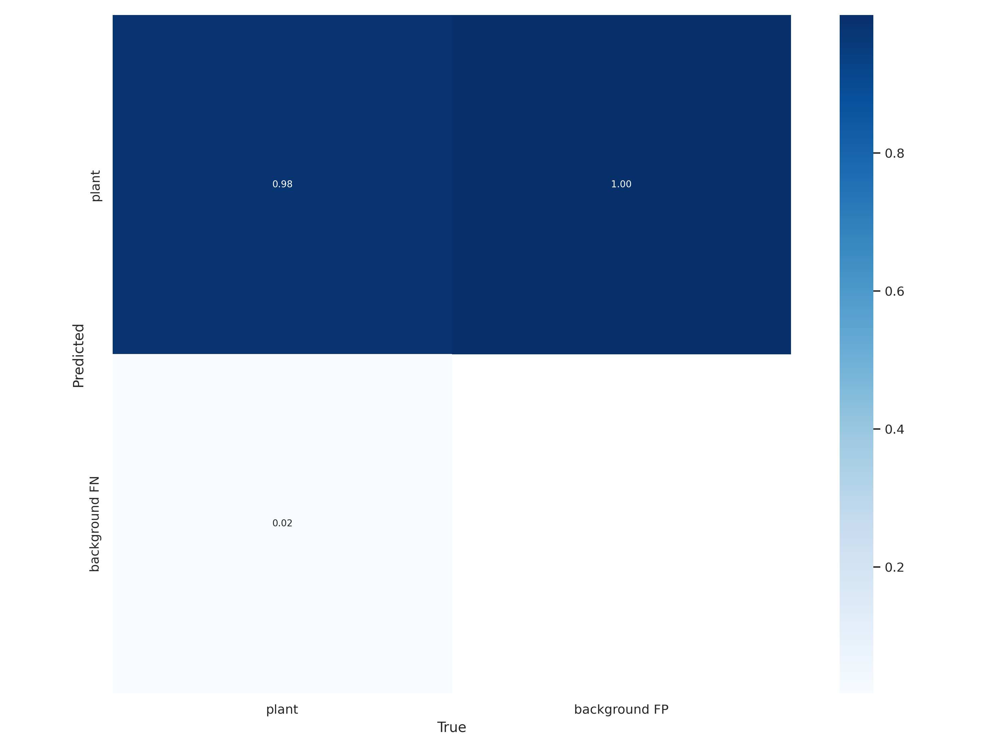

In [ ]:
Image(filename='/content/yolov7/runs/train/plant_result3/confusion_matrix.png', width=900)

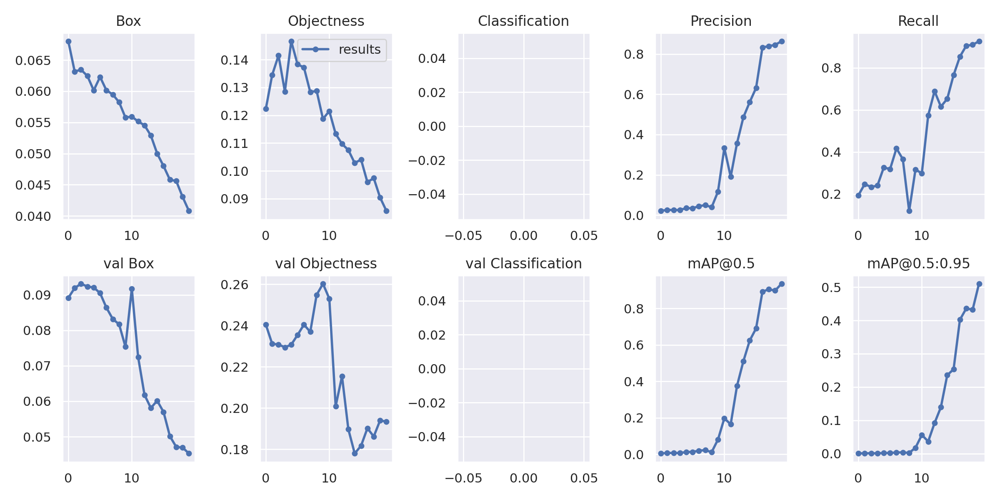

In [ ]:
Image(filename='/content/yolov7/runs/train/plant_result3/results.png', width=900)

Também é possivel plotar as imagens usadas por lote de treinamento:

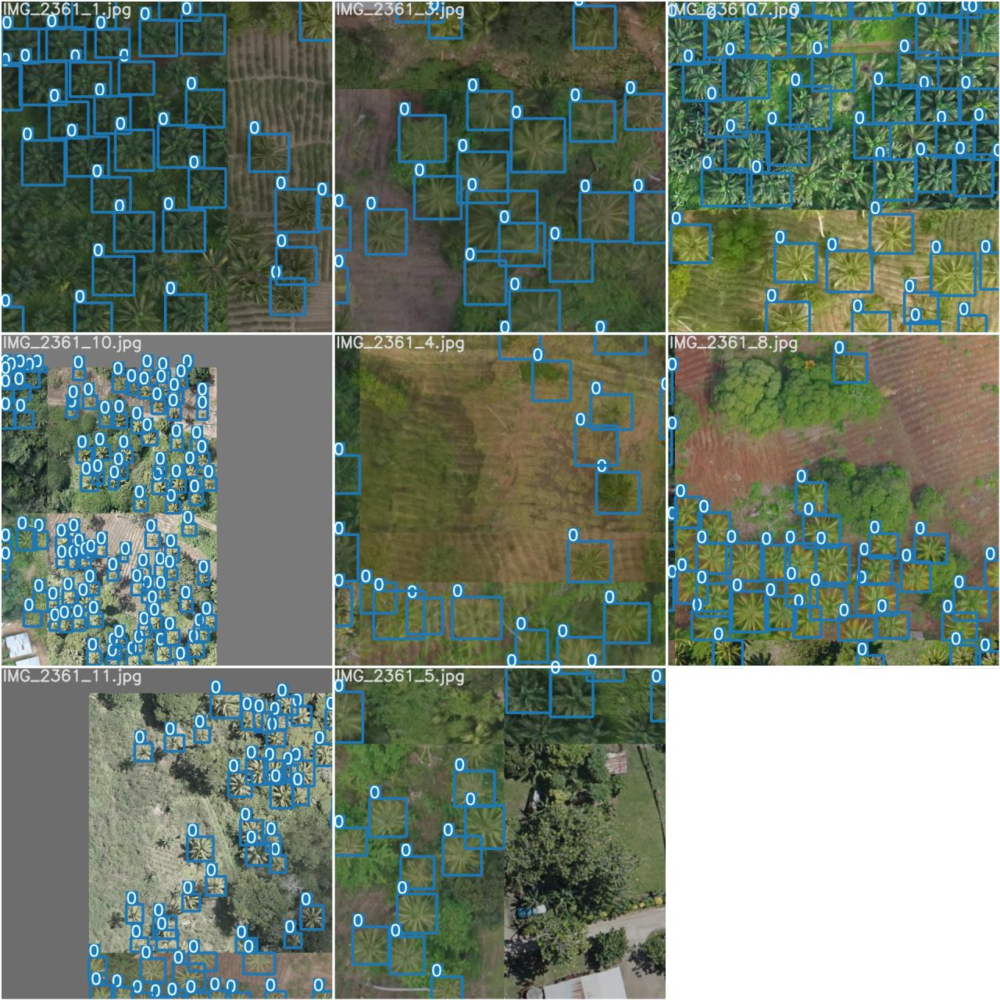

In [ ]:
Image(filename='/content/yolov7/runs/train/plant_result3/train_batch0.jpg', width=900)

Por fim, podemos detectar nosso objeto alvo nas imagens de validação a fim de comparar os reultados e ver como ficaram as predições:

In [ ]:
!python detect.py --weights runs/train/plant_result3/weights/best.pt --device 0 --source /content/validation

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='0', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/validation', update=False, view_img=False, weights=['runs/train/plant_result3/weights/best.pt'])
YOLOR 🚀 v0.1-116-g8c0bf3f torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36481772 parameters, 6194944 gradients, 103.2 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is tra

In [ ]:
print(sorted(os.listdir('/content/yolov7/runs/detect/exp/')))

['IMG_2361_12.jpg', 'IMG_2361_2.jpg', 'IMG_2361_6.jpg', 'IMG_2361_9.jpg', 'IMG_2367_4.jpg', 'IMG_2371_2.jpg', 'IMG_2371_4.jpg', 'IMG_2371_5.jpg', 'IMG_2392_11.jpg', 'IMG_2395_10.jpg', 'IMG_2395_5.jpg', 'IMG_2402_7.jpg', 'tonga_10.jpg', 'tonga_101.jpg', 'tonga_109.jpg', 'tonga_110.jpg', 'tonga_115.jpg', 'tonga_120.jpg', 'tonga_132.jpg', 'tonga_133.jpg', 'tonga_134.jpg', 'tonga_137.jpg', 'tonga_14.jpg', 'tonga_153.jpg', 'tonga_165.jpg', 'tonga_166.jpg', 'tonga_170.jpg', 'tonga_185.jpg', 'tonga_189.jpg', 'tonga_192.jpg', 'tonga_20.jpg', 'tonga_205.jpg', 'tonga_209.jpg', 'tonga_212.jpg', 'tonga_217.jpg', 'tonga_22.jpg', 'tonga_221.jpg', 'tonga_230.jpg', 'tonga_24.jpg', 'tonga_244.jpg', 'tonga_256.jpg', 'tonga_263.jpg', 'tonga_273.jpg', 'tonga_275.jpg', 'tonga_276.jpg', 'tonga_29.jpg', 'tonga_290.jpg', 'tonga_296.jpg', 'tonga_30.jpg', 'tonga_308.jpg', 'tonga_31.jpg', 'tonga_311.jpg', 'tonga_315.jpg', 'tonga_33.jpg', 'tonga_330.jpg', 'tonga_331.jpg', 'tonga_345.jpg', 'tonga_350.jpg', 'tonga_

E assim podemos plotar algumas imagens como exemplo:

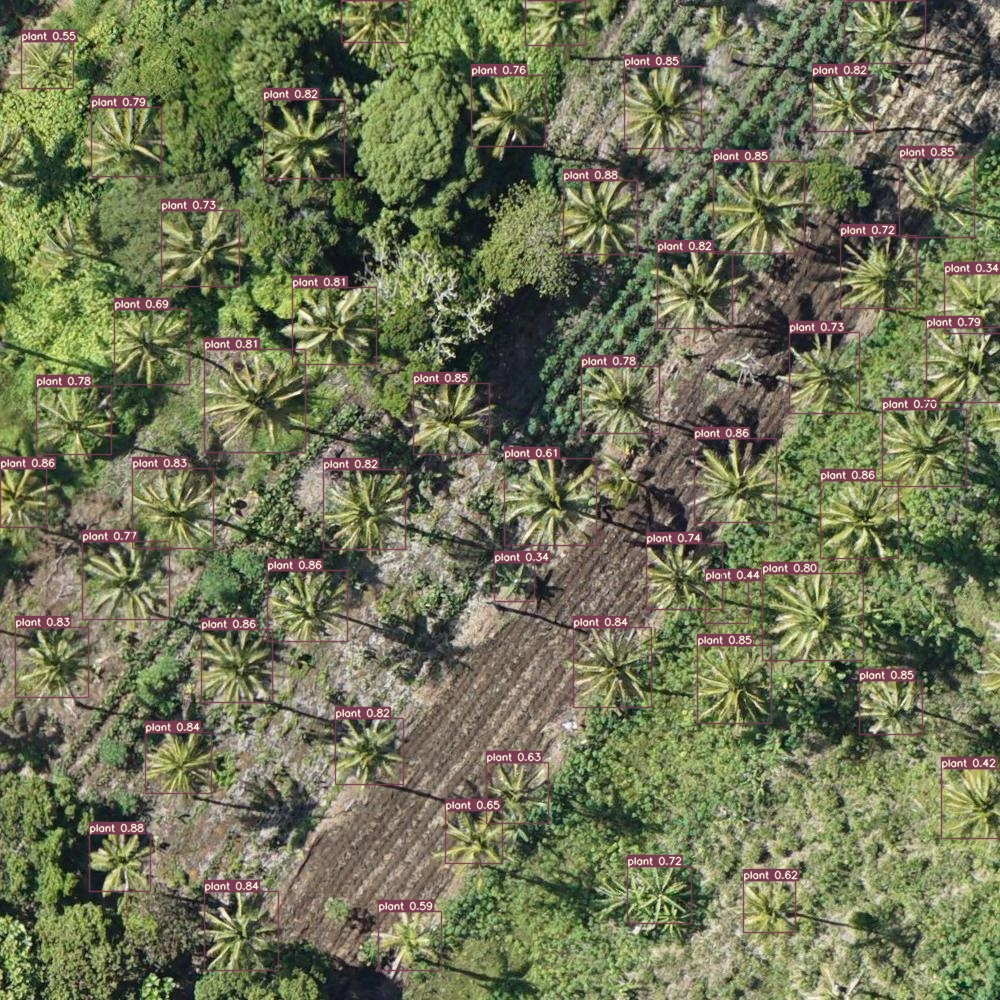

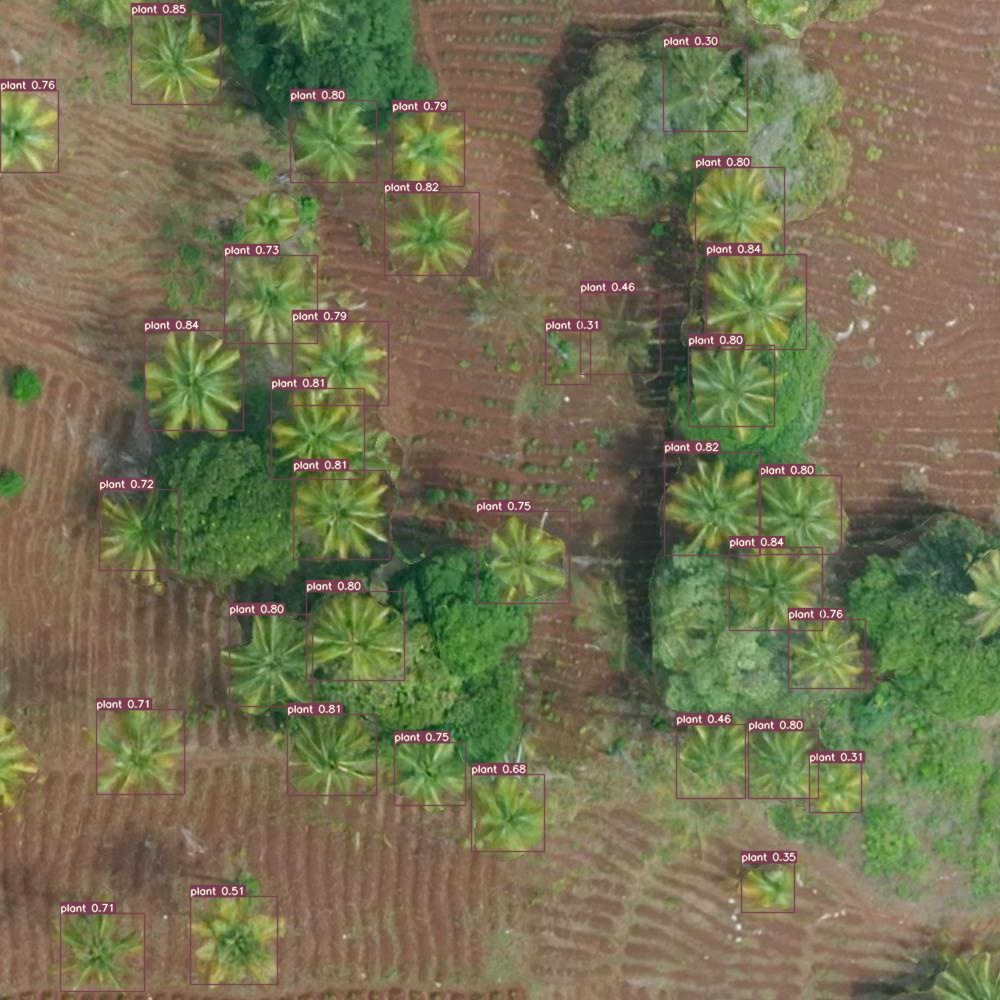

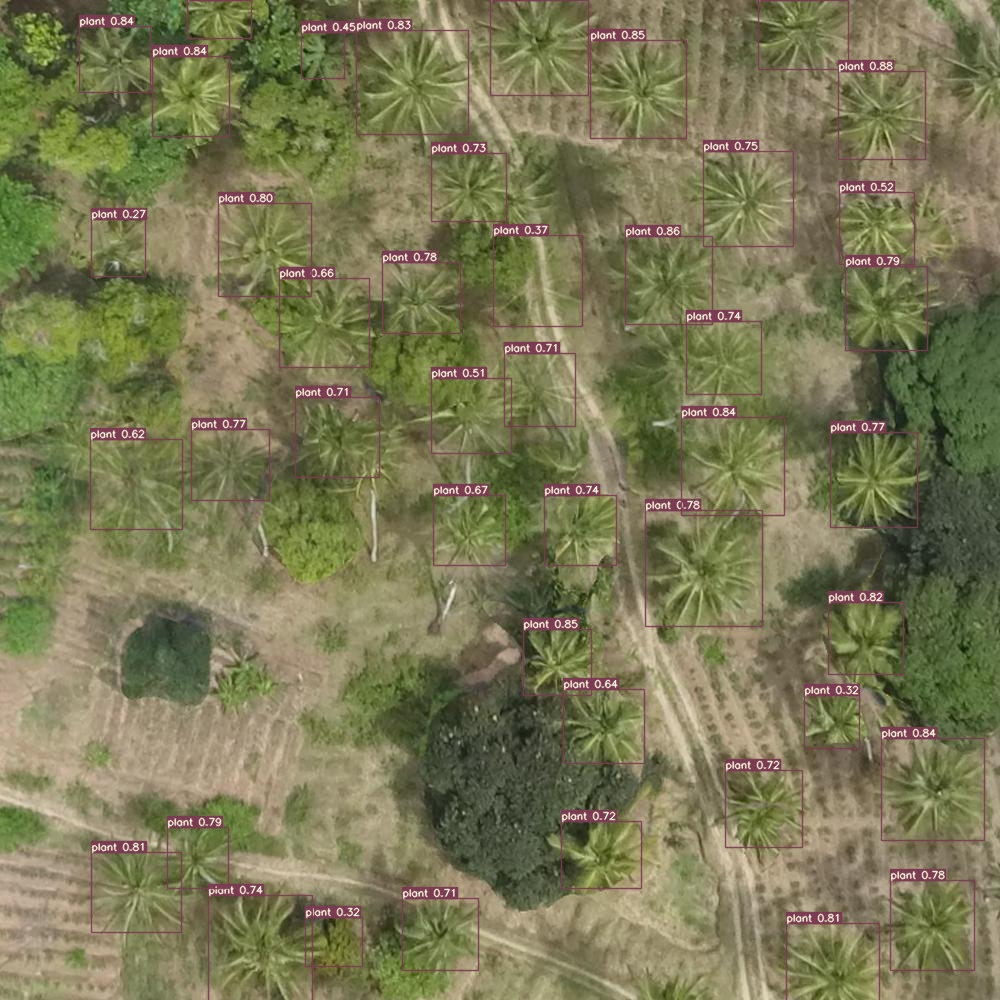

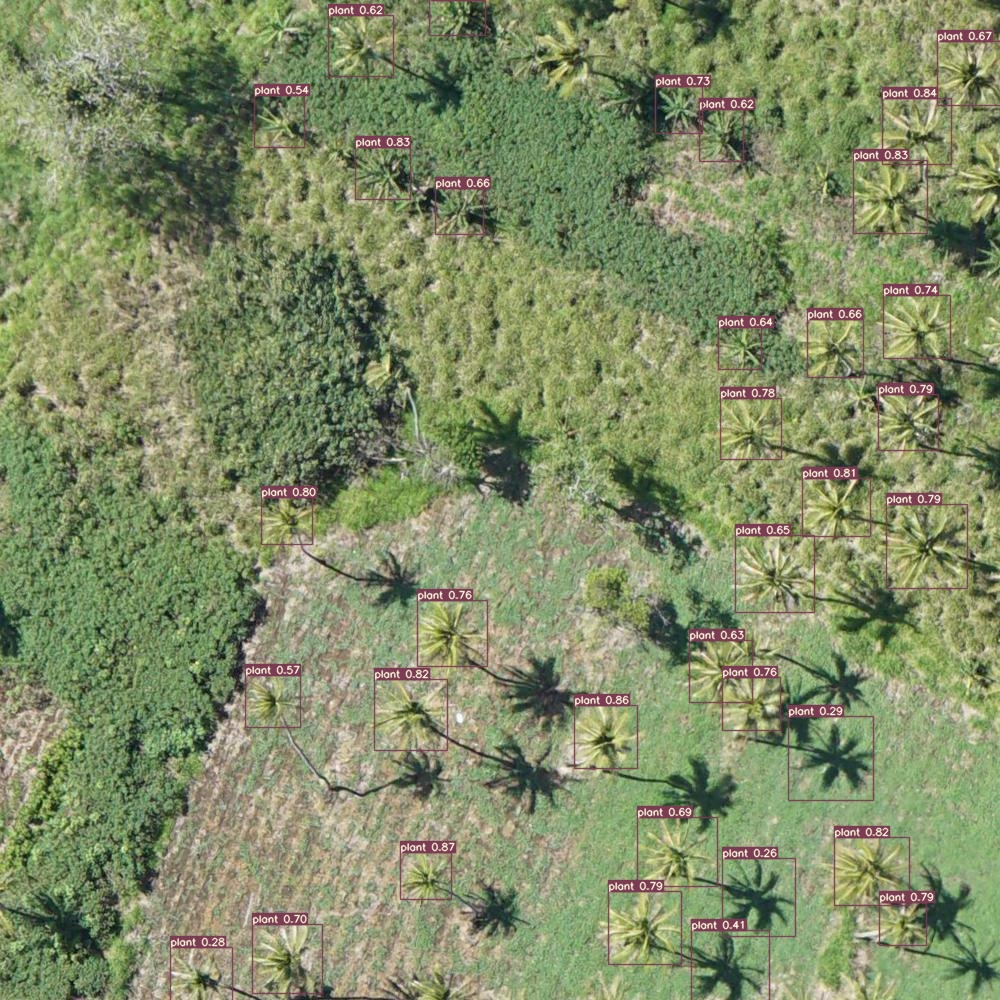

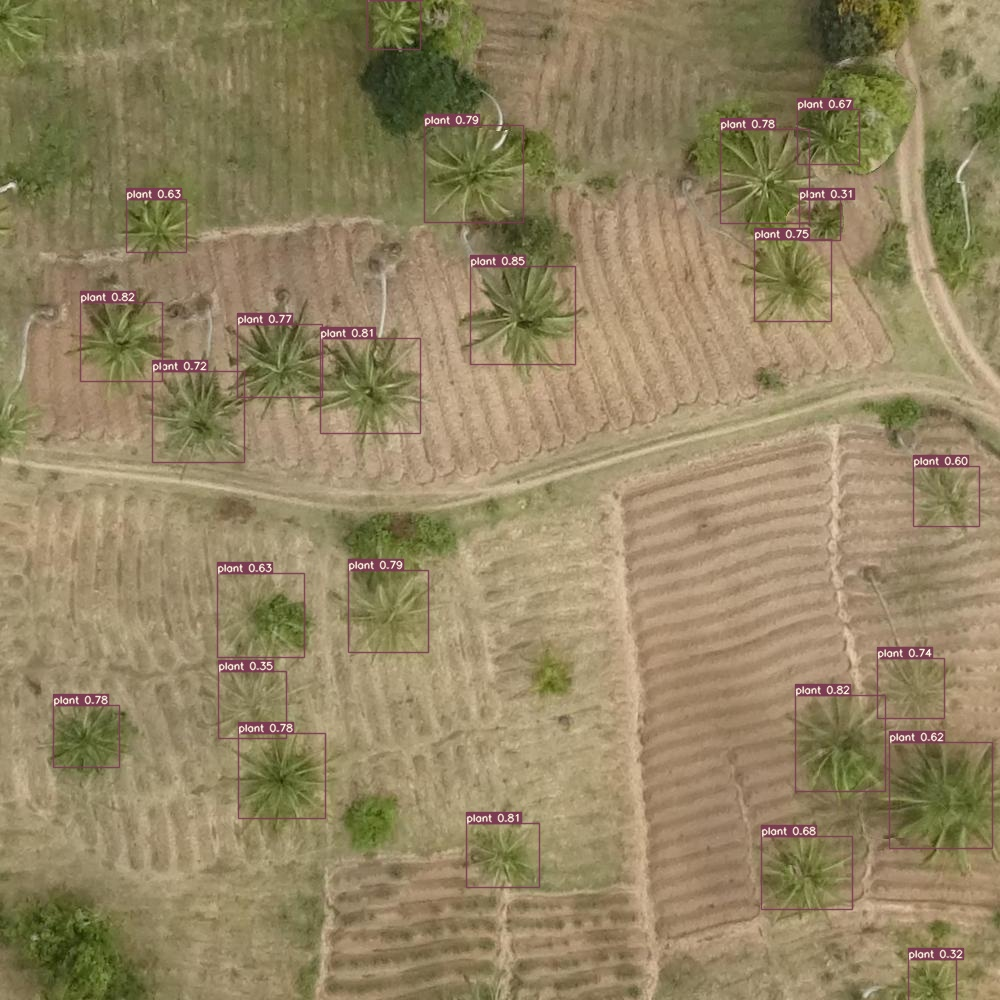

In [ ]:
for images in glob.glob('/content/yolov7/runs/detect/exp/*.jpg')[0:5]:
    display(Image(filename=images))

Agora que temos nosso modelo treinado podemos aplicar a uma imagem completa. Vamos particionar essa imagem, realizar as detecções e depois converter esss detcções para pontos geolocalizados:

Iniciamos setando o caminho da imagem e abrindo ela:

In [ ]:
path_img = '/content/drive/MyDrive/Datasets/Mastertheis/MasterThesis-master/kolovai_rep.tif'

In [ ]:
src_img = rasterio.open(path_img)

In [ ]:
img = src_img.read()

In [ ]:
img.shape

(3, 24459, 18618)

In [ ]:
img = img.transpose([1,2,0])

(-0.5, 18617.5, 24458.5, -0.5)

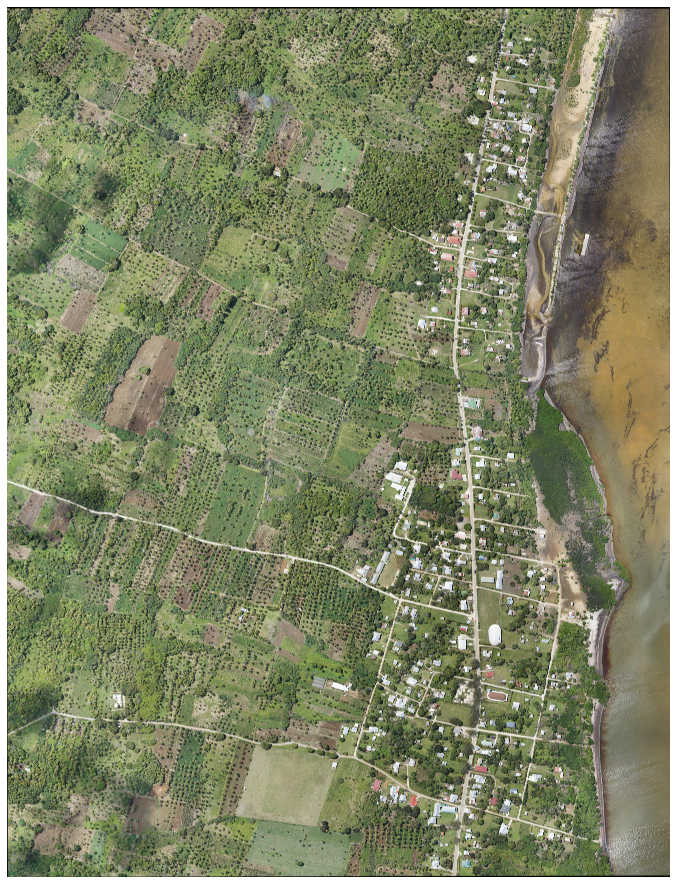

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')

Agora vamos dividir a imagem em tamanhos iguais aos que treinamos:

In [ ]:
if not os.path.isdir('/content/Predict'):
    os.mkdir('/content/Predict')

In [ ]:
qtd = 0
out_meta = src_img.meta.copy()
for n in range((src_img.meta['width']//1000)):
  for m in range((src_img.meta['height']//1000)):
    x = (n*1000)
    y = (m*1000)
    window = Window(x,y,1000,1000)
    win_transform = src_img.window_transform(window)
    arr_win = src_img.read(window=window)
    arr_win = arr_win[0:3,:,:]
    if (arr_win.max() != 0) and (arr_win.shape[1] == 1000) and (arr_win.shape[2] == 1000):
      qtd = qtd + 1
      path_exp = '/content/Predict/img_' + str(qtd) + '.tif'
      out_meta.update({"driver": "GTiff","height": 1000,"width": 1000, "transform":win_transform})
      with rasterio.open(path_exp, 'w', **out_meta) as dst:
          for i, layer in enumerate(arr_win, start=1):
              dst.write_band(i, layer.reshape(-1, layer.shape[-1]))
      del arr_win

In [ ]:
print(qtd)

432


Agora abrimos cada uma das iamgens geradas e salvamos uma cópia em formato .JPG:

In [ ]:
if not os.path.isdir('/content/Predict_jpg'):
    os.mkdir('/content/Predict_jpg')

path_data_pred = '/content/Predict_jpg'
imgs_to_pred = os.listdir('/content/Predict')
for images in imgs_to_pred:
  src = rasterio.open('/content/Predict/' + images)
  raster = src.read()
  raster = raster.transpose([1,2,0])
  raster = raster[:,:,0:3]
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)

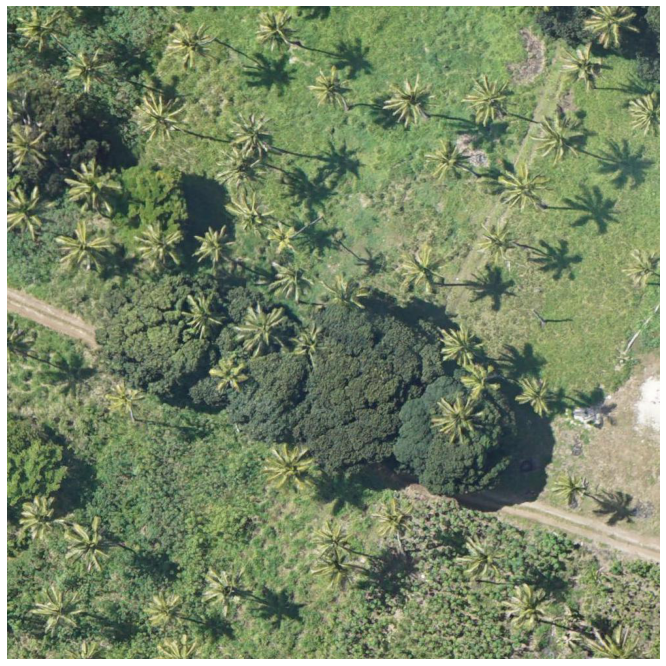

In [ ]:
img = io.imread('/content/Predict_jpg/img_100.jpg')
plt.figure(figsize=(12,12))
plt.imshow(img)
plt.axis('off')
plt.show()

E então aplicamos o predict passando o caminho da pasta de imagens .jpg. O resultado das detecções são arquivos .txt com os boundboxes.

In [ ]:
!python detect.py --weights runs/train/plant_result3/weights/best.pt --device 0 --source /content/Predict_jpg --save-txt --conf 0.45

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.45, device='0', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=True, source='/content/Predict_jpg', update=False, view_img=False, weights=['runs/train/plant_result3/weights/best.pt'])
YOLOR 🚀 v0.1-116-g8c0bf3f torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36481772 parameters, 6194944 gradients, 103.2 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is tra

Alguns resultados:

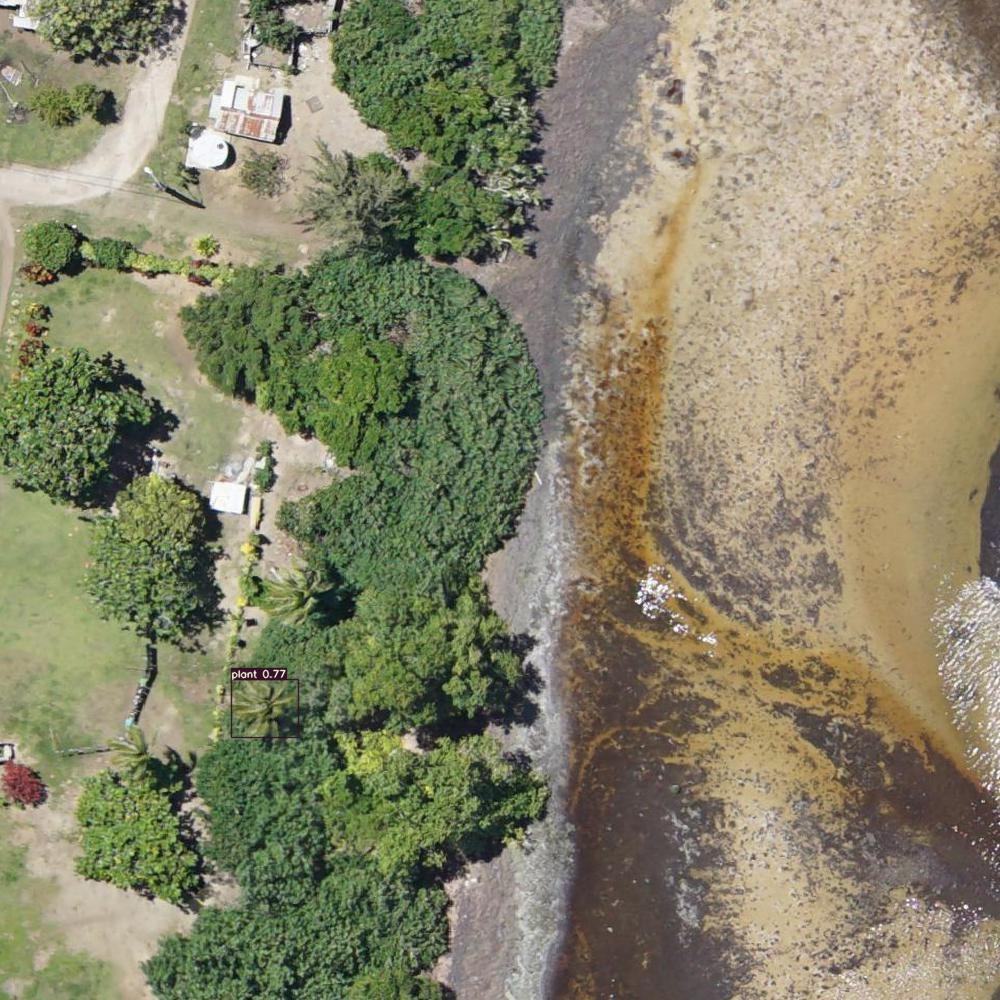

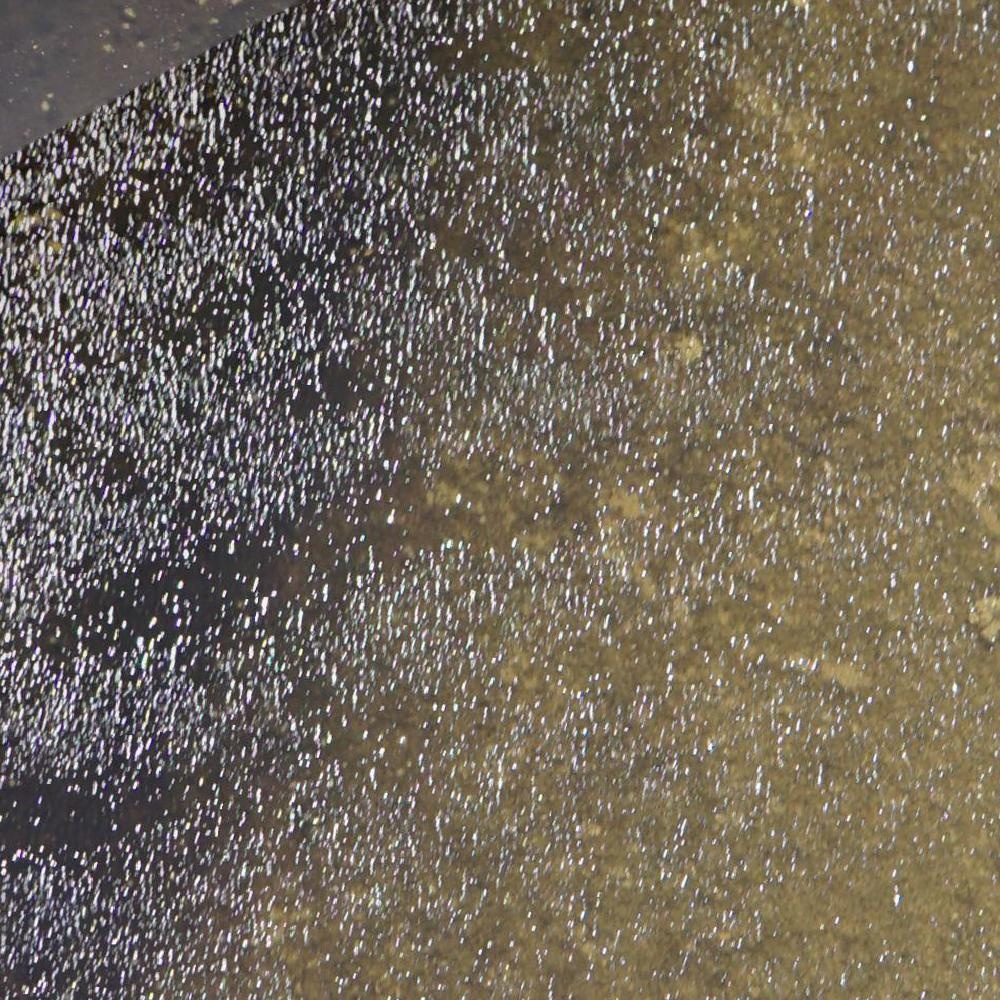

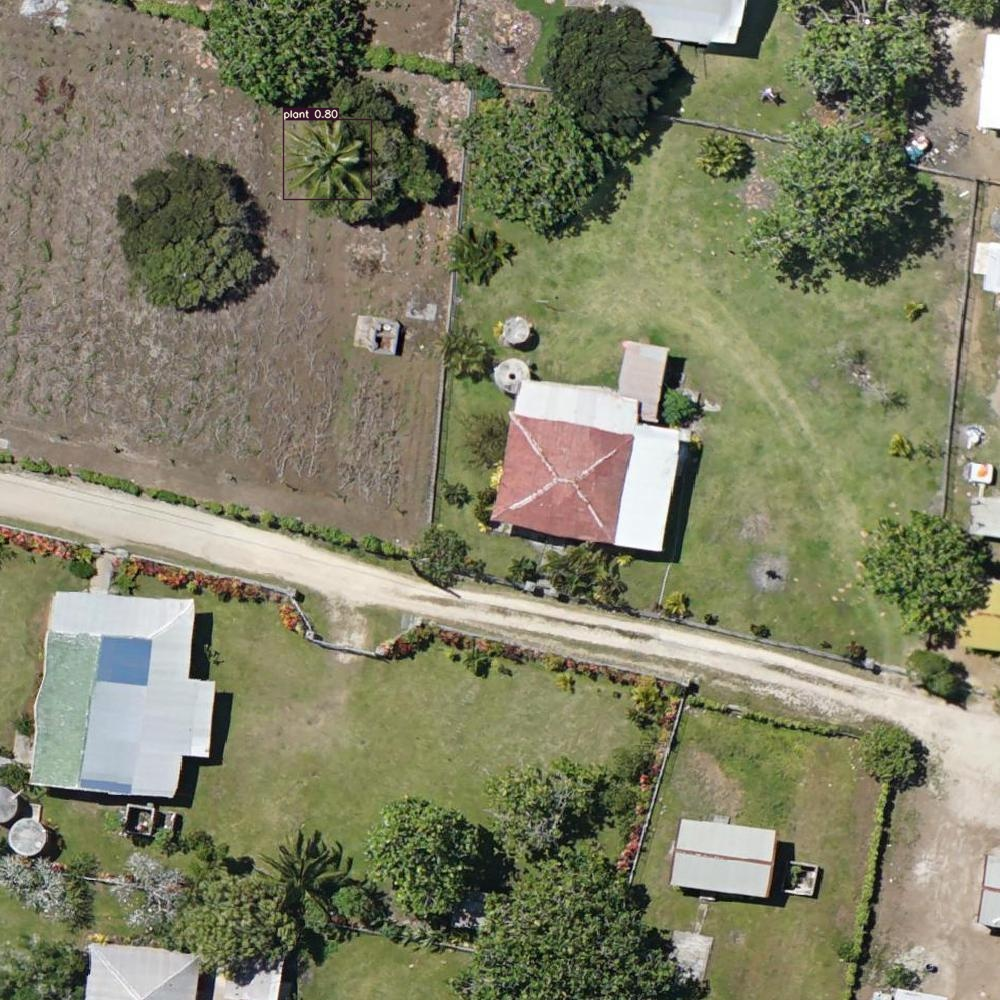

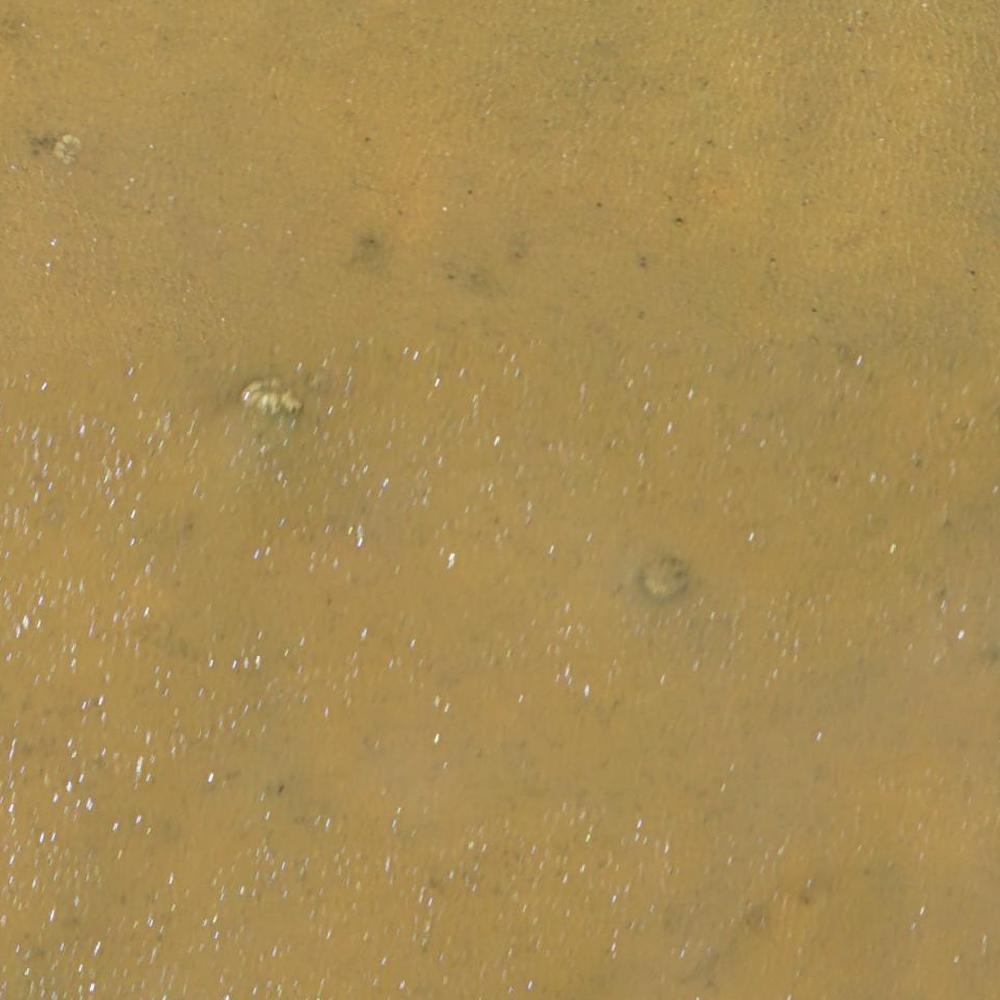

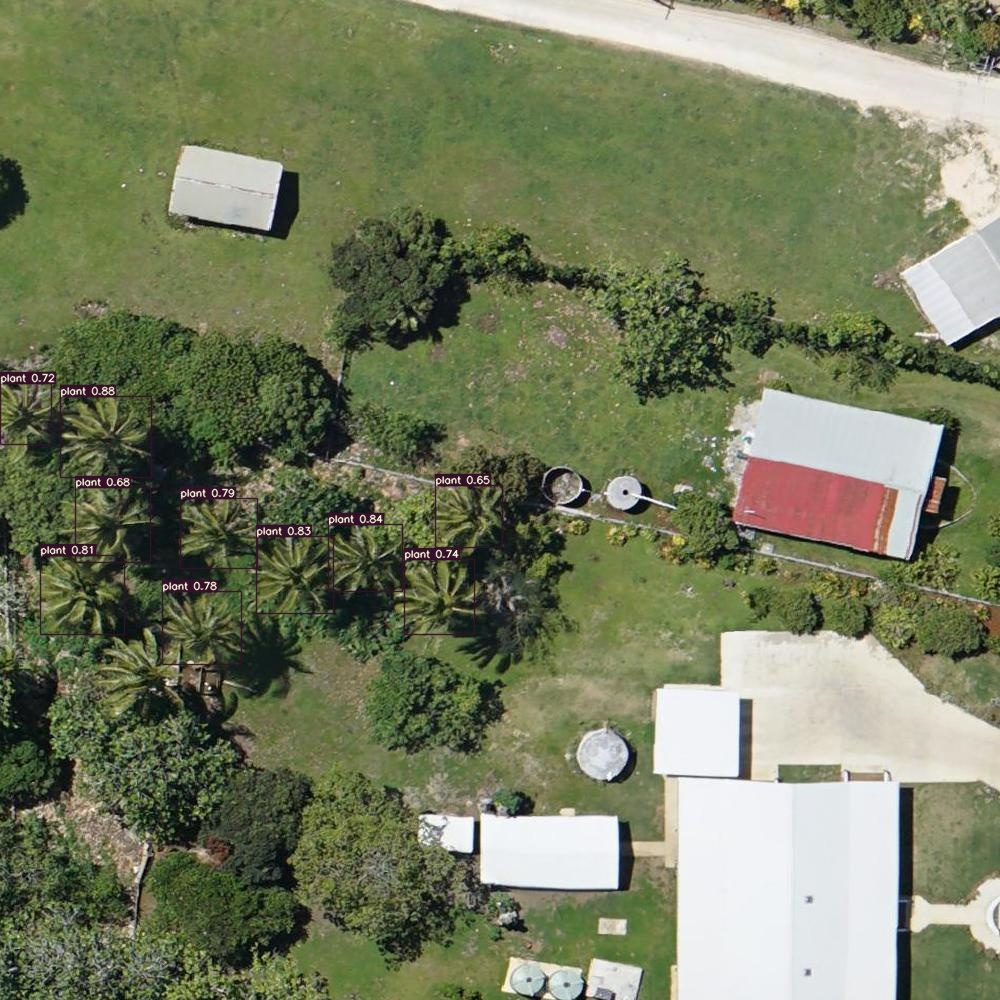

In [ ]:
for images in glob.glob('/content/yolov7/runs/detect/exp5/*.jpg')[0:5]:
    display(Image(filename=images))

Listamos todos os .txt e com a ajuda do rasterio convertemos as posições x e y em valores de latitude e longitude:

In [ ]:
ls_x = []
ls_y = []
imgs_to_pred = [f for f in os.listdir('/content/yolov7/runs/detect/exp5/labels/') if f.endswith('.txt')]
for images in imgs_to_pred:
  filename = images.split('.')[0]
  src = rasterio.open('/content/Predict/' + filename + '.tif')
  path = f'/content/yolov7/runs/detect/exp5/labels/'+filename+'.txt'
  cols = ['class', 'x-center', 'y-center', 'x_extend', 'y_extend']
  df = pd.read_csv(path, sep=" ", header=None)
  df.columns = cols
  df['x-center'] = np.round(df['x-center'] * 1000)
  df['y-center'] = np.round(df['y-center'] * 1000)
  for i,row in df.iterrows():
    xs, ys = rasterio.transform.xy(src.transform, row['y-center'], row['x-center'])
    ls_x.append(xs)
    ls_y.append(ys)

In [ ]:
df_xy = pd.DataFrame([])
df_xy['x'] = ls_x
df_xy['y'] = ls_y

Criamos um geodataframe com os pontos centrais das detecções:

In [ ]:
gdf = gpd.GeoDataFrame(df_xy, geometry=gpd.points_from_xy(df_xy['x'], df_xy['y']))

In [ ]:
src_img.crs

CRS.from_epsg(4326)

In [ ]:
gdf = gdf.set_crs(src_img.crs.to_dict()['init'])

Assim podemos plotar os pontos juntos com a imagem original:

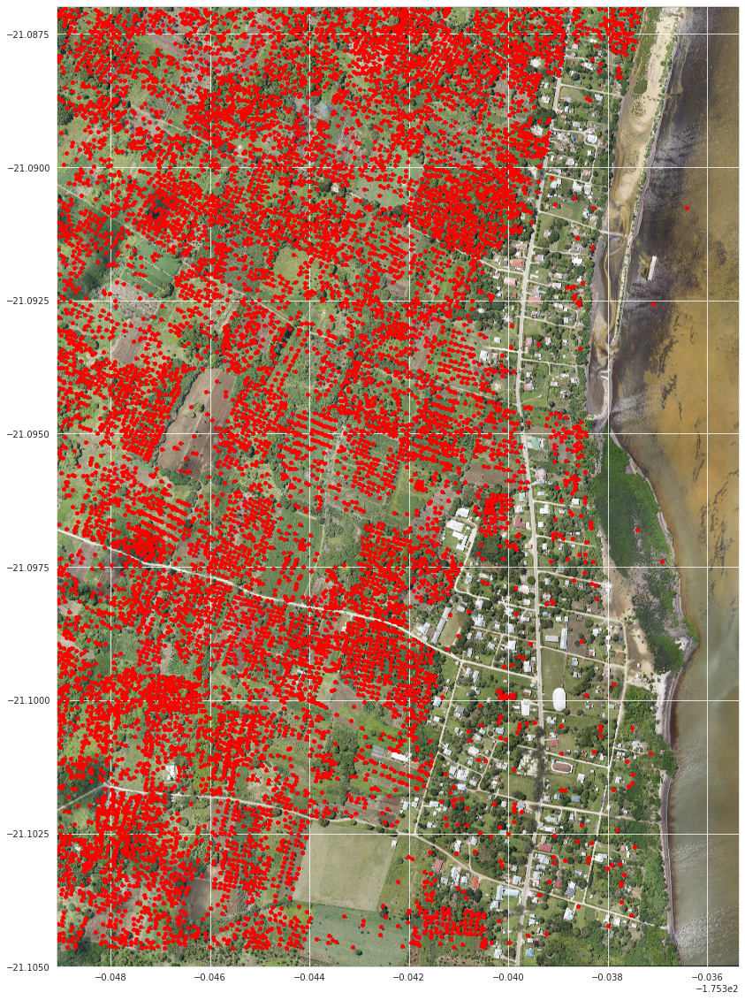

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
show((src_img), ax=ax)
gdf.plot(ax=ax,  marker='o', color='red', markersize=15)

Por fim, podemos salvar esse geodataframe me um arquivo .geojson:

In [ ]:
gdf.to_file('/content/palm_trees.json', driver="GeoJSON")